In [1]:
import warnings
warnings.filterwarnings("ignore")
import os
import pickle
import numpy as np
import pandas as pd
import pickle as pkl
from keras.optimizers import SGD, RMSprop, Adam, Adagrad, Adadelta, Adamax
import matplotlib.pyplot as plt
from keras.callbacks import EarlyStopping
import keras.backend as K
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
import tensorflow as tf 
import Model_Functions as mf
tf.set_random_seed(103)
np.random.seed(103)

%matplotlib inline

'''

'''
import keras.backend as K
cfg = K.tf.ConfigProto()
cfg.gpu_options.allow_growth = True
K.set_session(K.tf.Session(config=cfg))

Using TensorFlow backend.


In [39]:
d = pd.read_csv("YESBANK.BO.csv")['High']
d= d.dropna()
d.head()

0    14.00
1    12.47
2    11.96
3    12.88
4    13.13
Name: High, dtype: float64

In [25]:
data = pd.read_csv("wolfs-sunspot-numbers-1700-1988.csv")["Sunspot 1700-1988"].reset_index(drop=True)
data.head()

0     5.0
1    11.0
2    16.0
3    23.0
4    36.0
Name: Sunspot 1700-1988, dtype: float64

In [20]:
data = pd.read_csv("final5Stocks.csv")['WMT']
data.head()

0    62.430000
1    63.040001
2    63.730000
3    64.580002
4    65.070000
Name: WMT, dtype: float64

In [42]:
# results collection
def results_collect(model_version, dataset_name, callback_min_delta, patience_value, epoch_cnt,optim, timesteps = 21, frac = 0.7, multi = False):
    
    #import data
    if("YES" in dataset_name):
        data = pd.read_csv("YESBANK.BO.csv")['High']
        data = data.dropna()
        print(data.head())
        
    elif("WMT" in dataset_name):
        if (multi == False):
            data = pd.read_csv("final5Stocks.csv")['WMT']
            print(data.head())
        else:
            d = pd.read_csv("WMT.csv")
            d1 =  pd.read_csv("final5Stocks.csv")
            data = pd.merge(d,d1,on = ['Date']).iloc[:,list(range(1,5))]
            print(data.head())
        
    elif("AMZN" in dataset_name):
        if (multi == False):
            data = pd.read_csv("final5Stocks.csv")['AMZN']
        else:
            d = pd.read_csv("AMZN.csv")
            d1 =  pd.read_csv("final5Stocks.csv")
            data = pd.merge(d,d1,on = ['Date']).iloc[:,list(range(1,5))]
            
    elif("FB" in dataset_name):
        if (multi == False):
            data = pd.read_csv("final5Stocks.csv")['FB']
        else:
            d = pd.read_csv("FB.csv")
            d1 =  pd.read_csv("final5Stocks.csv")
            data = pd.merge(d,d1,on = ['Date']).iloc[:,list(range(1,5))]
    
    elif("DNB" in dataset_name):
        if (multi == False):
            data = pd.read_csv("final5Stocks.csv")['DNB']
        else:
            d = pd.read_csv("DNB.csv")
            d1 =  pd.read_csv("final5Stocks.csv")
            data = pd.merge(d,d1,on = ['Date']).iloc[:,list(range(1,5))]
    
    elif("PFE" in dataset_name):
        if (multi == False):
            data = pd.read_csv("final5Stocks.csv")['PFE']
        else:
            d = pd.read_csv("PFE.csv")
            d1 =  pd.read_csv("final5Stocks.csv")
            data = pd.merge(d,d1,on = ['Date']).iloc[:,list(range(1,5))]
    
    elif("Exchange" in dataset_name):
        data = pd.read_csv('exchange_rate.txt',sep=',',dtype=np.float32, header=None)
        data.columns = ['Australia','British','Canada','Switzerland','China','Japan','New Zealand','Singapore']
        data = data['Australia'].reset_index(drop=True)
    
    elif("Traffic" in dataset_name):
        data = pd.read_csv('traffic.txt',sep=',',dtype=np.float32, header=None)[1][1000:5000]
        data = (data-data.min())*(100)/(data.max()-data.min())
        data = data[data<=data.mean()+5]
        
    elif("Jena" in dataset_name):
        data = pd.read_csv("Jena_time_series_day_wise.csv")['T (degC)'].reset_index(drop=True)
    
    elif("Lynx" in dataset_name):
        data = pd.read_csv("lynx.csv")['value'].reset_index(drop=True)
        mx, mn = data.max(), data.min()
        
    elif("Sunspot" in dataset_name):
        data = pd.read_csv("monthly-sunspot-number-zurich-17.csv")['Monthly sunspot number, Zurich, 1749-1983'].dropna().reset_index(drop=True)
    
    elif("PM2.5" in dataset_name):
        data = pd.read_csv("PRSA_data_2010.1.1-2014.12.31.csv")['pm2.5'].dropna().reset_index(drop=True)
        
    elif("GlobalLandTemp" in dataset_name):
        if (multi == False):
            data = pd.read_csv("GlobalLandTemperatures_GlobalTemperatures.csv")['LandAverageTemperature'].dropna().reset_index(drop=True)
        else:
            data = pd.read_csv("GlobalLandTemperatures_GlobalTemperatures.csv").dropna().reset_index(drop=True)
            data = pd.concat([data.iloc[:,2:],data.iloc[:,1]],axis=1).dropna().reset_index(drop=True)
            
    elif("Wolfer" in dataset_name):
        data = pd.read_csv("wolfs-sunspot-numbers-1700-1988.csv")["Sunspot 1700-1988"].reset_index(drop=True)

    # format data for feeding to the model
    time_steps = timesteps
    if (multi == False):
        num_features = 0
    else:
        num_features = data.shape[1] - 1
        
    past,fut,y = mf.create_formatted_data(data, time_steps, num_features)
    
#     past = (past-mn)/(mx-mn)
#     fut = (fut-mn)/(mx-mn)
    past_train, past_test, fut_train, fut_test, y_train, y_test = mf.train_test_split(past,fut,y,data,frac)
    print ("Dimensions of train and test : ",(past_train.shape) , " ", (past_test.shape)," ",(y_train.shape)," ",(y_test.shape))

    # create the model according to the variant of choice
    #Also pass the optimizer as an object.

    model = mf.model_creation(past.shape[1:], fut.shape[1:], model_version, optim)
    
    callbacks = [EarlyStopping(monitor='loss',
                              min_delta=callback_min_delta,
                              patience=patience_value,
                              verbose=0, mode='auto')]
    history_callback = model.fit([past_train, fut_train], y_train, epochs=epoch_cnt, batch_size=32, validation_data=([past_test,fut_test], y_test),callbacks = callbacks)
    
    
    # create directory to save results
    if (multi == False):
        string = "Univariate_Results"
    else:
        string = "Multivariate_Results"
    try:
        os.mkdir(os.path.join(string,dataset_name))
    except:
        pass
    path = os.path.join(string,dataset_name,model_version)
    
    # Plot the model predictions without optimizer
    pred = model.predict([past_test, fut_test], batch_size=32)
    pred = np.array(pred).reshape((-1,))
    test = y_test.reshape((-1,))

    print ("Plot, without Optimizer.")
    fig = plt.figure(figsize=(10,7))
    ax = fig.add_subplot(111)
    ax.set_title("MAE %.5f \n R2 %.5f \n MAPE %.5f \n RMSE %.5f \n RSE %.5f \n CORR : %0.5f"%(mean_absolute_error(test,pred), r2_score(test,pred), np.mean(np.abs(test-pred)/test), np.sqrt(mean_squared_error(test,pred)), np.sqrt(np.sum(np.square(test-pred)))/np.sqrt(np.sum(test-np.mean(test))), np.corrcoef(test,pred)[0,1]))
    ax.plot(test, color='r', label='ground truth')
    ax.plot(pred, color='b', label='model predictions')
    ax.legend()
    plt.show()
    fig.savefig(path+'_before_opt.png')
    
    # optimizer training
    fut_train1 = np.zeros_like(fut_train)
    pred = model.predict([past_train, fut_train1], batch_size=32)
    pd.DataFrame(np.concatenate((y_train.reshape(-1,1),pred.reshape(-1,1)),axis=1),columns=['Ground truth','Model Predictions']).to_csv(path+"_training_data.csv",sep=',',index=False)
    lin_model = mf.linear_regression(pred, y_train)
    pred1 = model.predict([past_test, fut_test])
    pred = lin_model.predict(pred1)
    pred = np.array(pred).reshape((-1,))
    test = y_test.reshape((-1,))
    print(lin_model.coef_, lin_model.intercept_)
    
    # plot the model predictions with optimizer
    print ("\n\n\n")
    print ("Plot, with Optimizer.")
    print(pred.shape, test.shape)
    fig = plt.figure(figsize=(10,7))
    ax = fig.add_subplot(111)
    ax.set_title("MAE : %.5f \n R2 : %.5f \n MAPE : %.5f \n RMSE : %.5f \n (MSE/Mean)*100 : %.5f \n RSE : %0.5f \n CORR : %0.5f"%(mean_absolute_error(test,pred), r2_score(test,pred), np.mean(np.abs(test-pred)/test), np.sqrt(mean_squared_error(test,pred)), (np.sqrt(mean_squared_error(test,pred)) * 1.0 / np.mean(test))*100.0, np.sqrt(np.sum(np.square(test-pred))/np.sum(test-np.mean(test))), np.corrcoef(test,pred)[0,1]))
    ax.plot(test, color='r', label='ground truth')
    ax.plot(pred, color='b', label='model predictions')
    plt.legend()
    plt.show()
    fig.savefig(path+'_after_opt.png')
    
    # collect the results of the model variant
    model_pred = model.predict([past_test,fut_test], batch_size=32).reshape((-1,1))
    linear_pred = lin_model.predict(model_pred).reshape((-1,1))
    ground_true = test.reshape((-1,1))
    results = pd.DataFrame(np.concatenate((ground_true,model_pred,linear_pred),axis=1),columns=['Ground truth', 'Model Predictions','Linear Reg'])
    
    # collect the per epoch loss and metrics
    history = {}
    for key in (history_callback.history.keys()):
        history[str(key)] = history_callback.history[str(key)]

    # save the model training and training details
    results.to_csv(path+".csv",sep=',',index=False)
    pkl.dump(history,open(path+'.pkl','wb'))
    print("Done saving the results")
    
    #del model
    #K.clear_session()
    
    return model,[mean_absolute_error(test,pred) , r2_score(test,pred), np.sqrt(mean_squared_error(test,pred)), (np.sqrt(mean_squared_error(test,pred)) * 1.0 / np.mean(test))*100.0] 

# Results Collection

# Stocks

## Univariate

### M1V1

0    14.00
1    12.47
2    11.96
3    12.88
4    13.13
Name: High, dtype: float64
Create formatted data : (df shape) (3361,)
Create time-stepped data : (d shape) (3340, 21, 1)
Create formatted data :  (3340, 10, 1) (3340, 10, 1) (3340,)
Dimensions of train and test :  (2338, 10, 1)   (1002, 10, 1)   (2338,)   (1002,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_34 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_65 (Conv1D)              (None, 6, 32)        192         

Epoch 10/500
2338/2338 [==============================] - 1s 496us/step - loss: 1.7113 - mean_absolute_error: 2.1322 - mean_squared_error: 22.7370 - rmse: 3.1678 - val_loss: 121.1482 - val_mean_absolute_error: 121.6482 - val_mean_squared_error: 16293.4421 - val_rmse: 122.0437
Epoch 11/500
2338/2338 [==============================] - 1s 493us/step - loss: 2.2240 - mean_absolute_error: 2.6688 - mean_squared_error: 26.3581 - rmse: 3.7631 - val_loss: 137.6328 - val_mean_absolute_error: 138.1328 - val_mean_squared_error: 20992.5471 - val_rmse: 138.5200
Epoch 12/500
2338/2338 [==============================] - 1s 495us/step - loss: 1.6091 - mean_absolute_error: 2.0357 - mean_squared_error: 20.4197 - rmse: 2.9645 - val_loss: 126.8098 - val_mean_absolute_error: 127.3098 - val_mean_squared_error: 17834.6162 - val_rmse: 127.6802
Epoch 13/500
2338/2338 [==============================] - 1s 492us/step - loss: 1.4017 - mean_absolute_error: 1.8249 - mean_squared_error: 19.2441 - rmse: 2.8074 - val_l

Epoch 40/500
2338/2338 [==============================] - 1s 497us/step - loss: 0.8071 - mean_absolute_error: 1.1810 - mean_squared_error: 16.2216 - rmse: 2.0325 - val_loss: 137.1606 - val_mean_absolute_error: 137.6606 - val_mean_squared_error: 20826.0332 - val_rmse: 137.9698
Epoch 41/500
2338/2338 [==============================] - 1s 495us/step - loss: 0.6864 - mean_absolute_error: 1.0499 - mean_squared_error: 15.4277 - rmse: 1.8411 - val_loss: 139.3940 - val_mean_absolute_error: 139.8940 - val_mean_squared_error: 21512.7481 - val_rmse: 140.2315
Epoch 42/500
2338/2338 [==============================] - 1s 493us/step - loss: 0.7715 - mean_absolute_error: 1.1506 - mean_squared_error: 15.6661 - rmse: 1.9364 - val_loss: 124.4013 - val_mean_absolute_error: 124.9013 - val_mean_squared_error: 17145.4541 - val_rmse: 125.1895
Epoch 43/500
2338/2338 [==============================] - 1s 490us/step - loss: 1.8899 - mean_absolute_error: 2.3273 - mean_squared_error: 22.8740 - rmse: 3.2077 - val_l

Epoch 70/500
2338/2338 [==============================] - 1s 494us/step - loss: 0.8857 - mean_absolute_error: 1.2657 - mean_squared_error: 16.2435 - rmse: 2.0545 - val_loss: 125.3828 - val_mean_absolute_error: 125.8828 - val_mean_squared_error: 17412.1627 - val_rmse: 126.1533
Epoch 71/500
2338/2338 [==============================] - 1s 498us/step - loss: 0.6537 - mean_absolute_error: 1.0070 - mean_squared_error: 15.3856 - rmse: 1.7660 - val_loss: 131.0201 - val_mean_absolute_error: 131.5201 - val_mean_squared_error: 19006.4860 - val_rmse: 131.7958
Epoch 72/500
2338/2338 [==============================] - 1s 501us/step - loss: 0.7595 - mean_absolute_error: 1.1322 - mean_squared_error: 15.6271 - rmse: 1.9059 - val_loss: 127.0956 - val_mean_absolute_error: 127.5956 - val_mean_squared_error: 17892.3918 - val_rmse: 127.8766
Epoch 73/500
2338/2338 [==============================] - 1s 490us/step - loss: 0.5941 - mean_absolute_error: 0.9404 - mean_squared_error: 14.9880 - rmse: 1.7138 - val_l

Epoch 100/500
2338/2338 [==============================] - 1s 500us/step - loss: 0.7045 - mean_absolute_error: 1.0708 - mean_squared_error: 15.2668 - rmse: 1.8352 - val_loss: 118.6467 - val_mean_absolute_error: 119.1467 - val_mean_squared_error: 15598.5241 - val_rmse: 119.4095
Epoch 101/500
2338/2338 [==============================] - 1s 495us/step - loss: 1.0204 - mean_absolute_error: 1.4143 - mean_squared_error: 16.7490 - rmse: 2.2302 - val_loss: 124.7178 - val_mean_absolute_error: 125.2178 - val_mean_squared_error: 17232.7982 - val_rmse: 125.4980
Epoch 102/500
2338/2338 [==============================] - 1s 493us/step - loss: 0.8960 - mean_absolute_error: 1.2794 - mean_squared_error: 16.4496 - rmse: 2.1133 - val_loss: 136.7685 - val_mean_absolute_error: 137.2685 - val_mean_squared_error: 20700.8363 - val_rmse: 137.5436
Epoch 103/500
2338/2338 [==============================] - 1s 499us/step - loss: 0.9696 - mean_absolute_error: 1.3588 - mean_squared_error: 16.9423 - rmse: 2.1734 - v

2338/2338 [==============================] - 1s 498us/step - loss: 0.9007 - mean_absolute_error: 1.2843 - mean_squared_error: 16.2264 - rmse: 2.1054 - val_loss: 119.2363 - val_mean_absolute_error: 119.7363 - val_mean_squared_error: 15768.8298 - val_rmse: 120.0118
Epoch 130/500
2338/2338 [==============================] - 1s 497us/step - loss: 0.9815 - mean_absolute_error: 1.3757 - mean_squared_error: 16.4010 - rmse: 2.1468 - val_loss: 126.2126 - val_mean_absolute_error: 126.7126 - val_mean_squared_error: 17651.4647 - val_rmse: 126.9905
Epoch 131/500
2338/2338 [==============================] - 1s 493us/step - loss: 0.6722 - mean_absolute_error: 1.0365 - mean_squared_error: 15.1825 - rmse: 1.8055 - val_loss: 129.8073 - val_mean_absolute_error: 130.3073 - val_mean_squared_error: 18667.3047 - val_rmse: 130.5763
Epoch 132/500
2338/2338 [==============================] - 1s 499us/step - loss: 0.7111 - mean_absolute_error: 1.0735 - mean_squared_error: 15.4558 - rmse: 1.8511 - val_loss: 126.2

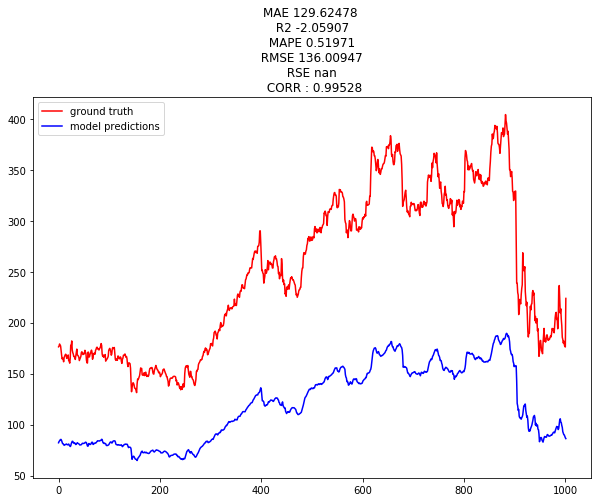

MAE 2.1929
R2 0.9845
RMSE 3.1029
[2.0394135] 0.2218399




Plot, with Optimizer.
(1002,) (1002,)


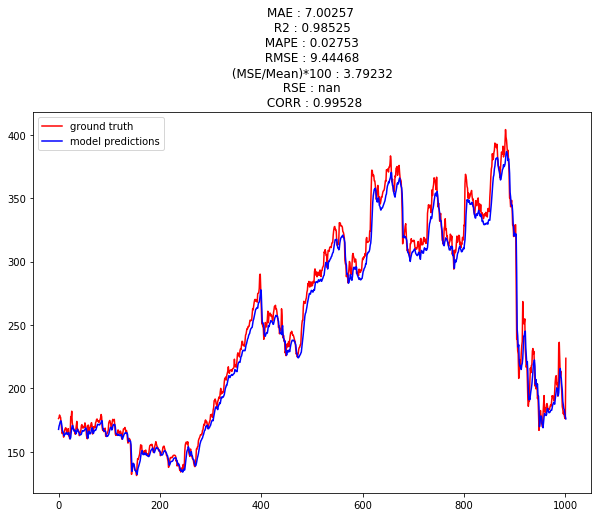

Done saving the results


In [47]:
model = results_collect(model_version="M1V1",dataset_name="YES",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

In [ ]:
model.predict

0    14.00
1    12.47
2    11.96
3    12.88
4    13.13
Name: High, dtype: float64
Create formatted data : (df shape) (3361,)
Create time-stepped data : (d shape) (3340, 21, 1)
Create formatted data :  (3340, 10, 1) (3340, 10, 1) (3340,)
Dimensions of train and test :  (3329, 10, 1)   (11, 10, 1)   (3329,)   (11,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_39 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_40 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_73 (Conv1D)              (None, 6, 32)        192         inpu

Epoch 10/500
3329/3329 [==============================] - 1s 437us/step - loss: 3.2307 - mean_absolute_error: 3.6687 - mean_squared_error: 46.4335 - rmse: 5.8024 - val_loss: 88.4880 - val_mean_absolute_error: 88.9880 - val_mean_squared_error: 8131.6235 - val_rmse: 90.1755
Epoch 11/500
3329/3329 [==============================] - 1s 435us/step - loss: 2.7407 - mean_absolute_error: 3.1719 - mean_squared_error: 36.9895 - rmse: 5.0910 - val_loss: 84.0457 - val_mean_absolute_error: 84.5457 - val_mean_squared_error: 7338.7661 - val_rmse: 85.6666
Epoch 12/500
3329/3329 [==============================] - 1s 433us/step - loss: 2.9348 - mean_absolute_error: 3.3694 - mean_squared_error: 39.5827 - rmse: 5.2837 - val_loss: 100.0962 - val_mean_absolute_error: 100.5962 - val_mean_squared_error: 10312.9365 - val_rmse: 101.5526
Epoch 13/500
3329/3329 [==============================] - 1s 440us/step - loss: 4.9082 - mean_absolute_error: 5.3641 - mean_squared_error: 80.6383 - rmse: 7.8456 - val_loss: 81.

Epoch 40/500
3329/3329 [==============================] - 1s 432us/step - loss: 2.5999 - mean_absolute_error: 3.0176 - mean_squared_error: 43.0936 - rmse: 4.5858 - val_loss: 97.8427 - val_mean_absolute_error: 98.3427 - val_mean_squared_error: 9858.2393 - val_rmse: 99.2887
Epoch 41/500
3329/3329 [==============================] - 1s 437us/step - loss: 2.1422 - mean_absolute_error: 2.5590 - mean_squared_error: 26.4015 - rmse: 4.0579 - val_loss: 102.9943 - val_mean_absolute_error: 103.4943 - val_mean_squared_error: 10903.8818 - val_rmse: 104.4217
Epoch 42/500
3329/3329 [==============================] - 1s 437us/step - loss: 2.1632 - mean_absolute_error: 2.5808 - mean_squared_error: 27.0061 - rmse: 4.0547 - val_loss: 96.3040 - val_mean_absolute_error: 96.8040 - val_mean_squared_error: 9563.9111 - val_rmse: 97.7952
Epoch 43/500
3329/3329 [==============================] - 1s 436us/step - loss: 3.0254 - mean_absolute_error: 3.4517 - mean_squared_error: 44.2420 - rmse: 5.1762 - val_loss: 100

Epoch 70/500
3329/3329 [==============================] - 1s 436us/step - loss: 1.4957 - mean_absolute_error: 1.8975 - mean_squared_error: 18.4400 - rmse: 3.1601 - val_loss: 97.3101 - val_mean_absolute_error: 97.8101 - val_mean_squared_error: 9761.9180 - val_rmse: 98.8024
Epoch 71/500
3329/3329 [==============================] - 1s 437us/step - loss: 1.4980 - mean_absolute_error: 1.8932 - mean_squared_error: 18.6863 - rmse: 3.1637 - val_loss: 97.5765 - val_mean_absolute_error: 98.0765 - val_mean_squared_error: 9814.8340 - val_rmse: 99.0698
Epoch 72/500
3329/3329 [==============================] - 1s 435us/step - loss: 2.2276 - mean_absolute_error: 2.6416 - mean_squared_error: 30.1799 - rmse: 4.1357 - val_loss: 94.6769 - val_mean_absolute_error: 95.1769 - val_mean_squared_error: 9246.6572 - val_rmse: 96.1595
Epoch 73/500
3329/3329 [==============================] - 1s 434us/step - loss: 2.3919 - mean_absolute_error: 2.8168 - mean_squared_error: 29.5154 - rmse: 4.4109 - val_loss: 97.6742

Epoch 100/500
3329/3329 [==============================] - 1s 434us/step - loss: 1.3250 - mean_absolute_error: 1.7144 - mean_squared_error: 16.7022 - rmse: 2.9030 - val_loss: 93.3168 - val_mean_absolute_error: 93.8168 - val_mean_squared_error: 8988.1904 - val_rmse: 94.8061
Epoch 101/500
3329/3329 [==============================] - 1s 435us/step - loss: 1.7938 - mean_absolute_error: 2.1971 - mean_squared_error: 22.1185 - rmse: 3.5807 - val_loss: 96.7940 - val_mean_absolute_error: 97.2940 - val_mean_squared_error: 9654.3213 - val_rmse: 98.2564
Epoch 102/500
3329/3329 [==============================] - 1s 434us/step - loss: 1.8488 - mean_absolute_error: 2.2576 - mean_squared_error: 22.7353 - rmse: 3.6520 - val_loss: 98.0453 - val_mean_absolute_error: 98.5453 - val_mean_squared_error: 9897.0283 - val_rmse: 99.4838
Epoch 103/500
3329/3329 [==============================] - 1s 436us/step - loss: 1.8889 - mean_absolute_error: 2.2976 - mean_squared_error: 23.2031 - rmse: 3.6956 - val_loss: 101

Epoch 130/500
3329/3329 [==============================] - 1s 437us/step - loss: 1.4553 - mean_absolute_error: 1.8455 - mean_squared_error: 18.7371 - rmse: 3.1374 - val_loss: 92.0361 - val_mean_absolute_error: 92.5361 - val_mean_squared_error: 8745.8320 - val_rmse: 93.5191
Epoch 131/500
3329/3329 [==============================] - 1s 433us/step - loss: 1.9044 - mean_absolute_error: 2.3065 - mean_squared_error: 25.0235 - rmse: 3.6610 - val_loss: 98.5580 - val_mean_absolute_error: 99.0580 - val_mean_squared_error: 10015.4824 - val_rmse: 100.0774
Epoch 132/500
3329/3329 [==============================] - 1s 436us/step - loss: 1.2638 - mean_absolute_error: 1.6490 - mean_squared_error: 16.1721 - rmse: 2.8050 - val_loss: 91.5360 - val_mean_absolute_error: 92.0360 - val_mean_squared_error: 8664.8232 - val_rmse: 93.0850
Epoch 133/500
3329/3329 [==============================] - 1s 436us/step - loss: 1.4617 - mean_absolute_error: 1.8556 - mean_squared_error: 17.8635 - rmse: 3.0830 - val_loss: 9

Epoch 160/500
3329/3329 [==============================] - 1s 438us/step - loss: 2.1541 - mean_absolute_error: 2.5631 - mean_squared_error: 28.0274 - rmse: 3.9994 - val_loss: 92.2484 - val_mean_absolute_error: 92.7484 - val_mean_squared_error: 8793.4316 - val_rmse: 93.7733
Epoch 161/500
3329/3329 [==============================] - 1s 435us/step - loss: 1.5383 - mean_absolute_error: 1.9329 - mean_squared_error: 19.2792 - rmse: 3.2370 - val_loss: 98.6556 - val_mean_absolute_error: 99.1556 - val_mean_squared_error: 10008.1201 - val_rmse: 100.0406
Epoch 162/500
3329/3329 [==============================] - 1s 438us/step - loss: 1.4571 - mean_absolute_error: 1.8485 - mean_squared_error: 18.6552 - rmse: 3.1336 - val_loss: 96.9386 - val_mean_absolute_error: 97.4386 - val_mean_squared_error: 9687.5664 - val_rmse: 98.4254
Epoch 163/500
3329/3329 [==============================] - 1s 432us/step - loss: 1.4188 - mean_absolute_error: 1.8082 - mean_squared_error: 18.1990 - rmse: 3.0077 - val_loss: 9

Epoch 190/500
3329/3329 [==============================] - 1s 436us/step - loss: 1.9223 - mean_absolute_error: 2.3307 - mean_squared_error: 27.6463 - rmse: 3.8965 - val_loss: 101.0699 - val_mean_absolute_error: 101.5699 - val_mean_squared_error: 10515.8223 - val_rmse: 102.5467
Epoch 191/500
3329/3329 [==============================] - 1s 435us/step - loss: 2.2481 - mean_absolute_error: 2.6597 - mean_squared_error: 31.6888 - rmse: 4.2485 - val_loss: 96.8579 - val_mean_absolute_error: 97.3579 - val_mean_squared_error: 9671.7461 - val_rmse: 98.3450
Epoch 192/500
3329/3329 [==============================] - 1s 433us/step - loss: 1.2203 - mean_absolute_error: 1.6052 - mean_squared_error: 17.2150 - rmse: 2.8361 - val_loss: 96.6795 - val_mean_absolute_error: 97.1795 - val_mean_squared_error: 9638.7031 - val_rmse: 98.1769
Epoch 193/500
3329/3329 [==============================] - 1s 437us/step - loss: 1.3903 - mean_absolute_error: 1.7786 - mean_squared_error: 18.6341 - rmse: 3.0660 - val_loss:

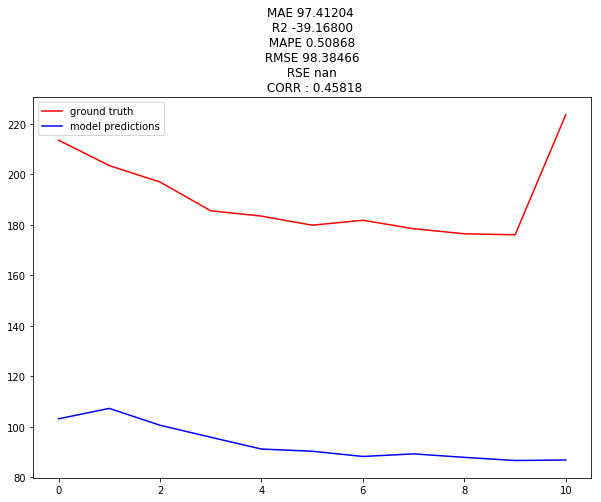

MAE 3.7248
R2 0.9948
RMSE 5.6143
[1.9954214] 0.5441513




Plot, with Optimizer.
(11,) (11,)


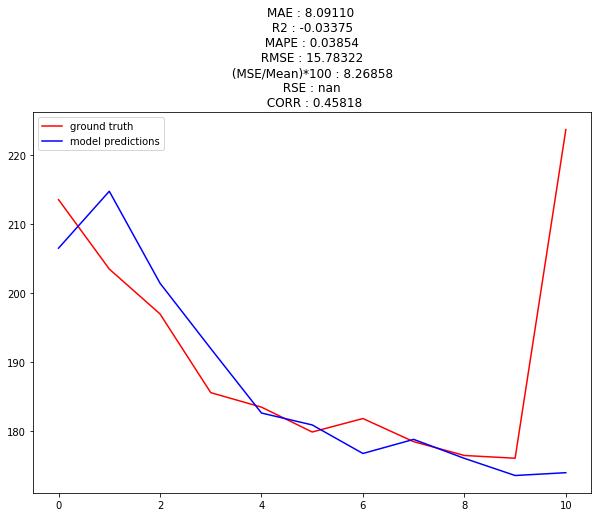

Done saving the results


[8.091097726207387,
 -0.033753084368933095,
 15.783224042311115,
 8.268584248854225]

In [50]:
results_collect(model_version="M1V1",dataset_name="YES",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam(),frac = 0.997)

0    14.00
1    12.47
2    11.96
3    12.88
4    13.13
Name: High, dtype: float64
Create formatted data : (df shape) (3361,)
Create time-stepped data : (d shape) (3340, 21, 1)
Create formatted data :  (3340, 10, 1) (3340, 10, 1) (3340,)
Dimensions of train and test :  (3329, 10, 1)   (11, 10, 1)   (3329,)   (11,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_37 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_71 (Conv1D)              (None, 6, 32)        192         input_37[0][0]                   
__________________________________________________________________________________________________
conv1d_72 (Conv1D)              (None, 5, 32)        2080        conv

3329/3329 [==============================] - 1s 412us/step - loss: 4.9014 - mean_absolute_error: 5.3507 - mean_squared_error: 100.1596 - rmse: 8.0176 - val_loss: 17.1003 - val_mean_absolute_error: 17.6003 - val_mean_squared_error: 354.3073 - val_rmse: 18.8231
Epoch 11/500
3329/3329 [==============================] - 1s 412us/step - loss: 3.6897 - mean_absolute_error: 4.1361 - mean_squared_error: 54.7147 - rmse: 6.5425 - val_loss: 9.5054 - val_mean_absolute_error: 10.0018 - val_mean_squared_error: 305.0774 - val_rmse: 17.4665
Epoch 12/500
3329/3329 [==============================] - 1s 412us/step - loss: 4.9639 - mean_absolute_error: 5.4159 - mean_squared_error: 97.9485 - rmse: 7.9212 - val_loss: 6.4179 - val_mean_absolute_error: 6.8439 - val_mean_squared_error: 243.0998 - val_rmse: 15.5917
Epoch 13/500
3329/3329 [==============================] - 1s 416us/step - loss: 4.6865 - mean_absolute_error: 5.1391 - mean_squared_error: 84.0645 - rmse: 7.7640 - val_loss: 13.6728 - val_mean_absolu

3329/3329 [==============================] - 1s 415us/step - loss: 2.3386 - mean_absolute_error: 2.7600 - mean_squared_error: 35.2368 - rmse: 4.7250 - val_loss: 9.9434 - val_mean_absolute_error: 10.4434 - val_mean_squared_error: 229.2542 - val_rmse: 15.1411
Epoch 41/500
3329/3329 [==============================] - 1s 413us/step - loss: 2.6018 - mean_absolute_error: 3.0334 - mean_squared_error: 37.6569 - rmse: 5.0074 - val_loss: 8.7791 - val_mean_absolute_error: 9.1958 - val_mean_squared_error: 280.1715 - val_rmse: 16.7383
Epoch 42/500
3329/3329 [==============================] - 1s 416us/step - loss: 2.6535 - mean_absolute_error: 3.0816 - mean_squared_error: 35.3114 - rmse: 5.0071 - val_loss: 10.4774 - val_mean_absolute_error: 10.9774 - val_mean_squared_error: 236.5523 - val_rmse: 15.3803
Epoch 43/500
3329/3329 [==============================] - 1s 412us/step - loss: 2.2294 - mean_absolute_error: 2.6511 - mean_squared_error: 28.8856 - rmse: 4.4087 - val_loss: 6.7156 - val_mean_absolute

3329/3329 [==============================] - 1s 413us/step - loss: 2.2533 - mean_absolute_error: 2.6731 - mean_squared_error: 30.2151 - rmse: 4.4887 - val_loss: 9.8485 - val_mean_absolute_error: 10.3485 - val_mean_squared_error: 322.0919 - val_rmse: 17.9469
Epoch 71/500
3329/3329 [==============================] - 1s 412us/step - loss: 2.9467 - mean_absolute_error: 3.3814 - mean_squared_error: 41.2007 - rmse: 5.3041 - val_loss: 7.3755 - val_mean_absolute_error: 7.8511 - val_mean_squared_error: 245.4187 - val_rmse: 15.6658
Epoch 72/500
3329/3329 [==============================] - 1s 414us/step - loss: 2.1102 - mean_absolute_error: 2.5292 - mean_squared_error: 27.3091 - rmse: 4.2238 - val_loss: 7.6397 - val_mean_absolute_error: 8.1397 - val_mean_squared_error: 215.4074 - val_rmse: 14.6768
Epoch 73/500
3329/3329 [==============================] - 1s 412us/step - loss: 2.1230 - mean_absolute_error: 2.5433 - mean_squared_error: 27.0062 - rmse: 4.2259 - val_loss: 11.6340 - val_mean_absolute_

3329/3329 [==============================] - 1s 412us/step - loss: 2.1585 - mean_absolute_error: 2.5741 - mean_squared_error: 27.9771 - rmse: 4.3164 - val_loss: 12.2880 - val_mean_absolute_error: 12.7880 - val_mean_squared_error: 255.5400 - val_rmse: 15.9856
Epoch 101/500
3329/3329 [==============================] - 1s 411us/step - loss: 2.4540 - mean_absolute_error: 2.8751 - mean_squared_error: 33.4262 - rmse: 4.6529 - val_loss: 19.7648 - val_mean_absolute_error: 20.2648 - val_mean_squared_error: 622.7506 - val_rmse: 24.9550
Epoch 102/500
3329/3329 [==============================] - 1s 413us/step - loss: 2.9063 - mean_absolute_error: 3.3260 - mean_squared_error: 52.4108 - rmse: 5.2848 - val_loss: 7.6065 - val_mean_absolute_error: 8.0345 - val_mean_squared_error: 260.0872 - val_rmse: 16.1272
Epoch 103/500
3329/3329 [==============================] - 1s 411us/step - loss: 2.0950 - mean_absolute_error: 2.5147 - mean_squared_error: 26.7796 - rmse: 4.2190 - val_loss: 7.6028 - val_mean_abso

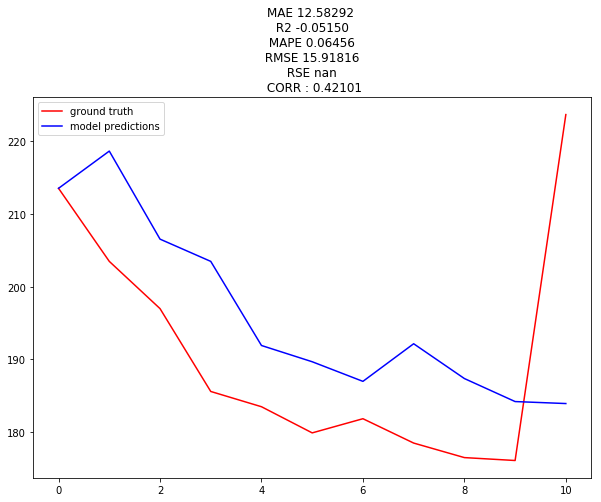

MAE 3.4115
R2 0.9952
RMSE 5.3753
[0.96307105] 0.20341492




Plot, with Optimizer.
(11,) (11,)


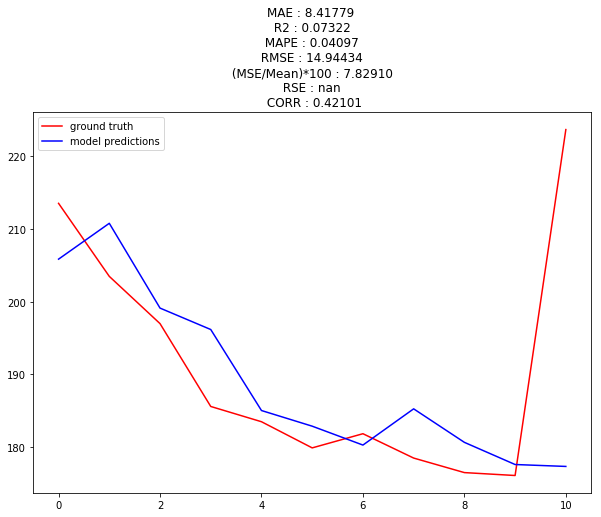

Done saving the results


[8.417789806019176, 0.07321565178452094, 14.944337173461978, 7.829104537247663]

In [49]:
results_collect(model_version="M3V1",dataset_name="YES",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam(),frac = 0.997)

0    14.00
1    12.47
2    11.96
3    12.88
4    13.13
Name: High, dtype: float64
Create formatted data : (df shape) (3361,)
Create time-stepped data : (d shape) (3340, 21, 1)
Create formatted data :  (3340, 10, 1) (3340, 10, 1) (3340,)
Dimensions of train and test :  (3303, 10, 1)   (37, 10, 1)   (3303,)   (37,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_45 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_81 (Conv1D)              (None, 6, 32)        192         input_45[0][0]                   
__________________________________________________________________________________________________
conv1d_82 (Conv1D)              (None, 5, 32)        2080        conv

3303/3303 [==============================] - 1s 430us/step - loss: 3.0247 - mean_absolute_error: 3.4551 - mean_squared_error: 49.3618 - rmse: 5.5895 - val_loss: 6.5318 - val_mean_absolute_error: 7.0143 - val_mean_squared_error: 138.7669 - val_rmse: 11.0993
Epoch 11/500
3303/3303 [==============================] - 1s 435us/step - loss: 5.2050 - mean_absolute_error: 5.6610 - mean_squared_error: 103.3704 - rmse: 8.4468 - val_loss: 7.0017 - val_mean_absolute_error: 7.4884 - val_mean_squared_error: 145.7037 - val_rmse: 11.4035
Epoch 12/500
3303/3303 [==============================] - 1s 432us/step - loss: 3.6296 - mean_absolute_error: 4.0730 - mean_squared_error: 56.7102 - rmse: 6.3577 - val_loss: 19.4879 - val_mean_absolute_error: 19.9879 - val_mean_squared_error: 520.9182 - val_rmse: 22.6880
Epoch 13/500
3303/3303 [==============================] - 1s 435us/step - loss: 3.7890 - mean_absolute_error: 4.2321 - mean_squared_error: 59.9072 - rmse: 6.4969 - val_loss: 7.8017 - val_mean_absolute

3303/3303 [==============================] - 1s 432us/step - loss: 2.5682 - mean_absolute_error: 2.9954 - mean_squared_error: 33.7340 - rmse: 4.7517 - val_loss: 6.5908 - val_mean_absolute_error: 7.0719 - val_mean_squared_error: 121.2895 - val_rmse: 10.3381
Epoch 41/500
3303/3303 [==============================] - 1s 435us/step - loss: 3.1993 - mean_absolute_error: 3.6380 - mean_squared_error: 46.8183 - rmse: 5.7106 - val_loss: 5.8363 - val_mean_absolute_error: 6.3054 - val_mean_squared_error: 124.3102 - val_rmse: 10.2412
Epoch 42/500
3303/3303 [==============================] - 1s 435us/step - loss: 1.9612 - mean_absolute_error: 2.3744 - mean_squared_error: 25.7956 - rmse: 4.0137 - val_loss: 5.4446 - val_mean_absolute_error: 5.8987 - val_mean_squared_error: 118.3758 - val_rmse: 9.9358
Epoch 43/500
3303/3303 [==============================] - 1s 431us/step - loss: 2.3136 - mean_absolute_error: 2.7320 - mean_squared_error: 31.8505 - rmse: 4.5264 - val_loss: 8.3675 - val_mean_absolute_err

3303/3303 [==============================] - 1s 433us/step - loss: 2.5325 - mean_absolute_error: 2.9616 - mean_squared_error: 33.8675 - rmse: 4.7759 - val_loss: 7.8575 - val_mean_absolute_error: 8.3416 - val_mean_squared_error: 167.6028 - val_rmse: 12.1908
Epoch 71/500
3303/3303 [==============================] - 1s 429us/step - loss: 2.1498 - mean_absolute_error: 2.5689 - mean_squared_error: 28.2902 - rmse: 4.1946 - val_loss: 6.6615 - val_mean_absolute_error: 7.1563 - val_mean_squared_error: 143.6204 - val_rmse: 11.1445
Epoch 72/500
3303/3303 [==============================] - 1s 433us/step - loss: 2.0181 - mean_absolute_error: 2.4341 - mean_squared_error: 25.2473 - rmse: 4.0198 - val_loss: 6.2672 - val_mean_absolute_error: 6.7613 - val_mean_squared_error: 119.4676 - val_rmse: 10.1444
Epoch 73/500
3303/3303 [==============================] - 1s 431us/step - loss: 2.2724 - mean_absolute_error: 2.6903 - mean_squared_error: 29.6480 - rmse: 4.4120 - val_loss: 9.6112 - val_mean_absolute_er

3303/3303 [==============================] - 1s 432us/step - loss: 1.9235 - mean_absolute_error: 2.3328 - mean_squared_error: 24.9499 - rmse: 3.9528 - val_loss: 6.0919 - val_mean_absolute_error: 6.5907 - val_mean_squared_error: 119.3808 - val_rmse: 10.1745
Epoch 101/500
3303/3303 [==============================] - 1s 430us/step - loss: 2.1099 - mean_absolute_error: 2.5259 - mean_squared_error: 27.2165 - rmse: 4.1769 - val_loss: 12.2439 - val_mean_absolute_error: 12.7355 - val_mean_squared_error: 273.1979 - val_rmse: 15.9441
Epoch 102/500
3303/3303 [==============================] - 1s 433us/step - loss: 2.6558 - mean_absolute_error: 3.0849 - mean_squared_error: 34.8197 - rmse: 4.8330 - val_loss: 5.5194 - val_mean_absolute_error: 5.9792 - val_mean_squared_error: 117.6373 - val_rmse: 9.9544
Epoch 103/500
3303/3303 [==============================] - 1s 431us/step - loss: 1.8433 - mean_absolute_error: 2.2530 - mean_squared_error: 25.5092 - rmse: 3.9406 - val_loss: 8.2221 - val_mean_absolut

3303/3303 [==============================] - 1s 436us/step - loss: 2.1848 - mean_absolute_error: 2.6066 - mean_squared_error: 27.2194 - rmse: 4.2706 - val_loss: 6.8516 - val_mean_absolute_error: 7.3389 - val_mean_squared_error: 126.4863 - val_rmse: 10.5999
Epoch 131/500
3303/3303 [==============================] - 1s 434us/step - loss: 2.0158 - mean_absolute_error: 2.4328 - mean_squared_error: 25.5932 - rmse: 4.0580 - val_loss: 5.5012 - val_mean_absolute_error: 5.9509 - val_mean_squared_error: 116.0849 - val_rmse: 9.9012
Epoch 132/500
3303/3303 [==============================] - 1s 431us/step - loss: 1.8080 - mean_absolute_error: 2.2174 - mean_squared_error: 23.5694 - rmse: 3.8099 - val_loss: 7.4897 - val_mean_absolute_error: 7.9639 - val_mean_squared_error: 159.9772 - val_rmse: 11.7811
Epoch 133/500
3303/3303 [==============================] - 1s 431us/step - loss: 1.9191 - mean_absolute_error: 2.3318 - mean_squared_error: 25.4670 - rmse: 3.9751 - val_loss: 5.5521 - val_mean_absolute_

3303/3303 [==============================] - 1s 433us/step - loss: 1.7326 - mean_absolute_error: 2.1378 - mean_squared_error: 22.7023 - rmse: 3.7370 - val_loss: 5.8352 - val_mean_absolute_error: 6.3173 - val_mean_squared_error: 116.4508 - val_rmse: 10.0209
Epoch 161/500
3303/3303 [==============================] - 1s 435us/step - loss: 2.1247 - mean_absolute_error: 2.5365 - mean_squared_error: 29.5963 - rmse: 4.2616 - val_loss: 5.4932 - val_mean_absolute_error: 5.9784 - val_mean_squared_error: 122.4258 - val_rmse: 10.0795
Epoch 162/500
3303/3303 [==============================] - 1s 429us/step - loss: 1.7902 - mean_absolute_error: 2.2001 - mean_squared_error: 23.1238 - rmse: 3.7745 - val_loss: 8.5293 - val_mean_absolute_error: 9.0265 - val_mean_squared_error: 184.9932 - val_rmse: 12.8273
Epoch 163/500
3303/3303 [==============================] - 1s 430us/step - loss: 1.9362 - mean_absolute_error: 2.3475 - mean_squared_error: 24.8922 - rmse: 3.9129 - val_loss: 7.7991 - val_mean_absolute

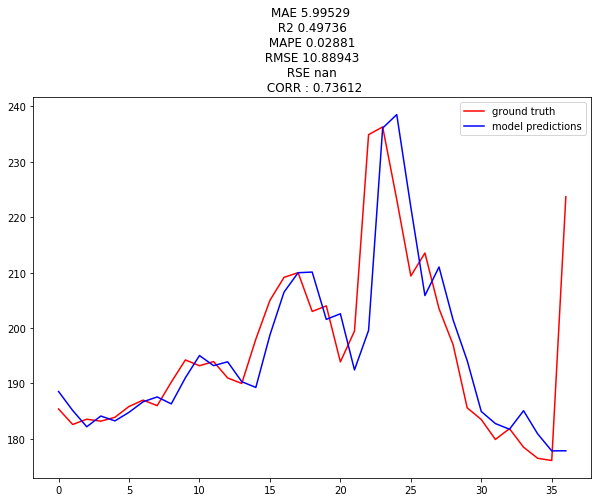

MAE 3.3340
R2 0.9957
RMSE 5.2023
[0.9971243] 0.07854462




Plot, with Optimizer.
(37,) (37,)


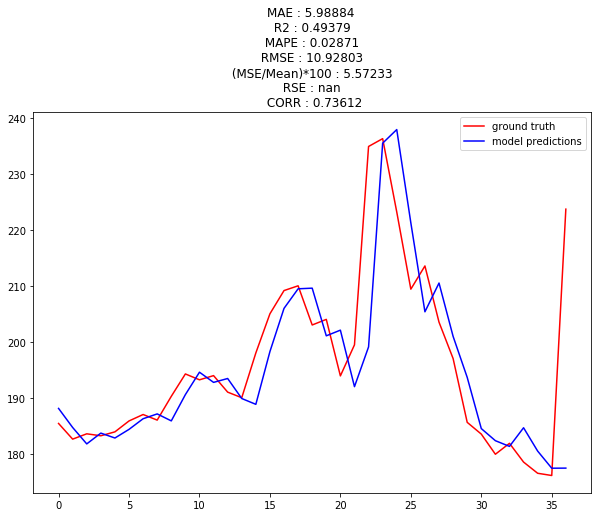

Done saving the results


[5.988835923405826, 0.4937858825392707, 10.928025343992505, 5.572334349454089]

In [53]:
results_collect(model_version="M3V1",dataset_name="YES",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam(),frac = 0.989)

In [34]:
results_collect(model_version="M1V1",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

0    62.430000
1    63.040001
2    63.730000
3    64.580002
4    65.070000
Name: WMT, dtype: float64
Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_20 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_37 (Conv1D)              (None, 6, 32)   

KeyboardInterrupt: 

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_29 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_30 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_45 (Conv1D)              (None, 6, 32)        192         input_29[0][0]                   
__________________________________________________

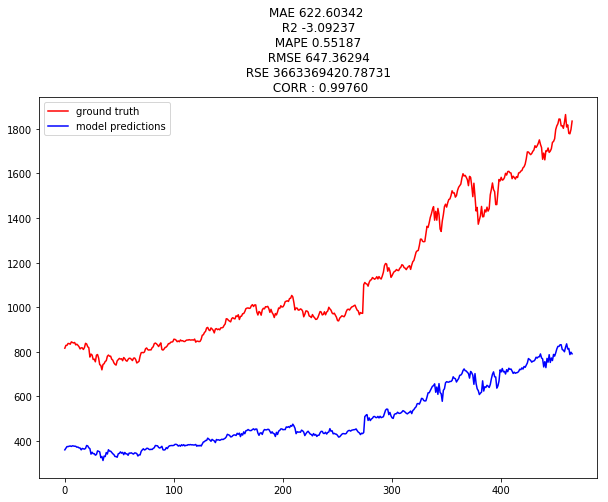

MAE 10.8416
R2 0.9783
RMSE 14.8840
[2.1985333] 3.578308




Plot, with Optimizer.
(466,) (466,)


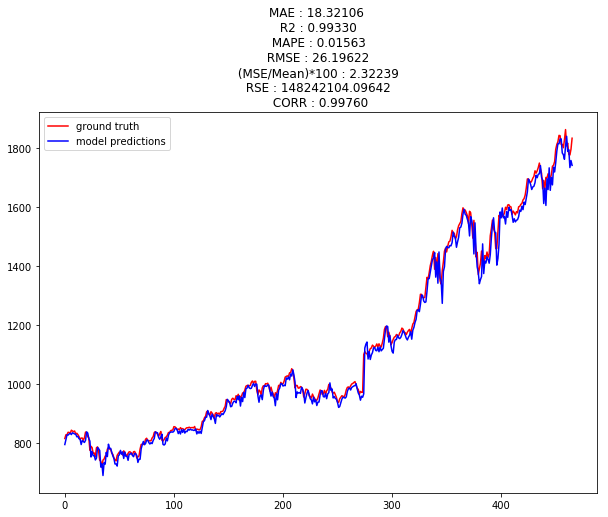

Done saving the results


[18.321060108109243, 0.9932987314713412, 26.196223693672273, 2.322391228617833]

In [26]:
results_collect(model_version="M1V1",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_31 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_32 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_49 (Conv1D)              (None, 6, 32)        192         input_31[0][0]                   
__________________________________________________

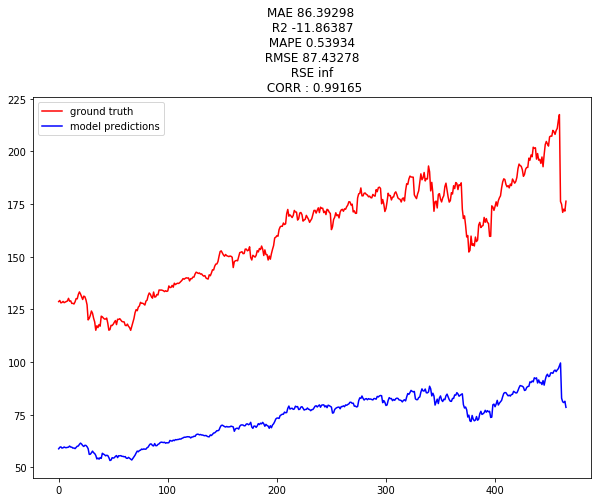

MAE 1.6843
R2 0.9690
RMSE 2.1982
[2.1193874] 1.1681824




Plot, with Optimizer.
(466,) (466,)


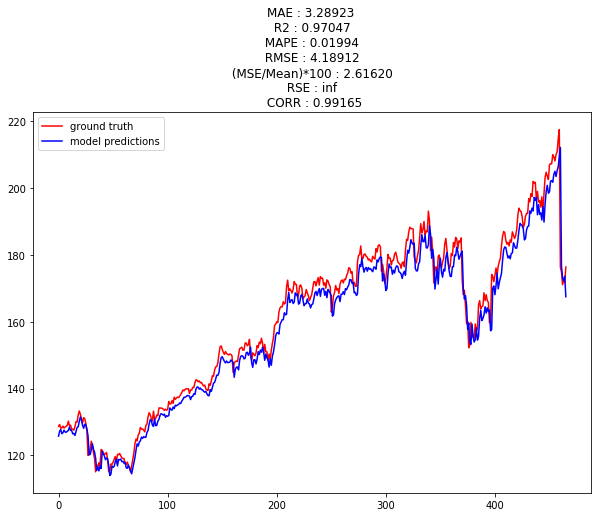

Done saving the results


[3.289227053790572, 0.9704696268851682, 4.189120701459829, 2.616196537095308]

In [27]:
results_collect(model_version="M1V1",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_34 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_53 (Conv1D)              (None, 6, 32)        192         input_33[0][0]                   
__________________________________________________

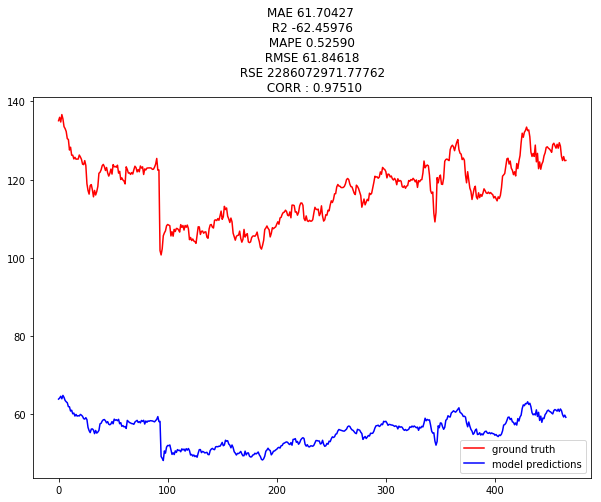

MAE 1.2524
R2 0.9808
RMSE 1.8489
[2.0433855] 3.7701035




Plot, with Optimizer.
(466,) (466,)


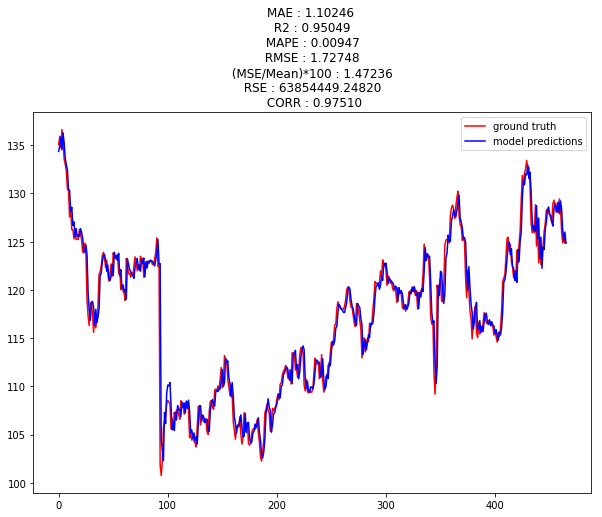

Done saving the results


[1.1024595049362511, 0.9504891263319291, 1.727483570533864, 1.4723588519695467]

In [28]:
results_collect(model_version="M1V1",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_35 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_36 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_57 (Conv1D)              (None, 6, 32)        192         input_35[0][0]                   
__________________________________________________

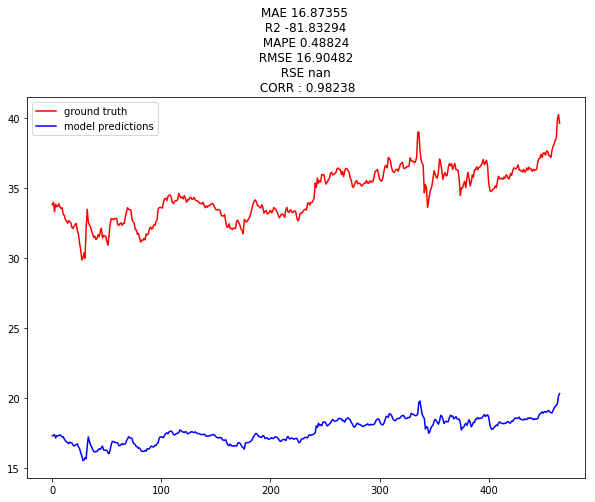

MAE 0.3297
R2 0.9517
RMSE 0.4333
[2.073082] -2.1774502




Plot, with Optimizer.
(466,) (466,)


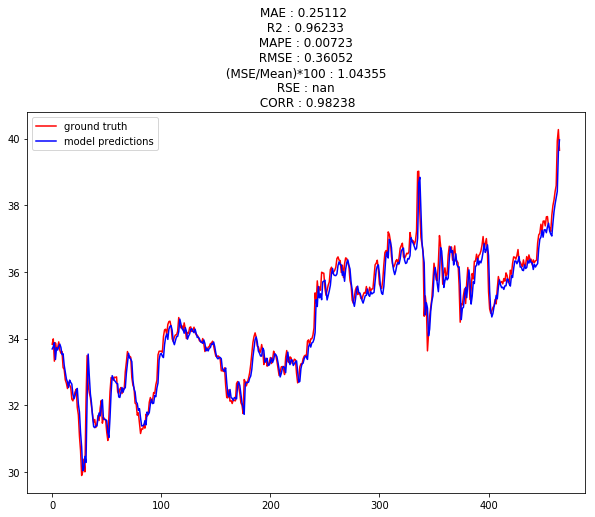

Done saving the results


[0.25112410534248886,
 0.962325394621174,
 0.3605233495278694,
 1.0435516253695691]

In [29]:
results_collect(model_version="M1V1",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

Create formatted data : (df shape) (3651,)
Create time-stepped data : (d shape) (3630, 21, 1)
Create formatted data :  (3630, 10, 1) (3630, 10, 1) (3630,)
Dimensions of train and test :  (2541, 10, 1)   (1089, 10, 1)   (2541,)   (1089,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_37 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_38 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_61 (Conv1D)              (None, 6, 32)        192         input_37[0][0]                   
________________________________________________

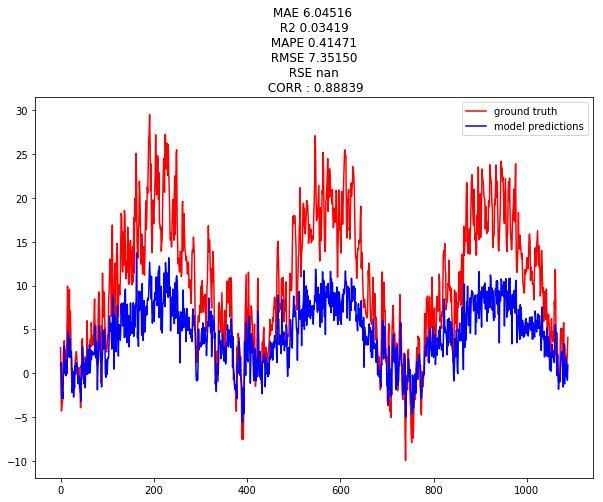

MAE 2.2441
R2 0.8561
RMSE 2.8365
[1.9929596] 1.0932379




Plot, with Optimizer.
(1089,) (1089,)


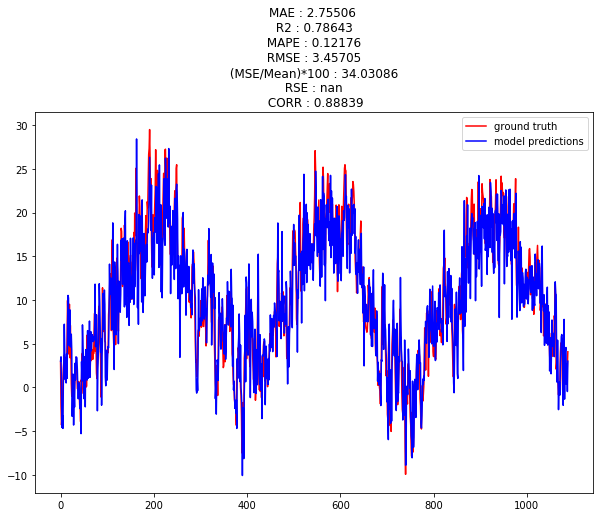

Done saving the results


[2.755057148916869, 0.786425520616102, 3.457047581421279, 34.03086494928843]

In [30]:
results_collect(model_version="M1V1",dataset_name="Jena",callback_min_delta=0.01,patience_value=20,epoch_cnt=500,optim = Adam())

In [31]:
results_collect(model_version="M1V1",dataset_name="Italy",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

UnboundLocalError: local variable 'data' referenced before assignment

### M1V2

In [ ]:
results_collect(model_version="M1V2",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M1V2",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M1V2",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M1V2",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M1V2",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M1V2",dataset_name="Jena",callback_min_delta=0.01,patience_value=20,epoch_cnt=500)

### M1V3

In [ ]:
results_collect(model_version="M1V3",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M1V3",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M1V3",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M1V3",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M1V3",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M1V3",dataset_name="Jena",callback_min_delta=0.01,patience_value=20,epoch_cnt=500)

### M2V1

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_39 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_40 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_65 (Conv1D)              (None, 6, 32)        192         input_39[0][0]                   
__________________________________________________

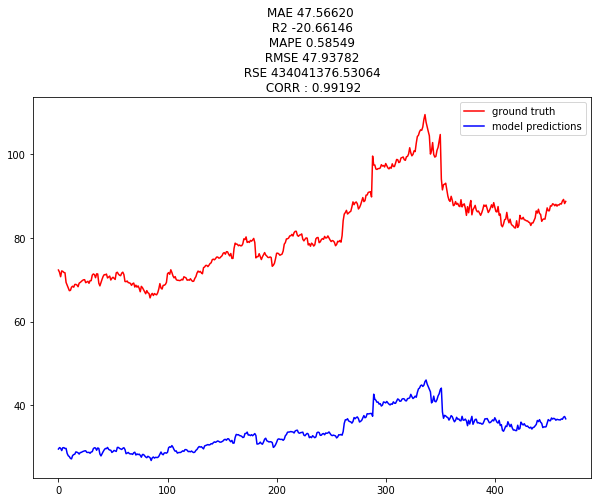

MAE 0.7879
R2 0.9472
RMSE 1.1390
[2.2689323] 4.6197205




Plot, with Optimizer.
(466,) (466,)


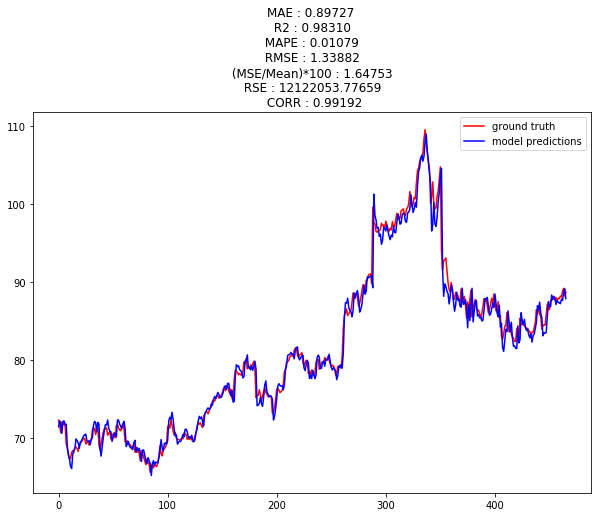

Done saving the results


[0.897266110724584, 0.9831042379763586, 1.3388235510668813, 1.6475265366971197]

In [32]:
results_collect(model_version="M2V1",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim=Adam())

In [ ]:
results_collect(model_version="M2V1",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M2V1",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M2V1",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M2V1",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M2V1",dataset_name="Jena",callback_min_delta=0.01,patience_value=20,epoch_cnt=500)

### M2V2

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_41 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_42 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
lstm_28 (LSTM)                  (None, 10, 32)       4352        input_41[0][0]                   
__________________________________________________

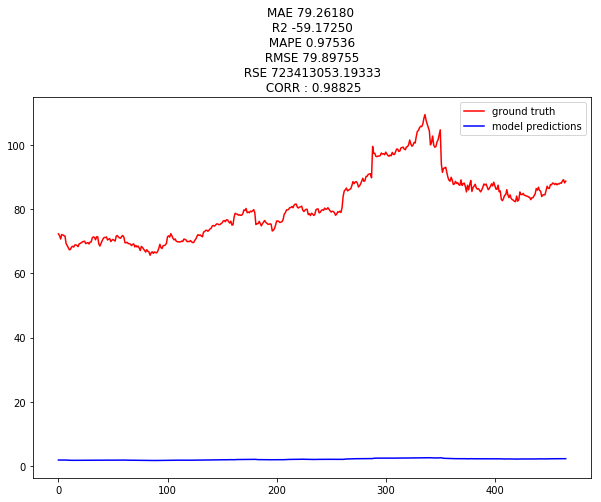

MAE 0.7549
R2 0.9496
RMSE 1.1131
[36.78686] 6.8814316




Plot, with Optimizer.
(466,) (466,)


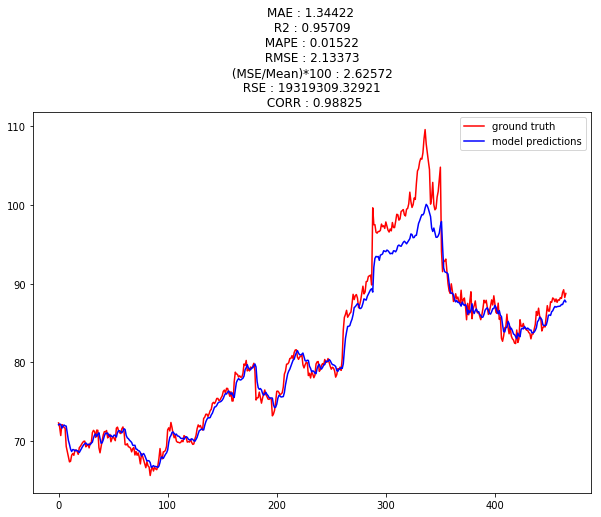

Done saving the results


[1.3442165810022966, 0.9570850546668623, 2.1337264127825644, 2.625716349484216]

In [34]:
results_collect(model_version="M2V2",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim=Adam())

In [ ]:
results_collect(model_version="M2V2",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M2V2",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M2V2",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M2V2",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M2V2",dataset_name="Jena",callback_min_delta=0.01,patience_value=20,epoch_cnt=500)

### M3V1

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_43 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_69 (Conv1D)              (None, 6, 32)        192         input_43[0][0]                   
__________________________________________________________________________________________________
conv1d_70 (Conv1D)              (None, 5, 32)        2080        conv1d_69[0][0]                  
__________________________________________________

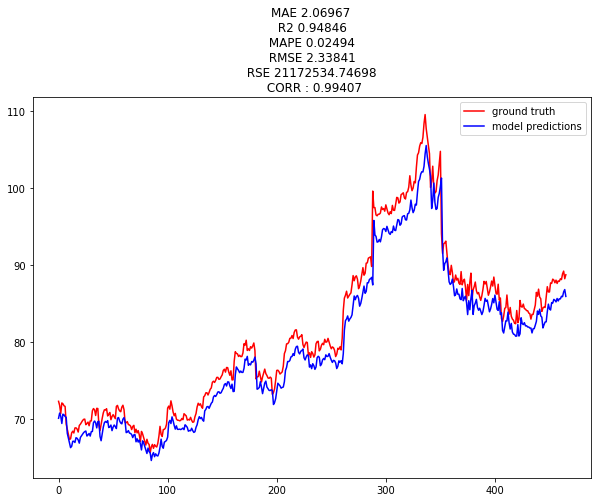

MAE 0.5851
R2 0.9682
RMSE 0.8831
[1.033812] -0.8143616




Plot, with Optimizer.
(466,) (466,)


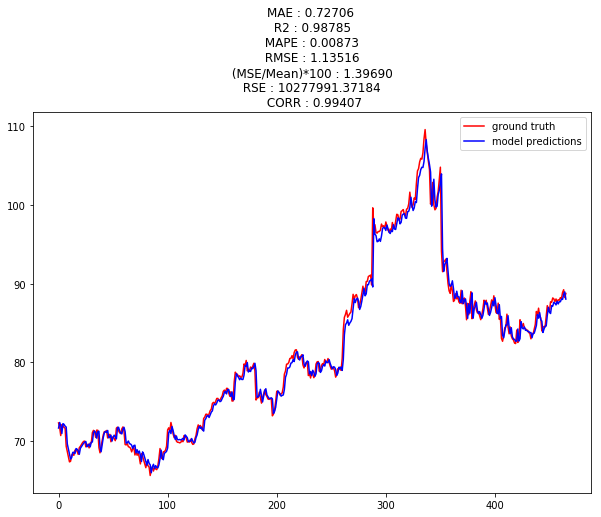

Done saving the results


[0.7270593930517367, 0.9878537597041153, 1.135155573459789, 1.3968972453945219]

In [35]:
results_collect(model_version="M3V1",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_45 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_71 (Conv1D)              (None, 6, 32)        192         input_45[0][0]                   
__________________________________________________________________________________________________
conv1d_72 (Conv1D)              (None, 5, 32)        2080        conv1d_71[0][0]                  
__________________________________________________

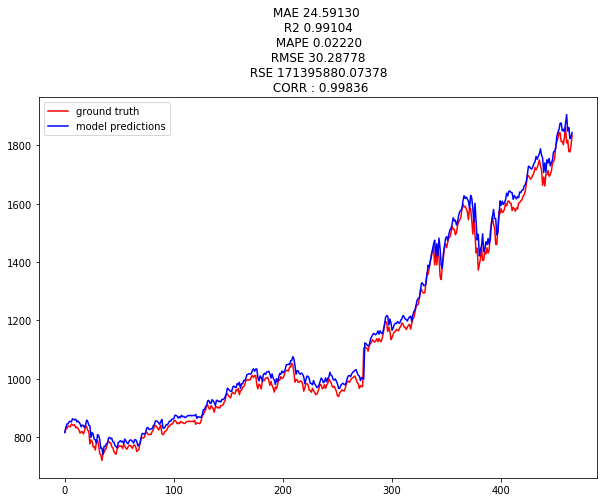

MAE 8.0580
R2 0.9865
RMSE 11.7450
[0.9751626] 0.7260742




Plot, with Optimizer.
(466,) (466,)


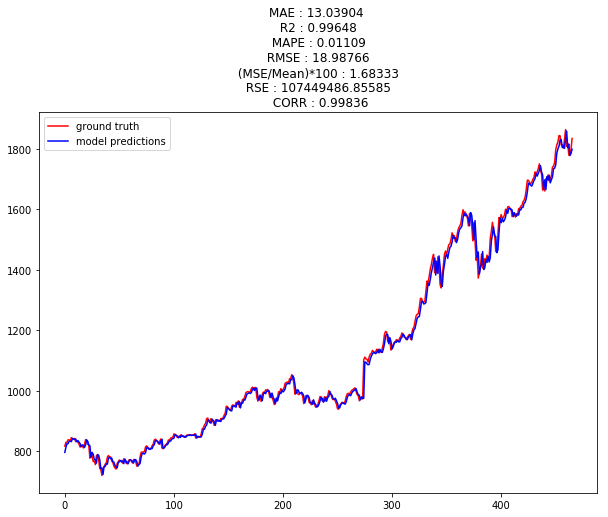

Done saving the results


[13.039035524971501, 0.9964793522783962, 18.98766083092881, 1.6833257144758271]

In [36]:
results_collect(model_version="M3V1",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_47 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_73 (Conv1D)              (None, 6, 32)        192         input_47[0][0]                   
__________________________________________________________________________________________________
conv1d_74 (Conv1D)              (None, 5, 32)        2080        conv1d_73[0][0]                  
__________________________________________________

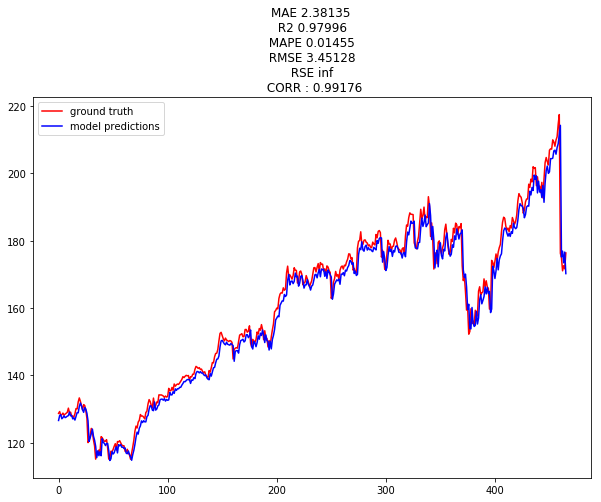

MAE 1.3119
R2 0.9777
RMSE 1.8654
[1.0035524] 0.24855042




Plot, with Optimizer.
(466,) (466,)


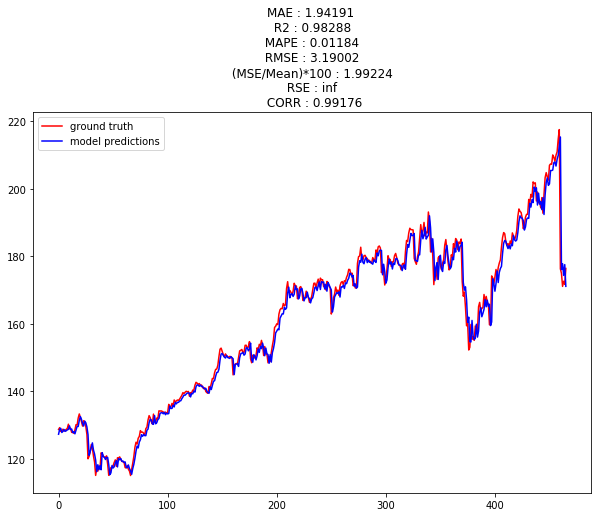

Done saving the results


[1.9419100160849898, 0.9828757757901441, 3.190023331813005, 1.9922386077426926]

In [37]:
results_collect(model_version="M3V1",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_49 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_75 (Conv1D)              (None, 6, 32)        192         input_49[0][0]                   
__________________________________________________________________________________________________
conv1d_76 (Conv1D)              (None, 5, 32)        2080        conv1d_75[0][0]                  
__________________________________________________

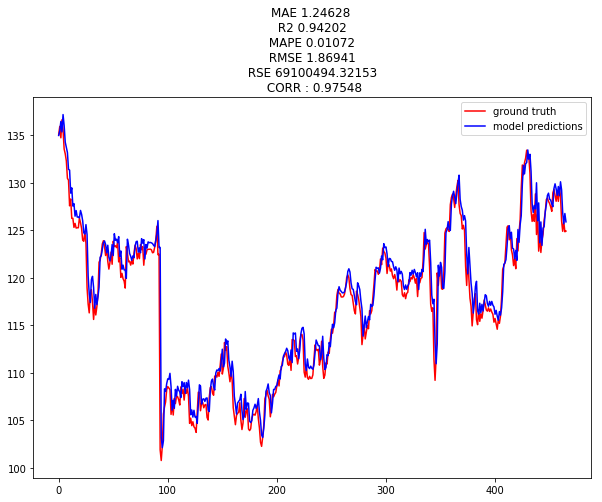

MAE 1.2617
R2 0.9811
RMSE 1.8339
[0.99973905] -0.6091919




Plot, with Optimizer.
(466,) (466,)


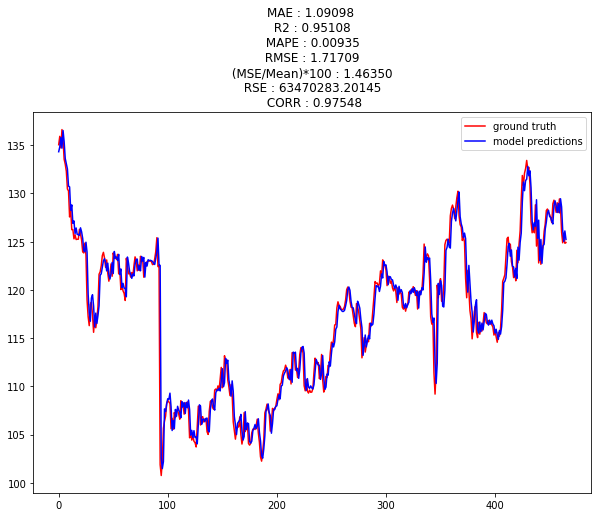

Done saving the results


[1.0909818609236688,
 0.9510830765059537,
 1.7170905510666725,
 1.4635007334483485]

In [38]:
results_collect(model_version="M3V1",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_9 (Conv1D)               (None, 6, 32)        192         input_9[0][0]                    
__________________________________________________________________________________________________
conv1d_10 (Conv1D)              (None, 5, 32)        2080        conv1d_9[0][0]                   
__________________________________________________

1086/1086 [==============================] - 1s 1ms/step - loss: 0.2379 - mean_absolute_error: 0.5658 - mean_squared_error: 0.5019 - rmse: 0.6576 - val_loss: 0.1014 - val_mean_absolute_error: 0.3417 - val_mean_squared_error: 0.2151 - val_rmse: 0.4369
Epoch 43/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1589 - mean_absolute_error: 0.4477 - mean_squared_error: 0.3318 - rmse: 0.5422 - val_loss: 0.0777 - val_mean_absolute_error: 0.2815 - val_mean_squared_error: 0.1650 - val_rmse: 0.3794
Epoch 44/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1434 - mean_absolute_error: 0.4253 - mean_squared_error: 0.2967 - rmse: 0.5149 - val_loss: 0.2447 - val_mean_absolute_error: 0.6254 - val_mean_squared_error: 0.5139 - val_rmse: 0.7021
Epoch 45/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1281 - mean_absolute_error: 0.3956 - mean_squared_error: 0.2660 - rmse: 0.4915 - val_loss: 0.0751 - val_mean_absolute_error: 0.2800 - val_mea

1086/1086 [==============================] - 1s 1ms/step - loss: 0.2192 - mean_absolute_error: 0.5424 - mean_squared_error: 0.4578 - rmse: 0.6175 - val_loss: 0.0798 - val_mean_absolute_error: 0.3015 - val_mean_squared_error: 0.1676 - val_rmse: 0.3888
Epoch 105/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.0823 - mean_absolute_error: 0.3153 - mean_squared_error: 0.1662 - rmse: 0.4016 - val_loss: 0.0680 - val_mean_absolute_error: 0.2672 - val_mean_squared_error: 0.1437 - val_rmse: 0.3567
Epoch 106/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1607 - mean_absolute_error: 0.4693 - mean_squared_error: 0.3282 - rmse: 0.5461 - val_loss: 0.1672 - val_mean_absolute_error: 0.5060 - val_mean_squared_error: 0.3483 - val_rmse: 0.5791
Epoch 107/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1222 - mean_absolute_error: 0.3973 - mean_squared_error: 0.2482 - rmse: 0.4771 - val_loss: 0.1375 - val_mean_absolute_error: 0.4497 - val_

Epoch 135/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1574 - mean_absolute_error: 0.4602 - mean_squared_error: 0.3224 - rmse: 0.5408 - val_loss: 0.0606 - val_mean_absolute_error: 0.2460 - val_mean_squared_error: 0.1281 - val_rmse: 0.3352
Epoch 136/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.0795 - mean_absolute_error: 0.3061 - mean_squared_error: 0.1614 - rmse: 0.3922 - val_loss: 0.1294 - val_mean_absolute_error: 0.4335 - val_mean_squared_error: 0.2675 - val_rmse: 0.5058
Epoch 137/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1888 - mean_absolute_error: 0.5160 - mean_squared_error: 0.3869 - rmse: 0.5926 - val_loss: 0.0573 - val_mean_absolute_error: 0.2349 - val_mean_squared_error: 0.1211 - val_rmse: 0.3242
Epoch 138/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1647 - mean_absolute_error: 0.4584 - mean_squared_error: 0.3403 - rmse: 0.5383 - val_loss: 0.3990 - val_mean_absolute_error:

Epoch 166/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1571 - mean_absolute_error: 0.4634 - mean_squared_error: 0.3199 - rmse: 0.5407 - val_loss: 0.1801 - val_mean_absolute_error: 0.5305 - val_mean_squared_error: 0.3743 - val_rmse: 0.6009
Epoch 167/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1572 - mean_absolute_error: 0.4618 - mean_squared_error: 0.3215 - rmse: 0.5400 - val_loss: 0.0686 - val_mean_absolute_error: 0.2702 - val_mean_squared_error: 0.1444 - val_rmse: 0.3584
Epoch 168/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1220 - mean_absolute_error: 0.3806 - mean_squared_error: 0.2497 - rmse: 0.4593 - val_loss: 0.0577 - val_mean_absolute_error: 0.2352 - val_mean_squared_error: 0.1220 - val_rmse: 0.3253
Epoch 169/500
1086/1086 [==============================] - 1s 1ms/step - loss: 0.1609 - mean_absolute_error: 0.4379 - mean_squared_error: 0.3325 - rmse: 0.5173 - val_loss: 0.1137 - val_mean_absolute_error:

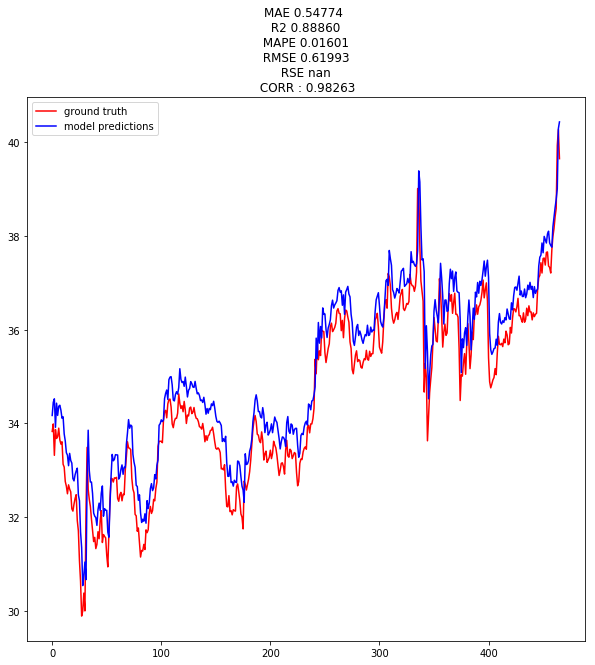

MAE 0.3156
R2 0.9555
RMSE 0.4158
[0.98814964] -0.14676666




Plot, with Optimizer.
(466,) (466,)


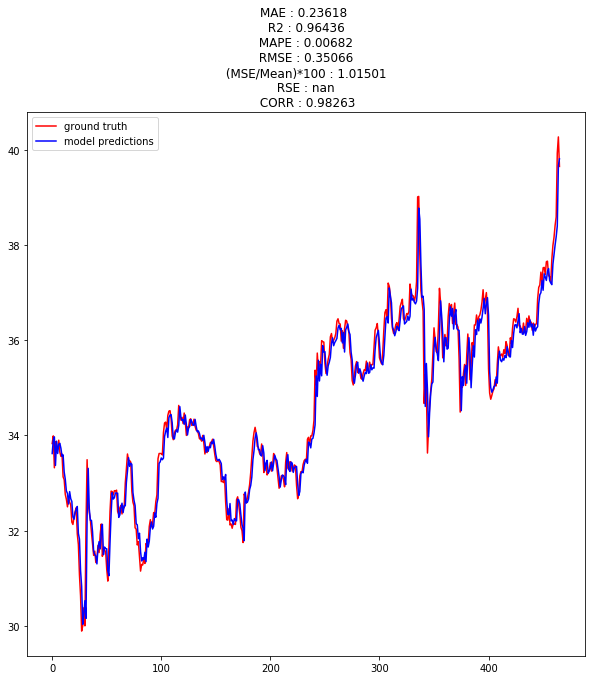

Done saving the results


[0.23618279126736264,
 0.9643582126213318,
 0.35066205925849986,
 1.015007661428487]

In [10]:
results_collect(model_version="M3V1",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam())

In [11]:
results_collect(model_version="M3V1",dataset_name="Jena",callback_min_delta=0.01,patience_value=20,epoch_cnt=500,optim = Adam())

Create formatted data : (df shape) (3651,)
Create time-stepped data : (d shape) (3630, 21, 1)
Create formatted data :  (3630, 10, 1) (3630, 10, 1) (3630,)
Dimensions of train and test :  (2541, 10, 1)   (1089, 10, 1)   (2541,)   (1089,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_11 (Conv1D)              (None, 6, 32)        192         input_11[0][0]                   
__________________________________________________________________________________________________
conv1d_12 (Conv1D)              (None, 5, 32)        2080        conv1d_11[0][0]                  
________________________________________________

2541/2541 [==============================] - 3s 1ms/step - loss: 1.2089 - mean_absolute_error: 1.6378 - mean_squared_error: 4.5954 - rmse: 2.1176 - val_loss: 1.6775 - val_mean_absolute_error: 2.1245 - val_mean_squared_error: 7.3310 - val_rmse: 2.6679
Epoch 43/500
2541/2541 [==============================] - 3s 1ms/step - loss: 1.2308 - mean_absolute_error: 1.6595 - mean_squared_error: 4.7217 - rmse: 2.1417 - val_loss: 1.7552 - val_mean_absolute_error: 2.2049 - val_mean_squared_error: 7.8379 - val_rmse: 2.7654
Epoch 44/500
2541/2541 [==============================] - 3s 1ms/step - loss: 1.2259 - mean_absolute_error: 1.6531 - mean_squared_error: 4.6955 - rmse: 2.1460 - val_loss: 1.6292 - val_mean_absolute_error: 2.0772 - val_mean_squared_error: 6.9850 - val_rmse: 2.6021
Epoch 45/500
2541/2541 [==============================] - 3s 1ms/step - loss: 1.2360 - mean_absolute_error: 1.6645 - mean_squared_error: 4.8039 - rmse: 2.1550 - val_loss: 1.6713 - val_mean_absolute_error: 2.1135 - val_mea

2541/2541 [==============================] - 3s 1ms/step - loss: 0.7956 - mean_absolute_error: 1.1788 - mean_squared_error: 2.8181 - rmse: 1.6494 - val_loss: 1.7925 - val_mean_absolute_error: 2.2448 - val_mean_squared_error: 8.1481 - val_rmse: 2.8005
Epoch 105/500
2541/2541 [==============================] - 3s 1ms/step - loss: 0.7785 - mean_absolute_error: 1.1649 - mean_squared_error: 2.6931 - rmse: 1.6112 - val_loss: 1.8044 - val_mean_absolute_error: 2.2562 - val_mean_squared_error: 8.0809 - val_rmse: 2.7912
Epoch 106/500
1504/2541 [================>.............] - ETA: 1s - loss: 0.7683 - mean_absolute_error: 1.1513 - mean_squared_error: 2.6371 - rmse: 1.6043

KeyboardInterrupt: 

### M3V2

In [ ]:
results_collect(model_version="M3V2",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M3V2",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M3V2",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M3V2",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M3V2",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500)

In [ ]:
results_collect(model_version="M3V2",dataset_name="Jena",callback_min_delta=0.01,patience_value=20,epoch_cnt=500)

## Multivariate 

### M1V1

In [ ]:
results_collect(model_version="M1V1",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam(0.0001), multi=True)

In [ ]:
results_collect(model_version="M1V1",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=300, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V1",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V1",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V1",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500,optim = Adam(0.001), multi = True)

### M1V2

In [ ]:
results_collect(model_version="M1V2",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V2",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V2",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V2",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V2",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

### M1V3

In [ ]:
results_collect(model_version="M1V3",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V3",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V3",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V3",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M1V3",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

### M2V1

In [ ]:
results_collect(model_version="M2V1",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M2V1",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M2V1",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M2V1",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M2V1",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

### M2V2

In [ ]:
results_collect(model_version="M2V2",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M2V2",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M2V2",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M2V2",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M2V2",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

### M3V1

Create formatted data : (df shape) (1573,)
Create time-stepped data : (d shape) (1552, 21, 1)
Create formatted data :  (1552, 10, 1) (1552, 10, 1) (1552,)
Dimensions of train and test :  (1086, 10, 1)   (466, 10, 1)   (1086,)   (466,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_12 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
concatenate_6 (Concatenate)     (None, 20, 1)        0           input_11[0][0]                   
                                                  

Epoch 12/100
1086/1086 [==============================] - 2s 2ms/step - loss: 0.7411 - mean_absolute_error: 1.1514 - mean_squared_error: 2.0496 - rmse: 1.3472 - val_loss: 34.1705 - val_mean_absolute_error: 34.6705 - val_mean_squared_error: 1223.1647 - val_rmse: 34.6915
Epoch 13/100
1086/1086 [==============================] - 2s 2ms/step - loss: 1.4092 - mean_absolute_error: 1.8441 - mean_squared_error: 5.3341 - rmse: 2.0093 - val_loss: 33.6378 - val_mean_absolute_error: 34.1378 - val_mean_squared_error: 1186.0052 - val_rmse: 34.1589
Epoch 14/100
1086/1086 [==============================] - 2s 2ms/step - loss: 1.1296 - mean_absolute_error: 1.5543 - mean_squared_error: 4.2910 - rmse: 1.7238 - val_loss: 30.6460 - val_mean_absolute_error: 31.1460 - val_mean_squared_error: 987.5677 - val_rmse: 31.1683
Epoch 15/100
1086/1086 [==============================] - 2s 2ms/step - loss: 0.9932 - mean_absolute_error: 1.4218 - mean_squared_error: 3.2790 - rmse: 1.5872 - val_loss: 30.6798 - val_mean_a

1086/1086 [==============================] - 2s 2ms/step - loss: 0.4751 - mean_absolute_error: 0.8575 - mean_squared_error: 1.1919 - rmse: 1.0087 - val_loss: 23.1169 - val_mean_absolute_error: 23.6169 - val_mean_squared_error: 568.5472 - val_rmse: 23.6395
Epoch 73/100
1086/1086 [==============================] - 2s 2ms/step - loss: 0.5556 - mean_absolute_error: 0.9272 - mean_squared_error: 1.5764 - rmse: 1.0655 - val_loss: 20.7304 - val_mean_absolute_error: 21.2304 - val_mean_squared_error: 459.7868 - val_rmse: 21.2550
Epoch 74/100
1086/1086 [==============================] - 2s 2ms/step - loss: 0.2838 - mean_absolute_error: 0.6202 - mean_squared_error: 0.6533 - rmse: 0.7666 - val_loss: 23.0040 - val_mean_absolute_error: 23.5040 - val_mean_squared_error: 563.1422 - val_rmse: 23.5263
Epoch 75/100
1086/1086 [==============================] - 2s 2ms/step - loss: 2.6702 - mean_absolute_error: 3.1193 - mean_squared_error: 16.5180 - rmse: 3.2175 - val_loss: 27.5603 - val_mean_absolute_error:

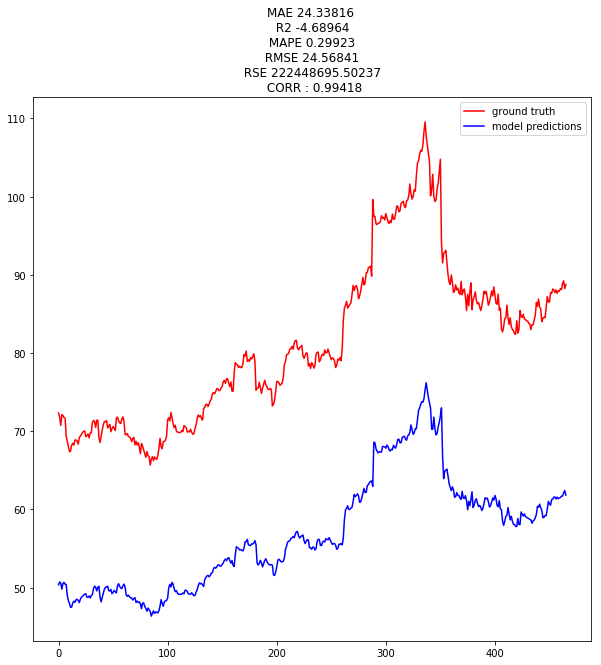

MAE 0.5936
R2 0.9669
RMSE 0.9020
[1.4348859] -0.5202255




Plot, with Optimizer.
(466,) (466,)


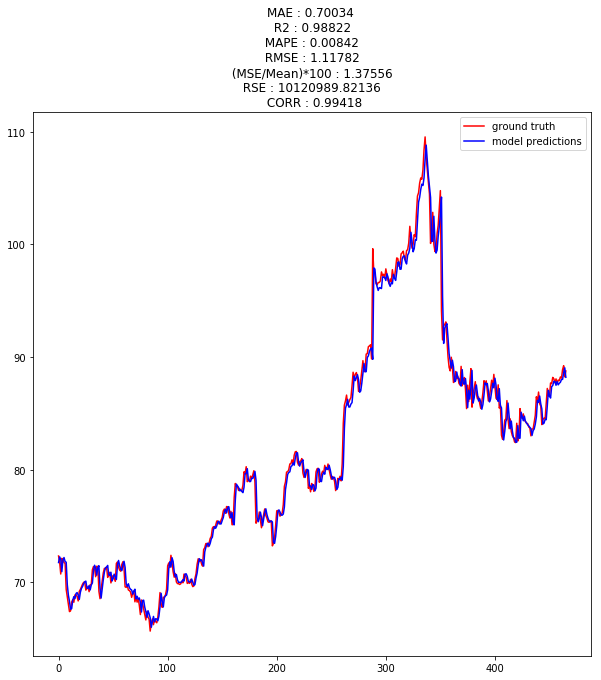

Done saving the results


[0.7003384986001205, 0.9882220054938509, 1.117815494195178, 1.3755589288448073]

In [8]:
results_collect(model_version="M3V1",dataset_name="WMT",callback_min_delta=0.05,patience_value=80,epoch_cnt=100, optim = Adam(0.001))

In [ ]:
results_collect(model_version="M3V1",dataset_name="AMZN",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M3V1",dataset_name="FB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M3V1",dataset_name="DNB",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

In [ ]:
results_collect(model_version="M3V1",dataset_name="PFE",callback_min_delta=0.05,patience_value=80,epoch_cnt=500, optim = Adam(0.001), multi = True)

# Wolfer Sunspot

In [ ]:
#Wolfer.
#lr = 0.0125, decay=0.00487
results_collect(model_version="M3V1",dataset_name="Wolfer",callback_min_delta=0.05,patience_value=80,epoch_cnt=200, optim = SGD(lr = 0.01345, decay=0.0045), timesteps = 15, frac = 0.8)

Create formatted data : (df shape) (289,)
Create time-stepped data : (d shape) (274, 15, 1)
Create formatted data :  (274, 7, 1) (274, 7, 1) (274,)
Dimensions of train and test :  (219, 7, 1)   (55, 7, 1)   (219,)   (55,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_149 (InputLayer)          (None, 7, 1)         0                                            
__________________________________________________________________________________________________
conv1d_237 (Conv1D)             (None, 3, 32)        192         input_149[0][0]                  
__________________________________________________________________________________________________
conv1d_238 (Conv1D)             (None, 2, 32)        2080        conv1d_237[0][0]                 
_______________________________________________________________

Create formatted data : (df shape) (289,)
Create time-stepped data : (d shape) (274, 15, 1)
Create formatted data :  (274, 7, 1) (274, 7, 1) (274,)
Dimensions of train and test :  (219, 7, 1)   (55, 7, 1)   (219,)   (55,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_67 (InputLayer)           (None, 7, 1)         0                                            
__________________________________________________________________________________________________
conv1d_83 (Conv1D)              (None, 3, 32)        192         input_67[0][0]                   
__________________________________________________________________________________________________
conv1d_84 (Conv1D)              (None, 2, 32)        2080        conv1d_83[0][0]                  
_______________________________________________________________

Epoch 11/200
219/219 [==============================] - 0s 735us/step - loss: 35.7292 - mean_absolute_error: 36.2256 - mean_squared_error: 2215.1064 - rmse: 46.6813 - val_loss: 58.4120 - val_mean_absolute_error: 58.8990 - val_mean_squared_error: 5840.7404 - val_rmse: 76.3131
Epoch 12/200
219/219 [==============================] - 0s 777us/step - loss: 37.3715 - mean_absolute_error: 37.8636 - mean_squared_error: 2908.1181 - rmse: 49.6662 - val_loss: 68.5797 - val_mean_absolute_error: 69.0797 - val_mean_squared_error: 7259.6300 - val_rmse: 85.0547
Epoch 13/200
219/219 [==============================] - 0s 759us/step - loss: 40.6832 - mean_absolute_error: 41.1809 - mean_squared_error: 2901.4135 - rmse: 53.3663 - val_loss: 61.6708 - val_mean_absolute_error: 62.1628 - val_mean_squared_error: 6311.6737 - val_rmse: 79.2605
Epoch 14/200
219/219 [==============================] - 0s 745us/step - loss: 38.2966 - mean_absolute_error: 38.7934 - mean_squared_error: 2648.1616 - rmse: 51.2349 - val_l

Epoch 41/200
219/219 [==============================] - 0s 790us/step - loss: 20.1241 - mean_absolute_error: 20.6124 - mean_squared_error: 1086.7635 - rmse: 29.6055 - val_loss: 16.8721 - val_mean_absolute_error: 17.3648 - val_mean_squared_error: 556.2348 - val_rmse: 23.4919
Epoch 42/200
219/219 [==============================] - 0s 738us/step - loss: 11.9934 - mean_absolute_error: 12.4864 - mean_squared_error: 325.6951 - rmse: 17.5825 - val_loss: 30.7390 - val_mean_absolute_error: 31.2340 - val_mean_squared_error: 1495.4411 - val_rmse: 38.4592
Epoch 43/200
219/219 [==============================] - 0s 753us/step - loss: 14.8030 - mean_absolute_error: 15.2956 - mean_squared_error: 486.4796 - rmse: 21.3061 - val_loss: 18.2654 - val_mean_absolute_error: 18.7484 - val_mean_squared_error: 580.3207 - val_rmse: 23.9421
Epoch 44/200
219/219 [==============================] - 0s 787us/step - loss: 14.1794 - mean_absolute_error: 14.6612 - mean_squared_error: 449.1662 - rmse: 20.8146 - val_loss: 

Epoch 71/200
219/219 [==============================] - 0s 706us/step - loss: 11.5194 - mean_absolute_error: 12.0005 - mean_squared_error: 302.0535 - rmse: 17.1086 - val_loss: 12.4186 - val_mean_absolute_error: 12.9102 - val_mean_squared_error: 270.5684 - val_rmse: 16.4296
Epoch 72/200
219/219 [==============================] - 0s 781us/step - loss: 11.6456 - mean_absolute_error: 12.1300 - mean_squared_error: 295.9314 - rmse: 16.8469 - val_loss: 17.7822 - val_mean_absolute_error: 18.2627 - val_mean_squared_error: 880.6255 - val_rmse: 29.6488
Epoch 73/200
219/219 [==============================] - 0s 751us/step - loss: 10.6414 - mean_absolute_error: 11.1271 - mean_squared_error: 244.7768 - rmse: 15.4904 - val_loss: 19.2572 - val_mean_absolute_error: 19.7523 - val_mean_squared_error: 614.6818 - val_rmse: 24.6797
Epoch 74/200
219/219 [==============================] - 0s 755us/step - loss: 11.0562 - mean_absolute_error: 11.5422 - mean_squared_error: 255.1705 - rmse: 15.8266 - val_loss: 12

Epoch 101/200
219/219 [==============================] - 0s 790us/step - loss: 8.2322 - mean_absolute_error: 8.7008 - mean_squared_error: 171.0064 - rmse: 12.8754 - val_loss: 10.1136 - val_mean_absolute_error: 10.6091 - val_mean_squared_error: 201.1722 - val_rmse: 14.1783
Epoch 102/200
219/219 [==============================] - 0s 771us/step - loss: 9.0599 - mean_absolute_error: 9.5441 - mean_squared_error: 190.2059 - rmse: 13.6350 - val_loss: 11.9853 - val_mean_absolute_error: 12.4675 - val_mean_squared_error: 283.1136 - val_rmse: 16.8211
Epoch 103/200
219/219 [==============================] - 0s 775us/step - loss: 9.4765 - mean_absolute_error: 9.9609 - mean_squared_error: 232.5754 - rmse: 14.7101 - val_loss: 11.0258 - val_mean_absolute_error: 11.5023 - val_mean_squared_error: 240.7739 - val_rmse: 15.5065
Epoch 104/200
219/219 [==============================] - 0s 762us/step - loss: 9.1302 - mean_absolute_error: 9.6123 - mean_squared_error: 187.3260 - rmse: 13.6163 - val_loss: 18.485

Epoch 131/200
219/219 [==============================] - 0s 780us/step - loss: 8.9666 - mean_absolute_error: 9.4470 - mean_squared_error: 185.1387 - rmse: 13.2977 - val_loss: 14.7748 - val_mean_absolute_error: 15.2626 - val_mean_squared_error: 421.9800 - val_rmse: 20.5156
Epoch 132/200
219/219 [==============================] - 0s 745us/step - loss: 9.6582 - mean_absolute_error: 10.1441 - mean_squared_error: 221.2232 - rmse: 14.6646 - val_loss: 15.6107 - val_mean_absolute_error: 16.1085 - val_mean_squared_error: 423.5396 - val_rmse: 20.5072
Epoch 133/200
219/219 [==============================] - 0s 751us/step - loss: 8.6432 - mean_absolute_error: 9.1260 - mean_squared_error: 170.0296 - rmse: 12.9165 - val_loss: 10.6679 - val_mean_absolute_error: 11.1438 - val_mean_squared_error: 228.2874 - val_rmse: 15.0957
Epoch 134/200
219/219 [==============================] - 0s 779us/step - loss: 9.1721 - mean_absolute_error: 9.6598 - mean_squared_error: 186.7819 - rmse: 13.5992 - val_loss: 10.13

219/219 [==============================] - 0s 715us/step - loss: 8.9525 - mean_absolute_error: 9.4379 - mean_squared_error: 180.5845 - rmse: 13.1851 - val_loss: 10.9563 - val_mean_absolute_error: 11.4486 - val_mean_squared_error: 223.8395 - val_rmse: 14.9495
Epoch 162/200
219/219 [==============================] - 0s 792us/step - loss: 8.0897 - mean_absolute_error: 8.5812 - mean_squared_error: 151.4286 - rmse: 12.0933 - val_loss: 11.3909 - val_mean_absolute_error: 11.8809 - val_mean_squared_error: 247.4816 - val_rmse: 15.7112
Epoch 163/200
219/219 [==============================] - 0s 780us/step - loss: 8.1988 - mean_absolute_error: 8.6834 - mean_squared_error: 158.7460 - rmse: 12.3083 - val_loss: 10.5780 - val_mean_absolute_error: 11.0583 - val_mean_squared_error: 219.0264 - val_rmse: 14.7781
Epoch 164/200
219/219 [==============================] - 0s 806us/step - loss: 8.5705 - mean_absolute_error: 9.0523 - mean_squared_error: 166.1776 - rmse: 12.8064 - val_loss: 10.6355 - val_mean_a

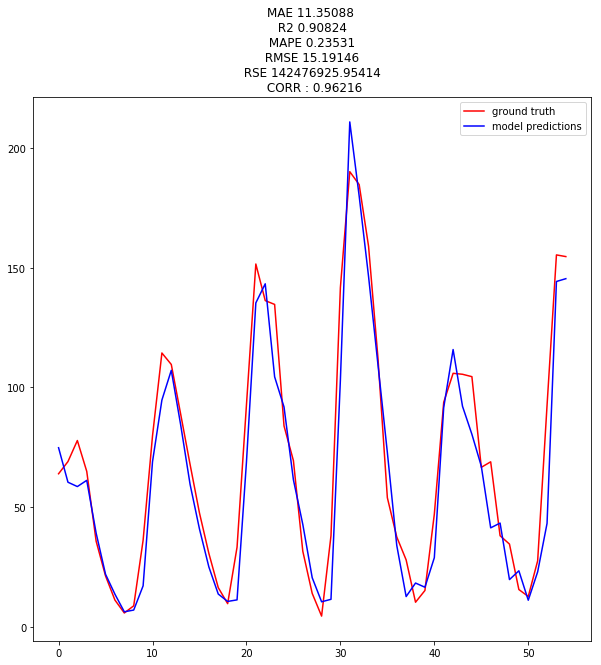

MAE 8.2269
R2 0.8512
RMSE 12.0018
[1.0044786] 3.7731514




Plot, with Optimizer.
(55,) (55,)


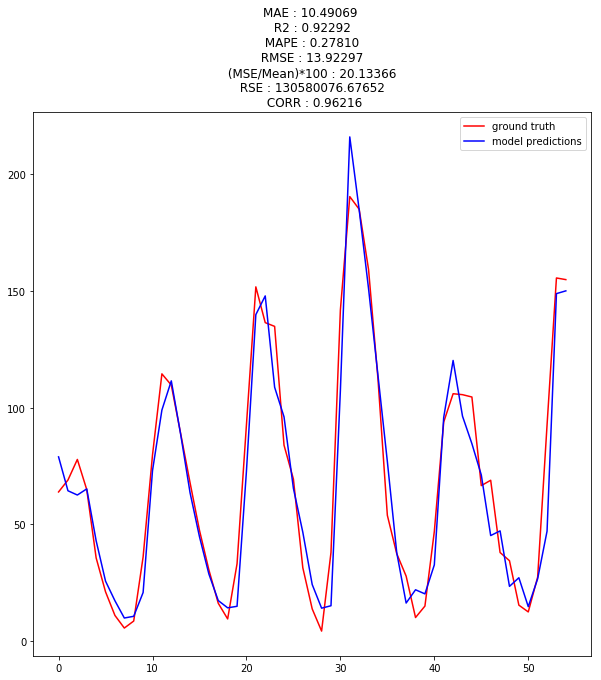

Done saving the results


[10.49068917014382, 0.9229227238325822, 13.92297401217638, 20.13365858625706]

In [38]:
#Wolfer.
#lr = 0.0125, decay=0.00487
results_collect(model_version="M3V1",dataset_name="Wolfer",callback_min_delta=0.05,patience_value=80,epoch_cnt=200, optim = SGD(lr = 0.01345, decay=0.0045), timesteps = 15, frac = 0.8)

Create formatted data : (df shape) (289,)
Create time-stepped data : (d shape) (274, 15, 1)
Create formatted data :  (274, 7, 1) (274, 7, 1) (274,)
Dimensions of train and test :  (219, 7, 1)   (55, 7, 1)   (219,)   (55,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_73 (InputLayer)           (None, 7, 1)         0                                            
__________________________________________________________________________________________________
conv1d_91 (Conv1D)              (None, 3, 32)        192         input_73[0][0]                   
__________________________________________________________________________________________________
conv1d_92 (Conv1D)              (None, 2, 32)        2080        conv1d_91[0][0]                  
_______________________________________________________________

Epoch 11/200
219/219 [==============================] - 0s 783us/step - loss: 39.1899 - mean_absolute_error: 39.6835 - mean_squared_error: 2653.4259 - rmse: 51.2039 - val_loss: 42.3842 - val_mean_absolute_error: 42.8842 - val_mean_squared_error: 3206.4422 - val_rmse: 56.6248
Epoch 12/200
219/219 [==============================] - 0s 788us/step - loss: 45.2911 - mean_absolute_error: 45.7887 - mean_squared_error: 5409.6172 - rmse: 61.4423 - val_loss: 63.4122 - val_mean_absolute_error: 63.9060 - val_mean_squared_error: 6733.5778 - val_rmse: 81.9201
Epoch 13/200
219/219 [==============================] - 0s 856us/step - loss: 36.8063 - mean_absolute_error: 37.3018 - mean_squared_error: 2372.4431 - rmse: 48.2597 - val_loss: 56.4928 - val_mean_absolute_error: 56.9928 - val_mean_squared_error: 5564.7051 - val_rmse: 74.4755
Epoch 14/200
219/219 [==============================] - 0s 777us/step - loss: 33.4870 - mean_absolute_error: 33.9825 - mean_squared_error: 2026.4817 - rmse: 44.9660 - val_l

Epoch 41/200
219/219 [==============================] - 0s 640us/step - loss: 12.4369 - mean_absolute_error: 12.9268 - mean_squared_error: 365.4660 - rmse: 18.0615 - val_loss: 15.9610 - val_mean_absolute_error: 16.4598 - val_mean_squared_error: 447.8727 - val_rmse: 21.1135
Epoch 42/200
219/219 [==============================] - 0s 695us/step - loss: 18.0517 - mean_absolute_error: 18.5421 - mean_squared_error: 688.4047 - rmse: 24.9684 - val_loss: 13.9767 - val_mean_absolute_error: 14.4766 - val_mean_squared_error: 413.6051 - val_rmse: 20.2942
Epoch 43/200
219/219 [==============================] - 0s 749us/step - loss: 12.9827 - mean_absolute_error: 13.4733 - mean_squared_error: 422.9929 - rmse: 19.4795 - val_loss: 14.7610 - val_mean_absolute_error: 15.2610 - val_mean_squared_error: 388.2581 - val_rmse: 19.5980
Epoch 44/200
219/219 [==============================] - 0s 703us/step - loss: 16.5413 - mean_absolute_error: 17.0276 - mean_squared_error: 539.9444 - rmse: 22.5726 - val_loss: 15

Epoch 71/200
219/219 [==============================] - 0s 752us/step - loss: 10.4830 - mean_absolute_error: 10.9645 - mean_squared_error: 243.8202 - rmse: 15.2548 - val_loss: 22.1072 - val_mean_absolute_error: 22.6039 - val_mean_squared_error: 842.5568 - val_rmse: 28.9348
Epoch 72/200
219/219 [==============================] - 0s 768us/step - loss: 11.3153 - mean_absolute_error: 11.8057 - mean_squared_error: 318.0981 - rmse: 16.6715 - val_loss: 13.6859 - val_mean_absolute_error: 14.1709 - val_mean_squared_error: 348.3920 - val_rmse: 18.6557
Epoch 73/200
219/219 [==============================] - 0s 736us/step - loss: 10.9477 - mean_absolute_error: 11.4253 - mean_squared_error: 298.3105 - rmse: 16.6315 - val_loss: 15.0697 - val_mean_absolute_error: 15.5682 - val_mean_squared_error: 407.8798 - val_rmse: 20.1443
Epoch 74/200
219/219 [==============================] - 0s 772us/step - loss: 10.4890 - mean_absolute_error: 10.9743 - mean_squared_error: 249.5458 - rmse: 15.6551 - val_loss: 13

Epoch 101/200
219/219 [==============================] - 0s 768us/step - loss: 9.8065 - mean_absolute_error: 10.2863 - mean_squared_error: 227.5308 - rmse: 14.4864 - val_loss: 13.5417 - val_mean_absolute_error: 14.0373 - val_mean_squared_error: 330.2716 - val_rmse: 18.1329
Epoch 102/200
219/219 [==============================] - 0s 750us/step - loss: 9.0409 - mean_absolute_error: 9.5274 - mean_squared_error: 185.8821 - rmse: 13.4678 - val_loss: 10.3985 - val_mean_absolute_error: 10.8920 - val_mean_squared_error: 223.2237 - val_rmse: 14.9406
Epoch 103/200
219/219 [==============================] - 0s 795us/step - loss: 10.3852 - mean_absolute_error: 10.8694 - mean_squared_error: 256.2810 - rmse: 15.4939 - val_loss: 12.8233 - val_mean_absolute_error: 13.3089 - val_mean_squared_error: 332.5357 - val_rmse: 18.2305
Epoch 104/200
219/219 [==============================] - 0s 778us/step - loss: 8.9301 - mean_absolute_error: 9.4107 - mean_squared_error: 184.8090 - rmse: 13.4924 - val_loss: 12.

Epoch 131/200
219/219 [==============================] - 0s 734us/step - loss: 8.8675 - mean_absolute_error: 9.3488 - mean_squared_error: 187.5200 - rmse: 13.5323 - val_loss: 11.5678 - val_mean_absolute_error: 12.0668 - val_mean_squared_error: 238.6723 - val_rmse: 15.4348
Epoch 132/200
219/219 [==============================] - 0s 758us/step - loss: 8.3246 - mean_absolute_error: 8.8086 - mean_squared_error: 166.6005 - rmse: 12.7124 - val_loss: 11.0842 - val_mean_absolute_error: 11.5763 - val_mean_squared_error: 237.1433 - val_rmse: 15.3875
Epoch 133/200
219/219 [==============================] - 0s 744us/step - loss: 9.1333 - mean_absolute_error: 9.6101 - mean_squared_error: 200.4771 - rmse: 14.0035 - val_loss: 12.6781 - val_mean_absolute_error: 13.1609 - val_mean_squared_error: 292.6876 - val_rmse: 17.0792
Epoch 134/200
219/219 [==============================] - 0s 812us/step - loss: 8.0821 - mean_absolute_error: 8.5639 - mean_squared_error: 170.7793 - rmse: 12.6225 - val_loss: 10.320

219/219 [==============================] - 0s 751us/step - loss: 9.2918 - mean_absolute_error: 9.7703 - mean_squared_error: 207.6847 - rmse: 13.9608 - val_loss: 9.9484 - val_mean_absolute_error: 10.4317 - val_mean_squared_error: 198.0454 - val_rmse: 14.0681
Epoch 162/200
219/219 [==============================] - 0s 798us/step - loss: 8.0205 - mean_absolute_error: 8.4999 - mean_squared_error: 169.3764 - rmse: 12.4535 - val_loss: 10.3648 - val_mean_absolute_error: 10.8378 - val_mean_squared_error: 207.8374 - val_rmse: 14.4054
Epoch 163/200
219/219 [==============================] - 0s 745us/step - loss: 7.7509 - mean_absolute_error: 8.2275 - mean_squared_error: 145.2986 - rmse: 11.8463 - val_loss: 10.1872 - val_mean_absolute_error: 10.6672 - val_mean_squared_error: 200.3551 - val_rmse: 14.1473
Epoch 164/200
219/219 [==============================] - 0s 784us/step - loss: 7.9275 - mean_absolute_error: 8.4139 - mean_squared_error: 152.5268 - rmse: 12.1624 - val_loss: 10.6638 - val_mean_ab

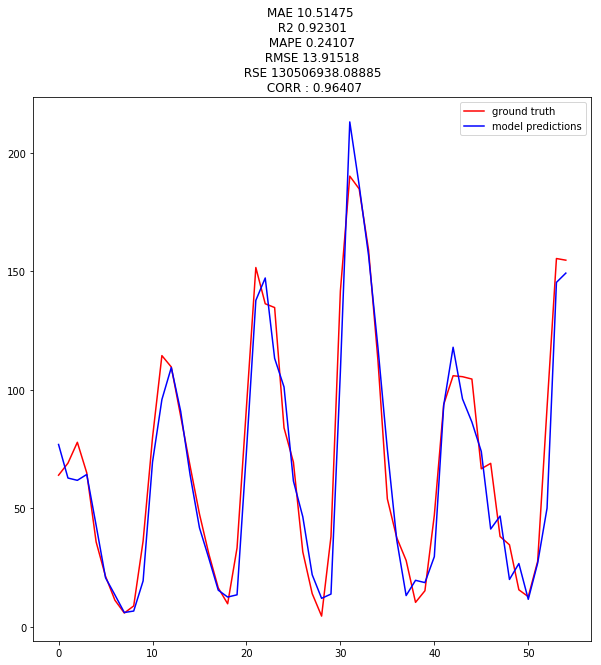

MAE 8.3769
R2 0.8538
RMSE 11.8985
[0.9714961] 3.2945824




Plot, with Optimizer.
(55,) (55,)


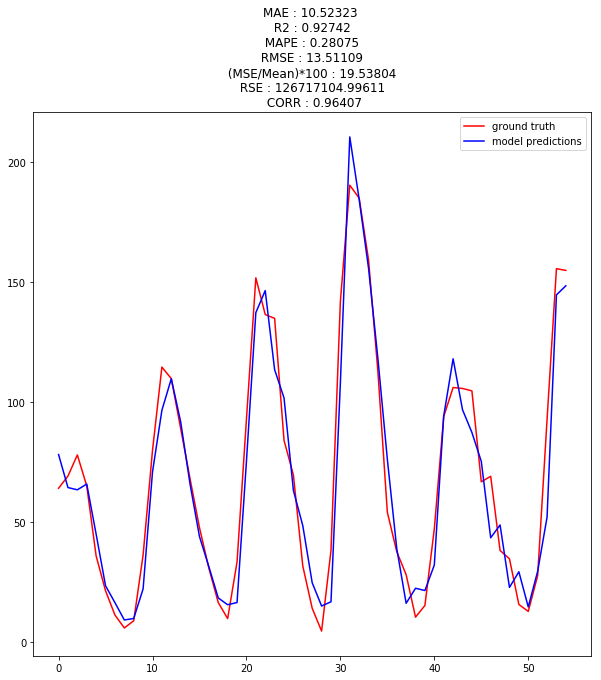

Done saving the results


[10.523231475136493, 0.9274156478458839, 13.511088403858524, 19.53804128443548]

In [41]:
#Wolfer.
#lr = 0.0125, decay=0.00487
results_collect(model_version="M3V1",dataset_name="Wolfer",callback_min_delta=0.05,patience_value=80,epoch_cnt=200, optim = SGD(lr = 0.0125, decay=0.00487), timesteps = 15, frac = 0.8)

Create formatted data : (df shape) (289,)
Create time-stepped data : (d shape) (268, 21, 1)
Create formatted data :  (268, 10, 1) (268, 10, 1) (268,)
Dimensions of train and test :  (214, 10, 1)   (54, 10, 1)   (214,)   (54,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_147 (InputLayer)          (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_148 (InputLayer)          (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_233 (Conv1D)             (None, 6, 32)        192         input_147[0][0]                  
___________________________________________________________

214/214 [==============================] - 0s 978us/step - loss: 13.6047 - mean_absolute_error: 14.0968 - mean_squared_error: 390.4480 - rmse: 19.2568 - val_loss: 24.2914 - val_mean_absolute_error: 24.7907 - val_mean_squared_error: 1333.3537 - val_rmse: 36.2681
Epoch 11/200
214/214 [==============================] - 0s 982us/step - loss: 13.4180 - mean_absolute_error: 13.9139 - mean_squared_error: 409.9731 - rmse: 18.4395 - val_loss: 26.2073 - val_mean_absolute_error: 26.7053 - val_mean_squared_error: 1412.8082 - val_rmse: 37.3420
Epoch 12/200
214/214 [==============================] - 0s 969us/step - loss: 12.9050 - mean_absolute_error: 13.3957 - mean_squared_error: 395.8137 - rmse: 18.5036 - val_loss: 28.4148 - val_mean_absolute_error: 28.9058 - val_mean_squared_error: 1609.9987 - val_rmse: 39.8602
Epoch 13/200
214/214 [==============================] - 0s 905us/step - loss: 11.1895 - mean_absolute_error: 11.6853 - mean_squared_error: 276.8161 - rmse: 15.8791 - val_loss: 37.8932 - va

Epoch 40/200
214/214 [==============================] - 0s 968us/step - loss: 11.6520 - mean_absolute_error: 12.1386 - mean_squared_error: 299.9596 - rmse: 16.6963 - val_loss: 35.7376 - val_mean_absolute_error: 36.2376 - val_mean_squared_error: 2383.5546 - val_rmse: 48.4476
Epoch 41/200
214/214 [==============================] - 0s 1ms/step - loss: 13.1278 - mean_absolute_error: 13.6144 - mean_squared_error: 369.5221 - rmse: 18.8565 - val_loss: 22.5926 - val_mean_absolute_error: 23.0758 - val_mean_squared_error: 821.2882 - val_rmse: 28.3243
Epoch 42/200
214/214 [==============================] - 0s 912us/step - loss: 10.4478 - mean_absolute_error: 10.9348 - mean_squared_error: 244.8339 - rmse: 15.0186 - val_loss: 33.6516 - val_mean_absolute_error: 34.1359 - val_mean_squared_error: 2100.4279 - val_rmse: 45.4992
Epoch 43/200
214/214 [==============================] - 0s 986us/step - loss: 9.6008 - mean_absolute_error: 10.0795 - mean_squared_error: 206.5551 - rmse: 14.0353 - val_loss: 40.

Epoch 70/200
214/214 [==============================] - 0s 982us/step - loss: 9.5965 - mean_absolute_error: 10.0697 - mean_squared_error: 239.6258 - rmse: 13.7659 - val_loss: 24.3727 - val_mean_absolute_error: 24.8714 - val_mean_squared_error: 1144.9470 - val_rmse: 33.6551
Epoch 71/200
214/214 [==============================] - 0s 952us/step - loss: 10.4747 - mean_absolute_error: 10.9541 - mean_squared_error: 275.5970 - rmse: 15.1172 - val_loss: 18.9733 - val_mean_absolute_error: 19.4549 - val_mean_squared_error: 680.4358 - val_rmse: 25.9000
Epoch 72/200
214/214 [==============================] - 0s 981us/step - loss: 9.5460 - mean_absolute_error: 10.0315 - mean_squared_error: 197.5532 - rmse: 13.8547 - val_loss: 17.6603 - val_mean_absolute_error: 18.1485 - val_mean_squared_error: 660.6355 - val_rmse: 25.5526
Epoch 73/200
214/214 [==============================] - 0s 988us/step - loss: 9.8040 - mean_absolute_error: 10.2868 - mean_squared_error: 228.3295 - rmse: 14.0740 - val_loss: 26.8

214/214 [==============================] - 0s 957us/step - loss: 9.5043 - mean_absolute_error: 9.9803 - mean_squared_error: 210.6965 - rmse: 13.8578 - val_loss: 22.1363 - val_mean_absolute_error: 22.6277 - val_mean_squared_error: 829.0634 - val_rmse: 28.5981
Epoch 101/200
214/214 [==============================] - 0s 976us/step - loss: 9.4236 - mean_absolute_error: 9.9001 - mean_squared_error: 229.3694 - rmse: 14.0144 - val_loss: 28.7945 - val_mean_absolute_error: 29.2945 - val_mean_squared_error: 1571.9603 - val_rmse: 39.4051
Epoch 102/200
214/214 [==============================] - 0s 954us/step - loss: 8.8761 - mean_absolute_error: 9.3564 - mean_squared_error: 180.9639 - rmse: 12.7608 - val_loss: 17.3433 - val_mean_absolute_error: 17.8413 - val_mean_squared_error: 589.2597 - val_rmse: 24.0941
Epoch 103/200
214/214 [==============================] - 0s 1ms/step - loss: 10.4068 - mean_absolute_error: 10.8903 - mean_squared_error: 235.1556 - rmse: 14.5858 - val_loss: 26.4809 - val_mean_

Epoch 130/200
214/214 [==============================] - 0s 975us/step - loss: 5.1755 - mean_absolute_error: 5.6511 - mean_squared_error: 74.7325 - rmse: 8.2577 - val_loss: 14.2166 - val_mean_absolute_error: 14.7065 - val_mean_squared_error: 371.0185 - val_rmse: 18.5236
Epoch 131/200
214/214 [==============================] - 0s 976us/step - loss: 9.3098 - mean_absolute_error: 9.7787 - mean_squared_error: 249.3382 - rmse: 14.5912 - val_loss: 24.1401 - val_mean_absolute_error: 24.6375 - val_mean_squared_error: 1077.1743 - val_rmse: 32.6447
Epoch 132/200
214/214 [==============================] - 0s 947us/step - loss: 9.2666 - mean_absolute_error: 9.7399 - mean_squared_error: 229.7483 - rmse: 13.5342 - val_loss: 24.1977 - val_mean_absolute_error: 24.6976 - val_mean_squared_error: 1096.9617 - val_rmse: 32.9359
Epoch 133/200
214/214 [==============================] - 0s 950us/step - loss: 7.9750 - mean_absolute_error: 8.4395 - mean_squared_error: 186.3099 - rmse: 12.9756 - val_loss: 19.854

214/214 [==============================] - 0s 1ms/step - loss: 8.5904 - mean_absolute_error: 9.0694 - mean_squared_error: 175.7684 - rmse: 12.9438 - val_loss: 26.0085 - val_mean_absolute_error: 26.4999 - val_mean_squared_error: 1229.6667 - val_rmse: 34.8828
Epoch 161/200
214/214 [==============================] - 0s 971us/step - loss: 8.8943 - mean_absolute_error: 9.3706 - mean_squared_error: 198.9913 - rmse: 13.0138 - val_loss: 27.7509 - val_mean_absolute_error: 28.2509 - val_mean_squared_error: 1423.6492 - val_rmse: 37.5119
Epoch 162/200
214/214 [==============================] - 0s 973us/step - loss: 9.3830 - mean_absolute_error: 9.8563 - mean_squared_error: 216.8507 - rmse: 14.2119 - val_loss: 26.6134 - val_mean_absolute_error: 27.1118 - val_mean_squared_error: 1244.3470 - val_rmse: 35.0795
Epoch 163/200
214/214 [==============================] - 0s 986us/step - loss: 6.0092 - mean_absolute_error: 6.4797 - mean_squared_error: 87.7163 - rmse: 8.8744 - val_loss: 21.0329 - val_mean_ab

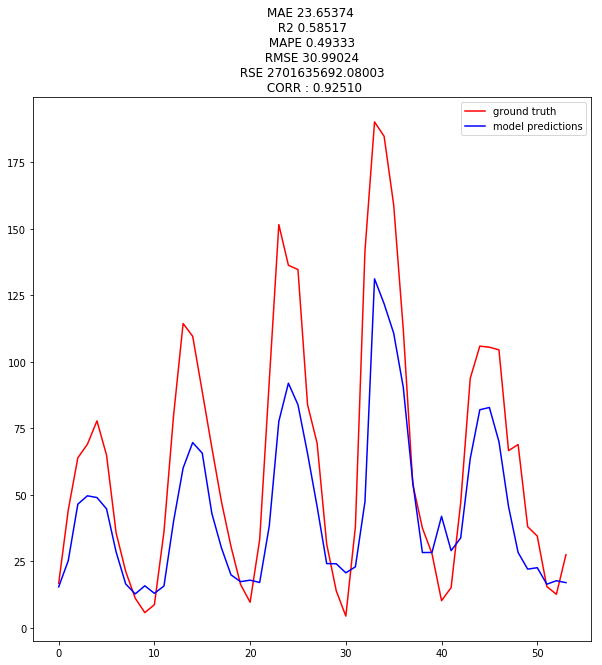

MAE 11.0090
R2 0.8002
RMSE 14.2407
[1.5562993] -3.8452988




Plot, with Optimizer.
(54,) (54,)


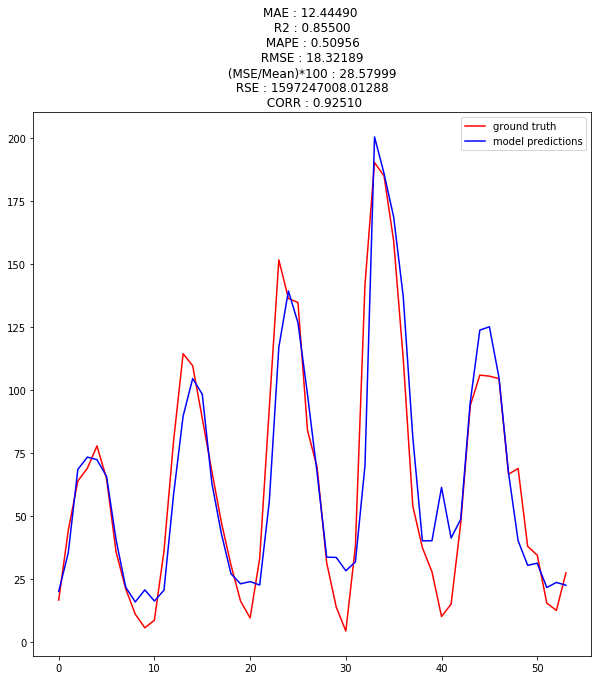

Done saving the results


[12.444902949863009, 0.8550011780278353, 18.32189142780623, 28.579991250261028]

In [78]:
results_collect(model_version="M1V1",dataset_name="Wolfer",callback_min_delta=0.05,patience_value=300,epoch_cnt=200, optim = SGD(lr = 0.00255), timesteps = 21, frac = 0.8)

Create formatted data : (df shape) (289,)
Create time-stepped data : (d shape) (274, 15, 1)
Create formatted data :  (274, 7, 1) (274, 7, 1) (274,)
Dimensions of train and test :  (219, 7, 1)   (55, 7, 1)   (219,)   (55,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_77 (InputLayer)           (None, 7, 1)         0                                            
__________________________________________________________________________________________________
input_78 (InputLayer)           (None, 7, 1)         0                                            
__________________________________________________________________________________________________
conv1d_97 (Conv1D)              (None, 3, 32)        192         input_77[0][0]                   
_______________________________________________________________

Epoch 12/600
219/219 [==============================] - 0s 391us/step - loss: 8.6737 - mean_absolute_error: 9.1615 - mean_squared_error: 162.1683 - rmse: 12.4113 - val_loss: 34.5101 - val_mean_absolute_error: 35.0056 - val_mean_squared_error: 2419.2610 - val_rmse: 49.1783
Epoch 13/600
219/219 [==============================] - 0s 327us/step - loss: 8.8876 - mean_absolute_error: 9.3740 - mean_squared_error: 165.1760 - rmse: 12.5793 - val_loss: 34.5435 - val_mean_absolute_error: 35.0307 - val_mean_squared_error: 2392.4899 - val_rmse: 48.9055
Epoch 14/600
219/219 [==============================] - 0s 354us/step - loss: 7.6558 - mean_absolute_error: 8.1433 - mean_squared_error: 119.7074 - rmse: 10.7022 - val_loss: 32.8113 - val_mean_absolute_error: 33.3100 - val_mean_squared_error: 2180.8890 - val_rmse: 46.6881
Epoch 15/600
219/219 [==============================] - 0s 360us/step - loss: 9.3353 - mean_absolute_error: 9.8131 - mean_squared_error: 198.1054 - rmse: 13.6806 - val_loss: 46.7185

219/219 [==============================] - 0s 335us/step - loss: 10.0655 - mean_absolute_error: 10.5541 - mean_squared_error: 231.1448 - rmse: 14.1452 - val_loss: 32.7804 - val_mean_absolute_error: 33.2698 - val_mean_squared_error: 2014.1637 - val_rmse: 44.8790
Epoch 43/600
219/219 [==============================] - 0s 325us/step - loss: 6.8625 - mean_absolute_error: 7.3399 - mean_squared_error: 106.9374 - rmse: 10.1505 - val_loss: 29.2551 - val_mean_absolute_error: 29.7504 - val_mean_squared_error: 1683.3207 - val_rmse: 41.0206
Epoch 44/600
219/219 [==============================] - 0s 344us/step - loss: 7.6610 - mean_absolute_error: 8.1507 - mean_squared_error: 129.8748 - rmse: 11.0220 - val_loss: 38.5618 - val_mean_absolute_error: 39.0515 - val_mean_squared_error: 2706.2226 - val_rmse: 52.0141
Epoch 45/600
219/219 [==============================] - 0s 307us/step - loss: 6.5248 - mean_absolute_error: 7.0072 - mean_squared_error: 103.5596 - rmse: 9.6736 - val_loss: 27.6245 - val_mean_

219/219 [==============================] - 0s 358us/step - loss: 6.5405 - mean_absolute_error: 7.0213 - mean_squared_error: 95.3693 - rmse: 9.6460 - val_loss: 30.7956 - val_mean_absolute_error: 31.2935 - val_mean_squared_error: 1807.4127 - val_rmse: 42.5136
Epoch 103/600
219/219 [==============================] - 0s 379us/step - loss: 7.5350 - mean_absolute_error: 8.0174 - mean_squared_error: 133.6132 - rmse: 11.1093 - val_loss: 36.1703 - val_mean_absolute_error: 36.6620 - val_mean_squared_error: 2416.9330 - val_rmse: 49.1580
Epoch 104/600
219/219 [==============================] - 0s 364us/step - loss: 5.9374 - mean_absolute_error: 6.4148 - mean_squared_error: 81.0481 - rmse: 8.9621 - val_loss: 36.6377 - val_mean_absolute_error: 37.1229 - val_mean_squared_error: 2434.6347 - val_rmse: 49.3358
Epoch 105/600
219/219 [==============================] - 0s 337us/step - loss: 7.6879 - mean_absolute_error: 8.1705 - mean_squared_error: 126.0850 - rmse: 10.8206 - val_loss: 37.0859 - val_mean_ab

219/219 [==============================] - 0s 380us/step - loss: 4.7717 - mean_absolute_error: 5.2473 - mean_squared_error: 59.2239 - rmse: 7.5474 - val_loss: 31.3335 - val_mean_absolute_error: 31.8335 - val_mean_squared_error: 1847.6801 - val_rmse: 42.9839
Epoch 163/600
219/219 [==============================] - 0s 364us/step - loss: 5.5927 - mean_absolute_error: 6.0712 - mean_squared_error: 82.6979 - rmse: 8.7587 - val_loss: 36.7410 - val_mean_absolute_error: 37.2280 - val_mean_squared_error: 2446.7011 - val_rmse: 49.4522
Epoch 164/600
219/219 [==============================] - 0s 353us/step - loss: 6.0945 - mean_absolute_error: 6.5753 - mean_squared_error: 85.4085 - rmse: 9.1130 - val_loss: 38.6859 - val_mean_absolute_error: 39.1832 - val_mean_squared_error: 2691.7963 - val_rmse: 51.8677
Epoch 165/600
219/219 [==============================] - 0s 350us/step - loss: 7.0255 - mean_absolute_error: 7.5078 - mean_squared_error: 121.0461 - rmse: 10.6543 - val_loss: 34.2913 - val_mean_abso

219/219 [==============================] - 0s 360us/step - loss: 4.6903 - mean_absolute_error: 5.1582 - mean_squared_error: 54.8458 - rmse: 7.2188 - val_loss: 28.0323 - val_mean_absolute_error: 28.5300 - val_mean_squared_error: 1483.9555 - val_rmse: 38.5221
Epoch 223/600
219/219 [==============================] - 0s 360us/step - loss: 6.0883 - mean_absolute_error: 6.5611 - mean_squared_error: 99.4036 - rmse: 9.5333 - val_loss: 38.3347 - val_mean_absolute_error: 38.8220 - val_mean_squared_error: 2547.0659 - val_rmse: 50.4449
Epoch 224/600
219/219 [==============================] - 0s 370us/step - loss: 5.7868 - mean_absolute_error: 6.2664 - mean_squared_error: 80.3749 - rmse: 8.5447 - val_loss: 35.8836 - val_mean_absolute_error: 36.3653 - val_mean_squared_error: 2282.4723 - val_rmse: 47.7618
Epoch 225/600
219/219 [==============================] - 0s 375us/step - loss: 6.3633 - mean_absolute_error: 6.8430 - mean_squared_error: 89.6661 - rmse: 9.2861 - val_loss: 31.6374 - val_mean_absolu

219/219 [==============================] - 0s 342us/step - loss: 4.3044 - mean_absolute_error: 4.7701 - mean_squared_error: 44.5178 - rmse: 6.5509 - val_loss: 32.8956 - val_mean_absolute_error: 33.3950 - val_mean_squared_error: 1990.0643 - val_rmse: 44.6032
Epoch 283/600
219/219 [==============================] - 0s 329us/step - loss: 5.5135 - mean_absolute_error: 5.9824 - mean_squared_error: 72.7064 - rmse: 8.4485 - val_loss: 29.4638 - val_mean_absolute_error: 29.9568 - val_mean_squared_error: 1630.5469 - val_rmse: 40.3782
Epoch 284/600
219/219 [==============================] - 0s 323us/step - loss: 5.5230 - mean_absolute_error: 5.9958 - mean_squared_error: 70.6634 - rmse: 8.3240 - val_loss: 33.4741 - val_mean_absolute_error: 33.9659 - val_mean_squared_error: 2024.7358 - val_rmse: 44.9880
Epoch 285/600
219/219 [==============================] - 0s 345us/step - loss: 5.1433 - mean_absolute_error: 5.6189 - mean_squared_error: 71.8765 - rmse: 7.9074 - val_loss: 33.7991 - val_mean_absolu

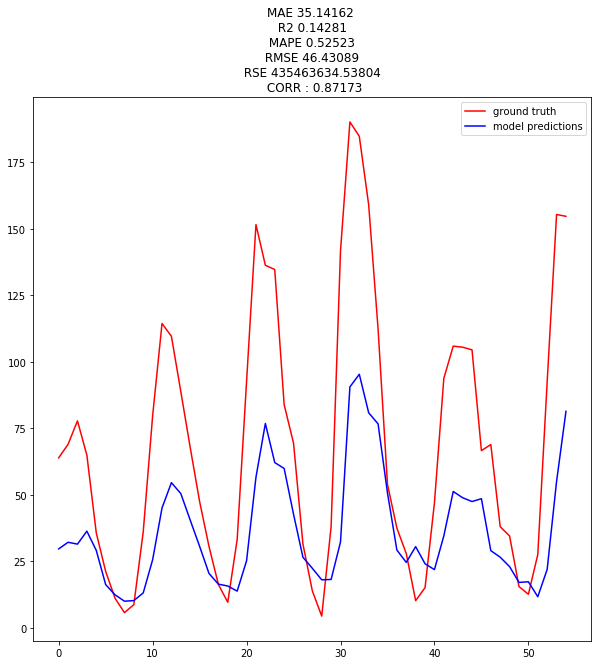

MAE 13.4379
R2 0.7156
RMSE 16.5928
[1.9729481] -2.5212364




Plot, with Optimizer.
(55,) (55,)


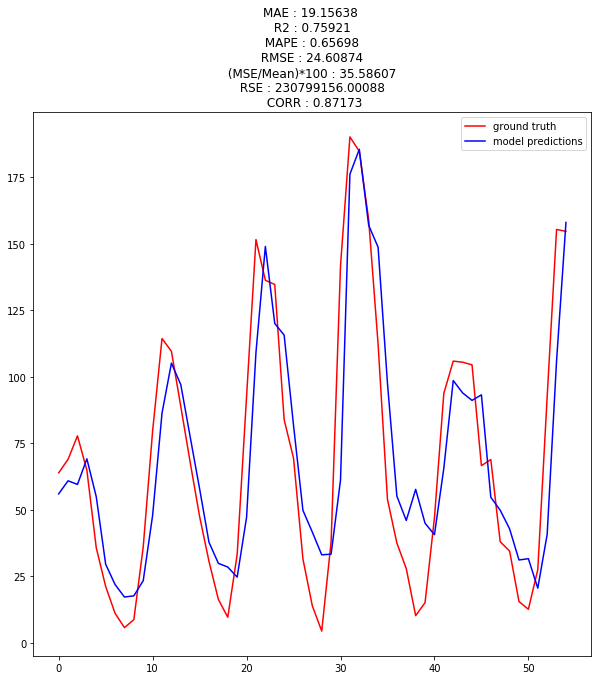

Done saving the results


[19.156379345980557, 0.7592086105151595, 24.608736132027868, 35.58606739395101]

In [43]:
#Wolfer.
results_collect(model_version="M1V2",dataset_name="Wolfer",callback_min_delta=0.05,patience_value=80,epoch_cnt=600, optim = SGD(lr = 0.001, decay = 0.0001), timesteps = 15, frac = 0.8)

Create formatted data : (df shape) (289,)
Create time-stepped data : (d shape) (274, 15, 1)
Create formatted data :  (274, 7, 1) (274, 7, 1) (274,)
Dimensions of train and test :  (219, 7, 1)   (55, 7, 1)   (219,)   (55,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_79 (InputLayer)           (None, 7, 1)         0                                            
__________________________________________________________________________________________________
input_80 (InputLayer)           (None, 7, 1)         0                                            
__________________________________________________________________________________________________
conv1d_101 (Conv1D)             (None, 3, 32)        192         input_79[0][0]                   
_______________________________________________________________

219/219 [==============================] - 0s 773us/step - loss: 7.6301 - mean_absolute_error: 8.1116 - mean_squared_error: 136.1147 - rmse: 11.2415 - val_loss: 35.0208 - val_mean_absolute_error: 35.5153 - val_mean_squared_error: 2398.8104 - val_rmse: 48.9738
Epoch 39/600
219/219 [==============================] - 0s 739us/step - loss: 7.1368 - mean_absolute_error: 7.6106 - mean_squared_error: 118.0149 - rmse: 10.5544 - val_loss: 38.9930 - val_mean_absolute_error: 39.4780 - val_mean_squared_error: 2911.4327 - val_rmse: 53.9566
Epoch 40/600
219/219 [==============================] - 0s 749us/step - loss: 7.9770 - mean_absolute_error: 8.4548 - mean_squared_error: 148.9001 - rmse: 11.6289 - val_loss: 33.6222 - val_mean_absolute_error: 34.1184 - val_mean_squared_error: 2218.0164 - val_rmse: 47.0874
Epoch 41/600
219/219 [==============================] - 0s 751us/step - loss: 7.7623 - mean_absolute_error: 8.2487 - mean_squared_error: 145.0343 - rmse: 11.3610 - val_loss: 32.8733 - val_mean_a

219/219 [==============================] - 0s 777us/step - loss: 8.3493 - mean_absolute_error: 8.8285 - mean_squared_error: 145.7788 - rmse: 11.8696 - val_loss: 40.7085 - val_mean_absolute_error: 41.2016 - val_mean_squared_error: 2897.3691 - val_rmse: 53.8126
Epoch 99/600
219/219 [==============================] - 0s 808us/step - loss: 7.3282 - mean_absolute_error: 7.8064 - mean_squared_error: 119.1267 - rmse: 10.5969 - val_loss: 30.4637 - val_mean_absolute_error: 30.9554 - val_mean_squared_error: 1827.4754 - val_rmse: 42.7468
Epoch 100/600
219/219 [==============================] - 0s 844us/step - loss: 6.7149 - mean_absolute_error: 7.1924 - mean_squared_error: 102.6385 - rmse: 9.8664 - val_loss: 29.8321 - val_mean_absolute_error: 30.3286 - val_mean_squared_error: 1773.3009 - val_rmse: 42.1071
Epoch 101/600
219/219 [==============================] - 0s 828us/step - loss: 6.4720 - mean_absolute_error: 6.9477 - mean_squared_error: 94.1101 - rmse: 9.5040 - val_loss: 34.8416 - val_mean_ab

219/219 [==============================] - 0s 812us/step - loss: 6.4604 - mean_absolute_error: 6.9352 - mean_squared_error: 103.4222 - rmse: 9.6314 - val_loss: 26.8331 - val_mean_absolute_error: 27.3308 - val_mean_squared_error: 1396.6464 - val_rmse: 37.3557
Epoch 159/600
219/219 [==============================] - 0s 776us/step - loss: 7.5178 - mean_absolute_error: 7.9938 - mean_squared_error: 119.1555 - rmse: 10.8226 - val_loss: 33.5918 - val_mean_absolute_error: 34.0728 - val_mean_squared_error: 2134.1074 - val_rmse: 46.1958
Epoch 160/600
219/219 [==============================] - 0s 832us/step - loss: 6.6056 - mean_absolute_error: 7.0854 - mean_squared_error: 112.7824 - rmse: 9.6739 - val_loss: 30.4615 - val_mean_absolute_error: 30.9501 - val_mean_squared_error: 1818.2653 - val_rmse: 42.6404
Epoch 161/600
219/219 [==============================] - 0s 849us/step - loss: 5.7942 - mean_absolute_error: 6.2705 - mean_squared_error: 84.9165 - rmse: 8.8009 - val_loss: 26.3163 - val_mean_ab

219/219 [==============================] - 0s 816us/step - loss: 5.1071 - mean_absolute_error: 5.5798 - mean_squared_error: 68.5474 - rmse: 7.9314 - val_loss: 35.9973 - val_mean_absolute_error: 36.4882 - val_mean_squared_error: 2366.3781 - val_rmse: 48.6357
Epoch 219/600
219/219 [==============================] - 0s 806us/step - loss: 5.9993 - mean_absolute_error: 6.4711 - mean_squared_error: 82.2051 - rmse: 8.9503 - val_loss: 34.5923 - val_mean_absolute_error: 35.0870 - val_mean_squared_error: 2248.6906 - val_rmse: 47.4143
Epoch 220/600
219/219 [==============================] - 0s 811us/step - loss: 6.0705 - mean_absolute_error: 6.5414 - mean_squared_error: 87.6069 - rmse: 8.8813 - val_loss: 27.8607 - val_mean_absolute_error: 28.3458 - val_mean_squared_error: 1538.1974 - val_rmse: 39.2175
Epoch 221/600
219/219 [==============================] - 0s 774us/step - loss: 6.4400 - mean_absolute_error: 6.9169 - mean_squared_error: 95.9866 - rmse: 9.4234 - val_loss: 35.1505 - val_mean_absolu

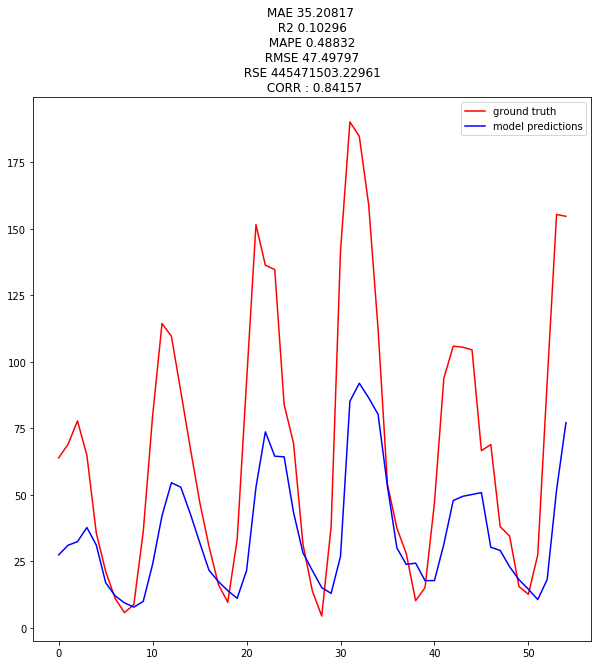

MAE 14.2203
R2 0.6827
RMSE 17.5271
[1.8978171] -0.11758423




Plot, with Optimizer.
(55,) (55,)


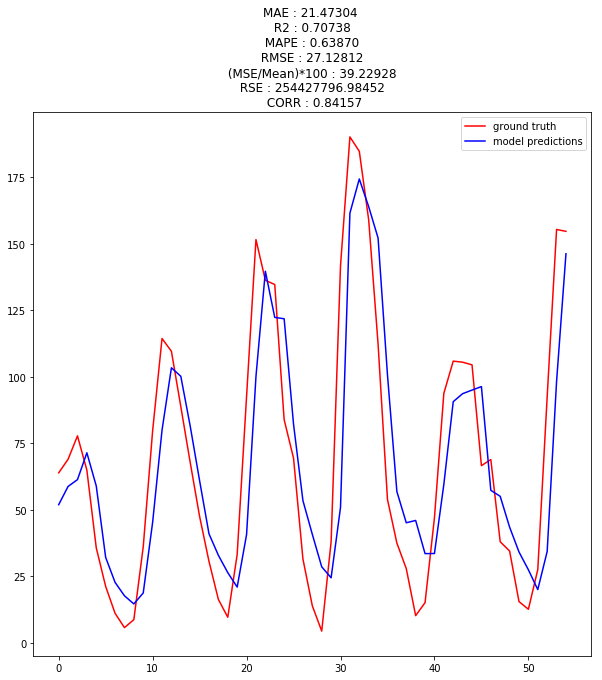

Done saving the results


[21.47304244648327, 0.7073815973883597, 27.12811705698498, 39.22928006873256]

In [44]:
#Wolfer.
results_collect(model_version="M2V1",dataset_name="Wolfer",callback_min_delta=0.05,patience_value=80,epoch_cnt=600, optim = SGD(lr = 0.001), timesteps = 15, frac = 0.8)

Create formatted data : (df shape) (289,)
Create time-stepped data : (d shape) (274, 15, 1)
Create formatted data :  (274, 7, 1) (274, 7, 1) (274,)
Dimensions of train and test :  (219, 7, 1)   (55, 7, 1)   (219,)   (55,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_81 (InputLayer)           (None, 7, 1)         0                                            
__________________________________________________________________________________________________
input_82 (InputLayer)           (None, 7, 1)         0                                            
__________________________________________________________________________________________________
lstm_69 (LSTM)                  (None, 7, 32)        4352        input_81[0][0]                   
_______________________________________________________________

Epoch 43/600
219/219 [==============================] - 0s 1ms/step - loss: 21.2579 - mean_absolute_error: 21.7529 - mean_squared_error: 817.8601 - rmse: 28.4694 - val_loss: 45.1939 - val_mean_absolute_error: 45.6928 - val_mean_squared_error: 3879.0353 - val_rmse: 62.1176
Epoch 44/600
219/219 [==============================] - 0s 1ms/step - loss: 20.6838 - mean_absolute_error: 21.1791 - mean_squared_error: 807.1214 - rmse: 28.0898 - val_loss: 43.9541 - val_mean_absolute_error: 44.4456 - val_mean_squared_error: 3708.8102 - val_rmse: 60.7380
Epoch 45/600
219/219 [==============================] - 0s 1ms/step - loss: 20.0985 - mean_absolute_error: 20.5976 - mean_squared_error: 765.9796 - rmse: 26.8140 - val_loss: 43.3242 - val_mean_absolute_error: 43.8069 - val_mean_squared_error: 3619.3330 - val_rmse: 60.0010
Epoch 46/600
219/219 [==============================] - 0s 1ms/step - loss: 19.3396 - mean_absolute_error: 19.8320 - mean_squared_error: 718.5205 - rmse: 26.6057 - val_loss: 43.5494

219/219 [==============================] - 0s 1ms/step - loss: 11.2925 - mean_absolute_error: 11.7829 - mean_squared_error: 286.0275 - rmse: 16.6151 - val_loss: 42.9002 - val_mean_absolute_error: 43.3963 - val_mean_squared_error: 3607.6841 - val_rmse: 59.9550
Epoch 74/600
219/219 [==============================] - 0s 1ms/step - loss: 10.6617 - mean_absolute_error: 11.1542 - mean_squared_error: 258.1060 - rmse: 15.7203 - val_loss: 46.8381 - val_mean_absolute_error: 47.3373 - val_mean_squared_error: 4100.4106 - val_rmse: 63.9318
Epoch 75/600
219/219 [==============================] - 0s 1ms/step - loss: 10.8013 - mean_absolute_error: 11.2879 - mean_squared_error: 265.3316 - rmse: 16.1010 - val_loss: 52.2929 - val_mean_absolute_error: 52.7899 - val_mean_squared_error: 4753.4131 - val_rmse: 68.8337
Epoch 76/600
219/219 [==============================] - 0s 1ms/step - loss: 9.6476 - mean_absolute_error: 10.1333 - mean_squared_error: 223.0759 - rmse: 14.5177 - val_loss: 51.8738 - val_mean_ab

219/219 [==============================] - 0s 1ms/step - loss: 8.6669 - mean_absolute_error: 9.1508 - mean_squared_error: 172.8231 - rmse: 12.7208 - val_loss: 49.0838 - val_mean_absolute_error: 49.5759 - val_mean_squared_error: 4182.0050 - val_rmse: 64.5637
Epoch 134/600
219/219 [==============================] - 0s 1ms/step - loss: 8.0010 - mean_absolute_error: 8.4770 - mean_squared_error: 153.1501 - rmse: 12.0424 - val_loss: 43.0882 - val_mean_absolute_error: 43.5800 - val_mean_squared_error: 3488.2557 - val_rmse: 58.9672
Epoch 135/600
219/219 [==============================] - 0s 1ms/step - loss: 8.8926 - mean_absolute_error: 9.3824 - mean_squared_error: 154.9194 - rmse: 12.1366 - val_loss: 48.3094 - val_mean_absolute_error: 48.8049 - val_mean_squared_error: 4120.7276 - val_rmse: 64.0889
Epoch 136/600
219/219 [==============================] - 0s 1ms/step - loss: 7.2772 - mean_absolute_error: 7.7608 - mean_squared_error: 126.6496 - rmse: 11.0055 - val_loss: 47.2896 - val_mean_absolu

219/219 [==============================] - 0s 1ms/step - loss: 8.6228 - mean_absolute_error: 9.1079 - mean_squared_error: 154.9079 - rmse: 12.1189 - val_loss: 51.6240 - val_mean_absolute_error: 52.1240 - val_mean_squared_error: 4453.0496 - val_rmse: 66.6202
Epoch 194/600
219/219 [==============================] - 0s 1ms/step - loss: 7.0670 - mean_absolute_error: 7.5472 - mean_squared_error: 128.6973 - rmse: 11.0764 - val_loss: 46.5491 - val_mean_absolute_error: 47.0456 - val_mean_squared_error: 3809.9831 - val_rmse: 61.6231
Epoch 195/600
219/219 [==============================] - 0s 1ms/step - loss: 6.7876 - mean_absolute_error: 7.2666 - mean_squared_error: 110.5429 - rmse: 10.2699 - val_loss: 43.1319 - val_mean_absolute_error: 43.6192 - val_mean_squared_error: 3438.0961 - val_rmse: 58.5314
Epoch 196/600
219/219 [==============================] - 0s 1ms/step - loss: 7.1331 - mean_absolute_error: 7.6045 - mean_squared_error: 118.3939 - rmse: 10.8014 - val_loss: 44.4915 - val_mean_absolu

219/219 [==============================] - 0s 1ms/step - loss: 7.3627 - mean_absolute_error: 7.8476 - mean_squared_error: 124.6402 - rmse: 10.9581 - val_loss: 48.5347 - val_mean_absolute_error: 49.0284 - val_mean_squared_error: 4079.6090 - val_rmse: 63.7576
Epoch 254/600
219/219 [==============================] - 0s 1ms/step - loss: 7.3430 - mean_absolute_error: 7.8255 - mean_squared_error: 122.3105 - rmse: 10.7623 - val_loss: 49.6934 - val_mean_absolute_error: 50.1885 - val_mean_squared_error: 4178.8773 - val_rmse: 64.5385
Epoch 255/600
219/219 [==============================] - 0s 1ms/step - loss: 7.5018 - mean_absolute_error: 7.9832 - mean_squared_error: 127.5409 - rmse: 10.8306 - val_loss: 45.2032 - val_mean_absolute_error: 45.7007 - val_mean_squared_error: 3636.2976 - val_rmse: 60.2016
Epoch 256/600
219/219 [==============================] - 0s 1ms/step - loss: 5.8689 - mean_absolute_error: 6.3441 - mean_squared_error: 83.0966 - rmse: 8.7910 - val_loss: 40.6265 - val_mean_absolute

219/219 [==============================] - 0s 1ms/step - loss: 6.8081 - mean_absolute_error: 7.2852 - mean_squared_error: 104.9900 - rmse: 10.1158 - val_loss: 46.4216 - val_mean_absolute_error: 46.9163 - val_mean_squared_error: 3821.5106 - val_rmse: 61.7012
Epoch 314/600
219/219 [==============================] - 0s 1ms/step - loss: 5.7920 - mean_absolute_error: 6.2636 - mean_squared_error: 87.6295 - rmse: 9.2579 - val_loss: 40.0330 - val_mean_absolute_error: 40.5256 - val_mean_squared_error: 3042.8329 - val_rmse: 55.0492
Epoch 315/600
219/219 [==============================] - 0s 1ms/step - loss: 8.5530 - mean_absolute_error: 9.0342 - mean_squared_error: 160.2397 - rmse: 12.4510 - val_loss: 47.9182 - val_mean_absolute_error: 48.4160 - val_mean_squared_error: 3997.5134 - val_rmse: 63.1037
Epoch 316/600
219/219 [==============================] - 0s 1ms/step - loss: 5.6039 - mean_absolute_error: 6.0865 - mean_squared_error: 76.4304 - rmse: 8.6191 - val_loss: 46.8008 - val_mean_absolute_e

219/219 [==============================] - 0s 1ms/step - loss: 6.2166 - mean_absolute_error: 6.6949 - mean_squared_error: 87.4261 - rmse: 9.1147 - val_loss: 42.4982 - val_mean_absolute_error: 42.9975 - val_mean_squared_error: 3344.4505 - val_rmse: 57.7062
Epoch 374/600
219/219 [==============================] - 0s 1ms/step - loss: 5.5515 - mean_absolute_error: 6.0159 - mean_squared_error: 76.4361 - rmse: 8.6571 - val_loss: 42.5617 - val_mean_absolute_error: 43.0617 - val_mean_squared_error: 3324.9527 - val_rmse: 57.5374
Epoch 375/600
219/219 [==============================] - 0s 1ms/step - loss: 6.3249 - mean_absolute_error: 6.7997 - mean_squared_error: 95.9532 - rmse: 9.3136 - val_loss: 46.6239 - val_mean_absolute_error: 47.1239 - val_mean_squared_error: 3721.8137 - val_rmse: 60.9079
Epoch 376/600
219/219 [==============================] - 0s 1ms/step - loss: 5.3213 - mean_absolute_error: 5.7926 - mean_squared_error: 66.8495 - rmse: 8.0379 - val_loss: 42.0550 - val_mean_absolute_error

219/219 [==============================] - 0s 1ms/step - loss: 5.7216 - mean_absolute_error: 6.1936 - mean_squared_error: 78.2692 - rmse: 8.7096 - val_loss: 45.9508 - val_mean_absolute_error: 46.4508 - val_mean_squared_error: 3687.3149 - val_rmse: 60.6025
Epoch 434/600
219/219 [==============================] - 0s 1ms/step - loss: 5.9265 - mean_absolute_error: 6.4019 - mean_squared_error: 80.3991 - rmse: 8.7961 - val_loss: 44.4510 - val_mean_absolute_error: 44.9436 - val_mean_squared_error: 3548.8578 - val_rmse: 59.4363
Epoch 435/600
219/219 [==============================] - 0s 1ms/step - loss: 6.4947 - mean_absolute_error: 6.9602 - mean_squared_error: 99.5124 - rmse: 9.7044 - val_loss: 46.3528 - val_mean_absolute_error: 46.8505 - val_mean_squared_error: 3816.7838 - val_rmse: 61.6561
Epoch 436/600
219/219 [==============================] - 0s 1ms/step - loss: 6.6833 - mean_absolute_error: 7.1728 - mean_squared_error: 93.3668 - rmse: 9.5631 - val_loss: 48.7134 - val_mean_absolute_error

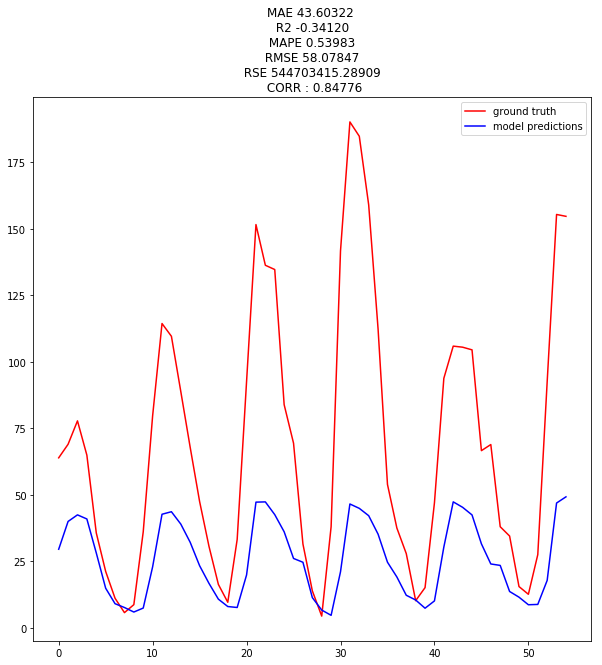

MAE 11.7611
R2 0.7785
RMSE 14.6433
[2.4021025] -7.521698




Plot, with Optimizer.
(55,) (55,)


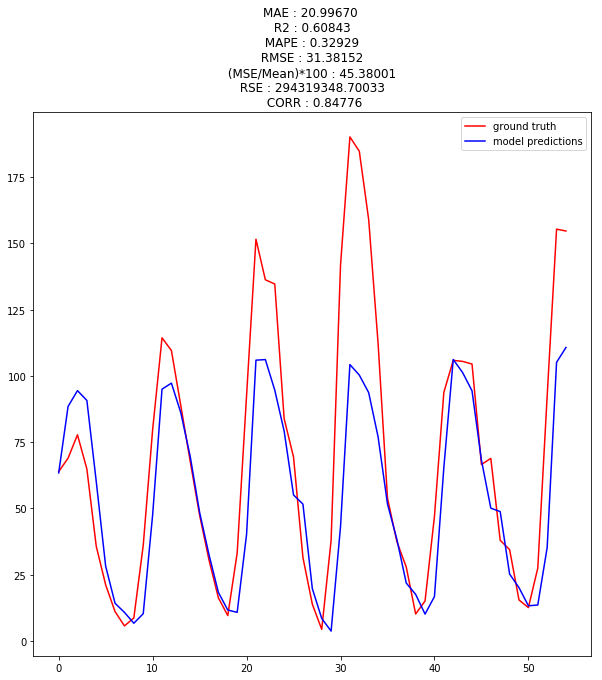

Done saving the results


[20.996699191006748, 0.6084293358460439, 31.38151506363837, 45.38001074039309]

In [45]:
#Wolfer.
results_collect(model_version="M2V2",dataset_name="Wolfer",callback_min_delta=0.05,patience_value=80,epoch_cnt=600, optim = SGD(lr = 0.001), timesteps = 15, frac = 0.8)

# Zurich Sunspot

Create formatted data : (df shape) (289,)
Create time-stepped data : (d shape) (282, 7, 1)
Create formatted data :  (282, 3, 1) (282, 3, 1) (282,)
Dimensions of train and test :  (225, 3, 1)   (57, 3, 1)   (225,)   (57,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 3, 1)         0                                            
__________________________________________________________________________________________________
conv1d_5 (Conv1D)               (None, 3, 32)        64          input_5[0][0]                    
__________________________________________________________________________________________________
conv1d_6 (Conv1D)               (None, 3, 32)        1056        conv1d_5[0][0]                   
________________________________________________________________

Epoch 11/600
225/225 [==============================] - 0s 837us/step - loss: 13.6785 - mean_absolute_error: 14.1692 - mean_squared_error: 394.3507 - rmse: 19.6332 - val_loss: 33.7610 - val_mean_absolute_error: 34.2558 - val_mean_squared_error: 1810.2287 - val_rmse: 42.5138
Epoch 12/600
225/225 [==============================] - 0s 824us/step - loss: 14.7629 - mean_absolute_error: 15.2490 - mean_squared_error: 482.3003 - rmse: 21.7741 - val_loss: 54.9456 - val_mean_absolute_error: 55.4400 - val_mean_squared_error: 4755.7413 - val_rmse: 68.9584
Epoch 13/600
225/225 [==============================] - 0s 963us/step - loss: 17.1754 - mean_absolute_error: 17.6685 - mean_squared_error: 701.3251 - rmse: 24.1124 - val_loss: 18.3604 - val_mean_absolute_error: 18.8462 - val_mean_squared_error: 815.7980 - val_rmse: 28.4693
Epoch 14/600
225/225 [==============================] - 0s 923us/step - loss: 12.1678 - mean_absolute_error: 12.6546 - mean_squared_error: 333.9333 - rmse: 18.1324 - val_loss: 

Epoch 41/600
225/225 [==============================] - 0s 843us/step - loss: 11.3214 - mean_absolute_error: 11.8110 - mean_squared_error: 322.5459 - rmse: 17.6282 - val_loss: 15.9951 - val_mean_absolute_error: 16.4917 - val_mean_squared_error: 552.3825 - val_rmse: 23.4194
Epoch 42/600
225/225 [==============================] - 0s 853us/step - loss: 10.8195 - mean_absolute_error: 11.3115 - mean_squared_error: 273.7968 - rmse: 15.8882 - val_loss: 36.8550 - val_mean_absolute_error: 37.3550 - val_mean_squared_error: 2195.0354 - val_rmse: 46.8295
Epoch 43/600
225/225 [==============================] - 0s 932us/step - loss: 13.6277 - mean_absolute_error: 14.1222 - mean_squared_error: 442.6330 - rmse: 19.5986 - val_loss: 40.1456 - val_mean_absolute_error: 40.6456 - val_mean_squared_error: 3199.9251 - val_rmse: 56.3808
Epoch 44/600
225/225 [==============================] - 0s 884us/step - loss: 13.8662 - mean_absolute_error: 14.3540 - mean_squared_error: 548.3757 - rmse: 20.8415 - val_loss: 

Epoch 71/600
225/225 [==============================] - 0s 935us/step - loss: 11.6710 - mean_absolute_error: 12.1613 - mean_squared_error: 287.4040 - rmse: 16.7688 - val_loss: 34.8959 - val_mean_absolute_error: 35.3922 - val_mean_squared_error: 2008.9604 - val_rmse: 44.7828
Epoch 72/600
225/225 [==============================] - 0s 863us/step - loss: 12.7318 - mean_absolute_error: 13.2262 - mean_squared_error: 365.7715 - rmse: 18.0078 - val_loss: 38.3459 - val_mean_absolute_error: 38.8431 - val_mean_squared_error: 2199.8223 - val_rmse: 46.9022
Epoch 73/600
225/225 [==============================] - 0s 894us/step - loss: 12.4533 - mean_absolute_error: 12.9365 - mean_squared_error: 363.7219 - rmse: 18.2381 - val_loss: 17.0948 - val_mean_absolute_error: 17.5811 - val_mean_squared_error: 591.1261 - val_rmse: 24.2949
Epoch 74/600
225/225 [==============================] - 0s 808us/step - loss: 11.8318 - mean_absolute_error: 12.3166 - mean_squared_error: 345.9961 - rmse: 17.8819 - val_loss: 

Epoch 101/600
225/225 [==============================] - 0s 694us/step - loss: 25.8026 - mean_absolute_error: 26.2924 - mean_squared_error: 1320.8611 - rmse: 35.3804 - val_loss: 57.1122 - val_mean_absolute_error: 57.6122 - val_mean_squared_error: 4717.5106 - val_rmse: 68.5182
Epoch 102/600
225/225 [==============================] - 0s 864us/step - loss: 16.3433 - mean_absolute_error: 16.8344 - mean_squared_error: 568.0389 - rmse: 21.9203 - val_loss: 20.8860 - val_mean_absolute_error: 21.3747 - val_mean_squared_error: 877.1194 - val_rmse: 29.5691
Epoch 103/600
225/225 [==============================] - 0s 904us/step - loss: 11.5639 - mean_absolute_error: 12.0550 - mean_squared_error: 292.9257 - rmse: 16.8561 - val_loss: 18.2951 - val_mean_absolute_error: 18.7903 - val_mean_squared_error: 669.3315 - val_rmse: 25.8556
Epoch 104/600
225/225 [==============================] - 0s 858us/step - loss: 10.5639 - mean_absolute_error: 11.0448 - mean_squared_error: 275.1721 - rmse: 16.4211 - val_lo

Epoch 131/600
225/225 [==============================] - 0s 909us/step - loss: 11.8869 - mean_absolute_error: 12.3753 - mean_squared_error: 339.1345 - rmse: 17.7475 - val_loss: 46.3069 - val_mean_absolute_error: 46.8069 - val_mean_squared_error: 3313.2920 - val_rmse: 57.5357
Epoch 132/600
225/225 [==============================] - 0s 871us/step - loss: 19.4004 - mean_absolute_error: 19.8923 - mean_squared_error: 759.8452 - rmse: 25.6414 - val_loss: 22.9570 - val_mean_absolute_error: 23.4491 - val_mean_squared_error: 908.4196 - val_rmse: 30.0872
Epoch 133/600
225/225 [==============================] - 0s 886us/step - loss: 10.8589 - mean_absolute_error: 11.3466 - mean_squared_error: 272.8104 - rmse: 16.0319 - val_loss: 35.6506 - val_mean_absolute_error: 36.1506 - val_mean_squared_error: 2205.6857 - val_rmse: 46.8813
Epoch 134/600
225/225 [==============================] - 0s 802us/step - loss: 11.0626 - mean_absolute_error: 11.5555 - mean_squared_error: 276.4428 - rmse: 16.1383 - val_lo

Epoch 161/600
225/225 [==============================] - 0s 879us/step - loss: 11.6602 - mean_absolute_error: 12.1507 - mean_squared_error: 316.6826 - rmse: 17.0733 - val_loss: 14.2219 - val_mean_absolute_error: 14.7049 - val_mean_squared_error: 433.0940 - val_rmse: 20.7546
Epoch 162/600
225/225 [==============================] - 0s 910us/step - loss: 10.1492 - mean_absolute_error: 10.6332 - mean_squared_error: 240.9873 - rmse: 15.2831 - val_loss: 47.4000 - val_mean_absolute_error: 47.8986 - val_mean_squared_error: 3323.0027 - val_rmse: 57.6365
Epoch 163/600
225/225 [==============================] - 0s 864us/step - loss: 19.0310 - mean_absolute_error: 19.5263 - mean_squared_error: 752.1243 - rmse: 25.8713 - val_loss: 33.0272 - val_mean_absolute_error: 33.5272 - val_mean_squared_error: 1652.5398 - val_rmse: 40.6475
Epoch 164/600
225/225 [==============================] - 0s 791us/step - loss: 11.9025 - mean_absolute_error: 12.3939 - mean_squared_error: 319.9435 - rmse: 16.8708 - val_lo

Epoch 191/600
225/225 [==============================] - 0s 918us/step - loss: 10.1264 - mean_absolute_error: 10.6147 - mean_squared_error: 229.9218 - rmse: 14.8811 - val_loss: 46.6288 - val_mean_absolute_error: 47.1288 - val_mean_squared_error: 3470.3501 - val_rmse: 58.8626
Epoch 192/600
225/225 [==============================] - 0s 941us/step - loss: 19.7633 - mean_absolute_error: 20.2469 - mean_squared_error: 807.4420 - rmse: 27.1784 - val_loss: 17.2665 - val_mean_absolute_error: 17.7665 - val_mean_squared_error: 549.3375 - val_rmse: 23.4275
Epoch 193/600
225/225 [==============================] - 0s 919us/step - loss: 9.8406 - mean_absolute_error: 10.3208 - mean_squared_error: 220.0409 - rmse: 14.5195 - val_loss: 25.8738 - val_mean_absolute_error: 26.3738 - val_mean_squared_error: 1123.8386 - val_rmse: 33.4988
Epoch 194/600
225/225 [==============================] - 0s 815us/step - loss: 10.7061 - mean_absolute_error: 11.1920 - mean_squared_error: 281.7517 - rmse: 16.2396 - val_los

Epoch 221/600
225/225 [==============================] - 0s 945us/step - loss: 11.0997 - mean_absolute_error: 11.5839 - mean_squared_error: 296.4399 - rmse: 16.6255 - val_loss: 12.3710 - val_mean_absolute_error: 12.8581 - val_mean_squared_error: 301.5011 - val_rmse: 17.3110
Epoch 222/600
225/225 [==============================] - 0s 925us/step - loss: 9.4516 - mean_absolute_error: 9.9324 - mean_squared_error: 210.5941 - rmse: 14.1268 - val_loss: 40.4364 - val_mean_absolute_error: 40.9364 - val_mean_squared_error: 2814.4898 - val_rmse: 53.0225
Epoch 223/600
225/225 [==============================] - 0s 868us/step - loss: 10.8557 - mean_absolute_error: 11.3444 - mean_squared_error: 261.9474 - rmse: 15.6027 - val_loss: 14.6934 - val_mean_absolute_error: 15.1870 - val_mean_squared_error: 393.7117 - val_rmse: 19.7986
Epoch 224/600
225/225 [==============================] - 0s 880us/step - loss: 10.6213 - mean_absolute_error: 11.1125 - mean_squared_error: 241.3395 - rmse: 15.2392 - val_loss:

Epoch 251/600
225/225 [==============================] - 0s 960us/step - loss: 9.5330 - mean_absolute_error: 10.0236 - mean_squared_error: 201.4650 - rmse: 14.0223 - val_loss: 13.5299 - val_mean_absolute_error: 14.0258 - val_mean_squared_error: 334.6483 - val_rmse: 18.2861
Epoch 252/600
225/225 [==============================] - 0s 915us/step - loss: 8.9792 - mean_absolute_error: 9.4654 - mean_squared_error: 182.9054 - rmse: 13.3726 - val_loss: 16.8049 - val_mean_absolute_error: 17.3008 - val_mean_squared_error: 490.1593 - val_rmse: 22.1395
Epoch 253/600
225/225 [==============================] - 0s 860us/step - loss: 9.5894 - mean_absolute_error: 10.0705 - mean_squared_error: 207.2780 - rmse: 14.1437 - val_loss: 13.0143 - val_mean_absolute_error: 13.5114 - val_mean_squared_error: 326.0916 - val_rmse: 18.0501
Epoch 254/600
225/225 [==============================] - 0s 915us/step - loss: 9.5939 - mean_absolute_error: 10.0797 - mean_squared_error: 204.6184 - rmse: 14.0161 - val_loss: 31.

Epoch 281/600
225/225 [==============================] - 0s 836us/step - loss: 9.5766 - mean_absolute_error: 10.0646 - mean_squared_error: 203.2877 - rmse: 14.0501 - val_loss: 12.3720 - val_mean_absolute_error: 12.8639 - val_mean_squared_error: 285.9770 - val_rmse: 16.8882
Epoch 282/600
225/225 [==============================] - 0s 887us/step - loss: 9.3283 - mean_absolute_error: 9.8192 - mean_squared_error: 190.6314 - rmse: 13.6334 - val_loss: 17.7828 - val_mean_absolute_error: 18.2828 - val_mean_squared_error: 527.0409 - val_rmse: 22.9540
Epoch 283/600
225/225 [==============================] - 0s 871us/step - loss: 9.6530 - mean_absolute_error: 10.1388 - mean_squared_error: 196.1705 - rmse: 13.8245 - val_loss: 12.1123 - val_mean_absolute_error: 12.5982 - val_mean_squared_error: 276.3612 - val_rmse: 16.5962
Epoch 284/600
225/225 [==============================] - 0s 861us/step - loss: 8.9566 - mean_absolute_error: 9.4461 - mean_squared_error: 180.8799 - rmse: 13.2881 - val_loss: 15.4

Epoch 311/600
225/225 [==============================] - 0s 786us/step - loss: 9.7720 - mean_absolute_error: 10.2604 - mean_squared_error: 200.0133 - rmse: 14.0041 - val_loss: 12.2387 - val_mean_absolute_error: 12.7126 - val_mean_squared_error: 287.5153 - val_rmse: 16.9393
Epoch 312/600
225/225 [==============================] - 0s 769us/step - loss: 9.2261 - mean_absolute_error: 9.7132 - mean_squared_error: 191.4246 - rmse: 13.6752 - val_loss: 13.8550 - val_mean_absolute_error: 14.3428 - val_mean_squared_error: 335.5142 - val_rmse: 18.3020
Epoch 313/600
225/225 [==============================] - 0s 930us/step - loss: 9.1127 - mean_absolute_error: 9.6001 - mean_squared_error: 179.5774 - rmse: 13.2084 - val_loss: 15.1305 - val_mean_absolute_error: 15.6109 - val_mean_squared_error: 443.1933 - val_rmse: 21.0501
Epoch 314/600
225/225 [==============================] - 0s 943us/step - loss: 9.2295 - mean_absolute_error: 9.7215 - mean_squared_error: 183.0979 - rmse: 13.2393 - val_loss: 56.17

Epoch 341/600
225/225 [==============================] - 0s 790us/step - loss: 10.1816 - mean_absolute_error: 10.6687 - mean_squared_error: 227.5456 - rmse: 14.4318 - val_loss: 33.6360 - val_mean_absolute_error: 34.1360 - val_mean_squared_error: 2107.2211 - val_rmse: 45.8229
Epoch 342/600
225/225 [==============================] - 0s 881us/step - loss: 11.0397 - mean_absolute_error: 11.5298 - mean_squared_error: 264.8408 - rmse: 15.8952 - val_loss: 14.0143 - val_mean_absolute_error: 14.5117 - val_mean_squared_error: 395.8440 - val_rmse: 19.8868
Epoch 343/600
225/225 [==============================] - 0s 912us/step - loss: 9.0721 - mean_absolute_error: 9.5555 - mean_squared_error: 184.4948 - rmse: 13.5593 - val_loss: 15.2574 - val_mean_absolute_error: 15.7472 - val_mean_squared_error: 417.7220 - val_rmse: 20.4122
Epoch 344/600
225/225 [==============================] - 0s 917us/step - loss: 9.7277 - mean_absolute_error: 10.2142 - mean_squared_error: 216.0959 - rmse: 14.4209 - val_loss: 

Epoch 371/600
225/225 [==============================] - 0s 886us/step - loss: 9.6114 - mean_absolute_error: 10.0949 - mean_squared_error: 200.3119 - rmse: 14.0521 - val_loss: 14.1162 - val_mean_absolute_error: 14.6038 - val_mean_squared_error: 358.0664 - val_rmse: 18.9217
Epoch 372/600
225/225 [==============================] - 0s 914us/step - loss: 9.0905 - mean_absolute_error: 9.5740 - mean_squared_error: 177.9109 - rmse: 13.2410 - val_loss: 26.3537 - val_mean_absolute_error: 26.8537 - val_mean_squared_error: 1036.0628 - val_rmse: 32.1745
Epoch 373/600
225/225 [==============================] - 0s 870us/step - loss: 11.5729 - mean_absolute_error: 12.0599 - mean_squared_error: 283.3552 - rmse: 16.1654 - val_loss: 42.3442 - val_mean_absolute_error: 42.8442 - val_mean_squared_error: 3333.1121 - val_rmse: 57.6391
Epoch 374/600
225/225 [==============================] - 0s 875us/step - loss: 11.9256 - mean_absolute_error: 12.4132 - mean_squared_error: 399.6530 - rmse: 17.3827 - val_loss:

Epoch 401/600
225/225 [==============================] - 0s 932us/step - loss: 8.6804 - mean_absolute_error: 9.1611 - mean_squared_error: 184.1206 - rmse: 13.4000 - val_loss: 23.3247 - val_mean_absolute_error: 23.8194 - val_mean_squared_error: 963.1140 - val_rmse: 31.0209
Epoch 402/600
225/225 [==============================] - 0s 911us/step - loss: 9.8870 - mean_absolute_error: 10.3763 - mean_squared_error: 220.0380 - rmse: 14.3053 - val_loss: 30.8025 - val_mean_absolute_error: 31.2945 - val_mean_squared_error: 1510.8880 - val_rmse: 38.8607
Epoch 403/600
225/225 [==============================] - 0s 870us/step - loss: 10.9415 - mean_absolute_error: 11.4292 - mean_squared_error: 265.8075 - rmse: 15.9383 - val_loss: 18.3592 - val_mean_absolute_error: 18.8535 - val_mean_squared_error: 556.2001 - val_rmse: 23.5811
Epoch 404/600
225/225 [==============================] - 0s 813us/step - loss: 9.6102 - mean_absolute_error: 10.0981 - mean_squared_error: 201.5748 - rmse: 13.8594 - val_loss: 4

Epoch 431/600
225/225 [==============================] - 0s 934us/step - loss: 9.8466 - mean_absolute_error: 10.3358 - mean_squared_error: 206.7501 - rmse: 14.2587 - val_loss: 27.1478 - val_mean_absolute_error: 27.6418 - val_mean_squared_error: 1132.2599 - val_rmse: 33.6427
Epoch 432/600
225/225 [==============================] - 0s 851us/step - loss: 10.7862 - mean_absolute_error: 11.2700 - mean_squared_error: 278.1279 - rmse: 15.6943 - val_loss: 26.3100 - val_mean_absolute_error: 26.8099 - val_mean_squared_error: 1064.3587 - val_rmse: 32.6243
Epoch 433/600
225/225 [==============================] - 0s 894us/step - loss: 10.1118 - mean_absolute_error: 10.5907 - mean_squared_error: 217.1721 - rmse: 14.2730 - val_loss: 31.5657 - val_mean_absolute_error: 32.0653 - val_mean_squared_error: 2109.1231 - val_rmse: 45.7802
Epoch 434/600
225/225 [==============================] - 0s 956us/step - loss: 11.0092 - mean_absolute_error: 11.4990 - mean_squared_error: 311.8599 - rmse: 16.5396 - val_lo

Epoch 461/600
225/225 [==============================] - 0s 910us/step - loss: 9.0392 - mean_absolute_error: 9.5238 - mean_squared_error: 168.2740 - rmse: 12.8525 - val_loss: 26.9426 - val_mean_absolute_error: 27.4426 - val_mean_squared_error: 1400.5766 - val_rmse: 37.3245
Epoch 462/600
225/225 [==============================] - 0s 899us/step - loss: 10.0551 - mean_absolute_error: 10.5388 - mean_squared_error: 218.4957 - rmse: 14.2205 - val_loss: 63.8608 - val_mean_absolute_error: 64.3543 - val_mean_squared_error: 7127.8751 - val_rmse: 84.3768
Epoch 463/600
225/225 [==============================] - 0s 806us/step - loss: 13.8463 - mean_absolute_error: 14.3255 - mean_squared_error: 686.1008 - rmse: 19.8065 - val_loss: 16.3413 - val_mean_absolute_error: 16.8363 - val_mean_squared_error: 479.3113 - val_rmse: 21.8806
Epoch 464/600
225/225 [==============================] - 0s 878us/step - loss: 9.3038 - mean_absolute_error: 9.7851 - mean_squared_error: 185.3769 - rmse: 13.4206 - val_loss: 

Epoch 491/600
225/225 [==============================] - 0s 882us/step - loss: 10.2507 - mean_absolute_error: 10.7379 - mean_squared_error: 234.2559 - rmse: 14.9003 - val_loss: 42.5490 - val_mean_absolute_error: 43.0472 - val_mean_squared_error: 2798.4805 - val_rmse: 52.8923
Epoch 492/600
225/225 [==============================] - 0s 882us/step - loss: 11.6551 - mean_absolute_error: 12.1440 - mean_squared_error: 323.8622 - rmse: 16.2551 - val_loss: 40.9543 - val_mean_absolute_error: 41.4536 - val_mean_squared_error: 2543.5071 - val_rmse: 50.4260
Epoch 493/600
225/225 [==============================] - 0s 916us/step - loss: 15.5337 - mean_absolute_error: 16.0220 - mean_squared_error: 514.6360 - rmse: 20.8856 - val_loss: 23.3870 - val_mean_absolute_error: 23.8870 - val_mean_squared_error: 1093.7315 - val_rmse: 33.0390
Epoch 494/600
225/225 [==============================] - 0s 967us/step - loss: 10.2725 - mean_absolute_error: 10.7628 - mean_squared_error: 252.1497 - rmse: 14.8826 - val_l

Epoch 521/600
225/225 [==============================] - 0s 882us/step - loss: 9.8621 - mean_absolute_error: 10.3493 - mean_squared_error: 205.8317 - rmse: 14.0107 - val_loss: 42.0284 - val_mean_absolute_error: 42.5284 - val_mean_squared_error: 2845.4878 - val_rmse: 53.3172
Epoch 522/600
225/225 [==============================] - 0s 912us/step - loss: 16.5957 - mean_absolute_error: 17.0795 - mean_squared_error: 603.3524 - rmse: 23.3847 - val_loss: 17.0250 - val_mean_absolute_error: 17.5220 - val_mean_squared_error: 461.0728 - val_rmse: 21.3988
Epoch 523/600
225/225 [==============================] - 0s 890us/step - loss: 10.1309 - mean_absolute_error: 10.6209 - mean_squared_error: 198.1827 - rmse: 13.8370 - val_loss: 37.0412 - val_mean_absolute_error: 37.5206 - val_mean_squared_error: 2570.2646 - val_rmse: 50.6121
Epoch 524/600
225/225 [==============================] - 0s 883us/step - loss: 16.8169 - mean_absolute_error: 17.3057 - mean_squared_error: 635.7193 - rmse: 24.2680 - val_los

Epoch 551/600
225/225 [==============================] - 0s 872us/step - loss: 9.5191 - mean_absolute_error: 10.0008 - mean_squared_error: 197.5968 - rmse: 13.7763 - val_loss: 19.5449 - val_mean_absolute_error: 20.0368 - val_mean_squared_error: 600.3915 - val_rmse: 24.4948
Epoch 552/600
225/225 [==============================] - 0s 999us/step - loss: 9.2621 - mean_absolute_error: 9.7536 - mean_squared_error: 179.9048 - rmse: 12.7604 - val_loss: 24.1022 - val_mean_absolute_error: 24.5930 - val_mean_squared_error: 1051.0129 - val_rmse: 32.4014
Epoch 553/600
225/225 [==============================] - 0s 781us/step - loss: 10.1098 - mean_absolute_error: 10.5930 - mean_squared_error: 234.9531 - rmse: 14.7909 - val_loss: 37.8791 - val_mean_absolute_error: 38.3791 - val_mean_squared_error: 2771.4694 - val_rmse: 52.5237
Epoch 554/600
225/225 [==============================] - 0s 920us/step - loss: 11.4023 - mean_absolute_error: 11.8861 - mean_squared_error: 357.3638 - rmse: 16.7497 - val_loss:

Epoch 581/600
225/225 [==============================] - 0s 902us/step - loss: 13.3688 - mean_absolute_error: 13.8536 - mean_squared_error: 400.7286 - rmse: 18.7438 - val_loss: 12.2480 - val_mean_absolute_error: 12.7306 - val_mean_squared_error: 347.8227 - val_rmse: 18.5340
Epoch 582/600
225/225 [==============================] - 0s 868us/step - loss: 9.4847 - mean_absolute_error: 9.9636 - mean_squared_error: 213.9671 - rmse: 14.3211 - val_loss: 43.4159 - val_mean_absolute_error: 43.9158 - val_mean_squared_error: 3089.4476 - val_rmse: 55.5783
Epoch 583/600
225/225 [==============================] - 0s 865us/step - loss: 11.9494 - mean_absolute_error: 12.4337 - mean_squared_error: 348.3163 - rmse: 16.4357 - val_loss: 11.0789 - val_mean_absolute_error: 11.5585 - val_mean_squared_error: 236.1268 - val_rmse: 15.3631
Epoch 584/600
225/225 [==============================] - 0s 782us/step - loss: 8.5349 - mean_absolute_error: 9.0145 - mean_squared_error: 159.1749 - rmse: 12.5464 - val_loss: 2

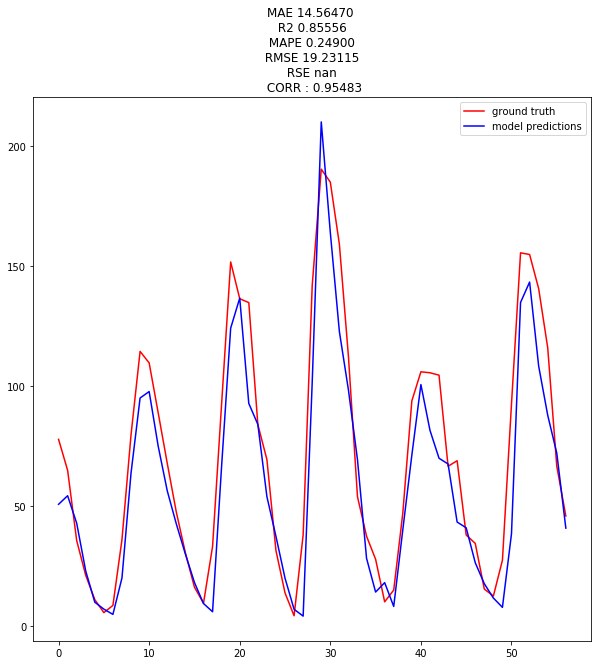

MAE 9.6101
R2 0.8002
RMSE 13.8362
[1.0932279] 2.0336876




Plot, with Optimizer.
(57,) (57,)


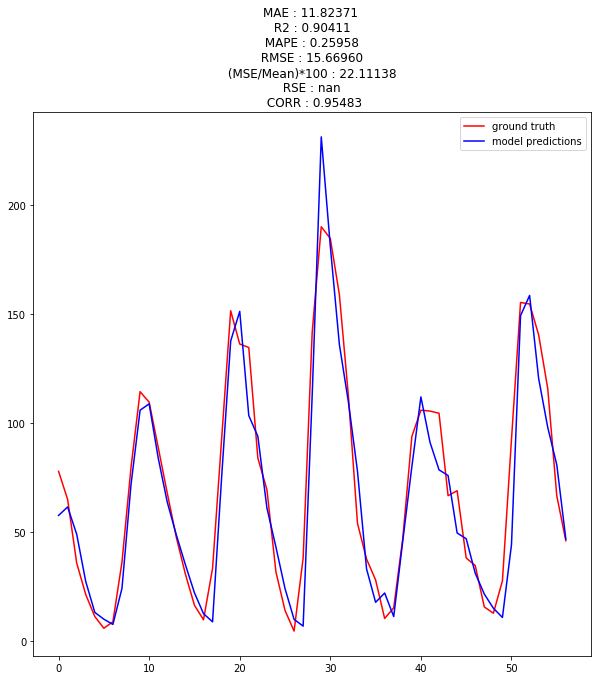

Done saving the results


[11.82371155922873, 0.9041088974966869, 15.66960048690632, 22.11138356571917]

In [5]:
#Wolfer.
results_collect(model_version="M3V1",dataset_name="Wolfer",callback_min_delta=0.05,patience_value=300,epoch_cnt=600, optim = SGD(lr = 0.001, momentum = 0.001), timesteps = 7, frac = 0.8)

Inside model_creation
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 2s 1ms/step - loss: 43.6387 - mean_absolute_error: 44.1222 - rmse: 44.1222 - val_loss: 63.2070 - val_mean_absolute_error: 63.7011 - val_rmse: 63.7011
Epoch 2/400
1959/1959 [==============================] - 1s 263us/step - loss: 41.7991 - mean_absolute_error: 42.2855 - rmse: 42.2855 - val_loss: 61.0795 - val_mean_absolute_error: 61.5739 - val_rmse: 61.5739
Epoch 3/400
1959/1959 [==============================] - 1s 265us/step - loss: 37.4315 - mean_absolute_error: 37.9212 - rmse: 37.9212 - val_loss: 54.7480 - val_mean_absolute_error: 55.2439 - val_rmse: 55.2439
Epoch 4/400
1959/1959 [==============================] - 1s 303us/step - loss: 20.7019 - mean_absolute_error: 21.1918 - rmse: 21.1918 - val_loss: 28.8649 - val_mean_absolute_error: 29.3560 - val_rmse: 29.3560
Epoch 5/400
1959/1959 [==============================] - 1s 273us/step - loss: 10.3283 - me

Epoch 40/400
1959/1959 [==============================] - 1s 291us/step - loss: 9.7769 - mean_absolute_error: 10.2607 - rmse: 10.2607 - val_loss: 32.5983 - val_mean_absolute_error: 33.0907 - val_rmse: 33.0907
Epoch 41/400
1959/1959 [==============================] - 1s 288us/step - loss: 9.7487 - mean_absolute_error: 10.2316 - rmse: 10.2316 - val_loss: 31.2630 - val_mean_absolute_error: 31.7554 - val_rmse: 31.7554
Epoch 42/400
1959/1959 [==============================] - 1s 290us/step - loss: 9.7664 - mean_absolute_error: 10.2512 - rmse: 10.2512 - val_loss: 32.6317 - val_mean_absolute_error: 33.1244 - val_rmse: 33.1244
Epoch 43/400
1959/1959 [==============================] - 1s 277us/step - loss: 9.7468 - mean_absolute_error: 10.2310 - rmse: 10.2310 - val_loss: 32.7285 - val_mean_absolute_error: 33.2213 - val_rmse: 33.2213
Epoch 44/400
1959/1959 [==============================] - 1s 295us/step - loss: 9.7366 - mean_absolute_error: 10.2219 - rmse: 10.2219 - val_loss: 32.8172 - val_mean

1959/1959 [==============================] - 0s 247us/step - loss: 8.9252 - mean_absolute_error: 9.4104 - rmse: 9.4104 - val_loss: 33.1888 - val_mean_absolute_error: 33.6839 - val_rmse: 33.6839
Epoch 119/400
1959/1959 [==============================] - 1s 267us/step - loss: 8.9467 - mean_absolute_error: 9.4329 - rmse: 9.4329 - val_loss: 34.1813 - val_mean_absolute_error: 34.6763 - val_rmse: 34.6763
Epoch 120/400
1959/1959 [==============================] - 1s 261us/step - loss: 8.9474 - mean_absolute_error: 9.4313 - rmse: 9.4313 - val_loss: 33.6519 - val_mean_absolute_error: 34.1468 - val_rmse: 34.1468
Epoch 121/400
1959/1959 [==============================] - 1s 282us/step - loss: 8.9424 - mean_absolute_error: 9.4256 - rmse: 9.4256 - val_loss: 31.4115 - val_mean_absolute_error: 31.9051 - val_rmse: 31.9051
Epoch 122/400
1959/1959 [==============================] - 1s 282us/step - loss: 8.9350 - mean_absolute_error: 9.4187 - rmse: 9.4187 - val_loss: 33.0137 - val_mean_absolute_error: 33

1959/1959 [==============================] - 0s 249us/step - loss: 8.5953 - mean_absolute_error: 9.0790 - rmse: 9.0790 - val_loss: 33.0921 - val_mean_absolute_error: 33.5853 - val_rmse: 33.5853
Epoch 197/400
1959/1959 [==============================] - 0s 252us/step - loss: 8.5669 - mean_absolute_error: 9.0491 - rmse: 9.0491 - val_loss: 32.4262 - val_mean_absolute_error: 32.9202 - val_rmse: 32.9202
Epoch 198/400
1959/1959 [==============================] - 0s 248us/step - loss: 8.5978 - mean_absolute_error: 9.0786 - rmse: 9.0786 - val_loss: 31.4279 - val_mean_absolute_error: 31.9229 - val_rmse: 31.9229
Epoch 199/400
1959/1959 [==============================] - 1s 262us/step - loss: 8.5621 - mean_absolute_error: 9.0448 - rmse: 9.0448 - val_loss: 32.6679 - val_mean_absolute_error: 33.1615 - val_rmse: 33.1615
Epoch 200/400
1959/1959 [==============================] - 1s 258us/step - loss: 8.6066 - mean_absolute_error: 9.0900 - rmse: 9.0900 - val_loss: 32.3974 - val_mean_absolute_error: 32

1959/1959 [==============================] - 0s 240us/step - loss: 8.4701 - mean_absolute_error: 8.9515 - rmse: 8.9515 - val_loss: 31.6142 - val_mean_absolute_error: 32.1087 - val_rmse: 32.1087
Epoch 275/400
1959/1959 [==============================] - 1s 257us/step - loss: 8.5168 - mean_absolute_error: 8.9974 - rmse: 8.9974 - val_loss: 33.4834 - val_mean_absolute_error: 33.9770 - val_rmse: 33.9770
Epoch 276/400
1959/1959 [==============================] - 1s 261us/step - loss: 8.5090 - mean_absolute_error: 8.9910 - rmse: 8.9910 - val_loss: 33.8966 - val_mean_absolute_error: 34.3910 - val_rmse: 34.3910
Epoch 277/400
1959/1959 [==============================] - 1s 294us/step - loss: 8.5405 - mean_absolute_error: 9.0203 - rmse: 9.0203 - val_loss: 32.3625 - val_mean_absolute_error: 32.8558 - val_rmse: 32.8558
Epoch 278/400
1959/1959 [==============================] - 1s 294us/step - loss: 8.5092 - mean_absolute_error: 8.9892 - rmse: 8.9892 - val_loss: 33.5431 - val_mean_absolute_error: 34

1959/1959 [==============================] - 1s 258us/step - loss: 8.4585 - mean_absolute_error: 8.9396 - rmse: 8.9396 - val_loss: 32.1306 - val_mean_absolute_error: 32.6239 - val_rmse: 32.6239
Epoch 353/400
1959/1959 [==============================] - 0s 255us/step - loss: 8.4917 - mean_absolute_error: 8.9709 - rmse: 8.9709 - val_loss: 33.8982 - val_mean_absolute_error: 34.3928 - val_rmse: 34.3928
Epoch 354/400
1959/1959 [==============================] - 1s 261us/step - loss: 8.4786 - mean_absolute_error: 8.9599 - rmse: 8.9599 - val_loss: 33.3377 - val_mean_absolute_error: 33.8315 - val_rmse: 33.8315
Epoch 355/400
1959/1959 [==============================] - 0s 244us/step - loss: 8.4864 - mean_absolute_error: 8.9687 - rmse: 8.9687 - val_loss: 34.6887 - val_mean_absolute_error: 35.1843 - val_rmse: 35.1843
Epoch 356/400
1959/1959 [==============================] - 0s 253us/step - loss: 8.5096 - mean_absolute_error: 8.9899 - rmse: 8.9899 - val_loss: 36.4873 - val_mean_absolute_error: 36

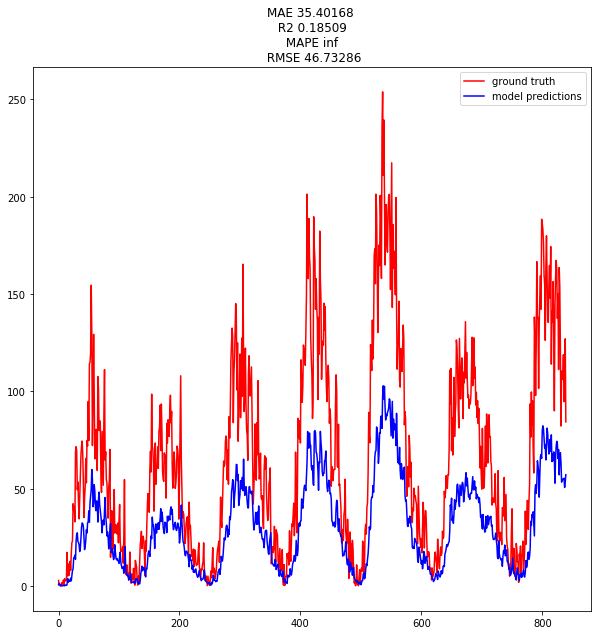

MAE 10.5271
R2 0.8195
RMSE 14.3917
[2.04292] 2.5992584




Plot, with Optimizer.
(840,) (840,)


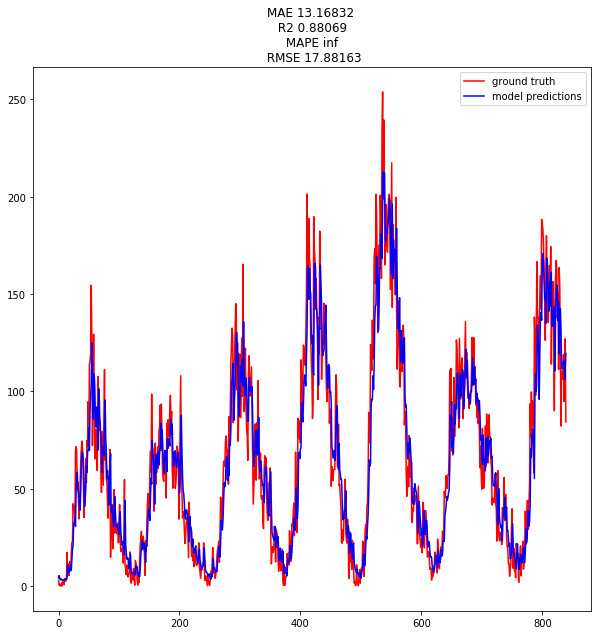

Done saving the results


[13.168322978190014, 0.8806897197213329]

In [12]:
results_collect(model_version="M1V1",dataset_name="Sunspot",callback_min_delta=0.05,patience_value=80,epoch_cnt=400)

Inside model_creation
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 2s 843us/step - loss: 37.8395 - mean_absolute_error: 38.3280 - rmse: 38.3280 - val_loss: 49.4217 - val_mean_absolute_error: 49.9159 - val_rmse: 49.9159
Epoch 2/400
1959/1959 [==============================] - 0s 187us/step - loss: 14.0079 - mean_absolute_error: 14.4954 - rmse: 14.4954 - val_loss: 28.3115 - val_mean_absolute_error: 28.8029 - val_rmse: 28.8029
Epoch 3/400
1959/1959 [==============================] - 0s 202us/step - loss: 10.2583 - mean_absolute_error: 10.7438 - rmse: 10.7438 - val_loss: 29.9631 - val_mean_absolute_error: 30.4570 - val_rmse: 30.4570
Epoch 4/400
1959/1959 [==============================] - 0s 223us/step - loss: 10.2036 - mean_absolute_error: 10.6885 - rmse: 10.6885 - val_loss: 30.0737 - val_mean_absolute_error: 30.5672 - val_rmse: 30.5672
Epoch 5/400
1959/1959 [==============================] - 0s 214us/step - loss: 10.1817 - 

Epoch 40/400
1959/1959 [==============================] - 0s 204us/step - loss: 9.3984 - mean_absolute_error: 9.8828 - rmse: 9.8828 - val_loss: 34.4409 - val_mean_absolute_error: 34.9333 - val_rmse: 34.9333
Epoch 41/400
1959/1959 [==============================] - 0s 211us/step - loss: 9.3807 - mean_absolute_error: 9.8634 - rmse: 9.8634 - val_loss: 35.9249 - val_mean_absolute_error: 36.4182 - val_rmse: 36.4182
Epoch 42/400
1959/1959 [==============================] - 0s 197us/step - loss: 9.3689 - mean_absolute_error: 9.8523 - rmse: 9.8523 - val_loss: 32.8079 - val_mean_absolute_error: 33.3011 - val_rmse: 33.3011
Epoch 43/400
1959/1959 [==============================] - 0s 200us/step - loss: 9.3211 - mean_absolute_error: 9.8030 - rmse: 9.8030 - val_loss: 32.2346 - val_mean_absolute_error: 32.7280 - val_rmse: 32.7280
Epoch 44/400
1959/1959 [==============================] - 0s 228us/step - loss: 9.2995 - mean_absolute_error: 9.7837 - rmse: 9.7837 - val_loss: 33.6235 - val_mean_absolute_

1959/1959 [==============================] - 0s 209us/step - loss: 8.6290 - mean_absolute_error: 9.1109 - rmse: 9.1109 - val_loss: 33.1653 - val_mean_absolute_error: 33.6593 - val_rmse: 33.6593
Epoch 119/400
1959/1959 [==============================] - 0s 222us/step - loss: 8.5869 - mean_absolute_error: 9.0690 - rmse: 9.0690 - val_loss: 30.3318 - val_mean_absolute_error: 30.8231 - val_rmse: 30.8231
Epoch 120/400
1959/1959 [==============================] - 0s 215us/step - loss: 8.6242 - mean_absolute_error: 9.1067 - rmse: 9.1067 - val_loss: 31.6766 - val_mean_absolute_error: 32.1699 - val_rmse: 32.1699
Epoch 121/400
1959/1959 [==============================] - 0s 213us/step - loss: 8.5953 - mean_absolute_error: 9.0773 - rmse: 9.0773 - val_loss: 31.5764 - val_mean_absolute_error: 32.0695 - val_rmse: 32.0695
Epoch 122/400
1959/1959 [==============================] - 0s 184us/step - loss: 8.6444 - mean_absolute_error: 9.1285 - rmse: 9.1285 - val_loss: 31.9903 - val_mean_absolute_error: 32

1959/1959 [==============================] - 0s 207us/step - loss: 8.5567 - mean_absolute_error: 9.0371 - rmse: 9.0371 - val_loss: 30.4782 - val_mean_absolute_error: 30.9711 - val_rmse: 30.9711
Epoch 197/400
1959/1959 [==============================] - 0s 196us/step - loss: 8.4556 - mean_absolute_error: 8.9354 - rmse: 8.9354 - val_loss: 31.8131 - val_mean_absolute_error: 32.3063 - val_rmse: 32.3063
Epoch 198/400
1959/1959 [==============================] - 0s 198us/step - loss: 8.5095 - mean_absolute_error: 8.9899 - rmse: 8.9899 - val_loss: 33.2330 - val_mean_absolute_error: 33.7270 - val_rmse: 33.7270
Epoch 199/400
1959/1959 [==============================] - 0s 209us/step - loss: 8.4845 - mean_absolute_error: 8.9662 - rmse: 8.9662 - val_loss: 30.9234 - val_mean_absolute_error: 31.4169 - val_rmse: 31.4169
Epoch 200/400
1959/1959 [==============================] - 0s 194us/step - loss: 8.5044 - mean_absolute_error: 8.9866 - rmse: 8.9866 - val_loss: 35.3582 - val_mean_absolute_error: 35

1959/1959 [==============================] - 0s 198us/step - loss: 8.4225 - mean_absolute_error: 8.9030 - rmse: 8.9030 - val_loss: 33.4026 - val_mean_absolute_error: 33.8963 - val_rmse: 33.8963
Epoch 275/400
1959/1959 [==============================] - 0s 230us/step - loss: 8.4087 - mean_absolute_error: 8.8896 - rmse: 8.8896 - val_loss: 31.6963 - val_mean_absolute_error: 32.1893 - val_rmse: 32.1893
Epoch 276/400
1959/1959 [==============================] - 0s 216us/step - loss: 8.4161 - mean_absolute_error: 8.8969 - rmse: 8.8969 - val_loss: 33.4633 - val_mean_absolute_error: 33.9569 - val_rmse: 33.9569
Epoch 277/400
1959/1959 [==============================] - 0s 201us/step - loss: 8.3800 - mean_absolute_error: 8.8577 - rmse: 8.8577 - val_loss: 32.2920 - val_mean_absolute_error: 32.7851 - val_rmse: 32.7851
Epoch 278/400
1959/1959 [==============================] - 0s 212us/step - loss: 8.4295 - mean_absolute_error: 8.9094 - rmse: 8.9094 - val_loss: 33.6035 - val_mean_absolute_error: 34

1959/1959 [==============================] - 0s 207us/step - loss: 8.3514 - mean_absolute_error: 8.8306 - rmse: 8.8306 - val_loss: 33.6463 - val_mean_absolute_error: 34.1391 - val_rmse: 34.1391
Epoch 353/400
1959/1959 [==============================] - 0s 223us/step - loss: 8.3711 - mean_absolute_error: 8.8493 - rmse: 8.8493 - val_loss: 33.7990 - val_mean_absolute_error: 34.2916 - val_rmse: 34.2916
Epoch 354/400
1959/1959 [==============================] - 0s 198us/step - loss: 8.3268 - mean_absolute_error: 8.8056 - rmse: 8.8056 - val_loss: 30.5173 - val_mean_absolute_error: 31.0091 - val_rmse: 31.0091
Epoch 355/400
1959/1959 [==============================] - 0s 205us/step - loss: 8.3339 - mean_absolute_error: 8.8139 - rmse: 8.8139 - val_loss: 33.4964 - val_mean_absolute_error: 33.9893 - val_rmse: 33.9893
Epoch 356/400
1959/1959 [==============================] - 0s 207us/step - loss: 8.3225 - mean_absolute_error: 8.8028 - rmse: 8.8028 - val_loss: 31.3391 - val_mean_absolute_error: 31

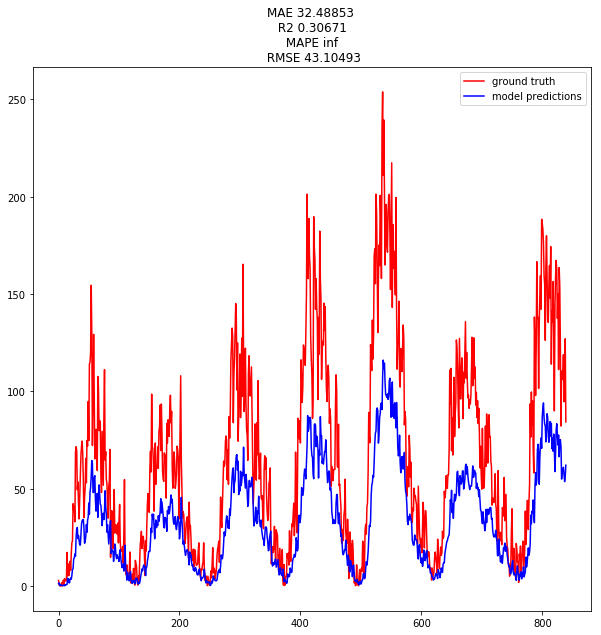

MAE 10.4338
R2 0.8224
RMSE 14.2734
[1.8589125] 2.8861885




Plot, with Optimizer.
(840,) (840,)


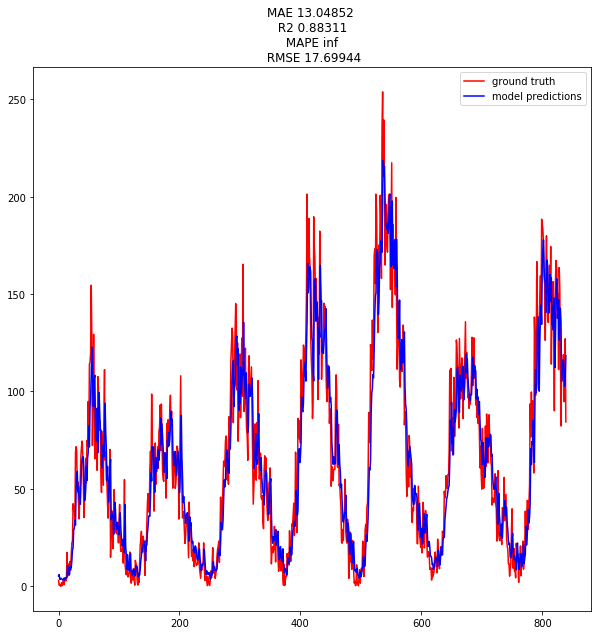

Done saving the results


[13.048517398777465, 0.8831086516009212]

In [13]:
results_collect(model_version="M1V2",dataset_name="Sunspot",callback_min_delta=0.05,patience_value=80,epoch_cnt=400)

Inside model_creation
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 3s 2ms/step - loss: 44.3821 - mean_absolute_error: 44.8685 - rmse: 44.8685 - val_loss: 64.5876 - val_mean_absolute_error: 65.0813 - val_rmse: 65.0813
Epoch 2/400
1959/1959 [==============================] - 1s 330us/step - loss: 44.3360 - mean_absolute_error: 44.8231 - rmse: 44.8231 - val_loss: 64.5427 - val_mean_absolute_error: 65.0363 - val_rmse: 65.0363
Epoch 3/400
1959/1959 [==============================] - 1s 322us/step - loss: 44.2892 - mean_absolute_error: 44.7772 - rmse: 44.7772 - val_loss: 64.4967 - val_mean_absolute_error: 64.9902 - val_rmse: 64.9902
Epoch 4/400
1959/1959 [==============================] - 1s 321us/step - loss: 44.2413 - mean_absolute_error: 44.7302 - rmse: 44.7302 - val_loss: 64.4495 - val_mean_absolute_error: 64.9430 - val_rmse: 64.9430
Epoch 5/400
1959/1959 [==============================] - 1s 317us/step - loss: 44.1914 - me

Epoch 40/400
1959/1959 [==============================] - 1s 316us/step - loss: 16.1018 - mean_absolute_error: 16.5903 - rmse: 16.5903 - val_loss: 43.4708 - val_mean_absolute_error: 43.9646 - val_rmse: 43.9646
Epoch 41/400
1959/1959 [==============================] - 1s 320us/step - loss: 14.9605 - mean_absolute_error: 15.4519 - rmse: 15.4519 - val_loss: 45.3403 - val_mean_absolute_error: 45.8354 - val_rmse: 45.8354
Epoch 42/400
1959/1959 [==============================] - 1s 315us/step - loss: 14.1679 - mean_absolute_error: 14.6598 - rmse: 14.6598 - val_loss: 48.1233 - val_mean_absolute_error: 48.6190 - val_rmse: 48.6190
Epoch 43/400
1959/1959 [==============================] - 1s 316us/step - loss: 13.6510 - mean_absolute_error: 14.1430 - rmse: 14.1430 - val_loss: 42.1338 - val_mean_absolute_error: 42.6285 - val_rmse: 42.6285
Epoch 44/400
1959/1959 [==============================] - 1s 318us/step - loss: 12.9917 - mean_absolute_error: 13.4792 - rmse: 13.4792 - val_loss: 43.0767 - val

1959/1959 [==============================] - 1s 318us/step - loss: 10.3854 - mean_absolute_error: 10.8728 - rmse: 10.8728 - val_loss: 44.4104 - val_mean_absolute_error: 44.9048 - val_rmse: 44.9048
Epoch 80/400
1959/1959 [==============================] - 1s 315us/step - loss: 10.5365 - mean_absolute_error: 11.0244 - rmse: 11.0244 - val_loss: 47.9623 - val_mean_absolute_error: 48.4586 - val_rmse: 48.4586
Epoch 81/400
1959/1959 [==============================] - 1s 318us/step - loss: 10.3231 - mean_absolute_error: 10.8110 - rmse: 10.8110 - val_loss: 46.7960 - val_mean_absolute_error: 47.2925 - val_rmse: 47.2925
Epoch 82/400
1959/1959 [==============================] - 1s 319us/step - loss: 10.3648 - mean_absolute_error: 10.8520 - rmse: 10.8520 - val_loss: 45.7753 - val_mean_absolute_error: 46.2720 - val_rmse: 46.2720
Epoch 83/400
1959/1959 [==============================] - 1s 318us/step - loss: 10.2103 - mean_absolute_error: 10.6956 - rmse: 10.6956 - val_loss: 45.0883 - val_mean_absolut

1959/1959 [==============================] - 1s 319us/step - loss: 9.9661 - mean_absolute_error: 10.4532 - rmse: 10.4532 - val_loss: 44.2463 - val_mean_absolute_error: 44.7414 - val_rmse: 44.7414
Epoch 119/400
1959/1959 [==============================] - 1s 320us/step - loss: 9.9973 - mean_absolute_error: 10.4833 - rmse: 10.4833 - val_loss: 46.6851 - val_mean_absolute_error: 47.1792 - val_rmse: 47.1792
Epoch 120/400
1959/1959 [==============================] - 1s 319us/step - loss: 9.9894 - mean_absolute_error: 10.4738 - rmse: 10.4738 - val_loss: 48.2822 - val_mean_absolute_error: 48.7774 - val_rmse: 48.7774
Epoch 121/400
1959/1959 [==============================] - 1s 322us/step - loss: 9.9653 - mean_absolute_error: 10.4512 - rmse: 10.4512 - val_loss: 42.1478 - val_mean_absolute_error: 42.6435 - val_rmse: 42.6435
Epoch 122/400
1959/1959 [==============================] - 1s 324us/step - loss: 9.8187 - mean_absolute_error: 10.3037 - rmse: 10.3037 - val_loss: 39.2478 - val_mean_absolute

1959/1959 [==============================] - 1s 317us/step - loss: 9.4846 - mean_absolute_error: 9.9715 - rmse: 9.9715 - val_loss: 44.3317 - val_mean_absolute_error: 44.8269 - val_rmse: 44.8269
Epoch 197/400
1959/1959 [==============================] - 1s 316us/step - loss: 9.3513 - mean_absolute_error: 9.8387 - rmse: 9.8387 - val_loss: 45.1650 - val_mean_absolute_error: 45.6601 - val_rmse: 45.6601
Epoch 198/400
1959/1959 [==============================] - 1s 318us/step - loss: 9.4383 - mean_absolute_error: 9.9236 - rmse: 9.9236 - val_loss: 46.7177 - val_mean_absolute_error: 47.2123 - val_rmse: 47.2123
Epoch 199/400
1959/1959 [==============================] - 1s 320us/step - loss: 9.4778 - mean_absolute_error: 9.9622 - rmse: 9.9622 - val_loss: 47.6390 - val_mean_absolute_error: 48.1333 - val_rmse: 48.1333
Epoch 200/400
1959/1959 [==============================] - 1s 318us/step - loss: 9.4894 - mean_absolute_error: 9.9748 - rmse: 9.9748 - val_loss: 46.3007 - val_mean_absolute_error: 46

1959/1959 [==============================] - 1s 320us/step - loss: 9.1517 - mean_absolute_error: 9.6367 - rmse: 9.6367 - val_loss: 47.1358 - val_mean_absolute_error: 47.6303 - val_rmse: 47.6303
Epoch 275/400
1959/1959 [==============================] - 1s 321us/step - loss: 9.2496 - mean_absolute_error: 9.7334 - rmse: 9.7334 - val_loss: 50.5795 - val_mean_absolute_error: 51.0744 - val_rmse: 51.0744
Epoch 276/400
1959/1959 [==============================] - 1s 316us/step - loss: 9.1121 - mean_absolute_error: 9.5966 - rmse: 9.5966 - val_loss: 45.4302 - val_mean_absolute_error: 45.9245 - val_rmse: 45.9245
Epoch 277/400
1959/1959 [==============================] - 1s 315us/step - loss: 9.2202 - mean_absolute_error: 9.7022 - rmse: 9.7022 - val_loss: 45.7506 - val_mean_absolute_error: 46.2451 - val_rmse: 46.2451
Epoch 278/400
1959/1959 [==============================] - 1s 319us/step - loss: 9.0053 - mean_absolute_error: 9.4908 - rmse: 9.4908 - val_loss: 47.5807 - val_mean_absolute_error: 48

1959/1959 [==============================] - 1s 320us/step - loss: 8.9792 - mean_absolute_error: 9.4617 - rmse: 9.4617 - val_loss: 47.5715 - val_mean_absolute_error: 48.0660 - val_rmse: 48.0660
Epoch 353/400
1959/1959 [==============================] - 1s 319us/step - loss: 8.9622 - mean_absolute_error: 9.4459 - rmse: 9.4459 - val_loss: 47.3927 - val_mean_absolute_error: 47.8872 - val_rmse: 47.8872
Epoch 354/400
1959/1959 [==============================] - 1s 315us/step - loss: 8.8373 - mean_absolute_error: 9.3189 - rmse: 9.3189 - val_loss: 47.8845 - val_mean_absolute_error: 48.3792 - val_rmse: 48.3792
Epoch 355/400
1959/1959 [==============================] - 1s 320us/step - loss: 8.9150 - mean_absolute_error: 9.3974 - rmse: 9.3974 - val_loss: 49.4167 - val_mean_absolute_error: 49.9115 - val_rmse: 49.9115
Epoch 356/400
1959/1959 [==============================] - 1s 318us/step - loss: 9.0034 - mean_absolute_error: 9.4857 - rmse: 9.4857 - val_loss: 48.5643 - val_mean_absolute_error: 49

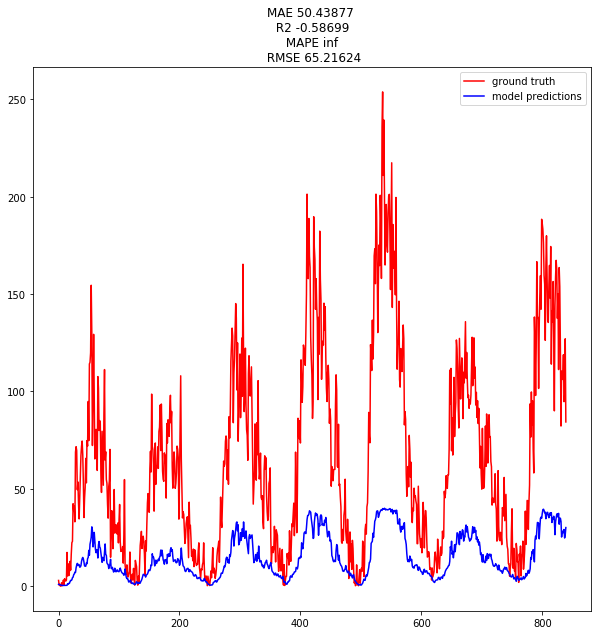

MAE 11.0578
R2 0.8024
RMSE 15.0567
[4.142897] 1.7590446




Plot, with Optimizer.
(840,) (840,)


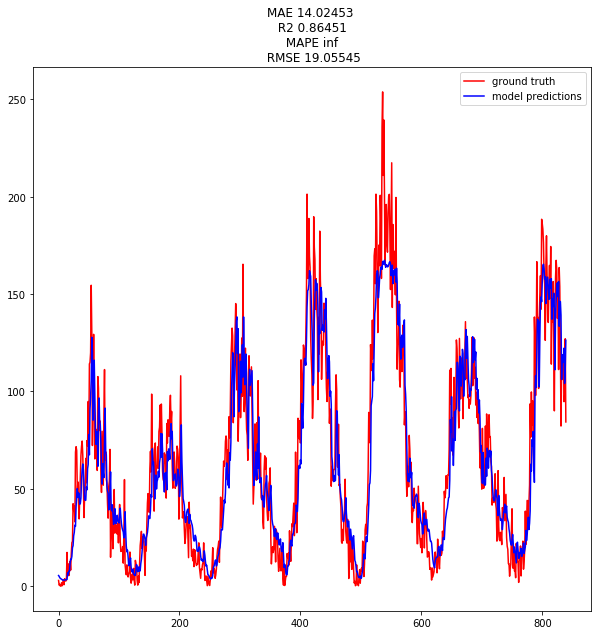

Done saving the results


[14.02452906540462, 0.8645116863169521]

In [14]:
results_collect(model_version="M2V2",dataset_name="Sunspot",callback_min_delta=0.05,patience_value=80,epoch_cnt=400)

Inside model_creation
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 3s 2ms/step - loss: 44.4733 - mean_absolute_error: 44.9556 - rmse: 44.9556 - val_loss: 63.6718 - val_mean_absolute_error: 64.1660 - val_rmse: 64.1660
Epoch 2/400
1959/1959 [==============================] - 1s 292us/step - loss: 40.5477 - mean_absolute_error: 41.0336 - rmse: 41.0336 - val_loss: 58.6536 - val_mean_absolute_error: 59.1484 - val_rmse: 59.1484
Epoch 3/400
1959/1959 [==============================] - 1s 295us/step - loss: 27.8391 - mean_absolute_error: 28.3290 - rmse: 28.3290 - val_loss: 37.0248 - val_mean_absolute_error: 37.5163 - val_rmse: 37.5163
Epoch 4/400
1959/1959 [==============================] - 1s 277us/step - loss: 10.4376 - mean_absolute_error: 10.9246 - rmse: 10.9246 - val_loss: 32.3644 - val_mean_absolute_error: 32.8578 - val_rmse: 32.8578
Epoch 5/400
1959/1959 [==============================] - 1s 276us/step - loss: 10.1082 - me

Epoch 40/400
1959/1959 [==============================] - 1s 270us/step - loss: 9.6650 - mean_absolute_error: 10.1500 - rmse: 10.1500 - val_loss: 31.5288 - val_mean_absolute_error: 32.0204 - val_rmse: 32.0204
Epoch 41/400
1959/1959 [==============================] - 1s 275us/step - loss: 9.6393 - mean_absolute_error: 10.1259 - rmse: 10.1259 - val_loss: 33.6377 - val_mean_absolute_error: 34.1301 - val_rmse: 34.1301
Epoch 42/400
1959/1959 [==============================] - 1s 281us/step - loss: 9.6389 - mean_absolute_error: 10.1248 - rmse: 10.1248 - val_loss: 32.6054 - val_mean_absolute_error: 33.0978 - val_rmse: 33.0978
Epoch 43/400
1959/1959 [==============================] - 1s 281us/step - loss: 9.6203 - mean_absolute_error: 10.1051 - rmse: 10.1051 - val_loss: 32.7532 - val_mean_absolute_error: 33.2458 - val_rmse: 33.2458
Epoch 44/400
1959/1959 [==============================] - 1s 288us/step - loss: 9.5620 - mean_absolute_error: 10.0472 - rmse: 10.0472 - val_loss: 31.0301 - val_mean

1959/1959 [==============================] - 1s 280us/step - loss: 8.8443 - mean_absolute_error: 9.3271 - rmse: 9.3271 - val_loss: 33.3815 - val_mean_absolute_error: 33.8751 - val_rmse: 33.8751
Epoch 119/400
1959/1959 [==============================] - 1s 284us/step - loss: 8.7907 - mean_absolute_error: 9.2739 - rmse: 9.2739 - val_loss: 33.9103 - val_mean_absolute_error: 34.4051 - val_rmse: 34.4051
Epoch 120/400
1959/1959 [==============================] - 1s 274us/step - loss: 8.7752 - mean_absolute_error: 9.2597 - rmse: 9.2597 - val_loss: 32.0445 - val_mean_absolute_error: 32.5365 - val_rmse: 32.5365
Epoch 121/400
1959/1959 [==============================] - 1s 278us/step - loss: 8.8321 - mean_absolute_error: 9.3156 - rmse: 9.3156 - val_loss: 34.0562 - val_mean_absolute_error: 34.5514 - val_rmse: 34.5514
Epoch 122/400
1959/1959 [==============================] - 1s 287us/step - loss: 8.8130 - mean_absolute_error: 9.2972 - rmse: 9.2972 - val_loss: 32.7459 - val_mean_absolute_error: 33

1959/1959 [==============================] - 1s 283us/step - loss: 8.5758 - mean_absolute_error: 9.0551 - rmse: 9.0551 - val_loss: 36.9667 - val_mean_absolute_error: 37.4605 - val_rmse: 37.4605
Epoch 197/400
1959/1959 [==============================] - 1s 277us/step - loss: 8.6019 - mean_absolute_error: 9.0846 - rmse: 9.0846 - val_loss: 35.1803 - val_mean_absolute_error: 35.6734 - val_rmse: 35.6734
Epoch 198/400
1959/1959 [==============================] - 1s 281us/step - loss: 8.5390 - mean_absolute_error: 9.0195 - rmse: 9.0195 - val_loss: 36.8276 - val_mean_absolute_error: 37.3214 - val_rmse: 37.3214
Epoch 199/400
1959/1959 [==============================] - 1s 280us/step - loss: 8.5775 - mean_absolute_error: 9.0570 - rmse: 9.0570 - val_loss: 33.3949 - val_mean_absolute_error: 33.8893 - val_rmse: 33.8893
Epoch 200/400
1959/1959 [==============================] - 1s 283us/step - loss: 8.5714 - mean_absolute_error: 9.0506 - rmse: 9.0506 - val_loss: 33.3224 - val_mean_absolute_error: 33

1959/1959 [==============================] - 1s 287us/step - loss: 8.4905 - mean_absolute_error: 8.9715 - rmse: 8.9715 - val_loss: 34.3870 - val_mean_absolute_error: 34.8797 - val_rmse: 34.8797
Epoch 275/400
1959/1959 [==============================] - 1s 281us/step - loss: 8.5274 - mean_absolute_error: 9.0071 - rmse: 9.0071 - val_loss: 34.2423 - val_mean_absolute_error: 34.7351 - val_rmse: 34.7351
Epoch 276/400
1959/1959 [==============================] - 1s 280us/step - loss: 8.5250 - mean_absolute_error: 9.0062 - rmse: 9.0062 - val_loss: 34.8642 - val_mean_absolute_error: 35.3572 - val_rmse: 35.3572
Epoch 277/400
1959/1959 [==============================] - 1s 276us/step - loss: 8.5000 - mean_absolute_error: 8.9792 - rmse: 8.9792 - val_loss: 33.9711 - val_mean_absolute_error: 34.4644 - val_rmse: 34.4644
Epoch 278/400
1959/1959 [==============================] - 1s 278us/step - loss: 8.4694 - mean_absolute_error: 8.9499 - rmse: 8.9499 - val_loss: 33.9198 - val_mean_absolute_error: 34

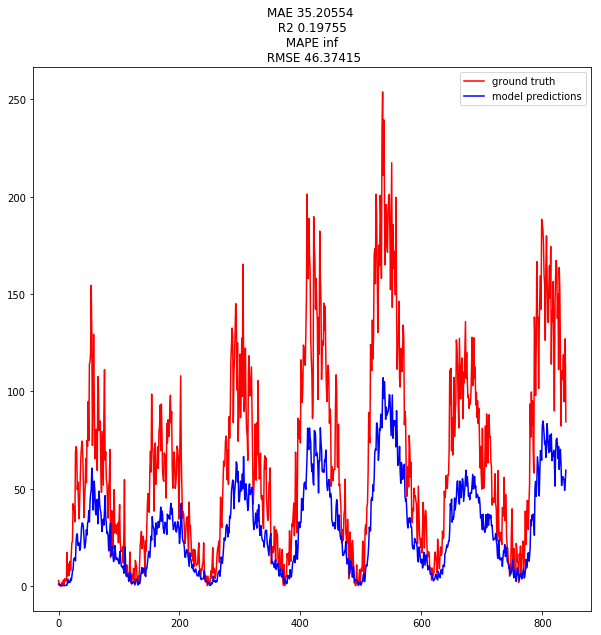

MAE 10.4870
R2 0.8199
RMSE 14.3745
[2.0175517] 3.011261




Plot, with Optimizer.
(840,) (840,)


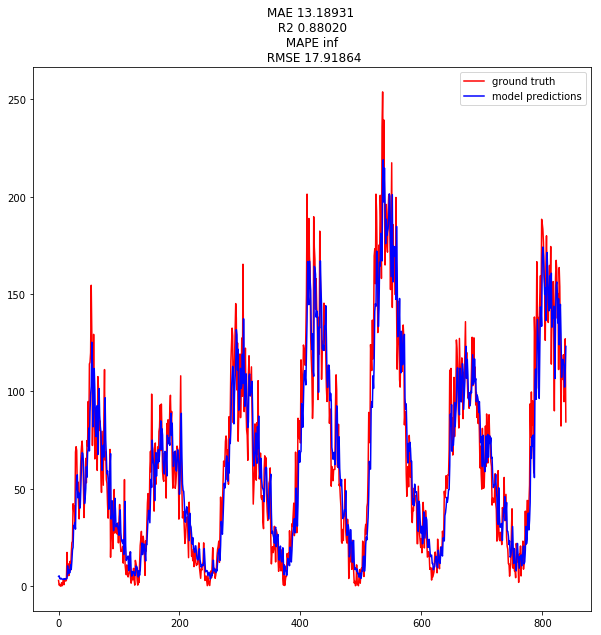

Done saving the results


[13.18930617832002, 0.8801953015445175]

In [15]:
results_collect(model_version="M2V1",dataset_name="Sunspot",callback_min_delta=0.05,patience_value=80,epoch_cnt=400)

In [68]:
spkl = pkl.load(open("search_dict.pkl","rb"))

In [69]:
#Search Space for Zurich Sunspot Data.
spkl

{51: [12.022260809690659,
  0.8950440210619589,
  16.753408610817903,
  26.202376598284072],
 61: [12.189797461896703,
  0.8939490379738801,
  16.758887317625152,
  26.47260796712877],
 63: [11.775954503080118,
  0.8994000672356364,
  16.3200110719233,
  25.840035735079255],
 67: [12.28229242906732,
  0.8930133460039094,
  16.796710615326784,
  26.679492197073856],
 69: [12.082772828476193,
  0.8946000447528923,
  16.661190522988527,
  26.534036501732395],
 71: [11.816592927065763,
  0.8974189035987977,
  16.436915110754118,
  26.202765045548283],
 75: [11.981907498836517,
  0.8936453143857699,
  16.68311839575215,
  26.726930039506037],
 81: [11.858004613340336,
  0.8956602950661495,
  16.465222360529758,
  26.5487358258819],
 91: [11.704918168898178,
  0.8966222308729106,
  16.2799838927217,
  26.55074616003575],
 101: [11.746406917244782,
  0.8924398978728207,
  16.41329557422407,
  27.131282717912914],
 111: [11.76668985813746,
  0.8921883705261995,
  16.29990240365636,
  27.267850

Create formatted data : (df shape) (289,)
Create time-stepped data : (d shape) (274, 15, 1)
Create formatted data :  (274, 7, 1) (274, 7, 1) (274,)
Dimensions of train and test :  (219, 7, 1)   (55, 7, 1)   (219,)   (55,)
Inside model_creation
Check
Train on 219 samples, validate on 55 samples
Epoch 1/600
219/219 [==============================] - 37s 171ms/step - loss: 40.3278 - mean_absolute_error: 40.8200 - rmse: 40.8200 - val_loss: 58.2568 - val_mean_absolute_error: 58.7525 - val_rmse: 58.7525
Epoch 2/600
219/219 [==============================] - 0s 588us/step - loss: 33.2103 - mean_absolute_error: 33.6998 - rmse: 33.6998 - val_loss: 51.4305 - val_mean_absolute_error: 51.9305 - val_rmse: 51.9305
Epoch 3/600
219/219 [==============================] - 0s 604us/step - loss: 30.0884 - mean_absolute_error: 30.5876 - rmse: 30.5876 - val_loss: 48.6150 - val_mean_absolute_error: 49.1130 - val_rmse: 49.1130
Epoch 4/600
219/219 [==============================] - 0s 657us/step - loss: 28.081

Epoch 78/600
219/219 [==============================] - 0s 699us/step - loss: 8.5806 - mean_absolute_error: 9.0592 - rmse: 9.0592 - val_loss: 12.4529 - val_mean_absolute_error: 12.9482 - val_rmse: 12.9482
Epoch 79/600
219/219 [==============================] - 0s 720us/step - loss: 10.6363 - mean_absolute_error: 11.1283 - rmse: 11.1283 - val_loss: 10.8543 - val_mean_absolute_error: 11.3379 - val_rmse: 11.3379
Epoch 80/600
219/219 [==============================] - 0s 741us/step - loss: 8.3696 - mean_absolute_error: 8.8612 - rmse: 8.8612 - val_loss: 18.6332 - val_mean_absolute_error: 19.1244 - val_rmse: 19.1244
Epoch 81/600
219/219 [==============================] - 0s 764us/step - loss: 9.2321 - mean_absolute_error: 9.7211 - rmse: 9.7211 - val_loss: 10.4422 - val_mean_absolute_error: 10.9416 - val_rmse: 10.9416
Epoch 82/600
219/219 [==============================] - 0s 760us/step - loss: 8.1855 - mean_absolute_error: 8.6665 - rmse: 8.6665 - val_loss: 10.5173 - val_mean_absolute_error: 

Epoch 118/600
219/219 [==============================] - 0s 733us/step - loss: 8.8992 - mean_absolute_error: 9.3839 - rmse: 9.3839 - val_loss: 10.1153 - val_mean_absolute_error: 10.6015 - val_rmse: 10.6015
Epoch 119/600
219/219 [==============================] - 0s 758us/step - loss: 8.6470 - mean_absolute_error: 9.1311 - rmse: 9.1311 - val_loss: 10.2816 - val_mean_absolute_error: 10.7538 - val_rmse: 10.7538
Epoch 120/600
219/219 [==============================] - 0s 728us/step - loss: 9.5361 - mean_absolute_error: 10.0151 - rmse: 10.0151 - val_loss: 11.0726 - val_mean_absolute_error: 11.5371 - val_rmse: 11.5371
Epoch 121/600
219/219 [==============================] - 0s 733us/step - loss: 8.2564 - mean_absolute_error: 8.7322 - rmse: 8.7322 - val_loss: 10.8298 - val_mean_absolute_error: 11.3154 - val_rmse: 11.3154
Epoch 122/600
219/219 [==============================] - 0s 695us/step - loss: 8.0428 - mean_absolute_error: 8.5160 - rmse: 8.5160 - val_loss: 10.2131 - val_mean_absolute_err

Epoch 158/600
219/219 [==============================] - 0s 738us/step - loss: 8.8100 - mean_absolute_error: 9.2914 - rmse: 9.2914 - val_loss: 11.5715 - val_mean_absolute_error: 12.0608 - val_rmse: 12.0608
Epoch 159/600
219/219 [==============================] - 0s 734us/step - loss: 9.7656 - mean_absolute_error: 10.2529 - rmse: 10.2529 - val_loss: 11.3469 - val_mean_absolute_error: 11.8419 - val_rmse: 11.8419
Epoch 160/600
219/219 [==============================] - 0s 716us/step - loss: 8.3671 - mean_absolute_error: 8.8465 - rmse: 8.8465 - val_loss: 11.4521 - val_mean_absolute_error: 11.9434 - val_rmse: 11.9434
Epoch 161/600
219/219 [==============================] - 0s 668us/step - loss: 7.8979 - mean_absolute_error: 8.3848 - rmse: 8.3848 - val_loss: 11.0061 - val_mean_absolute_error: 11.4952 - val_rmse: 11.4952
Epoch 162/600
219/219 [==============================] - 0s 643us/step - loss: 8.6431 - mean_absolute_error: 9.1233 - rmse: 9.1233 - val_loss: 15.8119 - val_mean_absolute_err

Epoch 198/600
219/219 [==============================] - 0s 718us/step - loss: 9.6692 - mean_absolute_error: 10.1628 - rmse: 10.1628 - val_loss: 11.2183 - val_mean_absolute_error: 11.6866 - val_rmse: 11.6866
Epoch 199/600
219/219 [==============================] - 0s 669us/step - loss: 7.8724 - mean_absolute_error: 8.3451 - rmse: 8.3451 - val_loss: 11.1509 - val_mean_absolute_error: 11.6265 - val_rmse: 11.6265
Epoch 200/600
219/219 [==============================] - 0s 684us/step - loss: 7.7253 - mean_absolute_error: 8.2030 - rmse: 8.2030 - val_loss: 9.9208 - val_mean_absolute_error: 10.3933 - val_rmse: 10.3933
Epoch 201/600
219/219 [==============================] - 0s 700us/step - loss: 7.7130 - mean_absolute_error: 8.1934 - rmse: 8.1934 - val_loss: 11.0644 - val_mean_absolute_error: 11.5419 - val_rmse: 11.5419
Epoch 202/600
219/219 [==============================] - 0s 726us/step - loss: 8.4808 - mean_absolute_error: 8.9671 - rmse: 8.9671 - val_loss: 11.2167 - val_mean_absolute_erro

Epoch 238/600
219/219 [==============================] - 0s 697us/step - loss: 8.0356 - mean_absolute_error: 8.5191 - rmse: 8.5191 - val_loss: 10.6948 - val_mean_absolute_error: 11.1731 - val_rmse: 11.1731
Epoch 239/600
219/219 [==============================] - 0s 691us/step - loss: 7.8787 - mean_absolute_error: 8.3537 - rmse: 8.3537 - val_loss: 10.5128 - val_mean_absolute_error: 10.9928 - val_rmse: 10.9928
Epoch 240/600
219/219 [==============================] - 0s 681us/step - loss: 8.4580 - mean_absolute_error: 8.9385 - rmse: 8.9385 - val_loss: 10.2294 - val_mean_absolute_error: 10.6950 - val_rmse: 10.6950
Epoch 241/600
219/219 [==============================] - 0s 631us/step - loss: 7.7503 - mean_absolute_error: 8.2202 - rmse: 8.2202 - val_loss: 11.5399 - val_mean_absolute_error: 12.0203 - val_rmse: 12.0203
Epoch 242/600
219/219 [==============================] - 0s 655us/step - loss: 8.3609 - mean_absolute_error: 8.8403 - rmse: 8.8403 - val_loss: 13.2991 - val_mean_absolute_error

Epoch 278/600
219/219 [==============================] - 0s 576us/step - loss: 7.7866 - mean_absolute_error: 8.2717 - rmse: 8.2717 - val_loss: 11.0559 - val_mean_absolute_error: 11.5411 - val_rmse: 11.5411
Epoch 279/600
219/219 [==============================] - 0s 666us/step - loss: 7.3393 - mean_absolute_error: 7.8183 - rmse: 7.8183 - val_loss: 10.2892 - val_mean_absolute_error: 10.7674 - val_rmse: 10.7674
Epoch 280/600
219/219 [==============================] - 0s 600us/step - loss: 8.3207 - mean_absolute_error: 8.7987 - rmse: 8.7987 - val_loss: 15.9059 - val_mean_absolute_error: 16.4008 - val_rmse: 16.4008
Epoch 281/600
219/219 [==============================] - 0s 731us/step - loss: 7.7168 - mean_absolute_error: 8.1985 - rmse: 8.1985 - val_loss: 10.9876 - val_mean_absolute_error: 11.4705 - val_rmse: 11.4705
Epoch 282/600
219/219 [==============================] - 0s 758us/step - loss: 7.4396 - mean_absolute_error: 7.9180 - rmse: 7.9180 - val_loss: 13.7215 - val_mean_absolute_error

Epoch 318/600
219/219 [==============================] - 0s 794us/step - loss: 7.0838 - mean_absolute_error: 7.5557 - rmse: 7.5557 - val_loss: 9.7202 - val_mean_absolute_error: 10.1968 - val_rmse: 10.1968
Epoch 319/600
219/219 [==============================] - 0s 695us/step - loss: 6.7067 - mean_absolute_error: 7.1766 - rmse: 7.1766 - val_loss: 10.8871 - val_mean_absolute_error: 11.3583 - val_rmse: 11.3583
Epoch 320/600
219/219 [==============================] - 0s 744us/step - loss: 7.1405 - mean_absolute_error: 7.6126 - rmse: 7.6126 - val_loss: 9.7119 - val_mean_absolute_error: 10.1760 - val_rmse: 10.1760
Epoch 321/600
219/219 [==============================] - 0s 753us/step - loss: 6.7931 - mean_absolute_error: 7.2638 - rmse: 7.2638 - val_loss: 10.3781 - val_mean_absolute_error: 10.8664 - val_rmse: 10.8664
Epoch 322/600
219/219 [==============================] - 0s 747us/step - loss: 7.4866 - mean_absolute_error: 7.9631 - rmse: 7.9631 - val_loss: 10.1234 - val_mean_absolute_error: 

Epoch 358/600
219/219 [==============================] - 0s 702us/step - loss: 7.2639 - mean_absolute_error: 7.7445 - rmse: 7.7445 - val_loss: 10.2410 - val_mean_absolute_error: 10.7160 - val_rmse: 10.7160
Epoch 359/600
219/219 [==============================] - 0s 757us/step - loss: 7.8123 - mean_absolute_error: 8.2926 - rmse: 8.2926 - val_loss: 9.9908 - val_mean_absolute_error: 10.4814 - val_rmse: 10.4814
Epoch 360/600
219/219 [==============================] - 0s 711us/step - loss: 7.3042 - mean_absolute_error: 7.7790 - rmse: 7.7790 - val_loss: 11.9998 - val_mean_absolute_error: 12.4927 - val_rmse: 12.4927
Epoch 361/600
219/219 [==============================] - 0s 728us/step - loss: 8.1457 - mean_absolute_error: 8.6273 - rmse: 8.6273 - val_loss: 11.1753 - val_mean_absolute_error: 11.6454 - val_rmse: 11.6454
Epoch 362/600
219/219 [==============================] - 0s 750us/step - loss: 8.0696 - mean_absolute_error: 8.5534 - rmse: 8.5534 - val_loss: 12.4925 - val_mean_absolute_error:

Epoch 398/600
219/219 [==============================] - 0s 630us/step - loss: 7.4360 - mean_absolute_error: 7.9095 - rmse: 7.9095 - val_loss: 10.1780 - val_mean_absolute_error: 10.6505 - val_rmse: 10.6505
Epoch 399/600
219/219 [==============================] - 0s 638us/step - loss: 8.0561 - mean_absolute_error: 8.5380 - rmse: 8.5380 - val_loss: 9.9002 - val_mean_absolute_error: 10.3872 - val_rmse: 10.3872
Epoch 400/600
219/219 [==============================] - 0s 724us/step - loss: 7.6812 - mean_absolute_error: 8.1549 - rmse: 8.1549 - val_loss: 10.6621 - val_mean_absolute_error: 11.1488 - val_rmse: 11.1488
Epoch 401/600
219/219 [==============================] - 0s 695us/step - loss: 7.0733 - mean_absolute_error: 7.5401 - rmse: 7.5401 - val_loss: 11.1472 - val_mean_absolute_error: 11.6372 - val_rmse: 11.6372
Epoch 402/600
219/219 [==============================] - 0s 724us/step - loss: 7.2154 - mean_absolute_error: 7.6869 - rmse: 7.6869 - val_loss: 10.4615 - val_mean_absolute_error:

Epoch 438/600
219/219 [==============================] - 0s 723us/step - loss: 6.6757 - mean_absolute_error: 7.1459 - rmse: 7.1459 - val_loss: 10.1484 - val_mean_absolute_error: 10.6312 - val_rmse: 10.6312
Epoch 439/600
219/219 [==============================] - 0s 742us/step - loss: 6.6844 - mean_absolute_error: 7.1545 - rmse: 7.1545 - val_loss: 11.7962 - val_mean_absolute_error: 12.2803 - val_rmse: 12.2803
Epoch 440/600
219/219 [==============================] - 0s 728us/step - loss: 7.2809 - mean_absolute_error: 7.7576 - rmse: 7.7576 - val_loss: 14.6135 - val_mean_absolute_error: 15.1135 - val_rmse: 15.1135
Epoch 441/600
219/219 [==============================] - 0s 763us/step - loss: 7.3237 - mean_absolute_error: 7.8038 - rmse: 7.8038 - val_loss: 13.0141 - val_mean_absolute_error: 13.5023 - val_rmse: 13.5023
Epoch 442/600
219/219 [==============================] - 0s 743us/step - loss: 7.4865 - mean_absolute_error: 7.9640 - rmse: 7.9640 - val_loss: 9.9204 - val_mean_absolute_error:

Epoch 478/600
219/219 [==============================] - 0s 725us/step - loss: 6.6087 - mean_absolute_error: 7.0837 - rmse: 7.0837 - val_loss: 10.8168 - val_mean_absolute_error: 11.2917 - val_rmse: 11.2917
Epoch 479/600
219/219 [==============================] - 0s 727us/step - loss: 6.4683 - mean_absolute_error: 6.9349 - rmse: 6.9349 - val_loss: 10.6666 - val_mean_absolute_error: 11.1529 - val_rmse: 11.1529
Epoch 480/600
219/219 [==============================] - 0s 750us/step - loss: 6.5363 - mean_absolute_error: 7.0014 - rmse: 7.0014 - val_loss: 9.9210 - val_mean_absolute_error: 10.4100 - val_rmse: 10.4100
Epoch 481/600
219/219 [==============================] - 0s 750us/step - loss: 6.7004 - mean_absolute_error: 7.1705 - rmse: 7.1705 - val_loss: 10.5857 - val_mean_absolute_error: 11.0684 - val_rmse: 11.0684
Epoch 482/600
219/219 [==============================] - 0s 758us/step - loss: 6.9097 - mean_absolute_error: 7.3868 - rmse: 7.3868 - val_loss: 11.6745 - val_mean_absolute_error:

Epoch 518/600
219/219 [==============================] - 0s 623us/step - loss: 7.4493 - mean_absolute_error: 7.9279 - rmse: 7.9279 - val_loss: 11.0761 - val_mean_absolute_error: 11.5714 - val_rmse: 11.5714
Epoch 519/600
219/219 [==============================] - 0s 718us/step - loss: 6.3542 - mean_absolute_error: 6.8323 - rmse: 6.8323 - val_loss: 9.2872 - val_mean_absolute_error: 9.7750 - val_rmse: 9.7750
Epoch 520/600
219/219 [==============================] - 0s 703us/step - loss: 6.4734 - mean_absolute_error: 6.9524 - rmse: 6.9524 - val_loss: 9.9180 - val_mean_absolute_error: 10.4042 - val_rmse: 10.4042
Epoch 521/600
219/219 [==============================] - 0s 772us/step - loss: 6.9516 - mean_absolute_error: 7.4217 - rmse: 7.4217 - val_loss: 9.6912 - val_mean_absolute_error: 10.1727 - val_rmse: 10.1727
Epoch 522/600
219/219 [==============================] - 0s 772us/step - loss: 7.1308 - mean_absolute_error: 7.6073 - rmse: 7.6073 - val_loss: 9.7842 - val_mean_absolute_error: 10.2

Epoch 558/600
219/219 [==============================] - 0s 732us/step - loss: 5.7917 - mean_absolute_error: 6.2557 - rmse: 6.2557 - val_loss: 10.8938 - val_mean_absolute_error: 11.3794 - val_rmse: 11.3794
Epoch 559/600
219/219 [==============================] - 0s 691us/step - loss: 6.0701 - mean_absolute_error: 6.5452 - rmse: 6.5452 - val_loss: 10.3385 - val_mean_absolute_error: 10.8219 - val_rmse: 10.8219
Epoch 560/600
219/219 [==============================] - 0s 645us/step - loss: 6.3170 - mean_absolute_error: 6.7903 - rmse: 6.7903 - val_loss: 10.9543 - val_mean_absolute_error: 11.4497 - val_rmse: 11.4497
Epoch 561/600
219/219 [==============================] - 0s 731us/step - loss: 6.3375 - mean_absolute_error: 6.8111 - rmse: 6.8111 - val_loss: 10.6913 - val_mean_absolute_error: 11.1715 - val_rmse: 11.1715
Epoch 562/600
219/219 [==============================] - 0s 776us/step - loss: 6.6111 - mean_absolute_error: 7.0838 - rmse: 7.0838 - val_loss: 13.5803 - val_mean_absolute_error

Epoch 598/600
219/219 [==============================] - 0s 717us/step - loss: 6.2260 - mean_absolute_error: 6.6986 - rmse: 6.6986 - val_loss: 10.8556 - val_mean_absolute_error: 11.3524 - val_rmse: 11.3524
Epoch 599/600
219/219 [==============================] - 0s 639us/step - loss: 6.4166 - mean_absolute_error: 6.8899 - rmse: 6.8899 - val_loss: 11.1928 - val_mean_absolute_error: 11.6852 - val_rmse: 11.6852
Epoch 600/600
219/219 [==============================] - 0s 671us/step - loss: 5.8903 - mean_absolute_error: 6.3557 - rmse: 6.3557 - val_loss: 16.4442 - val_mean_absolute_error: 16.9410 - val_rmse: 16.9410
Plot, without Optimizer.


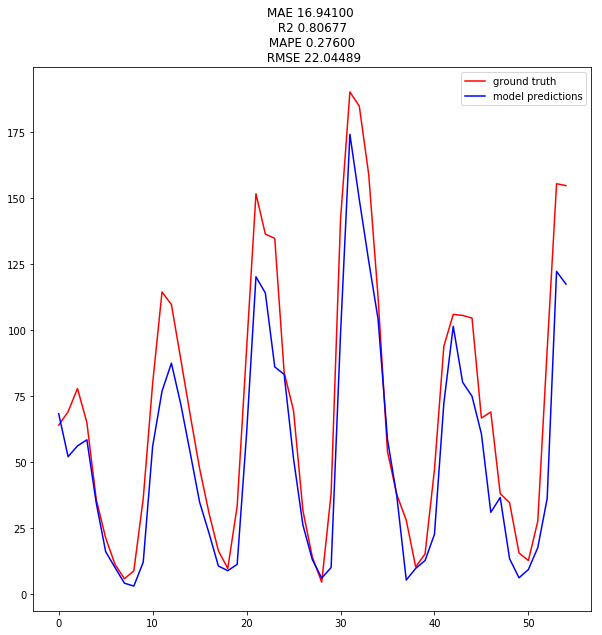

MAE 6.2605
R2 0.9055
RMSE 9.5655
[1.1646395] 3.782257




Plot, with Optimizer.
(55,) (55,)


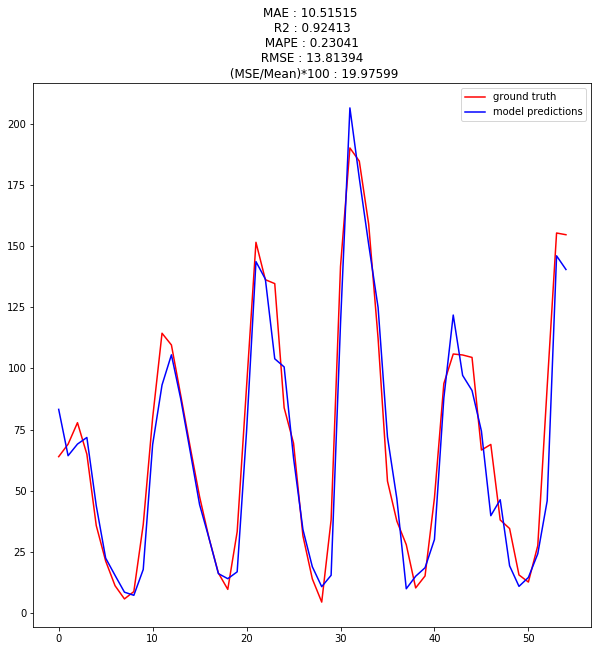

Done saving the results


[10.515149785822086,
 0.9241252069744109,
 13.813940874782086,
 19.975988539543955]

In [89]:
#Wolfer.
results_collect(model_version="M3V1",dataset_name="Wolfer",callback_min_delta=0.05,patience_value=80,epoch_cnt=600, optim = SGD(lr = 0.001, decay = 0.0001), timesteps = 15, frac = 0.8)

Create formatted data : (df shape) (289,)
Create time-stepped data : (d shape) (274, 15, 1)
Create formatted data :  (274, 7, 1) (274, 7, 1) (274,)
Dimensions of train and test :  (219, 7, 1)   (55, 7, 1)   (219,)   (55,)
Inside model_creation
Check
Train on 219 samples, validate on 55 samples
Epoch 1/600
219/219 [==============================] - 34s 156ms/step - loss: 42.0615 - mean_absolute_error: 42.5587 - rmse: 42.5587 - val_loss: 63.3393 - val_mean_absolute_error: 63.8393 - val_rmse: 63.8393
Epoch 2/600
219/219 [==============================] - 0s 602us/step - loss: 36.3760 - mean_absolute_error: 36.8660 - rmse: 36.8660 - val_loss: 52.7911 - val_mean_absolute_error: 53.2911 - val_rmse: 53.2911
Epoch 3/600
219/219 [==============================] - 0s 638us/step - loss: 30.4543 - mean_absolute_error: 30.9486 - rmse: 30.9486 - val_loss: 47.7896 - val_mean_absolute_error: 48.2896 - val_rmse: 48.2896
Epoch 4/600
219/219 [==============================] - 0s 604us/step - loss: 27.137

219/219 [==============================] - 0s 582us/step - loss: 9.5792 - mean_absolute_error: 10.0680 - rmse: 10.0680 - val_loss: 14.5337 - val_mean_absolute_error: 15.0232 - val_rmse: 15.0232
Epoch 40/600
219/219 [==============================] - 0s 585us/step - loss: 9.2925 - mean_absolute_error: 9.7780 - rmse: 9.7780 - val_loss: 14.7651 - val_mean_absolute_error: 15.2501 - val_rmse: 15.2501
Epoch 41/600
219/219 [==============================] - 0s 627us/step - loss: 9.4674 - mean_absolute_error: 9.9455 - rmse: 9.9455 - val_loss: 12.1369 - val_mean_absolute_error: 12.6240 - val_rmse: 12.6240
Epoch 42/600
219/219 [==============================] - 0s 601us/step - loss: 8.5011 - mean_absolute_error: 8.9832 - rmse: 8.9832 - val_loss: 12.0037 - val_mean_absolute_error: 12.4966 - val_rmse: 12.4966
Epoch 43/600
219/219 [==============================] - 0s 613us/step - loss: 10.4176 - mean_absolute_error: 10.9071 - rmse: 10.9071 - val_loss: 11.3636 - val_mean_absolute_error: 11.8497 - v

Epoch 79/600
219/219 [==============================] - 0s 578us/step - loss: 8.3283 - mean_absolute_error: 8.8102 - rmse: 8.8102 - val_loss: 12.1293 - val_mean_absolute_error: 12.6266 - val_rmse: 12.6266
Epoch 80/600
219/219 [==============================] - 0s 606us/step - loss: 9.5144 - mean_absolute_error: 10.0056 - rmse: 10.0056 - val_loss: 10.6742 - val_mean_absolute_error: 11.1612 - val_rmse: 11.1612
Epoch 81/600
219/219 [==============================] - 0s 668us/step - loss: 9.0463 - mean_absolute_error: 9.5235 - rmse: 9.5235 - val_loss: 15.3203 - val_mean_absolute_error: 15.8203 - val_rmse: 15.8203
Epoch 82/600
219/219 [==============================] - 0s 673us/step - loss: 10.8177 - mean_absolute_error: 11.3000 - rmse: 11.3000 - val_loss: 11.7650 - val_mean_absolute_error: 12.2596 - val_rmse: 12.2596
Epoch 83/600
219/219 [==============================] - 0s 614us/step - loss: 8.1098 - mean_absolute_error: 8.5861 - rmse: 8.5861 - val_loss: 14.3533 - val_mean_absolute_error

Epoch 119/600
219/219 [==============================] - 0s 610us/step - loss: 8.5316 - mean_absolute_error: 9.0133 - rmse: 9.0133 - val_loss: 12.2058 - val_mean_absolute_error: 12.6869 - val_rmse: 12.6869
Epoch 120/600
219/219 [==============================] - 0s 617us/step - loss: 8.7387 - mean_absolute_error: 9.2236 - rmse: 9.2236 - val_loss: 13.4965 - val_mean_absolute_error: 13.9796 - val_rmse: 13.9796
Epoch 121/600
219/219 [==============================] - 0s 613us/step - loss: 9.1284 - mean_absolute_error: 9.6113 - rmse: 9.6113 - val_loss: 10.0282 - val_mean_absolute_error: 10.5175 - val_rmse: 10.5175
Epoch 122/600
219/219 [==============================] - 0s 743us/step - loss: 9.3070 - mean_absolute_error: 9.7909 - rmse: 9.7909 - val_loss: 10.0698 - val_mean_absolute_error: 10.5579 - val_rmse: 10.5579
Epoch 123/600
219/219 [==============================] - 0s 711us/step - loss: 8.8287 - mean_absolute_error: 9.3114 - rmse: 9.3114 - val_loss: 10.4678 - val_mean_absolute_error

Epoch 159/600
219/219 [==============================] - 0s 677us/step - loss: 9.3019 - mean_absolute_error: 9.7957 - rmse: 9.7957 - val_loss: 11.8413 - val_mean_absolute_error: 12.3262 - val_rmse: 12.3262
Epoch 160/600
219/219 [==============================] - 0s 644us/step - loss: 8.0222 - mean_absolute_error: 8.5043 - rmse: 8.5043 - val_loss: 11.7059 - val_mean_absolute_error: 12.1910 - val_rmse: 12.1910
Epoch 161/600
219/219 [==============================] - 0s 596us/step - loss: 8.4259 - mean_absolute_error: 8.9072 - rmse: 8.9072 - val_loss: 12.5942 - val_mean_absolute_error: 13.0706 - val_rmse: 13.0706
Epoch 162/600
219/219 [==============================] - 0s 655us/step - loss: 9.0619 - mean_absolute_error: 9.5458 - rmse: 9.5458 - val_loss: 9.9900 - val_mean_absolute_error: 10.4715 - val_rmse: 10.4715
Epoch 163/600
219/219 [==============================] - 0s 664us/step - loss: 8.3999 - mean_absolute_error: 8.8852 - rmse: 8.8852 - val_loss: 11.1475 - val_mean_absolute_error:

Epoch 199/600
219/219 [==============================] - 0s 623us/step - loss: 8.0143 - mean_absolute_error: 8.5005 - rmse: 8.5005 - val_loss: 23.5893 - val_mean_absolute_error: 24.0893 - val_rmse: 24.0893
Epoch 200/600
219/219 [==============================] - 0s 638us/step - loss: 8.8056 - mean_absolute_error: 9.2835 - rmse: 9.2835 - val_loss: 16.5408 - val_mean_absolute_error: 17.0253 - val_rmse: 17.0253
Epoch 201/600
219/219 [==============================] - 0s 690us/step - loss: 8.1653 - mean_absolute_error: 8.6475 - rmse: 8.6475 - val_loss: 12.3498 - val_mean_absolute_error: 12.8311 - val_rmse: 12.8311
Epoch 202/600
219/219 [==============================] - 0s 673us/step - loss: 7.9337 - mean_absolute_error: 8.4164 - rmse: 8.4164 - val_loss: 11.6505 - val_mean_absolute_error: 12.1288 - val_rmse: 12.1288
Epoch 203/600
219/219 [==============================] - 0s 681us/step - loss: 7.9205 - mean_absolute_error: 8.4031 - rmse: 8.4031 - val_loss: 11.4393 - val_mean_absolute_error

Epoch 239/600
219/219 [==============================] - 0s 633us/step - loss: 8.3890 - mean_absolute_error: 8.8633 - rmse: 8.8633 - val_loss: 11.3009 - val_mean_absolute_error: 11.7879 - val_rmse: 11.7879
Epoch 240/600
219/219 [==============================] - 0s 713us/step - loss: 7.5602 - mean_absolute_error: 8.0414 - rmse: 8.0414 - val_loss: 13.9486 - val_mean_absolute_error: 14.4486 - val_rmse: 14.4486
Epoch 241/600
219/219 [==============================] - 0s 660us/step - loss: 8.8162 - mean_absolute_error: 9.2985 - rmse: 9.2985 - val_loss: 10.7044 - val_mean_absolute_error: 11.2024 - val_rmse: 11.2024
Epoch 242/600
219/219 [==============================] - 0s 609us/step - loss: 8.2471 - mean_absolute_error: 8.7232 - rmse: 8.7232 - val_loss: 11.0596 - val_mean_absolute_error: 11.5420 - val_rmse: 11.5420
Epoch 243/600
219/219 [==============================] - 0s 732us/step - loss: 8.2939 - mean_absolute_error: 8.7728 - rmse: 8.7728 - val_loss: 16.7580 - val_mean_absolute_error

Epoch 279/600
219/219 [==============================] - 0s 682us/step - loss: 8.5084 - mean_absolute_error: 8.9962 - rmse: 8.9962 - val_loss: 10.2916 - val_mean_absolute_error: 10.7870 - val_rmse: 10.7870
Epoch 280/600
219/219 [==============================] - 0s 723us/step - loss: 7.2919 - mean_absolute_error: 7.7619 - rmse: 7.7619 - val_loss: 13.9188 - val_mean_absolute_error: 14.4187 - val_rmse: 14.4187
Epoch 281/600
219/219 [==============================] - 0s 676us/step - loss: 7.5465 - mean_absolute_error: 8.0333 - rmse: 8.0333 - val_loss: 15.0404 - val_mean_absolute_error: 15.5223 - val_rmse: 15.5223
Epoch 282/600
219/219 [==============================] - 0s 597us/step - loss: 7.6951 - mean_absolute_error: 8.1687 - rmse: 8.1687 - val_loss: 10.1992 - val_mean_absolute_error: 10.6712 - val_rmse: 10.6712
Epoch 283/600
219/219 [==============================] - 0s 547us/step - loss: 7.6481 - mean_absolute_error: 8.1294 - rmse: 8.1294 - val_loss: 12.3706 - val_mean_absolute_error

Epoch 319/600
219/219 [==============================] - 0s 622us/step - loss: 7.4698 - mean_absolute_error: 7.9492 - rmse: 7.9492 - val_loss: 12.9157 - val_mean_absolute_error: 13.3923 - val_rmse: 13.3923
Epoch 320/600
219/219 [==============================] - 0s 680us/step - loss: 8.2751 - mean_absolute_error: 8.7577 - rmse: 8.7577 - val_loss: 10.6608 - val_mean_absolute_error: 11.1456 - val_rmse: 11.1456
Epoch 321/600
219/219 [==============================] - 0s 640us/step - loss: 8.0643 - mean_absolute_error: 8.5413 - rmse: 8.5413 - val_loss: 12.5264 - val_mean_absolute_error: 12.9895 - val_rmse: 12.9895
Epoch 322/600
219/219 [==============================] - 0s 652us/step - loss: 8.8066 - mean_absolute_error: 9.2932 - rmse: 9.2932 - val_loss: 10.1446 - val_mean_absolute_error: 10.6387 - val_rmse: 10.6387
Epoch 323/600
219/219 [==============================] - 0s 688us/step - loss: 8.0464 - mean_absolute_error: 8.5299 - rmse: 8.5299 - val_loss: 11.3352 - val_mean_absolute_error

Epoch 359/600
219/219 [==============================] - 0s 667us/step - loss: 7.1765 - mean_absolute_error: 7.6522 - rmse: 7.6522 - val_loss: 13.3991 - val_mean_absolute_error: 13.8942 - val_rmse: 13.8942
Epoch 360/600
219/219 [==============================] - 0s 630us/step - loss: 8.6437 - mean_absolute_error: 9.1158 - rmse: 9.1158 - val_loss: 10.5449 - val_mean_absolute_error: 11.0225 - val_rmse: 11.0225
Epoch 361/600
219/219 [==============================] - 0s 606us/step - loss: 7.7013 - mean_absolute_error: 8.1757 - rmse: 8.1757 - val_loss: 12.9662 - val_mean_absolute_error: 13.4567 - val_rmse: 13.4567
Epoch 362/600
219/219 [==============================] - 0s 647us/step - loss: 7.0424 - mean_absolute_error: 7.5230 - rmse: 7.5230 - val_loss: 11.3959 - val_mean_absolute_error: 11.8744 - val_rmse: 11.8744
Epoch 363/600
219/219 [==============================] - 0s 703us/step - loss: 7.8175 - mean_absolute_error: 8.3027 - rmse: 8.3027 - val_loss: 16.5232 - val_mean_absolute_error

Epoch 399/600
219/219 [==============================] - 0s 631us/step - loss: 7.3358 - mean_absolute_error: 7.8146 - rmse: 7.8146 - val_loss: 15.6515 - val_mean_absolute_error: 16.1481 - val_rmse: 16.1481
Epoch 400/600
219/219 [==============================] - 0s 702us/step - loss: 8.6995 - mean_absolute_error: 9.1808 - rmse: 9.1808 - val_loss: 12.8160 - val_mean_absolute_error: 13.3139 - val_rmse: 13.3139
Epoch 401/600
219/219 [==============================] - 0s 634us/step - loss: 6.8583 - mean_absolute_error: 7.3346 - rmse: 7.3346 - val_loss: 11.5419 - val_mean_absolute_error: 12.0419 - val_rmse: 12.0419
Epoch 402/600
219/219 [==============================] - 0s 627us/step - loss: 6.6924 - mean_absolute_error: 7.1599 - rmse: 7.1599 - val_loss: 11.1724 - val_mean_absolute_error: 11.6722 - val_rmse: 11.6722
Epoch 403/600
219/219 [==============================] - 0s 705us/step - loss: 7.0681 - mean_absolute_error: 7.5463 - rmse: 7.5463 - val_loss: 12.2775 - val_mean_absolute_error

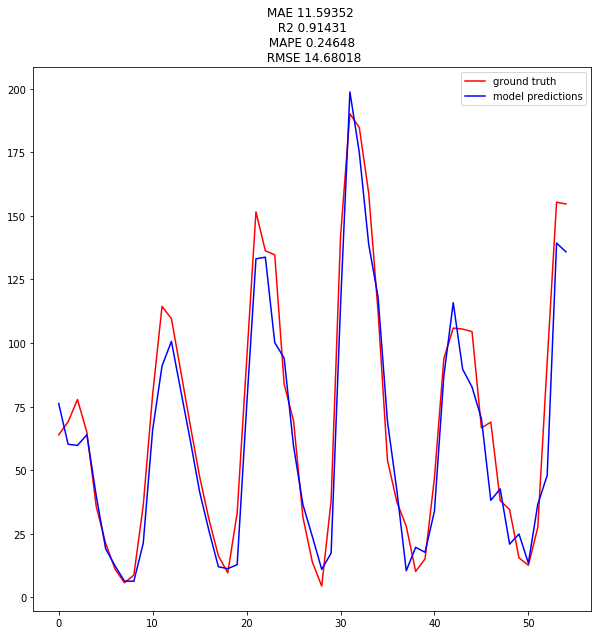

MAE 7.4459
R2 0.8832
RMSE 10.6314
[1.0391816] 1.7202492




Plot, with Optimizer.
(55,) (55,)


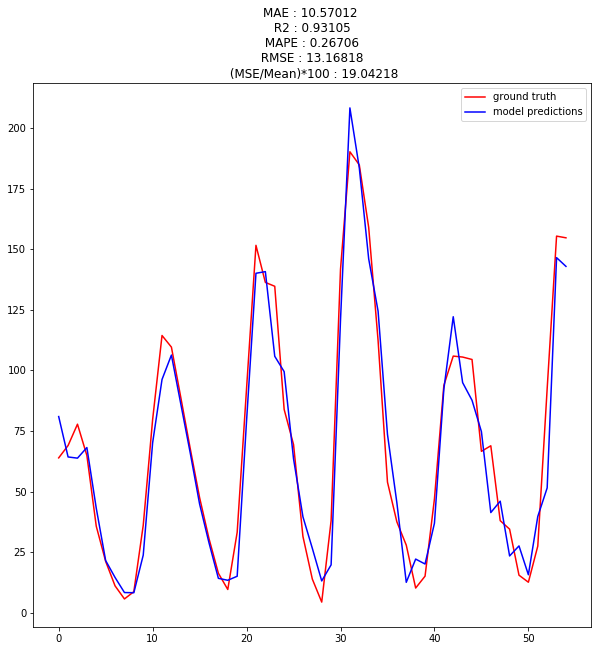

Done saving the results


[10.570115724043411,
 0.9310531997116844,
 13.168184146666624,
 19.042176159927024]

In [84]:
#Wolfer.
results_collect(model_version="M3V1",dataset_name="Wolfer",callback_min_delta=0.05,patience_value=80,epoch_cnt=600, optim = SGD(lr = 0.001), timesteps = 15, frac = 0.8)

Create formatted data : (df shape) (2820,)
Create time-stepped data : (d shape) (2759, 61, 1)
Create formatted data :  (2759, 30, 1) (2759, 30, 1) (2759,)
Dimensions of train and test :  (1931, 30, 1)   (828, 30, 1)   (1931,)   (828,)
Inside model_creation
Check
Train on 1931 samples, validate on 828 samples
Epoch 1/100
1931/1931 [==============================] - 18s 10ms/step - loss: 42.4112 - mean_absolute_error: 42.8983 - rmse: 42.8983 - val_loss: 47.4032 - val_mean_absolute_error: 47.8985 - val_rmse: 47.8985
Epoch 2/100
1931/1931 [==============================] - 6s 3ms/step - loss: 20.0970 - mean_absolute_error: 20.5885 - rmse: 20.5885 - val_loss: 23.0587 - val_mean_absolute_error: 23.5545 - val_rmse: 23.5545
Epoch 3/100
1931/1931 [==============================] - 6s 3ms/step - loss: 15.3210 - mean_absolute_error: 15.8112 - rmse: 15.8112 - val_loss: 18.5324 - val_mean_absolute_error: 19.0270 - val_rmse: 19.0270
Epoch 4/100
1931/1931 [==============================] - 6s 3ms/ste

Epoch 39/100
1931/1931 [==============================] - 6s 3ms/step - loss: 10.1957 - mean_absolute_error: 10.6829 - rmse: 10.6829 - val_loss: 13.0121 - val_mean_absolute_error: 13.5019 - val_rmse: 13.5019
Epoch 40/100
1931/1931 [==============================] - 6s 3ms/step - loss: 10.1088 - mean_absolute_error: 10.5967 - rmse: 10.5967 - val_loss: 13.1421 - val_mean_absolute_error: 13.6295 - val_rmse: 13.6295
Epoch 41/100
1931/1931 [==============================] - 6s 3ms/step - loss: 10.1848 - mean_absolute_error: 10.6711 - rmse: 10.6711 - val_loss: 12.6749 - val_mean_absolute_error: 13.1612 - val_rmse: 13.1612
Epoch 42/100
1931/1931 [==============================] - 6s 3ms/step - loss: 10.1363 - mean_absolute_error: 10.6218 - rmse: 10.6218 - val_loss: 15.1831 - val_mean_absolute_error: 15.6723 - val_rmse: 15.6723
Epoch 43/100
1931/1931 [==============================] - 6s 3ms/step - loss: 10.1908 - mean_absolute_error: 10.6787 - rmse: 10.6787 - val_loss: 12.6272 - val_mean_abso

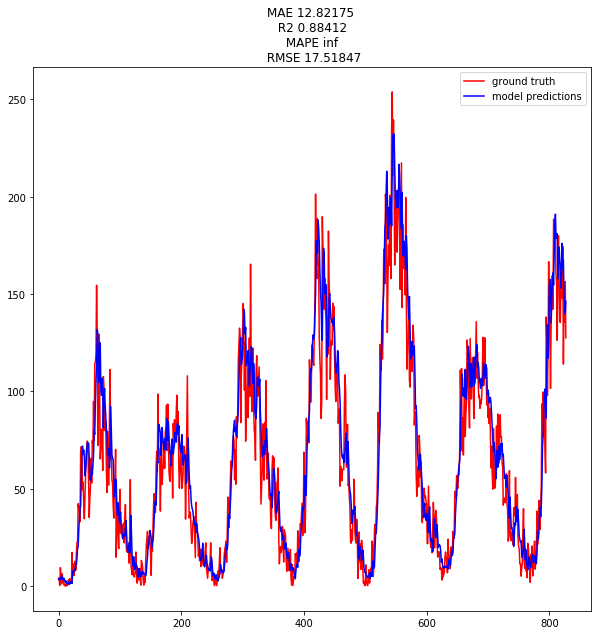

MAE 9.7303
R2 0.8401
RMSE 13.5349
[0.90616024] 2.1404648




Plot, with Optimizer.
(828,) (828,)


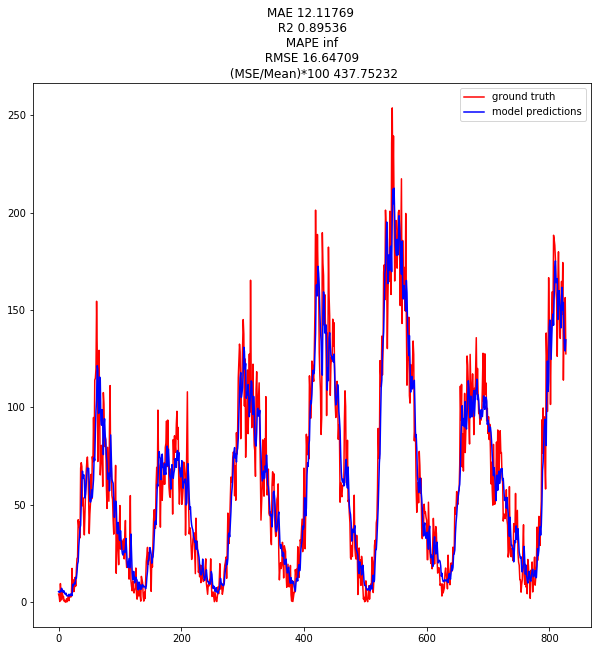

Done saving the results


[12.11768736038807, 0.8953591734681337]

In [55]:
results_collect(model_version="M3V1",dataset_name="Sunspot",callback_min_delta=0.05,patience_value=80,epoch_cnt=100, optim = SGD(lr = 0.0001), timesteps = 61)

Create formatted data : (df shape) (2820,)
Create time-stepped data : (d shape) (2759, 61, 1)
Create formatted data :  (2759, 30, 1) (2759, 30, 1) (2759,)
Dimensions of train and test :  (1931, 30, 1)   (828, 30, 1)   (1931,)   (828,)
Inside model_creation
Check
Train on 1931 samples, validate on 828 samples
Epoch 1/100
1931/1931 [==============================] - 17s 9ms/step - loss: 37.0119 - mean_absolute_error: 37.4988 - rmse: 37.4988 - val_loss: 28.4430 - val_mean_absolute_error: 28.9389 - val_rmse: 28.9389
Epoch 2/100
1931/1931 [==============================] - 6s 3ms/step - loss: 17.8503 - mean_absolute_error: 18.3435 - rmse: 18.3435 - val_loss: 23.4639 - val_mean_absolute_error: 23.9567 - val_rmse: 23.9567
Epoch 3/100
1931/1931 [==============================] - 6s 3ms/step - loss: 14.9412 - mean_absolute_error: 15.4326 - rmse: 15.4326 - val_loss: 18.0839 - val_mean_absolute_error: 18.5770 - val_rmse: 18.5770
Epoch 4/100
1931/1931 [==============================] - 7s 3ms/step

Epoch 39/100
1931/1931 [==============================] - 6s 3ms/step - loss: 10.2634 - mean_absolute_error: 10.7495 - rmse: 10.7495 - val_loss: 12.5754 - val_mean_absolute_error: 13.0641 - val_rmse: 13.0641
Epoch 40/100
1931/1931 [==============================] - 6s 3ms/step - loss: 10.3155 - mean_absolute_error: 10.8013 - rmse: 10.8013 - val_loss: 17.3957 - val_mean_absolute_error: 17.8853 - val_rmse: 17.8853
Epoch 41/100
1931/1931 [==============================] - 7s 3ms/step - loss: 10.2520 - mean_absolute_error: 10.7366 - rmse: 10.7366 - val_loss: 12.4955 - val_mean_absolute_error: 12.9857 - val_rmse: 12.9857
Epoch 42/100
1931/1931 [==============================] - 6s 3ms/step - loss: 10.1549 - mean_absolute_error: 10.6408 - rmse: 10.6408 - val_loss: 14.0918 - val_mean_absolute_error: 14.5816 - val_rmse: 14.5816
Epoch 43/100
1931/1931 [==============================] - 6s 3ms/step - loss: 10.3188 - mean_absolute_error: 10.8058 - rmse: 10.8058 - val_loss: 14.8472 - val_mean_abso

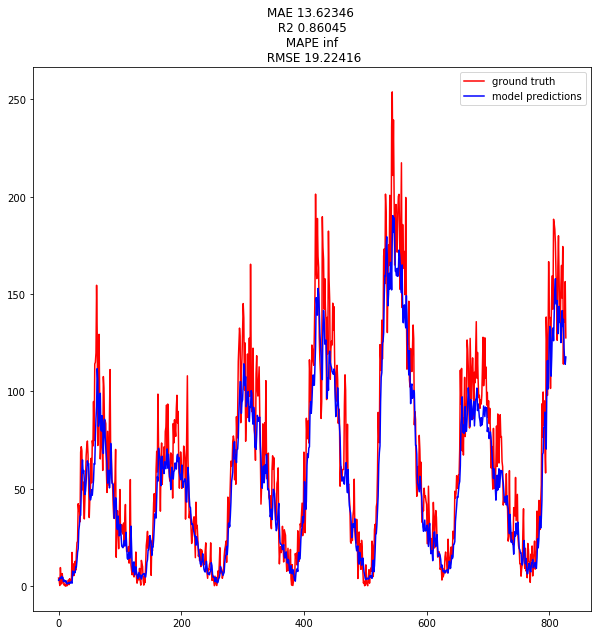

MAE 9.7427
R2 0.8404
RMSE 13.5212
[1.0962715] 2.3523903




Plot, with Optimizer.
(828,) (828,)


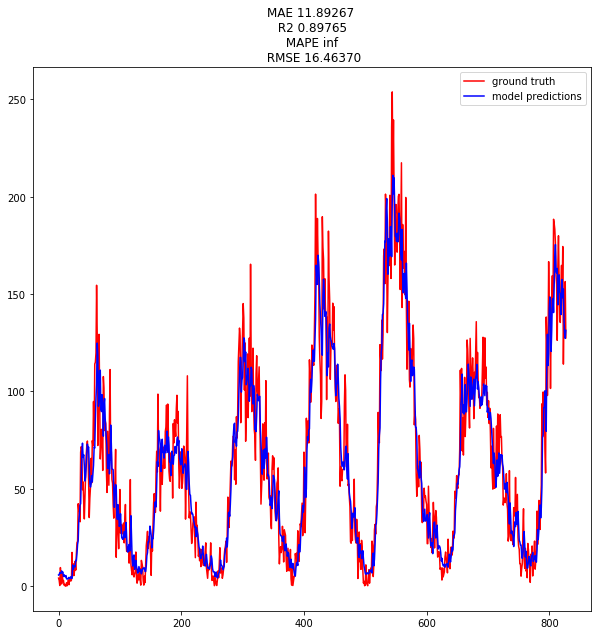

Done saving the results


[11.892671854254129, 0.8976519939099834]

In [26]:
results_collect(model_version="M3V1",dataset_name="Sunspot",callback_min_delta=0.05,patience_value=80,epoch_cnt=100, optim = SGD(lr = 0.0001), timesteps = 61)

Inside model_creation
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 4s 2ms/step - loss: 41.5595 - mean_absolute_error: 42.0453 - rmse: 42.0453 - val_loss: 56.3428 - val_mean_absolute_error: 56.8383 - val_rmse: 56.8383
Epoch 2/400
1959/1959 [==============================] - 1s 300us/step - loss: 31.3847 - mean_absolute_error: 31.8712 - rmse: 31.8712 - val_loss: 24.8512 - val_mean_absolute_error: 25.3432 - val_rmse: 25.3432
Epoch 3/400
1959/1959 [==============================] - 1s 295us/step - loss: 12.9680 - mean_absolute_error: 13.4547 - rmse: 13.4547 - val_loss: 17.1470 - val_mean_absolute_error: 17.6424 - val_rmse: 17.6424
Epoch 4/400
1959/1959 [==============================] - 1s 288us/step - loss: 12.3758 - mean_absolute_error: 12.8629 - rmse: 12.8629 - val_loss: 16.9431 - val_mean_absolute_error: 17.4384 - val_rmse: 17.4384
Epoch 5/400
1959/1959 [==============================] - 1s 282us/step - loss: 12.2244 - me

Epoch 40/400
1959/1959 [==============================] - 1s 286us/step - loss: 10.3138 - mean_absolute_error: 10.7994 - rmse: 10.7994 - val_loss: 13.3355 - val_mean_absolute_error: 13.8279 - val_rmse: 13.8279
Epoch 41/400
1959/1959 [==============================] - 1s 279us/step - loss: 10.3325 - mean_absolute_error: 10.8166 - rmse: 10.8166 - val_loss: 12.9274 - val_mean_absolute_error: 13.4192 - val_rmse: 13.4192
Epoch 42/400
1959/1959 [==============================] - 1s 273us/step - loss: 10.3280 - mean_absolute_error: 10.8123 - rmse: 10.8123 - val_loss: 13.6031 - val_mean_absolute_error: 14.0924 - val_rmse: 14.0924
Epoch 43/400
1959/1959 [==============================] - 1s 271us/step - loss: 10.3260 - mean_absolute_error: 10.8094 - rmse: 10.8094 - val_loss: 13.1483 - val_mean_absolute_error: 13.6401 - val_rmse: 13.6401
Epoch 44/400
1959/1959 [==============================] - 1s 276us/step - loss: 10.3373 - mean_absolute_error: 10.8232 - rmse: 10.8232 - val_loss: 13.3172 - val

1959/1959 [==============================] - 1s 287us/step - loss: 10.0566 - mean_absolute_error: 10.5419 - rmse: 10.5419 - val_loss: 12.7280 - val_mean_absolute_error: 13.2144 - val_rmse: 13.2144
Epoch 80/400
1959/1959 [==============================] - 1s 283us/step - loss: 10.0745 - mean_absolute_error: 10.5598 - rmse: 10.5598 - val_loss: 12.5880 - val_mean_absolute_error: 13.0790 - val_rmse: 13.0790
Epoch 81/400
1959/1959 [==============================] - 1s 277us/step - loss: 10.0628 - mean_absolute_error: 10.5485 - rmse: 10.5485 - val_loss: 12.4602 - val_mean_absolute_error: 12.9514 - val_rmse: 12.9514
Epoch 82/400
1959/1959 [==============================] - 1s 275us/step - loss: 10.0156 - mean_absolute_error: 10.5002 - rmse: 10.5002 - val_loss: 13.3657 - val_mean_absolute_error: 13.8559 - val_rmse: 13.8559
Epoch 83/400
1959/1959 [==============================] - 1s 271us/step - loss: 10.0975 - mean_absolute_error: 10.5833 - rmse: 10.5833 - val_loss: 12.3029 - val_mean_absolut

1959/1959 [==============================] - 1s 268us/step - loss: 9.9810 - mean_absolute_error: 10.4655 - rmse: 10.4655 - val_loss: 12.1386 - val_mean_absolute_error: 12.6275 - val_rmse: 12.6275
Epoch 119/400
1959/1959 [==============================] - 1s 267us/step - loss: 10.0185 - mean_absolute_error: 10.5052 - rmse: 10.5052 - val_loss: 12.4533 - val_mean_absolute_error: 12.9447 - val_rmse: 12.9447
Epoch 120/400
1959/1959 [==============================] - 1s 271us/step - loss: 9.9840 - mean_absolute_error: 10.4711 - rmse: 10.4711 - val_loss: 12.6353 - val_mean_absolute_error: 13.1282 - val_rmse: 13.1282
Epoch 121/400
1959/1959 [==============================] - 1s 269us/step - loss: 9.9657 - mean_absolute_error: 10.4503 - rmse: 10.4503 - val_loss: 12.1763 - val_mean_absolute_error: 12.6643 - val_rmse: 12.6643
Epoch 122/400
1959/1959 [==============================] - 1s 288us/step - loss: 9.9639 - mean_absolute_error: 10.4494 - rmse: 10.4494 - val_loss: 12.5290 - val_mean_absolut

1959/1959 [==============================] - 1s 285us/step - loss: 9.9725 - mean_absolute_error: 10.4574 - rmse: 10.4574 - val_loss: 12.2562 - val_mean_absolute_error: 12.7469 - val_rmse: 12.7469
Epoch 158/400
1959/1959 [==============================] - 1s 292us/step - loss: 9.9759 - mean_absolute_error: 10.4607 - rmse: 10.4607 - val_loss: 12.1298 - val_mean_absolute_error: 12.6185 - val_rmse: 12.6185
Epoch 159/400
1959/1959 [==============================] - 1s 277us/step - loss: 9.9708 - mean_absolute_error: 10.4555 - rmse: 10.4555 - val_loss: 12.1068 - val_mean_absolute_error: 12.5955 - val_rmse: 12.5955
Epoch 160/400
1959/1959 [==============================] - 1s 275us/step - loss: 9.9654 - mean_absolute_error: 10.4512 - rmse: 10.4512 - val_loss: 12.2819 - val_mean_absolute_error: 12.7714 - val_rmse: 12.7714
Epoch 161/400
1959/1959 [==============================] - 1s 277us/step - loss: 9.9531 - mean_absolute_error: 10.4365 - rmse: 10.4365 - val_loss: 12.4494 - val_mean_absolute

1959/1959 [==============================] - 1s 273us/step - loss: 9.9221 - mean_absolute_error: 10.4061 - rmse: 10.4061 - val_loss: 13.6395 - val_mean_absolute_error: 14.1312 - val_rmse: 14.1312
Epoch 236/400
1959/1959 [==============================] - 1s 270us/step - loss: 9.9421 - mean_absolute_error: 10.4259 - rmse: 10.4259 - val_loss: 12.3156 - val_mean_absolute_error: 12.8073 - val_rmse: 12.8073
Epoch 237/400
1959/1959 [==============================] - 1s 275us/step - loss: 9.9305 - mean_absolute_error: 10.4162 - rmse: 10.4162 - val_loss: 12.2846 - val_mean_absolute_error: 12.7759 - val_rmse: 12.7759
Epoch 238/400
1959/1959 [==============================] - 1s 276us/step - loss: 9.8916 - mean_absolute_error: 10.3760 - rmse: 10.3760 - val_loss: 12.1610 - val_mean_absolute_error: 12.6520 - val_rmse: 12.6520
Epoch 239/400
1959/1959 [==============================] - 1s 285us/step - loss: 9.9214 - mean_absolute_error: 10.4071 - rmse: 10.4071 - val_loss: 12.2037 - val_mean_absolute

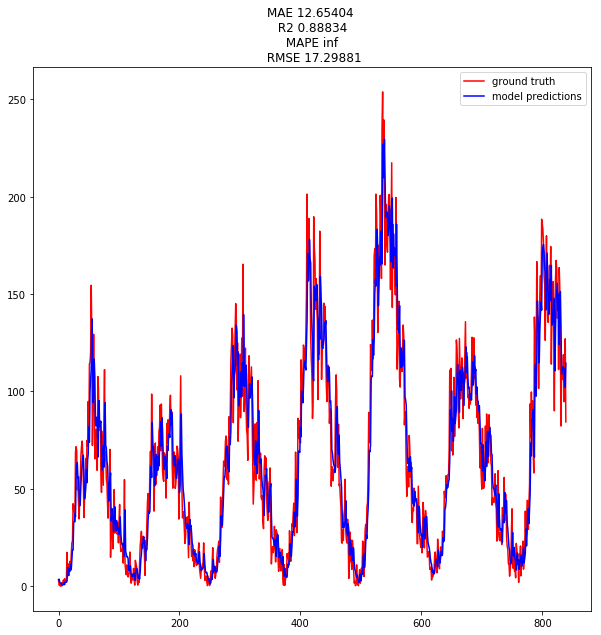

MAE 9.9636
R2 0.8339
RMSE 13.8058
[0.9698983] 1.4263954




Plot, with Optimizer.
(840,) (840,)


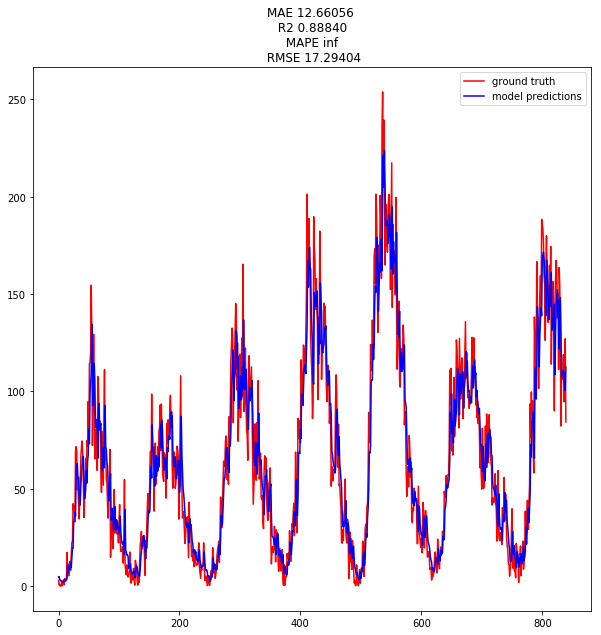

Done saving the results


[12.660559386582602, 0.8884020333467002]

In [16]:
results_collect(model_version="M3V1",dataset_name="Sunspot",callback_min_delta=0.05,patience_value=80,epoch_cnt=400)

In [3]:
val = 1
lr = []
while val >= 0.0000001:
    lr.append(val)
    val /= 25.0
print (lr)

[1, 0.04, 0.0016, 6.4e-05, 2.56e-06, 1.024e-07]


Inside model_creation
Inside func :  {'optimizer': 'SGD', 'lr': 0.0016}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/100
1959/1959 [==============================] - 3s 1ms/step - loss: 19.6521 - mean_absolute_error: 20.1404 - rmse: 20.1404 - val_loss: 29.0477 - val_mean_absolute_error: 29.5397 - val_rmse: 29.5397
Epoch 2/100
1959/1959 [==============================] - 1s 303us/step - loss: 14.8267 - mean_absolute_error: 15.3149 - rmse: 15.3149 - val_loss: 20.7779 - val_mean_absolute_error: 21.2692 - val_rmse: 21.2692
Epoch 3/100
1959/1959 [==============================] - 1s 293us/step - loss: 15.7020 - mean_absolute_error: 16.1916 - rmse: 16.1916 - val_loss: 14.1508 - val_mean_absolute_error: 14.6407 - val_rmse: 14.6407
Epoch 4/100
1959/1959 [==============================] - 1s 290us/step - loss: 18.0452 - mean_absolute_error: 18.5343 - rmse: 18.5343 - val_loss: 35.9111 - val_mean_absolute_error: 36.4063 - val_rmse: 36.4063
Epoch 5/100
1959/1959 [==================

1959/1959 [==============================] - 1s 275us/step - loss: 11.0840 - mean_absolute_error: 11.5645 - rmse: 11.5645 - val_loss: 13.8862 - val_mean_absolute_error: 14.3795 - val_rmse: 14.3795
Epoch 79/100
1959/1959 [==============================] - 1s 289us/step - loss: 11.3044 - mean_absolute_error: 11.7870 - rmse: 11.7870 - val_loss: 13.9694 - val_mean_absolute_error: 14.4578 - val_rmse: 14.4578
Epoch 80/100
1959/1959 [==============================] - 1s 274us/step - loss: 11.1659 - mean_absolute_error: 11.6499 - rmse: 11.6499 - val_loss: 15.2465 - val_mean_absolute_error: 15.7367 - val_rmse: 15.7367
Epoch 81/100
1959/1959 [==============================] - 1s 272us/step - loss: 11.3396 - mean_absolute_error: 11.8211 - rmse: 11.8211 - val_loss: 18.4989 - val_mean_absolute_error: 18.9897 - val_rmse: 18.9897
Epoch 82/100
1959/1959 [==============================] - 1s 277us/step - loss: 11.1964 - mean_absolute_error: 11.6794 - rmse: 11.6794 - val_loss: 23.2175 - val_mean_absolut

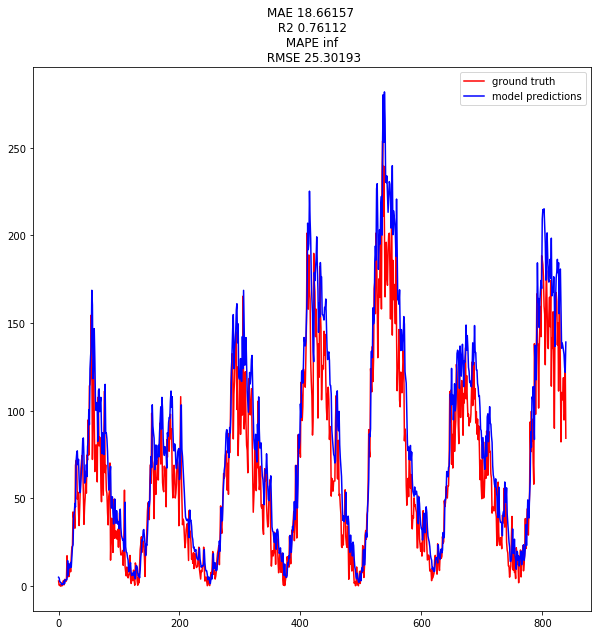

MAE 10.0542
R2 0.8327
RMSE 13.8564
[0.7966075] 1.0821152




Plot, with Optimizer.
(840,) (840,)


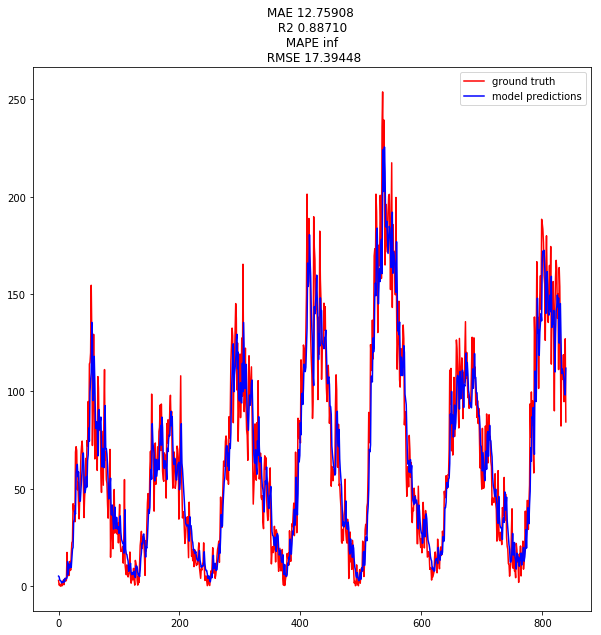

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'SGD', 'lr': 6.4e-05}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 3s 1ms/step - loss: 41.4489 - mean_absolute_error: 41.9343 - rmse: 41.9343 - val_loss: 53.1424 - val_mean_absolute_error: 53.6382 - val_rmse: 53.6382
Epoch 2/400
1959/1959 [==============================] - 1s 289us/step - loss: 24.3256 - mean_absolute_error: 24.8129 - rmse: 24.8129 - val_loss: 17.7764 - val_mean_absolute_error: 18.2705 - val_rmse: 18.2705
Epoch 3/400
1959/1959 [==============================] - 1s 280us/step - loss: 12.8190 - mean_absolute_error: 13.3058 - rmse: 13.3058 - val_loss: 17.5966 - val_mean_absolute_error: 18.0903 - val_rmse: 18.0903
Epoch 4/400
1959/1959 [==============================] - 1s 278us/step - loss: 12.6755 - mean_absolute_error: 13.1626 - rmse: 13.1626 - val_loss: 17.4366 - val_mean_absolute_error: 17.9297 - val_rmse: 17.9297
Epoch 5/400
1959

1959/1959 [==============================] - 1s 285us/step - loss: 10.2384 - mean_absolute_error: 10.7228 - rmse: 10.7228 - val_loss: 13.2422 - val_mean_absolute_error: 13.7318 - val_rmse: 13.7318
Epoch 79/400
1959/1959 [==============================] - 1s 278us/step - loss: 10.1705 - mean_absolute_error: 10.6536 - rmse: 10.6536 - val_loss: 12.6263 - val_mean_absolute_error: 13.1157 - val_rmse: 13.1157
Epoch 80/400
1959/1959 [==============================] - 1s 280us/step - loss: 10.2161 - mean_absolute_error: 10.6997 - rmse: 10.6997 - val_loss: 12.5994 - val_mean_absolute_error: 13.0887 - val_rmse: 13.0887
Epoch 81/400
1959/1959 [==============================] - 1s 280us/step - loss: 10.1946 - mean_absolute_error: 10.6791 - rmse: 10.6791 - val_loss: 12.8497 - val_mean_absolute_error: 13.3403 - val_rmse: 13.3403
Epoch 82/400
1959/1959 [==============================] - 1s 290us/step - loss: 10.1817 - mean_absolute_error: 10.6661 - rmse: 10.6661 - val_loss: 13.5301 - val_mean_absolut

Epoch 117/400
1959/1959 [==============================] - 1s 282us/step - loss: 10.0881 - mean_absolute_error: 10.5700 - rmse: 10.5700 - val_loss: 12.2412 - val_mean_absolute_error: 12.7303 - val_rmse: 12.7303
Epoch 118/400
1959/1959 [==============================] - 1s 283us/step - loss: 10.0600 - mean_absolute_error: 10.5432 - rmse: 10.5432 - val_loss: 13.1766 - val_mean_absolute_error: 13.6657 - val_rmse: 13.6657
Epoch 119/400
1959/1959 [==============================] - 1s 280us/step - loss: 10.0358 - mean_absolute_error: 10.5190 - rmse: 10.5190 - val_loss: 12.4155 - val_mean_absolute_error: 12.9051 - val_rmse: 12.9051
Epoch 120/400
1959/1959 [==============================] - 1s 281us/step - loss: 10.0458 - mean_absolute_error: 10.5301 - rmse: 10.5301 - val_loss: 12.5876 - val_mean_absolute_error: 13.0755 - val_rmse: 13.0755
Epoch 121/400
1959/1959 [==============================] - 1s 286us/step - loss: 10.0836 - mean_absolute_error: 10.5680 - rmse: 10.5680 - val_loss: 14.4132 

Epoch 156/400
1959/1959 [==============================] - 1s 276us/step - loss: 10.0431 - mean_absolute_error: 10.5269 - rmse: 10.5269 - val_loss: 12.5879 - val_mean_absolute_error: 13.0779 - val_rmse: 13.0779
Epoch 157/400
1959/1959 [==============================] - 1s 275us/step - loss: 10.0332 - mean_absolute_error: 10.5166 - rmse: 10.5166 - val_loss: 12.1941 - val_mean_absolute_error: 12.6871 - val_rmse: 12.6871
Epoch 158/400
1959/1959 [==============================] - 1s 276us/step - loss: 9.9906 - mean_absolute_error: 10.4735 - rmse: 10.4735 - val_loss: 12.1972 - val_mean_absolute_error: 12.6852 - val_rmse: 12.6852
Epoch 159/400
1959/1959 [==============================] - 1s 282us/step - loss: 9.9716 - mean_absolute_error: 10.4548 - rmse: 10.4548 - val_loss: 12.6632 - val_mean_absolute_error: 13.1515 - val_rmse: 13.1515
Epoch 160/400
1959/1959 [==============================] - 1s 286us/step - loss: 9.9785 - mean_absolute_error: 10.4603 - rmse: 10.4603 - val_loss: 12.1094 - v

Epoch 195/400
1959/1959 [==============================] - 1s 299us/step - loss: 9.9797 - mean_absolute_error: 10.4627 - rmse: 10.4627 - val_loss: 12.3814 - val_mean_absolute_error: 12.8692 - val_rmse: 12.8692
Epoch 196/400
1959/1959 [==============================] - 1s 282us/step - loss: 9.9811 - mean_absolute_error: 10.4642 - rmse: 10.4642 - val_loss: 12.1736 - val_mean_absolute_error: 12.6646 - val_rmse: 12.6646
Epoch 197/400
1959/1959 [==============================] - 1s 284us/step - loss: 9.9654 - mean_absolute_error: 10.4463 - rmse: 10.4463 - val_loss: 13.2972 - val_mean_absolute_error: 13.7848 - val_rmse: 13.7848
Epoch 198/400
1959/1959 [==============================] - 1s 281us/step - loss: 10.0067 - mean_absolute_error: 10.4892 - rmse: 10.4892 - val_loss: 12.6597 - val_mean_absolute_error: 13.1488 - val_rmse: 13.1488
Epoch 199/400
1959/1959 [==============================] - 1s 279us/step - loss: 9.9399 - mean_absolute_error: 10.4220 - rmse: 10.4220 - val_loss: 12.3620 - va

Epoch 234/400
1959/1959 [==============================] - 1s 276us/step - loss: 9.9226 - mean_absolute_error: 10.4063 - rmse: 10.4063 - val_loss: 13.1328 - val_mean_absolute_error: 13.6209 - val_rmse: 13.6209
Epoch 235/400
1959/1959 [==============================] - 1s 278us/step - loss: 9.9376 - mean_absolute_error: 10.4206 - rmse: 10.4206 - val_loss: 12.3689 - val_mean_absolute_error: 12.8578 - val_rmse: 12.8578
Epoch 236/400
1959/1959 [==============================] - 1s 280us/step - loss: 9.9126 - mean_absolute_error: 10.3968 - rmse: 10.3968 - val_loss: 12.1658 - val_mean_absolute_error: 12.6553 - val_rmse: 12.6553
Epoch 237/400
1959/1959 [==============================] - 1s 276us/step - loss: 10.0189 - mean_absolute_error: 10.4995 - rmse: 10.4995 - val_loss: 12.2855 - val_mean_absolute_error: 12.7741 - val_rmse: 12.7741
Epoch 238/400
1959/1959 [==============================] - 1s 274us/step - loss: 9.9414 - mean_absolute_error: 10.4253 - rmse: 10.4253 - val_loss: 12.3177 - va

1959/1959 [==============================] - 1s 277us/step - loss: 9.9496 - mean_absolute_error: 10.4327 - rmse: 10.4327 - val_loss: 13.7496 - val_mean_absolute_error: 14.2386 - val_rmse: 14.2386
Epoch 274/400
1959/1959 [==============================] - 1s 278us/step - loss: 9.9564 - mean_absolute_error: 10.4407 - rmse: 10.4407 - val_loss: 12.6699 - val_mean_absolute_error: 13.1592 - val_rmse: 13.1592
Epoch 275/400
1959/1959 [==============================] - 1s 275us/step - loss: 9.9169 - mean_absolute_error: 10.4003 - rmse: 10.4003 - val_loss: 12.1122 - val_mean_absolute_error: 12.6009 - val_rmse: 12.6009
Epoch 276/400
1959/1959 [==============================] - 1s 272us/step - loss: 9.9261 - mean_absolute_error: 10.4095 - rmse: 10.4095 - val_loss: 12.1209 - val_mean_absolute_error: 12.6089 - val_rmse: 12.6089
Epoch 277/400
1959/1959 [==============================] - 1s 279us/step - loss: 9.9736 - mean_absolute_error: 10.4570 - rmse: 10.4570 - val_loss: 12.3927 - val_mean_absolute

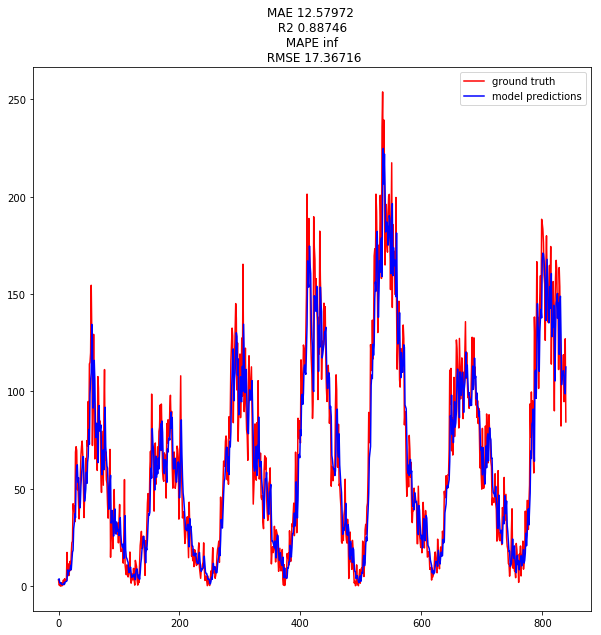

MAE 9.9865
R2 0.8338
RMSE 13.8100
[0.9931488] 1.5881615




Plot, with Optimizer.
(840,) (840,)


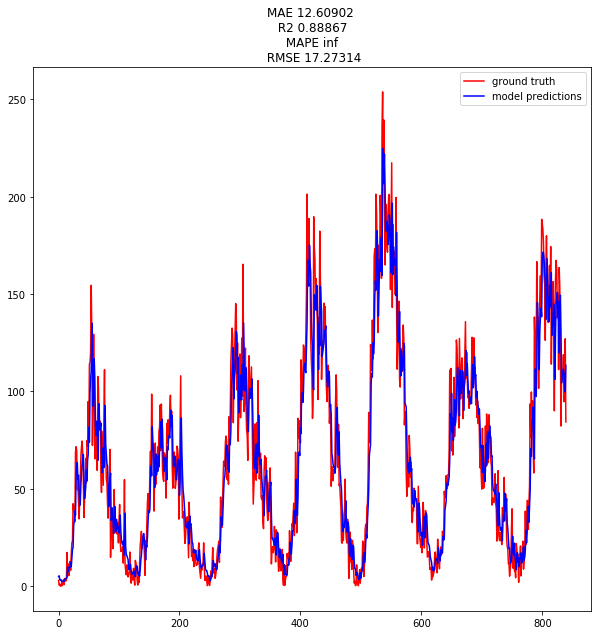

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'SGD', 'lr': 2.56e-06}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/1500
1959/1959 [==============================] - 3s 2ms/step - loss: 44.6956 - mean_absolute_error: 45.1771 - rmse: 45.1771 - val_loss: 65.0144 - val_mean_absolute_error: 65.5103 - val_rmse: 65.5103
Epoch 2/1500
1959/1959 [==============================] - 1s 286us/step - loss: 44.6890 - mean_absolute_error: 45.1706 - rmse: 45.1706 - val_loss: 65.0050 - val_mean_absolute_error: 65.5009 - val_rmse: 65.5009
Epoch 3/1500
1959/1959 [==============================] - 1s 278us/step - loss: 44.6824 - mean_absolute_error: 45.1639 - rmse: 45.1639 - val_loss: 64.9955 - val_mean_absolute_error: 65.4914 - val_rmse: 65.4914
Epoch 4/1500
1959/1959 [==============================] - 1s 273us/step - loss: 44.6756 - mean_absolute_error: 45.1572 - rmse: 45.1572 - val_loss: 64.9860 - val_mean_absolute_error: 65.4819 - val_rmse: 65.4819
Epoch 5/150

Epoch 78/1500
1959/1959 [==============================] - 1s 279us/step - loss: 13.4134 - mean_absolute_error: 13.9007 - rmse: 13.9007 - val_loss: 18.4442 - val_mean_absolute_error: 18.9379 - val_rmse: 18.9379
Epoch 79/1500
1959/1959 [==============================] - 1s 277us/step - loss: 13.0118 - mean_absolute_error: 13.4984 - rmse: 13.4984 - val_loss: 17.9537 - val_mean_absolute_error: 18.4475 - val_rmse: 18.4475
Epoch 80/1500
1959/1959 [==============================] - 1s 275us/step - loss: 12.7656 - mean_absolute_error: 13.2502 - rmse: 13.2502 - val_loss: 17.6595 - val_mean_absolute_error: 18.1521 - val_rmse: 18.1521
Epoch 81/1500
1959/1959 [==============================] - 1s 277us/step - loss: 12.6345 - mean_absolute_error: 13.1198 - rmse: 13.1198 - val_loss: 17.4761 - val_mean_absolute_error: 17.9676 - val_rmse: 17.9676
Epoch 82/1500
1959/1959 [==============================] - 1s 285us/step - loss: 12.5588 - mean_absolute_error: 13.0453 - rmse: 13.0453 - val_loss: 17.3670 

Epoch 117/1500
1959/1959 [==============================] - 1s 289us/step - loss: 12.2866 - mean_absolute_error: 12.7747 - rmse: 12.7747 - val_loss: 16.8851 - val_mean_absolute_error: 17.3772 - val_rmse: 17.3772
Epoch 118/1500
1959/1959 [==============================] - 1s 285us/step - loss: 12.2832 - mean_absolute_error: 12.7714 - rmse: 12.7714 - val_loss: 16.8808 - val_mean_absolute_error: 17.3732 - val_rmse: 17.3732
Epoch 119/1500
1959/1959 [==============================] - 1s 282us/step - loss: 12.2777 - mean_absolute_error: 12.7659 - rmse: 12.7659 - val_loss: 16.8713 - val_mean_absolute_error: 17.3636 - val_rmse: 17.3636
Epoch 120/1500
1959/1959 [==============================] - 1s 290us/step - loss: 12.2723 - mean_absolute_error: 12.7606 - rmse: 12.7606 - val_loss: 16.8617 - val_mean_absolute_error: 17.3540 - val_rmse: 17.3540
Epoch 121/1500
1959/1959 [==============================] - 1s 282us/step - loss: 12.2684 - mean_absolute_error: 12.7567 - rmse: 12.7567 - val_loss: 16.

Epoch 156/1500
1959/1959 [==============================] - 1s 278us/step - loss: 12.1269 - mean_absolute_error: 12.6151 - rmse: 12.6151 - val_loss: 16.6233 - val_mean_absolute_error: 17.1151 - val_rmse: 17.1151
Epoch 157/1500
1959/1959 [==============================] - 1s 278us/step - loss: 12.1231 - mean_absolute_error: 12.6112 - rmse: 12.6112 - val_loss: 16.6167 - val_mean_absolute_error: 17.1086 - val_rmse: 17.1086
Epoch 158/1500
1959/1959 [==============================] - 1s 279us/step - loss: 12.1208 - mean_absolute_error: 12.6092 - rmse: 12.6092 - val_loss: 16.6067 - val_mean_absolute_error: 17.0981 - val_rmse: 17.0981
Epoch 159/1500
1959/1959 [==============================] - 1s 289us/step - loss: 12.1159 - mean_absolute_error: 12.6043 - rmse: 12.6043 - val_loss: 16.5959 - val_mean_absolute_error: 17.0866 - val_rmse: 17.0866
Epoch 160/1500
1959/1959 [==============================] - 1s 284us/step - loss: 12.1129 - mean_absolute_error: 12.6012 - rmse: 12.6012 - val_loss: 16.

Epoch 195/1500
1959/1959 [==============================] - 1s 278us/step - loss: 11.9844 - mean_absolute_error: 12.4714 - rmse: 12.4714 - val_loss: 16.3923 - val_mean_absolute_error: 16.8850 - val_rmse: 16.8850
Epoch 196/1500
1959/1959 [==============================] - 1s 289us/step - loss: 11.9813 - mean_absolute_error: 12.4682 - rmse: 12.4682 - val_loss: 16.3821 - val_mean_absolute_error: 16.8748 - val_rmse: 16.8748
Epoch 197/1500
1959/1959 [==============================] - 1s 284us/step - loss: 11.9774 - mean_absolute_error: 12.4642 - rmse: 12.4642 - val_loss: 16.3661 - val_mean_absolute_error: 16.8579 - val_rmse: 16.8579
Epoch 198/1500
1959/1959 [==============================] - 1s 283us/step - loss: 11.9735 - mean_absolute_error: 12.4601 - rmse: 12.4601 - val_loss: 16.3621 - val_mean_absolute_error: 16.8541 - val_rmse: 16.8541
Epoch 199/1500
1959/1959 [==============================] - 1s 289us/step - loss: 11.9703 - mean_absolute_error: 12.4568 - rmse: 12.4568 - val_loss: 16.

Epoch 234/1500
1959/1959 [==============================] - 1s 287us/step - loss: 11.8541 - mean_absolute_error: 12.3401 - rmse: 12.3401 - val_loss: 16.1708 - val_mean_absolute_error: 16.6616 - val_rmse: 16.6616
Epoch 235/1500
1959/1959 [==============================] - 1s 286us/step - loss: 11.8512 - mean_absolute_error: 12.3370 - rmse: 12.3370 - val_loss: 16.1587 - val_mean_absolute_error: 16.6494 - val_rmse: 16.6494
Epoch 236/1500
1959/1959 [==============================] - 1s 293us/step - loss: 11.8462 - mean_absolute_error: 12.3321 - rmse: 12.3321 - val_loss: 16.1618 - val_mean_absolute_error: 16.6525 - val_rmse: 16.6525
Epoch 237/1500
1959/1959 [==============================] - 1s 296us/step - loss: 11.8435 - mean_absolute_error: 12.3303 - rmse: 12.3303 - val_loss: 16.1535 - val_mean_absolute_error: 16.6441 - val_rmse: 16.6441
Epoch 238/1500
1959/1959 [==============================] - 1s 293us/step - loss: 11.8411 - mean_absolute_error: 12.3273 - rmse: 12.3273 - val_loss: 16.

Epoch 273/1500
1959/1959 [==============================] - 1s 284us/step - loss: 11.7329 - mean_absolute_error: 12.2201 - rmse: 12.2201 - val_loss: 15.9612 - val_mean_absolute_error: 16.4527 - val_rmse: 16.4527
Epoch 274/1500
1959/1959 [==============================] - 1s 286us/step - loss: 11.7302 - mean_absolute_error: 12.2168 - rmse: 12.2168 - val_loss: 15.9623 - val_mean_absolute_error: 16.4539 - val_rmse: 16.4539
Epoch 275/1500
1959/1959 [==============================] - 1s 281us/step - loss: 11.7274 - mean_absolute_error: 12.2136 - rmse: 12.2136 - val_loss: 15.9588 - val_mean_absolute_error: 16.4506 - val_rmse: 16.4506
Epoch 276/1500
1959/1959 [==============================] - 1s 287us/step - loss: 11.7244 - mean_absolute_error: 12.2108 - rmse: 12.2108 - val_loss: 15.9510 - val_mean_absolute_error: 16.4427 - val_rmse: 16.4427
Epoch 277/1500
1959/1959 [==============================] - 1s 276us/step - loss: 11.7213 - mean_absolute_error: 12.2078 - rmse: 12.2078 - val_loss: 15.

Epoch 312/1500
1959/1959 [==============================] - 1s 289us/step - loss: 11.6195 - mean_absolute_error: 12.1059 - rmse: 12.1059 - val_loss: 15.7774 - val_mean_absolute_error: 16.2693 - val_rmse: 16.2693
Epoch 313/1500
1959/1959 [==============================] - 1s 286us/step - loss: 11.6168 - mean_absolute_error: 12.1032 - rmse: 12.1032 - val_loss: 15.7685 - val_mean_absolute_error: 16.2606 - val_rmse: 16.2606
Epoch 314/1500
1959/1959 [==============================] - 1s 281us/step - loss: 11.6145 - mean_absolute_error: 12.1007 - rmse: 12.1007 - val_loss: 15.7672 - val_mean_absolute_error: 16.2592 - val_rmse: 16.2592
Epoch 315/1500
1959/1959 [==============================] - 1s 280us/step - loss: 11.6111 - mean_absolute_error: 12.0974 - rmse: 12.0974 - val_loss: 15.7626 - val_mean_absolute_error: 16.2546 - val_rmse: 16.2546
Epoch 316/1500
1959/1959 [==============================] - 1s 293us/step - loss: 11.6090 - mean_absolute_error: 12.0953 - rmse: 12.0953 - val_loss: 15.

Epoch 351/1500
1959/1959 [==============================] - 1s 275us/step - loss: 11.5168 - mean_absolute_error: 12.0042 - rmse: 12.0042 - val_loss: 15.5942 - val_mean_absolute_error: 16.0862 - val_rmse: 16.0862
Epoch 352/1500
1959/1959 [==============================] - 1s 295us/step - loss: 11.5152 - mean_absolute_error: 12.0021 - rmse: 12.0021 - val_loss: 15.5916 - val_mean_absolute_error: 16.0836 - val_rmse: 16.0836
Epoch 353/1500
1959/1959 [==============================] - 1s 284us/step - loss: 11.5124 - mean_absolute_error: 11.9994 - rmse: 11.9994 - val_loss: 15.5894 - val_mean_absolute_error: 16.0814 - val_rmse: 16.0814
Epoch 354/1500
1959/1959 [==============================] - 1s 284us/step - loss: 11.5107 - mean_absolute_error: 11.9979 - rmse: 11.9979 - val_loss: 15.5734 - val_mean_absolute_error: 16.0660 - val_rmse: 16.0660
Epoch 355/1500
1959/1959 [==============================] - 1s 284us/step - loss: 11.5074 - mean_absolute_error: 11.9945 - rmse: 11.9945 - val_loss: 15.

Epoch 390/1500
1959/1959 [==============================] - 1s 284us/step - loss: 11.4264 - mean_absolute_error: 11.9135 - rmse: 11.9135 - val_loss: 15.4141 - val_mean_absolute_error: 15.9078 - val_rmse: 15.9078
Epoch 391/1500
1959/1959 [==============================] - 1s 281us/step - loss: 11.4247 - mean_absolute_error: 11.9119 - rmse: 11.9119 - val_loss: 15.4077 - val_mean_absolute_error: 15.9014 - val_rmse: 15.9014
Epoch 392/1500
1959/1959 [==============================] - 1s 285us/step - loss: 11.4217 - mean_absolute_error: 11.9087 - rmse: 11.9087 - val_loss: 15.4071 - val_mean_absolute_error: 15.9008 - val_rmse: 15.9008
Epoch 393/1500
1959/1959 [==============================] - 1s 277us/step - loss: 11.4201 - mean_absolute_error: 11.9072 - rmse: 11.9072 - val_loss: 15.3952 - val_mean_absolute_error: 15.8889 - val_rmse: 15.8889
Epoch 394/1500
1959/1959 [==============================] - 1s 279us/step - loss: 11.4175 - mean_absolute_error: 11.9046 - rmse: 11.9046 - val_loss: 15.

Epoch 429/1500
1959/1959 [==============================] - 1s 281us/step - loss: 11.3454 - mean_absolute_error: 11.8327 - rmse: 11.8327 - val_loss: 15.2412 - val_mean_absolute_error: 15.7349 - val_rmse: 15.7349
Epoch 430/1500
1959/1959 [==============================] - 1s 276us/step - loss: 11.3425 - mean_absolute_error: 11.8300 - rmse: 11.8300 - val_loss: 15.2435 - val_mean_absolute_error: 15.7371 - val_rmse: 15.7371
Epoch 431/1500
1959/1959 [==============================] - 1s 279us/step - loss: 11.3401 - mean_absolute_error: 11.8280 - rmse: 11.8280 - val_loss: 15.2379 - val_mean_absolute_error: 15.7316 - val_rmse: 15.7316
Epoch 432/1500
1959/1959 [==============================] - 1s 294us/step - loss: 11.3385 - mean_absolute_error: 11.8258 - rmse: 11.8258 - val_loss: 15.2366 - val_mean_absolute_error: 15.7302 - val_rmse: 15.7302
Epoch 433/1500
1959/1959 [==============================] - 1s 281us/step - loss: 11.3369 - mean_absolute_error: 11.8249 - rmse: 11.8249 - val_loss: 15.

Epoch 468/1500
1959/1959 [==============================] - 1s 293us/step - loss: 11.2663 - mean_absolute_error: 11.7529 - rmse: 11.7529 - val_loss: 15.0888 - val_mean_absolute_error: 15.5811 - val_rmse: 15.5811
Epoch 469/1500
1959/1959 [==============================] - 1s 283us/step - loss: 11.2648 - mean_absolute_error: 11.7513 - rmse: 11.7513 - val_loss: 15.0847 - val_mean_absolute_error: 15.5768 - val_rmse: 15.5768
Epoch 470/1500
1959/1959 [==============================] - 1s 280us/step - loss: 11.2627 - mean_absolute_error: 11.7493 - rmse: 11.7493 - val_loss: 15.0796 - val_mean_absolute_error: 15.5717 - val_rmse: 15.5717
Epoch 471/1500
1959/1959 [==============================] - 1s 286us/step - loss: 11.2604 - mean_absolute_error: 11.7471 - rmse: 11.7471 - val_loss: 15.0764 - val_mean_absolute_error: 15.5684 - val_rmse: 15.5684
Epoch 472/1500
1959/1959 [==============================] - 1s 289us/step - loss: 11.2592 - mean_absolute_error: 11.7457 - rmse: 11.7457 - val_loss: 15.

Epoch 507/1500
1959/1959 [==============================] - 1s 280us/step - loss: 11.1913 - mean_absolute_error: 11.6766 - rmse: 11.6766 - val_loss: 14.9350 - val_mean_absolute_error: 15.4267 - val_rmse: 15.4267
Epoch 508/1500
1959/1959 [==============================] - 1s 282us/step - loss: 11.1896 - mean_absolute_error: 11.6756 - rmse: 11.6756 - val_loss: 14.9234 - val_mean_absolute_error: 15.4154 - val_rmse: 15.4154
Epoch 509/1500
1959/1959 [==============================] - 1s 285us/step - loss: 11.1882 - mean_absolute_error: 11.6737 - rmse: 11.6737 - val_loss: 14.9221 - val_mean_absolute_error: 15.4139 - val_rmse: 15.4139
Epoch 510/1500
1959/1959 [==============================] - 1s 277us/step - loss: 11.1864 - mean_absolute_error: 11.6721 - rmse: 11.6721 - val_loss: 14.9226 - val_mean_absolute_error: 15.4145 - val_rmse: 15.4145
Epoch 511/1500
1959/1959 [==============================] - 1s 278us/step - loss: 11.1836 - mean_absolute_error: 11.6693 - rmse: 11.6693 - val_loss: 14.

Epoch 546/1500
1959/1959 [==============================] - 1s 279us/step - loss: 11.1254 - mean_absolute_error: 11.6107 - rmse: 11.6107 - val_loss: 14.7834 - val_mean_absolute_error: 15.2757 - val_rmse: 15.2757
Epoch 547/1500
1959/1959 [==============================] - 1s 282us/step - loss: 11.1242 - mean_absolute_error: 11.6092 - rmse: 11.6092 - val_loss: 14.7835 - val_mean_absolute_error: 15.2760 - val_rmse: 15.2760
Epoch 548/1500
1959/1959 [==============================] - 1s 294us/step - loss: 11.1223 - mean_absolute_error: 11.6078 - rmse: 11.6078 - val_loss: 14.7861 - val_mean_absolute_error: 15.2786 - val_rmse: 15.2786
Epoch 549/1500
1959/1959 [==============================] - 1s 289us/step - loss: 11.1221 - mean_absolute_error: 11.6074 - rmse: 11.6074 - val_loss: 14.7789 - val_mean_absolute_error: 15.2713 - val_rmse: 15.2713
Epoch 550/1500
1959/1959 [==============================] - 1s 277us/step - loss: 11.1198 - mean_absolute_error: 11.6050 - rmse: 11.6050 - val_loss: 14.

Epoch 585/1500
1959/1959 [==============================] - 1s 278us/step - loss: 11.0670 - mean_absolute_error: 11.5519 - rmse: 11.5519 - val_loss: 14.6563 - val_mean_absolute_error: 15.1486 - val_rmse: 15.1486
Epoch 586/1500
1959/1959 [==============================] - 1s 284us/step - loss: 11.0649 - mean_absolute_error: 11.5505 - rmse: 11.5505 - val_loss: 14.6576 - val_mean_absolute_error: 15.1500 - val_rmse: 15.1500
Epoch 587/1500
1959/1959 [==============================] - 1s 277us/step - loss: 11.0635 - mean_absolute_error: 11.5487 - rmse: 11.5487 - val_loss: 14.6484 - val_mean_absolute_error: 15.1408 - val_rmse: 15.1408
Epoch 588/1500
1959/1959 [==============================] - 1s 290us/step - loss: 11.0625 - mean_absolute_error: 11.5472 - rmse: 11.5472 - val_loss: 14.6431 - val_mean_absolute_error: 15.1354 - val_rmse: 15.1354
Epoch 589/1500
1959/1959 [==============================] - 1s 284us/step - loss: 11.0610 - mean_absolute_error: 11.5460 - rmse: 11.5460 - val_loss: 14.

Epoch 624/1500
1959/1959 [==============================] - 1s 293us/step - loss: 11.0108 - mean_absolute_error: 11.4947 - rmse: 11.4947 - val_loss: 14.5159 - val_mean_absolute_error: 15.0069 - val_rmse: 15.0069
Epoch 625/1500
1959/1959 [==============================] - 1s 287us/step - loss: 11.0117 - mean_absolute_error: 11.4960 - rmse: 11.4960 - val_loss: 14.5172 - val_mean_absolute_error: 15.0088 - val_rmse: 15.0088
Epoch 626/1500
1959/1959 [==============================] - 1s 282us/step - loss: 11.0095 - mean_absolute_error: 11.4935 - rmse: 11.4935 - val_loss: 14.5124 - val_mean_absolute_error: 15.0038 - val_rmse: 15.0038
Epoch 627/1500
1959/1959 [==============================] - 1s 282us/step - loss: 11.0075 - mean_absolute_error: 11.4911 - rmse: 11.4911 - val_loss: 14.5134 - val_mean_absolute_error: 15.0055 - val_rmse: 15.0055
Epoch 628/1500
1959/1959 [==============================] - 1s 274us/step - loss: 11.0056 - mean_absolute_error: 11.4894 - rmse: 11.4894 - val_loss: 14.

Epoch 663/1500
1959/1959 [==============================] - 1s 277us/step - loss: 10.9572 - mean_absolute_error: 11.4425 - rmse: 11.4425 - val_loss: 14.3960 - val_mean_absolute_error: 14.8862 - val_rmse: 14.8862
Epoch 664/1500
1959/1959 [==============================] - 1s 278us/step - loss: 10.9564 - mean_absolute_error: 11.4411 - rmse: 11.4411 - val_loss: 14.3899 - val_mean_absolute_error: 14.8805 - val_rmse: 14.8805
Epoch 665/1500
1959/1959 [==============================] - 1s 276us/step - loss: 10.9555 - mean_absolute_error: 11.4404 - rmse: 11.4404 - val_loss: 14.3854 - val_mean_absolute_error: 14.8762 - val_rmse: 14.8762
Epoch 666/1500
1959/1959 [==============================] - 1s 273us/step - loss: 10.9548 - mean_absolute_error: 11.4393 - rmse: 11.4393 - val_loss: 14.3808 - val_mean_absolute_error: 14.8717 - val_rmse: 14.8717
Epoch 667/1500
1959/1959 [==============================] - 1s 280us/step - loss: 10.9523 - mean_absolute_error: 11.4368 - rmse: 11.4368 - val_loss: 14.

Epoch 702/1500
1959/1959 [==============================] - 1s 304us/step - loss: 10.9081 - mean_absolute_error: 11.3934 - rmse: 11.3934 - val_loss: 14.2748 - val_mean_absolute_error: 14.7661 - val_rmse: 14.7661
Epoch 703/1500
1959/1959 [==============================] - 1s 318us/step - loss: 10.9070 - mean_absolute_error: 11.3922 - rmse: 11.3922 - val_loss: 14.2698 - val_mean_absolute_error: 14.7613 - val_rmse: 14.7613
Epoch 704/1500
1959/1959 [==============================] - 1s 310us/step - loss: 10.9058 - mean_absolute_error: 11.3915 - rmse: 11.3915 - val_loss: 14.2664 - val_mean_absolute_error: 14.7579 - val_rmse: 14.7579
Epoch 705/1500
1959/1959 [==============================] - 1s 314us/step - loss: 10.9043 - mean_absolute_error: 11.3897 - rmse: 11.3897 - val_loss: 14.2609 - val_mean_absolute_error: 14.7526 - val_rmse: 14.7526
Epoch 706/1500
1959/1959 [==============================] - 1s 322us/step - loss: 10.9022 - mean_absolute_error: 11.3881 - rmse: 11.3881 - val_loss: 14.

Epoch 741/1500
1959/1959 [==============================] - 1s 286us/step - loss: 10.8594 - mean_absolute_error: 11.3453 - rmse: 11.3453 - val_loss: 14.1607 - val_mean_absolute_error: 14.6521 - val_rmse: 14.6521
Epoch 742/1500
1959/1959 [==============================] - 1s 276us/step - loss: 10.8591 - mean_absolute_error: 11.3458 - rmse: 11.3458 - val_loss: 14.1634 - val_mean_absolute_error: 14.6540 - val_rmse: 14.6540
Epoch 743/1500
1959/1959 [==============================] - 1s 295us/step - loss: 10.8578 - mean_absolute_error: 11.3441 - rmse: 11.3441 - val_loss: 14.1658 - val_mean_absolute_error: 14.6564 - val_rmse: 14.6564
Epoch 744/1500
1959/1959 [==============================] - 1s 281us/step - loss: 10.8555 - mean_absolute_error: 11.3417 - rmse: 11.3417 - val_loss: 14.1656 - val_mean_absolute_error: 14.6561 - val_rmse: 14.6561
Epoch 745/1500
1959/1959 [==============================] - 1s 278us/step - loss: 10.8553 - mean_absolute_error: 11.3414 - rmse: 11.3414 - val_loss: 14.

Epoch 780/1500
1959/1959 [==============================] - 1s 289us/step - loss: 10.8173 - mean_absolute_error: 11.3041 - rmse: 11.3041 - val_loss: 14.0638 - val_mean_absolute_error: 14.5551 - val_rmse: 14.5551
Epoch 781/1500
1959/1959 [==============================] - 1s 281us/step - loss: 10.8153 - mean_absolute_error: 11.3018 - rmse: 11.3018 - val_loss: 14.0665 - val_mean_absolute_error: 14.5575 - val_rmse: 14.5575
Epoch 782/1500
1959/1959 [==============================] - 1s 286us/step - loss: 10.8134 - mean_absolute_error: 11.2996 - rmse: 11.2996 - val_loss: 14.0652 - val_mean_absolute_error: 14.5561 - val_rmse: 14.5561
Epoch 783/1500
1959/1959 [==============================] - 1s 280us/step - loss: 10.8128 - mean_absolute_error: 11.2986 - rmse: 11.2986 - val_loss: 14.0616 - val_mean_absolute_error: 14.5527 - val_rmse: 14.5527
Epoch 784/1500
1959/1959 [==============================] - 1s 281us/step - loss: 10.8115 - mean_absolute_error: 11.2984 - rmse: 11.2984 - val_loss: 14.

Epoch 819/1500
1959/1959 [==============================] - 1s 295us/step - loss: 10.7811 - mean_absolute_error: 11.2683 - rmse: 11.2683 - val_loss: 13.9989 - val_mean_absolute_error: 14.4899 - val_rmse: 14.4899
Epoch 820/1500
1959/1959 [==============================] - 1s 283us/step - loss: 10.7789 - mean_absolute_error: 11.2658 - rmse: 11.2658 - val_loss: 13.9951 - val_mean_absolute_error: 14.4863 - val_rmse: 14.4863
Epoch 821/1500
1959/1959 [==============================] - 1s 303us/step - loss: 10.7794 - mean_absolute_error: 11.2661 - rmse: 11.2661 - val_loss: 13.9959 - val_mean_absolute_error: 14.4869 - val_rmse: 14.4869
Epoch 822/1500
1959/1959 [==============================] - 1s 296us/step - loss: 10.7788 - mean_absolute_error: 11.2659 - rmse: 11.2659 - val_loss: 13.9971 - val_mean_absolute_error: 14.4880 - val_rmse: 14.4880
Epoch 823/1500
1959/1959 [==============================] - 1s 296us/step - loss: 10.7784 - mean_absolute_error: 11.2654 - rmse: 11.2654 - val_loss: 13.

Epoch 858/1500
1959/1959 [==============================] - 1s 286us/step - loss: 10.7497 - mean_absolute_error: 11.2371 - rmse: 11.2371 - val_loss: 13.9300 - val_mean_absolute_error: 14.4204 - val_rmse: 14.4204
Epoch 859/1500
1959/1959 [==============================] - 1s 280us/step - loss: 10.7495 - mean_absolute_error: 11.2369 - rmse: 11.2369 - val_loss: 13.9362 - val_mean_absolute_error: 14.4262 - val_rmse: 14.4262
Epoch 860/1500
1959/1959 [==============================] - 1s 286us/step - loss: 10.7485 - mean_absolute_error: 11.2359 - rmse: 11.2359 - val_loss: 13.9290 - val_mean_absolute_error: 14.4191 - val_rmse: 14.4191
Epoch 861/1500
1959/1959 [==============================] - 1s 286us/step - loss: 10.7488 - mean_absolute_error: 11.2361 - rmse: 11.2361 - val_loss: 13.9271 - val_mean_absolute_error: 14.4172 - val_rmse: 14.4172
Epoch 862/1500
1959/1959 [==============================] - 1s 298us/step - loss: 10.7472 - mean_absolute_error: 11.2347 - rmse: 11.2347 - val_loss: 13.

Epoch 897/1500
1959/1959 [==============================] - 1s 305us/step - loss: 10.7211 - mean_absolute_error: 11.2087 - rmse: 11.2087 - val_loss: 13.8583 - val_mean_absolute_error: 14.3473 - val_rmse: 14.3473
Epoch 898/1500
1959/1959 [==============================] - 1s 287us/step - loss: 10.7200 - mean_absolute_error: 11.2070 - rmse: 11.2070 - val_loss: 13.8553 - val_mean_absolute_error: 14.3443 - val_rmse: 14.3443
Epoch 899/1500
1959/1959 [==============================] - 1s 275us/step - loss: 10.7186 - mean_absolute_error: 11.2055 - rmse: 11.2055 - val_loss: 13.8487 - val_mean_absolute_error: 14.3376 - val_rmse: 14.3376
Epoch 900/1500
1959/1959 [==============================] - 1s 281us/step - loss: 10.7195 - mean_absolute_error: 11.2067 - rmse: 11.2067 - val_loss: 13.8505 - val_mean_absolute_error: 14.3393 - val_rmse: 14.3393
Epoch 901/1500
1959/1959 [==============================] - 1s 288us/step - loss: 10.7176 - mean_absolute_error: 11.2048 - rmse: 11.2048 - val_loss: 13.

Epoch 936/1500
1959/1959 [==============================] - 1s 283us/step - loss: 10.6922 - mean_absolute_error: 11.1788 - rmse: 11.1788 - val_loss: 13.8027 - val_mean_absolute_error: 14.2912 - val_rmse: 14.2912
Epoch 937/1500
1959/1959 [==============================] - 1s 288us/step - loss: 10.6919 - mean_absolute_error: 11.1783 - rmse: 11.1783 - val_loss: 13.8003 - val_mean_absolute_error: 14.2886 - val_rmse: 14.2886
Epoch 938/1500
1959/1959 [==============================] - 1s 295us/step - loss: 10.6911 - mean_absolute_error: 11.1778 - rmse: 11.1778 - val_loss: 13.8000 - val_mean_absolute_error: 14.2885 - val_rmse: 14.2885
Epoch 939/1500
1959/1959 [==============================] - 1s 289us/step - loss: 10.6894 - mean_absolute_error: 11.1758 - rmse: 11.1758 - val_loss: 13.7986 - val_mean_absolute_error: 14.2871 - val_rmse: 14.2871
Epoch 940/1500
1959/1959 [==============================] - 1s 277us/step - loss: 10.6882 - mean_absolute_error: 11.1748 - rmse: 11.1748 - val_loss: 13.

Epoch 975/1500
1959/1959 [==============================] - 1s 296us/step - loss: 10.6642 - mean_absolute_error: 11.1512 - rmse: 11.1512 - val_loss: 13.7441 - val_mean_absolute_error: 14.2333 - val_rmse: 14.2333
Epoch 976/1500
1959/1959 [==============================] - 1s 285us/step - loss: 10.6626 - mean_absolute_error: 11.1489 - rmse: 11.1489 - val_loss: 13.7373 - val_mean_absolute_error: 14.2265 - val_rmse: 14.2265
Epoch 977/1500
1959/1959 [==============================] - 1s 289us/step - loss: 10.6624 - mean_absolute_error: 11.1489 - rmse: 11.1489 - val_loss: 13.7326 - val_mean_absolute_error: 14.2216 - val_rmse: 14.2216
Epoch 978/1500
1959/1959 [==============================] - 1s 285us/step - loss: 10.6604 - mean_absolute_error: 11.1466 - rmse: 11.1466 - val_loss: 13.7259 - val_mean_absolute_error: 14.2143 - val_rmse: 14.2143
Epoch 979/1500
1959/1959 [==============================] - 1s 290us/step - loss: 10.6600 - mean_absolute_error: 11.1464 - rmse: 11.1464 - val_loss: 13.

1959/1959 [==============================] - 1s 281us/step - loss: 10.6085 - mean_absolute_error: 11.0955 - rmse: 11.0955 - val_loss: 13.6085 - val_mean_absolute_error: 14.0982 - val_rmse: 14.0982
Epoch 1052/1500
1959/1959 [==============================] - 1s 274us/step - loss: 10.6064 - mean_absolute_error: 11.0937 - rmse: 11.0937 - val_loss: 13.6141 - val_mean_absolute_error: 14.1037 - val_rmse: 14.1037
Epoch 1053/1500
1959/1959 [==============================] - 1s 278us/step - loss: 10.6062 - mean_absolute_error: 11.0924 - rmse: 11.0924 - val_loss: 13.6101 - val_mean_absolute_error: 14.0998 - val_rmse: 14.0998
Epoch 1054/1500
1959/1959 [==============================] - 1s 277us/step - loss: 10.6057 - mean_absolute_error: 11.0920 - rmse: 11.0920 - val_loss: 13.6090 - val_mean_absolute_error: 14.0987 - val_rmse: 14.0987
Epoch 1055/1500
1959/1959 [==============================] - 1s 279us/step - loss: 10.6040 - mean_absolute_error: 11.0906 - rmse: 11.0906 - val_loss: 13.6099 - val_

1959/1959 [==============================] - 1s 285us/step - loss: 10.5520 - mean_absolute_error: 11.0367 - rmse: 11.0367 - val_loss: 13.4985 - val_mean_absolute_error: 13.9875 - val_rmse: 13.9875
Epoch 1128/1500
1959/1959 [==============================] - 1s 286us/step - loss: 10.5514 - mean_absolute_error: 11.0366 - rmse: 11.0366 - val_loss: 13.4963 - val_mean_absolute_error: 13.9853 - val_rmse: 13.9853
Epoch 1129/1500
1959/1959 [==============================] - 1s 279us/step - loss: 10.5472 - mean_absolute_error: 11.0316 - rmse: 11.0316 - val_loss: 13.4867 - val_mean_absolute_error: 13.9752 - val_rmse: 13.9752
Epoch 1130/1500
1959/1959 [==============================] - 1s 276us/step - loss: 10.5464 - mean_absolute_error: 11.0310 - rmse: 11.0310 - val_loss: 13.4843 - val_mean_absolute_error: 13.9725 - val_rmse: 13.9725
Epoch 1131/1500
1959/1959 [==============================] - 1s 274us/step - loss: 10.5484 - mean_absolute_error: 11.0342 - rmse: 11.0342 - val_loss: 13.4827 - val_

1959/1959 [==============================] - 1s 289us/step - loss: 10.4979 - mean_absolute_error: 10.9824 - rmse: 10.9824 - val_loss: 13.3834 - val_mean_absolute_error: 13.8703 - val_rmse: 13.8703
Epoch 1204/1500
1959/1959 [==============================] - 1s 277us/step - loss: 10.4985 - mean_absolute_error: 10.9832 - rmse: 10.9832 - val_loss: 13.3771 - val_mean_absolute_error: 13.8638 - val_rmse: 13.8638
Epoch 1205/1500
1959/1959 [==============================] - 1s 283us/step - loss: 10.4969 - mean_absolute_error: 10.9819 - rmse: 10.9819 - val_loss: 13.3821 - val_mean_absolute_error: 13.8691 - val_rmse: 13.8691
Epoch 1206/1500
1959/1959 [==============================] - 1s 295us/step - loss: 10.4966 - mean_absolute_error: 10.9815 - rmse: 10.9815 - val_loss: 13.3805 - val_mean_absolute_error: 13.8674 - val_rmse: 13.8674
Epoch 1207/1500
1959/1959 [==============================] - 1s 285us/step - loss: 10.4950 - mean_absolute_error: 10.9807 - rmse: 10.9807 - val_loss: 13.3853 - val_

1959/1959 [==============================] - 1s 287us/step - loss: 10.4545 - mean_absolute_error: 10.9392 - rmse: 10.9392 - val_loss: 13.2973 - val_mean_absolute_error: 13.7847 - val_rmse: 13.7847
Epoch 1280/1500
1959/1959 [==============================] - 1s 289us/step - loss: 10.4515 - mean_absolute_error: 10.9363 - rmse: 10.9363 - val_loss: 13.2911 - val_mean_absolute_error: 13.7780 - val_rmse: 13.7780
Epoch 1281/1500
1959/1959 [==============================] - 1s 279us/step - loss: 10.4519 - mean_absolute_error: 10.9372 - rmse: 10.9372 - val_loss: 13.2884 - val_mean_absolute_error: 13.7751 - val_rmse: 13.7751
Epoch 1282/1500
1959/1959 [==============================] - 1s 284us/step - loss: 10.4499 - mean_absolute_error: 10.9350 - rmse: 10.9350 - val_loss: 13.2838 - val_mean_absolute_error: 13.7713 - val_rmse: 13.7713
Epoch 1283/1500
1959/1959 [==============================] - 1s 291us/step - loss: 10.4504 - mean_absolute_error: 10.9354 - rmse: 10.9354 - val_loss: 13.2877 - val_

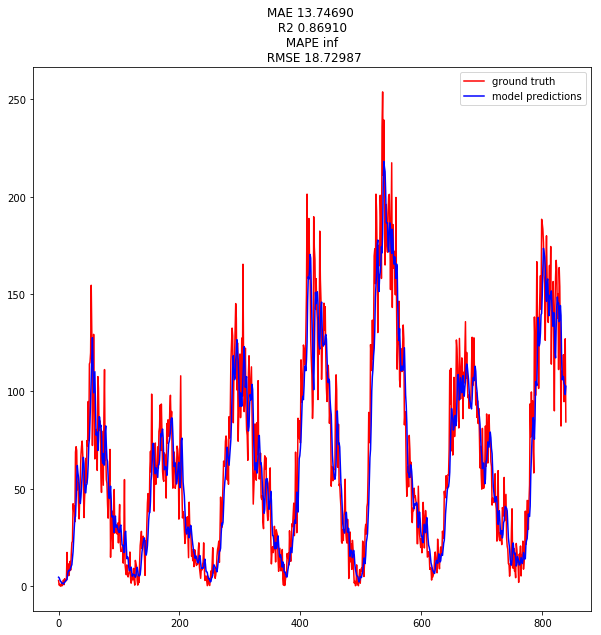

MAE 10.6396
R2 0.8124
RMSE 14.6717
[0.9934198] 1.6168785




Plot, with Optimizer.
(840,) (840,)


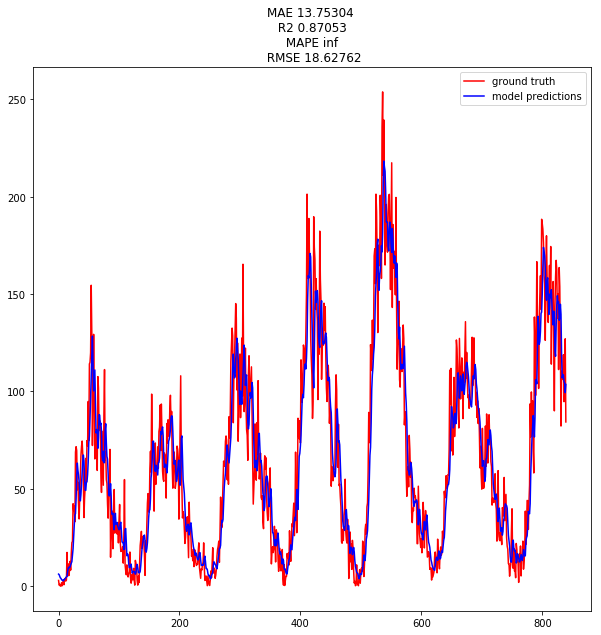

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'SGD', 'lr': 1.024e-07}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/6000
1959/1959 [==============================] - 3s 2ms/step - loss: 44.7322 - mean_absolute_error: 45.2140 - rmse: 45.2140 - val_loss: 65.0667 - val_mean_absolute_error: 65.5628 - val_rmse: 65.5628
Epoch 2/6000
1959/1959 [==============================] - 1s 306us/step - loss: 44.7319 - mean_absolute_error: 45.2137 - rmse: 45.2137 - val_loss: 65.0663 - val_mean_absolute_error: 65.5624 - val_rmse: 65.5624
Epoch 3/6000
1959/1959 [==============================] - 1s 325us/step - loss: 44.7316 - mean_absolute_error: 45.2134 - rmse: 45.2134 - val_loss: 65.0659 - val_mean_absolute_error: 65.5619 - val_rmse: 65.5619
Epoch 4/6000
1959/1959 [==============================] - 1s 290us/step - loss: 44.7313 - mean_absolute_error: 45.2131 - rmse: 45.2131 - val_loss: 65.0654 - val_mean_absolute_error: 65.5615 - val_rmse: 65.5615
Epoch 5/60

Epoch 78/6000
1959/1959 [==============================] - 1s 290us/step - loss: 44.7089 - mean_absolute_error: 45.1906 - rmse: 45.1906 - val_loss: 65.0332 - val_mean_absolute_error: 65.5292 - val_rmse: 65.5292
Epoch 79/6000
1959/1959 [==============================] - 1s 288us/step - loss: 44.7086 - mean_absolute_error: 45.1903 - rmse: 45.1903 - val_loss: 65.0328 - val_mean_absolute_error: 65.5288 - val_rmse: 65.5288
Epoch 80/6000
1959/1959 [==============================] - 1s 293us/step - loss: 44.7083 - mean_absolute_error: 45.1900 - rmse: 45.1900 - val_loss: 65.0323 - val_mean_absolute_error: 65.5283 - val_rmse: 65.5283
Epoch 81/6000
1959/1959 [==============================] - 1s 290us/step - loss: 44.7080 - mean_absolute_error: 45.1897 - rmse: 45.1897 - val_loss: 65.0319 - val_mean_absolute_error: 65.5279 - val_rmse: 65.5279
Plot, without Optimizer.


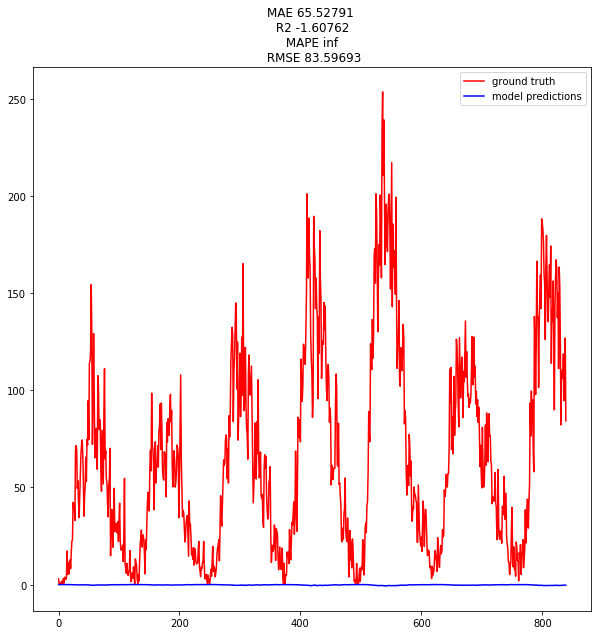

MAE 13.3876
R2 0.7052
RMSE 18.3914
[-284.44882] 5.4863663




Plot, with Optimizer.
(840,) (840,)


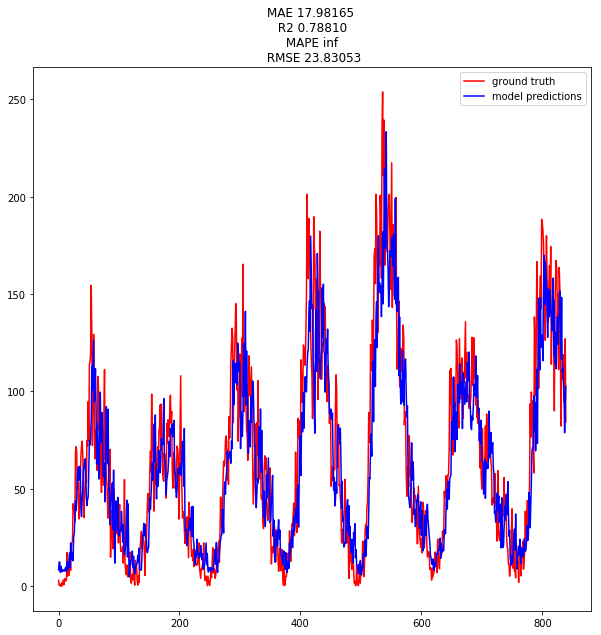

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'RMSprop', 'lr': 0.0016}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/100
1959/1959 [==============================] - 3s 2ms/step - loss: 24.0663 - mean_absolute_error: 24.5578 - rmse: 24.5578 - val_loss: 46.8971 - val_mean_absolute_error: 47.3922 - val_rmse: 47.3922
Epoch 2/100
1959/1959 [==============================] - 1s 316us/step - loss: 19.1292 - mean_absolute_error: 19.6215 - rmse: 19.6215 - val_loss: 45.4710 - val_mean_absolute_error: 45.9662 - val_rmse: 45.9662
Epoch 3/100
1959/1959 [==============================] - 1s 313us/step - loss: 16.0498 - mean_absolute_error: 16.5361 - rmse: 16.5361 - val_loss: 16.4366 - val_mean_absolute_error: 16.9280 - val_rmse: 16.9280
Epoch 4/100
1959/1959 [==============================] - 1s 300us/step - loss: 15.1493 - mean_absolute_error: 15.6363 - rmse: 15.6363 - val_loss: 42.8409 - val_mean_absolute_error: 43.3369 - val_rmse: 43.3369
Epoch 5/100
1

1959/1959 [==============================] - 1s 285us/step - loss: 10.0249 - mean_absolute_error: 10.5010 - rmse: 10.5010 - val_loss: 13.6962 - val_mean_absolute_error: 14.1880 - val_rmse: 14.1880
Epoch 79/100
1959/1959 [==============================] - 1s 295us/step - loss: 9.7538 - mean_absolute_error: 10.2276 - rmse: 10.2276 - val_loss: 13.2283 - val_mean_absolute_error: 13.7189 - val_rmse: 13.7189
Epoch 80/100
1959/1959 [==============================] - 1s 288us/step - loss: 9.8841 - mean_absolute_error: 10.3605 - rmse: 10.3605 - val_loss: 18.4332 - val_mean_absolute_error: 18.9205 - val_rmse: 18.9205
Epoch 81/100
1959/1959 [==============================] - 1s 298us/step - loss: 9.9276 - mean_absolute_error: 10.4022 - rmse: 10.4022 - val_loss: 22.7033 - val_mean_absolute_error: 23.1948 - val_rmse: 23.1948
Epoch 82/100
1959/1959 [==============================] - 1s 294us/step - loss: 10.0207 - mean_absolute_error: 10.4954 - rmse: 10.4954 - val_loss: 15.6836 - val_mean_absolute_e

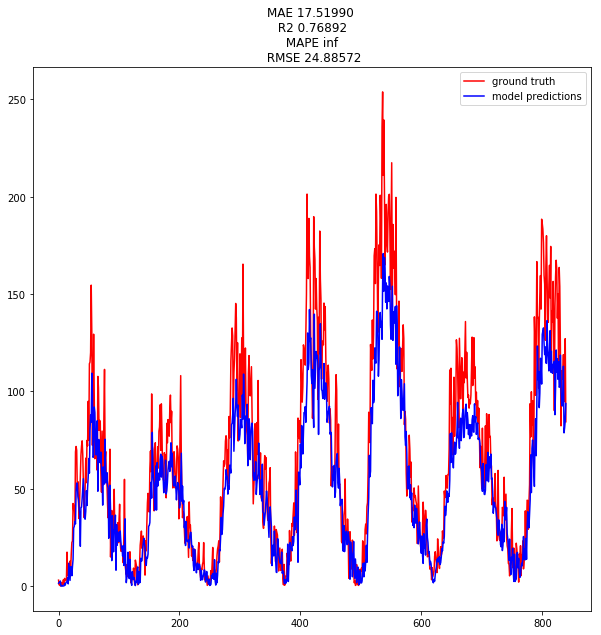

MAE 8.5357
R2 0.8632
RMSE 12.5292
[1.209765] 1.2244949




Plot, with Optimizer.
(840,) (840,)


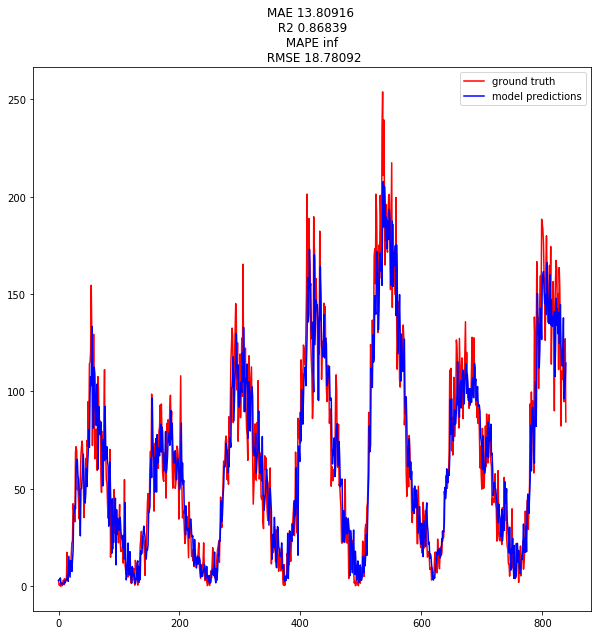

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'RMSprop', 'lr': 6.4e-05}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 4s 2ms/step - loss: 16.8886 - mean_absolute_error: 17.3773 - rmse: 17.3773 - val_loss: 17.5684 - val_mean_absolute_error: 18.0596 - val_rmse: 18.0596
Epoch 2/400
1959/1959 [==============================] - 1s 304us/step - loss: 11.2981 - mean_absolute_error: 11.7839 - rmse: 11.7839 - val_loss: 16.1560 - val_mean_absolute_error: 16.6477 - val_rmse: 16.6477
Epoch 3/400
1959/1959 [==============================] - 1s 301us/step - loss: 10.9815 - mean_absolute_error: 11.4676 - rmse: 11.4676 - val_loss: 13.5646 - val_mean_absolute_error: 14.0545 - val_rmse: 14.0545
Epoch 4/400
1959/1959 [==============================] - 1s 293us/step - loss: 10.7703 - mean_absolute_error: 11.2575 - rmse: 11.2575 - val_loss: 13.3994 - val_mean_absolute_error: 13.8916 - val_rmse: 13.8916
Epoch 5/400


1959/1959 [==============================] - 1s 289us/step - loss: 9.5423 - mean_absolute_error: 10.0177 - rmse: 10.0177 - val_loss: 12.8438 - val_mean_absolute_error: 13.3297 - val_rmse: 13.3297
Epoch 79/400
1959/1959 [==============================] - 1s 287us/step - loss: 9.4933 - mean_absolute_error: 9.9701 - rmse: 9.9701 - val_loss: 12.5025 - val_mean_absolute_error: 12.9920 - val_rmse: 12.9920
Epoch 80/400
1959/1959 [==============================] - 1s 293us/step - loss: 9.4604 - mean_absolute_error: 9.9370 - rmse: 9.9370 - val_loss: 12.6403 - val_mean_absolute_error: 13.1269 - val_rmse: 13.1269
Epoch 81/400
1959/1959 [==============================] - 1s 307us/step - loss: 9.3391 - mean_absolute_error: 9.8152 - rmse: 9.8152 - val_loss: 13.4633 - val_mean_absolute_error: 13.9538 - val_rmse: 13.9538
Epoch 82/400
1959/1959 [==============================] - 1s 292us/step - loss: 9.3497 - mean_absolute_error: 9.8283 - rmse: 9.8283 - val_loss: 13.1267 - val_mean_absolute_error: 13.6

1959/1959 [==============================] - 1s 305us/step - loss: 8.1132 - mean_absolute_error: 8.5890 - rmse: 8.5890 - val_loss: 16.5919 - val_mean_absolute_error: 17.0786 - val_rmse: 17.0786
Epoch 157/400
1959/1959 [==============================] - 1s 302us/step - loss: 8.1323 - mean_absolute_error: 8.6055 - rmse: 8.6055 - val_loss: 14.0425 - val_mean_absolute_error: 14.5344 - val_rmse: 14.5344
Epoch 158/400
1959/1959 [==============================] - 1s 297us/step - loss: 8.1062 - mean_absolute_error: 8.5771 - rmse: 8.5771 - val_loss: 15.2182 - val_mean_absolute_error: 15.7106 - val_rmse: 15.7106
Epoch 159/400
1959/1959 [==============================] - 1s 303us/step - loss: 8.0059 - mean_absolute_error: 8.4781 - rmse: 8.4781 - val_loss: 13.3497 - val_mean_absolute_error: 13.8414 - val_rmse: 13.8414
Epoch 160/400
1959/1959 [==============================] - 1s 308us/step - loss: 8.0226 - mean_absolute_error: 8.4925 - rmse: 8.4925 - val_loss: 14.2673 - val_mean_absolute_error: 14

1959/1959 [==============================] - 1s 318us/step - loss: 6.5329 - mean_absolute_error: 7.0002 - rmse: 7.0002 - val_loss: 15.4946 - val_mean_absolute_error: 15.9866 - val_rmse: 15.9866
Epoch 235/400
1959/1959 [==============================] - 1s 308us/step - loss: 6.6052 - mean_absolute_error: 7.0715 - rmse: 7.0715 - val_loss: 14.5959 - val_mean_absolute_error: 15.0877 - val_rmse: 15.0877
Epoch 236/400
1959/1959 [==============================] - 1s 305us/step - loss: 6.6657 - mean_absolute_error: 7.1300 - rmse: 7.1300 - val_loss: 14.1426 - val_mean_absolute_error: 14.6314 - val_rmse: 14.6314
Epoch 237/400
1959/1959 [==============================] - 1s 301us/step - loss: 6.4576 - mean_absolute_error: 6.9207 - rmse: 6.9207 - val_loss: 15.0563 - val_mean_absolute_error: 15.5484 - val_rmse: 15.5484
Epoch 238/400
1959/1959 [==============================] - 1s 300us/step - loss: 6.5340 - mean_absolute_error: 6.9962 - rmse: 6.9962 - val_loss: 15.8853 - val_mean_absolute_error: 16

1959/1959 [==============================] - 1s 313us/step - loss: 5.3964 - mean_absolute_error: 5.8579 - rmse: 5.8579 - val_loss: 14.7108 - val_mean_absolute_error: 15.2013 - val_rmse: 15.2013
Epoch 313/400
1959/1959 [==============================] - 1s 308us/step - loss: 5.4613 - mean_absolute_error: 5.9215 - rmse: 5.9215 - val_loss: 15.0800 - val_mean_absolute_error: 15.5699 - val_rmse: 15.5699
Epoch 314/400
1959/1959 [==============================] - 1s 304us/step - loss: 5.2841 - mean_absolute_error: 5.7429 - rmse: 5.7429 - val_loss: 16.3569 - val_mean_absolute_error: 16.8494 - val_rmse: 16.8494
Epoch 315/400
1959/1959 [==============================] - 1s 302us/step - loss: 5.4296 - mean_absolute_error: 5.8881 - rmse: 5.8881 - val_loss: 14.7984 - val_mean_absolute_error: 15.2915 - val_rmse: 15.2915
Epoch 316/400
1959/1959 [==============================] - 1s 298us/step - loss: 5.3801 - mean_absolute_error: 5.8404 - rmse: 5.8404 - val_loss: 16.4251 - val_mean_absolute_error: 16

1959/1959 [==============================] - 1s 308us/step - loss: 4.5378 - mean_absolute_error: 4.9931 - rmse: 4.9931 - val_loss: 15.5957 - val_mean_absolute_error: 16.0860 - val_rmse: 16.0860
Epoch 391/400
1959/1959 [==============================] - 1s 300us/step - loss: 4.3170 - mean_absolute_error: 4.7756 - rmse: 4.7756 - val_loss: 14.8404 - val_mean_absolute_error: 15.3320 - val_rmse: 15.3320
Epoch 392/400
1959/1959 [==============================] - 1s 293us/step - loss: 4.4520 - mean_absolute_error: 4.9093 - rmse: 4.9093 - val_loss: 14.8990 - val_mean_absolute_error: 15.3906 - val_rmse: 15.3906
Epoch 393/400
1959/1959 [==============================] - 1s 305us/step - loss: 4.5867 - mean_absolute_error: 5.0459 - rmse: 5.0459 - val_loss: 14.7236 - val_mean_absolute_error: 15.2150 - val_rmse: 15.2150
Epoch 394/400
1959/1959 [==============================] - 1s 297us/step - loss: 4.4671 - mean_absolute_error: 4.9257 - rmse: 4.9257 - val_loss: 15.3558 - val_mean_absolute_error: 15

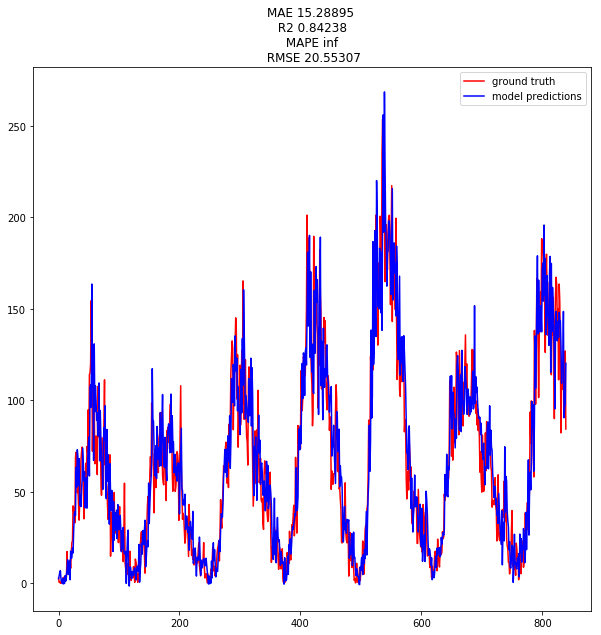

MAE 3.5449
R2 0.9642
RMSE 6.4132
[0.97633404] -0.5577812




Plot, with Optimizer.
(840,) (840,)


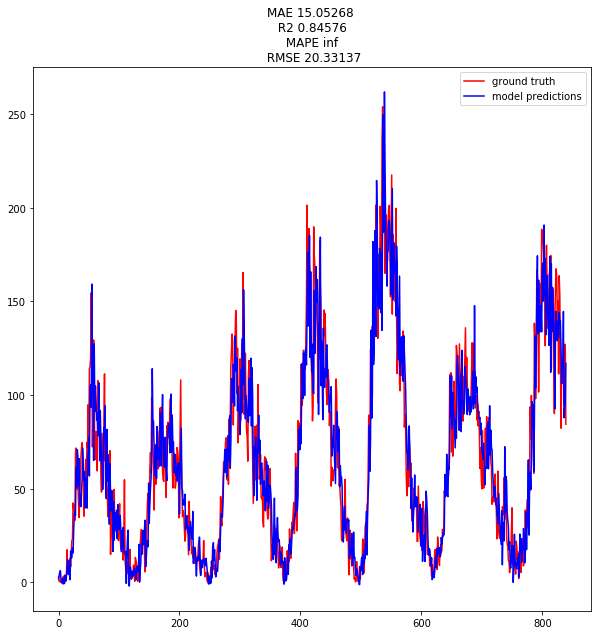

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'RMSprop', 'lr': 2.56e-06}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/1500
1959/1959 [==============================] - 4s 2ms/step - loss: 43.8611 - mean_absolute_error: 44.3439 - rmse: 44.3439 - val_loss: 62.8749 - val_mean_absolute_error: 63.3692 - val_rmse: 63.3692
Epoch 2/1500
1959/1959 [==============================] - 1s 305us/step - loss: 42.5622 - mean_absolute_error: 43.0466 - rmse: 43.0466 - val_loss: 60.9792 - val_mean_absolute_error: 61.4739 - val_rmse: 61.4739
Epoch 3/1500
1959/1959 [==============================] - 1s 298us/step - loss: 41.1635 - mean_absolute_error: 41.6497 - rmse: 41.6497 - val_loss: 58.8741 - val_mean_absolute_error: 59.3689 - val_rmse: 59.3689
Epoch 4/1500
1959/1959 [==============================] - 1s 292us/step - loss: 39.5841 - mean_absolute_error: 40.0716 - rmse: 40.0716 - val_loss: 56.4212 - val_mean_absolute_error: 56.9167 - val_rmse: 56.9167
Epoch 5

Epoch 78/1500
1959/1959 [==============================] - 1s 286us/step - loss: 10.8899 - mean_absolute_error: 11.3773 - rmse: 11.3773 - val_loss: 14.3061 - val_mean_absolute_error: 14.7960 - val_rmse: 14.7960
Epoch 79/1500
1959/1959 [==============================] - 1s 292us/step - loss: 10.8712 - mean_absolute_error: 11.3581 - rmse: 11.3581 - val_loss: 14.3062 - val_mean_absolute_error: 14.7963 - val_rmse: 14.7963
Epoch 80/1500
1959/1959 [==============================] - 1s 294us/step - loss: 10.8639 - mean_absolute_error: 11.3505 - rmse: 11.3505 - val_loss: 14.2292 - val_mean_absolute_error: 14.7200 - val_rmse: 14.7200
Epoch 81/1500
1959/1959 [==============================] - 1s 289us/step - loss: 10.8417 - mean_absolute_error: 11.3278 - rmse: 11.3278 - val_loss: 14.2679 - val_mean_absolute_error: 14.7589 - val_rmse: 14.7589
Epoch 82/1500
1959/1959 [==============================] - 1s 291us/step - loss: 10.8326 - mean_absolute_error: 11.3176 - rmse: 11.3176 - val_loss: 14.1446 

Epoch 117/1500
1959/1959 [==============================] - 1s 288us/step - loss: 10.4566 - mean_absolute_error: 10.9431 - rmse: 10.9431 - val_loss: 13.4276 - val_mean_absolute_error: 13.9171 - val_rmse: 13.9171
Epoch 118/1500
1959/1959 [==============================] - 1s 283us/step - loss: 10.4494 - mean_absolute_error: 10.9366 - rmse: 10.9366 - val_loss: 13.4101 - val_mean_absolute_error: 13.8991 - val_rmse: 13.8991
Epoch 119/1500
1959/1959 [==============================] - 1s 291us/step - loss: 10.4402 - mean_absolute_error: 10.9272 - rmse: 10.9272 - val_loss: 13.3546 - val_mean_absolute_error: 13.8443 - val_rmse: 13.8443
Epoch 120/1500
1959/1959 [==============================] - 1s 297us/step - loss: 10.4305 - mean_absolute_error: 10.9174 - rmse: 10.9174 - val_loss: 13.3583 - val_mean_absolute_error: 13.8467 - val_rmse: 13.8467
Epoch 121/1500
1959/1959 [==============================] - 1s 301us/step - loss: 10.4223 - mean_absolute_error: 10.9094 - rmse: 10.9094 - val_loss: 13.

Epoch 156/1500
1959/1959 [==============================] - 1s 301us/step - loss: 10.1804 - mean_absolute_error: 10.6657 - rmse: 10.6657 - val_loss: 12.9703 - val_mean_absolute_error: 13.4610 - val_rmse: 13.4610
Epoch 157/1500
1959/1959 [==============================] - 1s 307us/step - loss: 10.1912 - mean_absolute_error: 10.6777 - rmse: 10.6777 - val_loss: 12.8873 - val_mean_absolute_error: 13.3774 - val_rmse: 13.3774
Epoch 158/1500
1959/1959 [==============================] - 1s 287us/step - loss: 10.1782 - mean_absolute_error: 10.6643 - rmse: 10.6643 - val_loss: 12.8515 - val_mean_absolute_error: 13.3388 - val_rmse: 13.3387
Epoch 159/1500
1959/1959 [==============================] - 1s 292us/step - loss: 10.1797 - mean_absolute_error: 10.6657 - rmse: 10.6657 - val_loss: 12.8422 - val_mean_absolute_error: 13.3293 - val_rmse: 13.3293
Epoch 160/1500
1959/1959 [==============================] - 1s 304us/step - loss: 10.1682 - mean_absolute_error: 10.6552 - rmse: 10.6552 - val_loss: 12.

Epoch 195/1500
1959/1959 [==============================] - 1s 303us/step - loss: 10.0352 - mean_absolute_error: 10.5215 - rmse: 10.5215 - val_loss: 12.5787 - val_mean_absolute_error: 13.0691 - val_rmse: 13.0691
Epoch 196/1500
1959/1959 [==============================] - 1s 303us/step - loss: 10.0308 - mean_absolute_error: 10.5160 - rmse: 10.5160 - val_loss: 12.5782 - val_mean_absolute_error: 13.0688 - val_rmse: 13.0688
Epoch 197/1500
1959/1959 [==============================] - 1s 299us/step - loss: 10.0257 - mean_absolute_error: 10.5116 - rmse: 10.5116 - val_loss: 12.5616 - val_mean_absolute_error: 13.0513 - val_rmse: 13.0513
Epoch 198/1500
1959/1959 [==============================] - 1s 300us/step - loss: 10.0281 - mean_absolute_error: 10.5133 - rmse: 10.5133 - val_loss: 12.5536 - val_mean_absolute_error: 13.0429 - val_rmse: 13.0429
Epoch 199/1500
1959/1959 [==============================] - 1s 300us/step - loss: 10.0130 - mean_absolute_error: 10.4982 - rmse: 10.4982 - val_loss: 12.

Epoch 234/1500
1959/1959 [==============================] - 1s 297us/step - loss: 9.9273 - mean_absolute_error: 10.4105 - rmse: 10.4105 - val_loss: 12.4077 - val_mean_absolute_error: 12.8964 - val_rmse: 12.8964
Epoch 235/1500
1959/1959 [==============================] - 1s 299us/step - loss: 9.9246 - mean_absolute_error: 10.4065 - rmse: 10.4065 - val_loss: 12.3873 - val_mean_absolute_error: 12.8763 - val_rmse: 12.8763
Epoch 236/1500
1959/1959 [==============================] - 1s 299us/step - loss: 9.9234 - mean_absolute_error: 10.4056 - rmse: 10.4056 - val_loss: 12.3858 - val_mean_absolute_error: 12.8746 - val_rmse: 12.8746
Epoch 237/1500
1959/1959 [==============================] - 1s 294us/step - loss: 9.9220 - mean_absolute_error: 10.4034 - rmse: 10.4034 - val_loss: 12.3701 - val_mean_absolute_error: 12.8588 - val_rmse: 12.8588
Epoch 238/1500
1959/1959 [==============================] - 1s 287us/step - loss: 9.9128 - mean_absolute_error: 10.3931 - rmse: 10.3931 - val_loss: 12.3507 

Epoch 273/1500
1959/1959 [==============================] - 1s 308us/step - loss: 9.8467 - mean_absolute_error: 10.3284 - rmse: 10.3284 - val_loss: 12.2276 - val_mean_absolute_error: 12.7146 - val_rmse: 12.7146
Epoch 274/1500
1959/1959 [==============================] - 1s 296us/step - loss: 9.8517 - mean_absolute_error: 10.3343 - rmse: 10.3343 - val_loss: 12.2369 - val_mean_absolute_error: 12.7230 - val_rmse: 12.7230
Epoch 275/1500
1959/1959 [==============================] - 1s 289us/step - loss: 9.8415 - mean_absolute_error: 10.3220 - rmse: 10.3220 - val_loss: 12.2313 - val_mean_absolute_error: 12.7175 - val_rmse: 12.7175
Epoch 276/1500
1959/1959 [==============================] - 1s 292us/step - loss: 9.8534 - mean_absolute_error: 10.3351 - rmse: 10.3351 - val_loss: 12.2428 - val_mean_absolute_error: 12.7288 - val_rmse: 12.7288
Epoch 277/1500
1959/1959 [==============================] - 1s 287us/step - loss: 9.8468 - mean_absolute_error: 10.3271 - rmse: 10.3271 - val_loss: 12.2136 

Epoch 312/1500
1959/1959 [==============================] - 1s 287us/step - loss: 9.7890 - mean_absolute_error: 10.2713 - rmse: 10.2713 - val_loss: 12.1501 - val_mean_absolute_error: 12.6378 - val_rmse: 12.6377
Epoch 313/1500
1959/1959 [==============================] - 1s 290us/step - loss: 9.7979 - mean_absolute_error: 10.2789 - rmse: 10.2789 - val_loss: 12.1589 - val_mean_absolute_error: 12.6429 - val_rmse: 12.6429
Epoch 314/1500
1959/1959 [==============================] - 1s 280us/step - loss: 9.7905 - mean_absolute_error: 10.2719 - rmse: 10.2719 - val_loss: 12.1557 - val_mean_absolute_error: 12.6443 - val_rmse: 12.6443
Epoch 315/1500
1959/1959 [==============================] - 1s 287us/step - loss: 9.7978 - mean_absolute_error: 10.2787 - rmse: 10.2787 - val_loss: 12.1540 - val_mean_absolute_error: 12.6424 - val_rmse: 12.6424
Epoch 316/1500
1959/1959 [==============================] - 1s 296us/step - loss: 9.7948 - mean_absolute_error: 10.2765 - rmse: 10.2765 - val_loss: 12.1480 

Epoch 351/1500
1959/1959 [==============================] - 1s 303us/step - loss: 9.7573 - mean_absolute_error: 10.2384 - rmse: 10.2384 - val_loss: 12.1286 - val_mean_absolute_error: 12.6130 - val_rmse: 12.6130
Epoch 352/1500
1959/1959 [==============================] - 1s 307us/step - loss: 9.7529 - mean_absolute_error: 10.2335 - rmse: 10.2335 - val_loss: 12.1619 - val_mean_absolute_error: 12.6458 - val_rmse: 12.6458
Epoch 353/1500
1959/1959 [==============================] - 1s 297us/step - loss: 9.7576 - mean_absolute_error: 10.2390 - rmse: 10.2390 - val_loss: 12.1419 - val_mean_absolute_error: 12.6302 - val_rmse: 12.6302
Epoch 354/1500
1959/1959 [==============================] - 1s 292us/step - loss: 9.7557 - mean_absolute_error: 10.2355 - rmse: 10.2355 - val_loss: 12.1260 - val_mean_absolute_error: 12.6111 - val_rmse: 12.6111
Epoch 355/1500
1959/1959 [==============================] - 1s 297us/step - loss: 9.7504 - mean_absolute_error: 10.2327 - rmse: 10.2327 - val_loss: 12.1305 

Epoch 390/1500
1959/1959 [==============================] - 1s 281us/step - loss: 9.7185 - mean_absolute_error: 10.1983 - rmse: 10.1982 - val_loss: 12.1250 - val_mean_absolute_error: 12.6117 - val_rmse: 12.6117
Epoch 391/1500
1959/1959 [==============================] - 1s 285us/step - loss: 9.7006 - mean_absolute_error: 10.1791 - rmse: 10.1791 - val_loss: 12.1952 - val_mean_absolute_error: 12.6808 - val_rmse: 12.6808
Epoch 392/1500
1959/1959 [==============================] - 1s 293us/step - loss: 9.7305 - mean_absolute_error: 10.2110 - rmse: 10.2110 - val_loss: 12.1265 - val_mean_absolute_error: 12.6119 - val_rmse: 12.6119
Epoch 393/1500
1959/1959 [==============================] - 1s 288us/step - loss: 9.7185 - mean_absolute_error: 10.1974 - rmse: 10.1974 - val_loss: 12.0953 - val_mean_absolute_error: 12.5813 - val_rmse: 12.5813
Epoch 394/1500
1959/1959 [==============================] - 1s 283us/step - loss: 9.7165 - mean_absolute_error: 10.1969 - rmse: 10.1969 - val_loss: 12.1033 

Epoch 429/1500
1959/1959 [==============================] - 1s 288us/step - loss: 9.6942 - mean_absolute_error: 10.1746 - rmse: 10.1746 - val_loss: 12.0998 - val_mean_absolute_error: 12.5862 - val_rmse: 12.5862
Epoch 430/1500
1959/1959 [==============================] - 1s 289us/step - loss: 9.6854 - mean_absolute_error: 10.1645 - rmse: 10.1645 - val_loss: 12.1224 - val_mean_absolute_error: 12.6075 - val_rmse: 12.6075
Epoch 431/1500
1959/1959 [==============================] - 1s 300us/step - loss: 9.6730 - mean_absolute_error: 10.1526 - rmse: 10.1526 - val_loss: 12.2388 - val_mean_absolute_error: 12.7233 - val_rmse: 12.7233
Epoch 432/1500
1959/1959 [==============================] - 1s 300us/step - loss: 9.6944 - mean_absolute_error: 10.1729 - rmse: 10.1729 - val_loss: 12.0916 - val_mean_absolute_error: 12.5789 - val_rmse: 12.5789
Epoch 433/1500
1959/1959 [==============================] - 1s 292us/step - loss: 9.6878 - mean_absolute_error: 10.1668 - rmse: 10.1668 - val_loss: 12.0926 

Epoch 468/1500
1959/1959 [==============================] - 1s 284us/step - loss: 9.6608 - mean_absolute_error: 10.1395 - rmse: 10.1395 - val_loss: 12.0819 - val_mean_absolute_error: 12.5702 - val_rmse: 12.5702
Epoch 469/1500
1959/1959 [==============================] - 1s 284us/step - loss: 9.6551 - mean_absolute_error: 10.1354 - rmse: 10.1354 - val_loss: 12.0873 - val_mean_absolute_error: 12.5763 - val_rmse: 12.5763
Epoch 470/1500
1959/1959 [==============================] - 1s 284us/step - loss: 9.6534 - mean_absolute_error: 10.1327 - rmse: 10.1327 - val_loss: 12.0850 - val_mean_absolute_error: 12.5726 - val_rmse: 12.5726
Epoch 471/1500
1959/1959 [==============================] - 1s 293us/step - loss: 9.6539 - mean_absolute_error: 10.1324 - rmse: 10.1324 - val_loss: 12.0905 - val_mean_absolute_error: 12.5768 - val_rmse: 12.5768
Plot, without Optimizer.


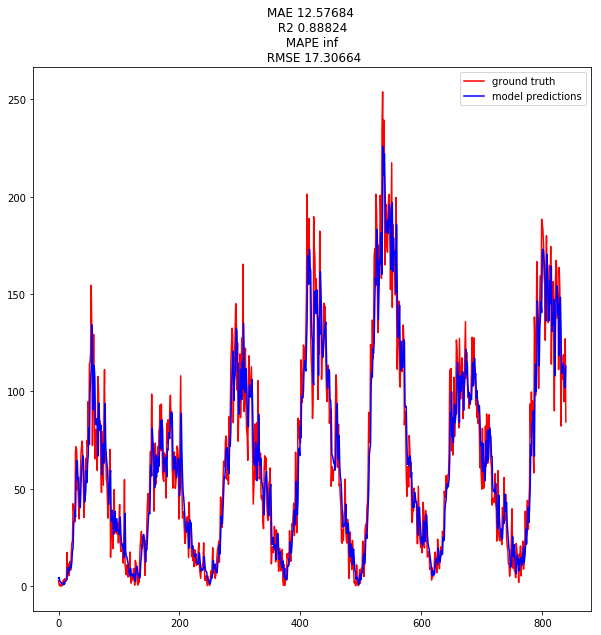

MAE 9.7653
R2 0.8380
RMSE 13.6345
[0.9820036] 1.4440804




Plot, with Optimizer.
(840,) (840,)


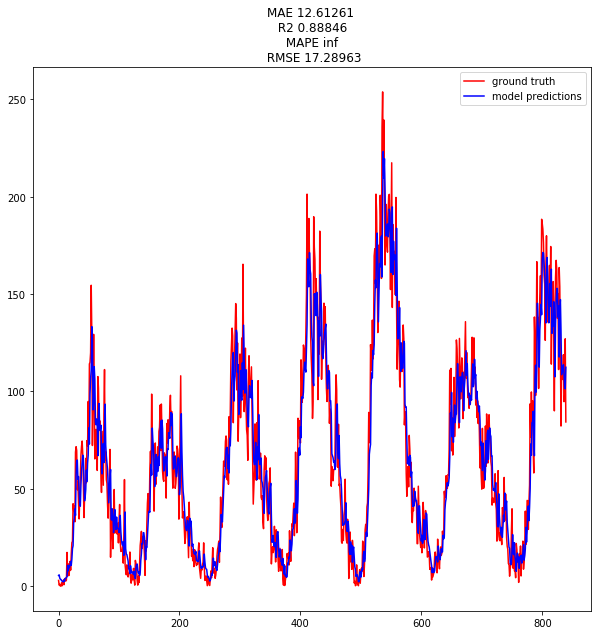

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'RMSprop', 'lr': 1.024e-07}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/6000
1959/1959 [==============================] - 4s 2ms/step - loss: 44.5077 - mean_absolute_error: 44.9895 - rmse: 44.9895 - val_loss: 64.7311 - val_mean_absolute_error: 65.2266 - val_rmse: 65.2266
Epoch 2/6000
1959/1959 [==============================] - 1s 315us/step - loss: 44.4791 - mean_absolute_error: 44.9609 - rmse: 44.9609 - val_loss: 64.6875 - val_mean_absolute_error: 65.1830 - val_rmse: 65.1830
Epoch 3/6000
1959/1959 [==============================] - 1s 308us/step - loss: 44.4481 - mean_absolute_error: 44.9299 - rmse: 44.9299 - val_loss: 64.6393 - val_mean_absolute_error: 65.1348 - val_rmse: 65.1348
Epoch 4/6000
1959/1959 [==============================] - 1s 297us/step - loss: 44.4148 - mean_absolute_error: 44.8968 - rmse: 44.8968 - val_loss: 64.5884 - val_mean_absolute_error: 65.0838 - val_rmse: 65.0838
Epoch 

Epoch 78/6000
1959/1959 [==============================] - 1s 298us/step - loss: 41.3818 - mean_absolute_error: 41.8689 - rmse: 41.8689 - val_loss: 60.2349 - val_mean_absolute_error: 60.7297 - val_rmse: 60.7297
Epoch 79/6000
1959/1959 [==============================] - 1s 297us/step - loss: 41.3350 - mean_absolute_error: 41.8222 - rmse: 41.8222 - val_loss: 60.1676 - val_mean_absolute_error: 60.6625 - val_rmse: 60.6625
Epoch 80/6000
1959/1959 [==============================] - 1s 302us/step - loss: 41.2875 - mean_absolute_error: 41.7747 - rmse: 41.7747 - val_loss: 60.1002 - val_mean_absolute_error: 60.5950 - val_rmse: 60.5950
Epoch 81/6000
1959/1959 [==============================] - 1s 297us/step - loss: 41.2403 - mean_absolute_error: 41.7276 - rmse: 41.7276 - val_loss: 60.0327 - val_mean_absolute_error: 60.5275 - val_rmse: 60.5275
Epoch 82/6000
1959/1959 [==============================] - 1s 293us/step - loss: 41.1931 - mean_absolute_error: 41.6804 - rmse: 41.6804 - val_loss: 59.9648 

Epoch 117/6000
1959/1959 [==============================] - 1s 299us/step - loss: 39.3362 - mean_absolute_error: 39.8253 - rmse: 39.8253 - val_loss: 57.3034 - val_mean_absolute_error: 57.7990 - val_rmse: 57.7990
Epoch 118/6000
1959/1959 [==============================] - 1s 298us/step - loss: 39.2776 - mean_absolute_error: 39.7668 - rmse: 39.7668 - val_loss: 57.2186 - val_mean_absolute_error: 57.7143 - val_rmse: 57.7143
Epoch 119/6000
1959/1959 [==============================] - 1s 302us/step - loss: 39.2182 - mean_absolute_error: 39.7075 - rmse: 39.7075 - val_loss: 57.1351 - val_mean_absolute_error: 57.6308 - val_rmse: 57.6308
Epoch 120/6000
1959/1959 [==============================] - 1s 290us/step - loss: 39.1596 - mean_absolute_error: 39.6489 - rmse: 39.6489 - val_loss: 57.0497 - val_mean_absolute_error: 57.5455 - val_rmse: 57.5455
Epoch 121/6000
1959/1959 [==============================] - 1s 298us/step - loss: 39.0994 - mean_absolute_error: 39.5887 - rmse: 39.5887 - val_loss: 56.

Epoch 156/6000
1959/1959 [==============================] - 1s 309us/step - loss: 36.7761 - mean_absolute_error: 37.2647 - rmse: 37.2647 - val_loss: 53.6193 - val_mean_absolute_error: 54.1150 - val_rmse: 54.1150
Epoch 157/6000
1959/1959 [==============================] - 1s 316us/step - loss: 36.7030 - mean_absolute_error: 37.1916 - rmse: 37.1916 - val_loss: 53.5150 - val_mean_absolute_error: 54.0107 - val_rmse: 54.0107
Epoch 158/6000
1959/1959 [==============================] - 1s 325us/step - loss: 36.6289 - mean_absolute_error: 37.1175 - rmse: 37.1175 - val_loss: 53.4081 - val_mean_absolute_error: 53.9038 - val_rmse: 53.9038
Epoch 159/6000
1959/1959 [==============================] - 1s 320us/step - loss: 36.5558 - mean_absolute_error: 37.0444 - rmse: 37.0444 - val_loss: 53.3016 - val_mean_absolute_error: 53.7972 - val_rmse: 53.7972
Epoch 160/6000
1959/1959 [==============================] - 1s 318us/step - loss: 36.4805 - mean_absolute_error: 36.9691 - rmse: 36.9691 - val_loss: 53.

Epoch 195/6000
1959/1959 [==============================] - 1s 295us/step - loss: 33.5967 - mean_absolute_error: 34.0863 - rmse: 34.0863 - val_loss: 49.0211 - val_mean_absolute_error: 49.5163 - val_rmse: 49.5163
Epoch 196/6000
1959/1959 [==============================] - 1s 306us/step - loss: 33.5055 - mean_absolute_error: 33.9951 - rmse: 33.9951 - val_loss: 48.8904 - val_mean_absolute_error: 49.3855 - val_rmse: 49.3855
Epoch 197/6000
1959/1959 [==============================] - 1s 298us/step - loss: 33.4145 - mean_absolute_error: 33.9042 - rmse: 33.9042 - val_loss: 48.7576 - val_mean_absolute_error: 49.2528 - val_rmse: 49.2528
Epoch 198/6000
1959/1959 [==============================] - 1s 285us/step - loss: 33.3236 - mean_absolute_error: 33.8134 - rmse: 33.8134 - val_loss: 48.6263 - val_mean_absolute_error: 49.1215 - val_rmse: 49.1215
Epoch 199/6000
1959/1959 [==============================] - 1s 306us/step - loss: 33.2314 - mean_absolute_error: 33.7212 - rmse: 33.7212 - val_loss: 48.

Epoch 234/6000
1959/1959 [==============================] - 1s 297us/step - loss: 29.7142 - mean_absolute_error: 30.2038 - rmse: 30.2038 - val_loss: 43.3898 - val_mean_absolute_error: 43.8848 - val_rmse: 43.8848
Epoch 235/6000
1959/1959 [==============================] - 1s 291us/step - loss: 29.6043 - mean_absolute_error: 30.0941 - rmse: 30.0941 - val_loss: 43.2292 - val_mean_absolute_error: 43.7242 - val_rmse: 43.7242
Epoch 236/6000
1959/1959 [==============================] - 1s 298us/step - loss: 29.4956 - mean_absolute_error: 29.9855 - rmse: 29.9855 - val_loss: 43.0718 - val_mean_absolute_error: 43.5667 - val_rmse: 43.5667
Epoch 237/6000
1959/1959 [==============================] - 1s 295us/step - loss: 29.3854 - mean_absolute_error: 29.8752 - rmse: 29.8752 - val_loss: 42.9133 - val_mean_absolute_error: 43.4081 - val_rmse: 43.4081
Epoch 238/6000
1959/1959 [==============================] - 1s 314us/step - loss: 29.2751 - mean_absolute_error: 29.7649 - rmse: 29.7649 - val_loss: 42.

Epoch 273/6000
1959/1959 [==============================] - 1s 291us/step - loss: 25.1301 - mean_absolute_error: 25.6211 - rmse: 25.6211 - val_loss: 36.6675 - val_mean_absolute_error: 37.1615 - val_rmse: 37.1615
Epoch 274/6000
1959/1959 [==============================] - 1s 291us/step - loss: 25.0024 - mean_absolute_error: 25.4934 - rmse: 25.4934 - val_loss: 36.4794 - val_mean_absolute_error: 36.9732 - val_rmse: 36.9732
Epoch 275/6000
1959/1959 [==============================] - 1s 287us/step - loss: 24.8762 - mean_absolute_error: 25.3672 - rmse: 25.3672 - val_loss: 36.2924 - val_mean_absolute_error: 36.7858 - val_rmse: 36.7858
Epoch 276/6000
1959/1959 [==============================] - 1s 294us/step - loss: 24.7471 - mean_absolute_error: 25.2380 - rmse: 25.2380 - val_loss: 36.1003 - val_mean_absolute_error: 36.5932 - val_rmse: 36.5932
Epoch 277/6000
1959/1959 [==============================] - 1s 305us/step - loss: 24.6192 - mean_absolute_error: 25.1101 - rmse: 25.1101 - val_loss: 35.

Epoch 312/6000
1959/1959 [==============================] - 1s 337us/step - loss: 20.0115 - mean_absolute_error: 20.5011 - rmse: 20.5011 - val_loss: 28.9992 - val_mean_absolute_error: 29.4906 - val_rmse: 29.4906
Epoch 313/6000
1959/1959 [==============================] - 1s 343us/step - loss: 19.8806 - mean_absolute_error: 20.3702 - rmse: 20.3702 - val_loss: 28.7993 - val_mean_absolute_error: 29.2908 - val_rmse: 29.2908
Epoch 314/6000
1959/1959 [==============================] - 1s 344us/step - loss: 19.7490 - mean_absolute_error: 20.2393 - rmse: 20.2393 - val_loss: 28.5982 - val_mean_absolute_error: 29.0902 - val_rmse: 29.0902
Epoch 315/6000
1959/1959 [==============================] - 1s 344us/step - loss: 19.6153 - mean_absolute_error: 20.1057 - rmse: 20.1057 - val_loss: 28.3953 - val_mean_absolute_error: 28.8875 - val_rmse: 28.8875
Epoch 316/6000
1959/1959 [==============================] - 1s 338us/step - loss: 19.4780 - mean_absolute_error: 19.9691 - rmse: 19.9691 - val_loss: 28.

Epoch 351/6000
1959/1959 [==============================] - 1s 302us/step - loss: 15.1698 - mean_absolute_error: 15.6604 - rmse: 15.6604 - val_loss: 21.6443 - val_mean_absolute_error: 22.1375 - val_rmse: 22.1375
Epoch 352/6000
1959/1959 [==============================] - 1s 289us/step - loss: 15.0632 - mean_absolute_error: 15.5531 - rmse: 15.5531 - val_loss: 21.4790 - val_mean_absolute_error: 21.9723 - val_rmse: 21.9723
Epoch 353/6000
1959/1959 [==============================] - 1s 294us/step - loss: 14.9568 - mean_absolute_error: 15.4460 - rmse: 15.4460 - val_loss: 21.3089 - val_mean_absolute_error: 21.8029 - val_rmse: 21.8029
Epoch 354/6000
1959/1959 [==============================] - 1s 296us/step - loss: 14.8531 - mean_absolute_error: 15.3426 - rmse: 15.3426 - val_loss: 21.1495 - val_mean_absolute_error: 21.6435 - val_rmse: 21.6435
Epoch 355/6000
1959/1959 [==============================] - 1s 302us/step - loss: 14.7494 - mean_absolute_error: 15.2384 - rmse: 15.2384 - val_loss: 20.

Epoch 390/6000
1959/1959 [==============================] - 1s 295us/step - loss: 12.5922 - mean_absolute_error: 13.0805 - rmse: 13.0805 - val_loss: 17.5718 - val_mean_absolute_error: 18.0634 - val_rmse: 18.0634
Epoch 391/6000
1959/1959 [==============================] - 1s 295us/step - loss: 12.5749 - mean_absolute_error: 13.0634 - rmse: 13.0634 - val_loss: 17.5348 - val_mean_absolute_error: 18.0272 - val_rmse: 18.0272
Epoch 392/6000
1959/1959 [==============================] - 1s 296us/step - loss: 12.5583 - mean_absolute_error: 13.0469 - rmse: 13.0469 - val_loss: 17.5074 - val_mean_absolute_error: 18.0004 - val_rmse: 18.0004
Epoch 393/6000
1959/1959 [==============================] - 1s 291us/step - loss: 12.5452 - mean_absolute_error: 13.0339 - rmse: 13.0339 - val_loss: 17.4796 - val_mean_absolute_error: 17.9723 - val_rmse: 17.9723
Epoch 394/6000
1959/1959 [==============================] - 1s 302us/step - loss: 12.5321 - mean_absolute_error: 13.0211 - rmse: 13.0211 - val_loss: 17.

Epoch 429/6000
1959/1959 [==============================] - 1s 287us/step - loss: 12.3601 - mean_absolute_error: 12.8495 - rmse: 12.8495 - val_loss: 17.0777 - val_mean_absolute_error: 17.5728 - val_rmse: 17.5728
Epoch 430/6000
1959/1959 [==============================] - 1s 297us/step - loss: 12.3584 - mean_absolute_error: 12.8479 - rmse: 12.8479 - val_loss: 17.0721 - val_mean_absolute_error: 17.5672 - val_rmse: 17.5672
Epoch 431/6000
1959/1959 [==============================] - 1s 292us/step - loss: 12.3561 - mean_absolute_error: 12.8456 - rmse: 12.8456 - val_loss: 17.0678 - val_mean_absolute_error: 17.5631 - val_rmse: 17.5631
Epoch 432/6000
1959/1959 [==============================] - 1s 291us/step - loss: 12.3545 - mean_absolute_error: 12.8439 - rmse: 12.8439 - val_loss: 17.0634 - val_mean_absolute_error: 17.5588 - val_rmse: 17.5588
Epoch 433/6000
1959/1959 [==============================] - 1s 289us/step - loss: 12.3526 - mean_absolute_error: 12.8420 - rmse: 12.8420 - val_loss: 17.

Epoch 468/6000
1959/1959 [==============================] - 1s 309us/step - loss: 12.2908 - mean_absolute_error: 12.7798 - rmse: 12.7798 - val_loss: 16.9427 - val_mean_absolute_error: 17.4382 - val_rmse: 17.4382
Epoch 469/6000
1959/1959 [==============================] - 1s 296us/step - loss: 12.2882 - mean_absolute_error: 12.7771 - rmse: 12.7771 - val_loss: 16.9406 - val_mean_absolute_error: 17.4360 - val_rmse: 17.4360
Epoch 470/6000
1959/1959 [==============================] - 1s 295us/step - loss: 12.2873 - mean_absolute_error: 12.7761 - rmse: 12.7761 - val_loss: 16.9376 - val_mean_absolute_error: 17.4330 - val_rmse: 17.4330
Epoch 471/6000
1959/1959 [==============================] - 1s 306us/step - loss: 12.2858 - mean_absolute_error: 12.7748 - rmse: 12.7748 - val_loss: 16.9343 - val_mean_absolute_error: 17.4297 - val_rmse: 17.4297
Epoch 472/6000
1959/1959 [==============================] - 1s 302us/step - loss: 12.2841 - mean_absolute_error: 12.7731 - rmse: 12.7731 - val_loss: 16.

Epoch 507/6000
1959/1959 [==============================] - 1s 307us/step - loss: 12.2260 - mean_absolute_error: 12.7152 - rmse: 12.7152 - val_loss: 16.8397 - val_mean_absolute_error: 17.3346 - val_rmse: 17.3346
Epoch 508/6000
1959/1959 [==============================] - 1s 292us/step - loss: 12.2243 - mean_absolute_error: 12.7133 - rmse: 12.7133 - val_loss: 16.8368 - val_mean_absolute_error: 17.3318 - val_rmse: 17.3318
Epoch 509/6000
1959/1959 [==============================] - 1s 295us/step - loss: 12.2230 - mean_absolute_error: 12.7122 - rmse: 12.7122 - val_loss: 16.8340 - val_mean_absolute_error: 17.3289 - val_rmse: 17.3289
Epoch 510/6000
1959/1959 [==============================] - 1s 288us/step - loss: 12.2212 - mean_absolute_error: 12.7103 - rmse: 12.7103 - val_loss: 16.8310 - val_mean_absolute_error: 17.3259 - val_rmse: 17.3259
Epoch 511/6000
1959/1959 [==============================] - 1s 288us/step - loss: 12.2197 - mean_absolute_error: 12.7087 - rmse: 12.7087 - val_loss: 16.

Epoch 546/6000
1959/1959 [==============================] - 1s 296us/step - loss: 12.1635 - mean_absolute_error: 12.6523 - rmse: 12.6523 - val_loss: 16.7371 - val_mean_absolute_error: 17.2319 - val_rmse: 17.2319
Epoch 547/6000
1959/1959 [==============================] - 1s 295us/step - loss: 12.1619 - mean_absolute_error: 12.6506 - rmse: 12.6506 - val_loss: 16.7338 - val_mean_absolute_error: 17.2286 - val_rmse: 17.2286
Epoch 548/6000
1959/1959 [==============================] - 1s 298us/step - loss: 12.1597 - mean_absolute_error: 12.6485 - rmse: 12.6485 - val_loss: 16.7302 - val_mean_absolute_error: 17.2250 - val_rmse: 17.2250
Epoch 549/6000
1959/1959 [==============================] - 1s 290us/step - loss: 12.1574 - mean_absolute_error: 12.6461 - rmse: 12.6461 - val_loss: 16.7285 - val_mean_absolute_error: 17.2233 - val_rmse: 17.2233
Epoch 550/6000
1959/1959 [==============================] - 1s 295us/step - loss: 12.1566 - mean_absolute_error: 12.6454 - rmse: 12.6454 - val_loss: 16.

Epoch 585/6000
1959/1959 [==============================] - 1s 295us/step - loss: 12.1001 - mean_absolute_error: 12.5889 - rmse: 12.5889 - val_loss: 16.6317 - val_mean_absolute_error: 17.1261 - val_rmse: 17.1261
Epoch 586/6000
1959/1959 [==============================] - 1s 296us/step - loss: 12.0983 - mean_absolute_error: 12.5871 - rmse: 12.5871 - val_loss: 16.6287 - val_mean_absolute_error: 17.1231 - val_rmse: 17.1231
Epoch 587/6000
1959/1959 [==============================] - 1s 298us/step - loss: 12.0973 - mean_absolute_error: 12.5860 - rmse: 12.5860 - val_loss: 16.6273 - val_mean_absolute_error: 17.1218 - val_rmse: 17.1218
Epoch 588/6000
1959/1959 [==============================] - 1s 290us/step - loss: 12.0952 - mean_absolute_error: 12.5840 - rmse: 12.5840 - val_loss: 16.6245 - val_mean_absolute_error: 17.1190 - val_rmse: 17.1190
Epoch 589/6000
1959/1959 [==============================] - 1s 289us/step - loss: 12.0936 - mean_absolute_error: 12.5825 - rmse: 12.5825 - val_loss: 16.

Epoch 624/6000
1959/1959 [==============================] - 1s 288us/step - loss: 12.0408 - mean_absolute_error: 12.5299 - rmse: 12.5299 - val_loss: 16.5325 - val_mean_absolute_error: 17.0275 - val_rmse: 17.0275
Epoch 625/6000
1959/1959 [==============================] - 1s 289us/step - loss: 12.0390 - mean_absolute_error: 12.5282 - rmse: 12.5282 - val_loss: 16.5299 - val_mean_absolute_error: 17.0249 - val_rmse: 17.0249
Epoch 626/6000
1959/1959 [==============================] - 1s 290us/step - loss: 12.0375 - mean_absolute_error: 12.5267 - rmse: 12.5267 - val_loss: 16.5271 - val_mean_absolute_error: 17.0221 - val_rmse: 17.0221
Epoch 627/6000
1959/1959 [==============================] - 1s 292us/step - loss: 12.0363 - mean_absolute_error: 12.5254 - rmse: 12.5254 - val_loss: 16.5247 - val_mean_absolute_error: 17.0196 - val_rmse: 17.0196
Epoch 628/6000
1959/1959 [==============================] - 1s 301us/step - loss: 12.0347 - mean_absolute_error: 12.5239 - rmse: 12.5239 - val_loss: 16.

Epoch 663/6000
1959/1959 [==============================] - 1s 307us/step - loss: 11.9844 - mean_absolute_error: 12.4736 - rmse: 12.4736 - val_loss: 16.4296 - val_mean_absolute_error: 16.9242 - val_rmse: 16.9242
Epoch 664/6000
1959/1959 [==============================] - 1s 303us/step - loss: 11.9833 - mean_absolute_error: 12.4724 - rmse: 12.4724 - val_loss: 16.4272 - val_mean_absolute_error: 16.9218 - val_rmse: 16.9218
Epoch 665/6000
1959/1959 [==============================] - 1s 300us/step - loss: 11.9822 - mean_absolute_error: 12.4714 - rmse: 12.4714 - val_loss: 16.4262 - val_mean_absolute_error: 16.9208 - val_rmse: 16.9208
Epoch 666/6000
1959/1959 [==============================] - 1s 305us/step - loss: 11.9806 - mean_absolute_error: 12.4698 - rmse: 12.4698 - val_loss: 16.4241 - val_mean_absolute_error: 16.9186 - val_rmse: 16.9186
Epoch 667/6000
1959/1959 [==============================] - 1s 311us/step - loss: 11.9792 - mean_absolute_error: 12.4684 - rmse: 12.4684 - val_loss: 16.

Epoch 702/6000
1959/1959 [==============================] - 1s 290us/step - loss: 11.9308 - mean_absolute_error: 12.4196 - rmse: 12.4196 - val_loss: 16.3393 - val_mean_absolute_error: 16.8330 - val_rmse: 16.8330
Epoch 703/6000
1959/1959 [==============================] - 1s 287us/step - loss: 11.9299 - mean_absolute_error: 12.4187 - rmse: 12.4187 - val_loss: 16.3370 - val_mean_absolute_error: 16.8307 - val_rmse: 16.8307
Epoch 704/6000
1959/1959 [==============================] - 1s 298us/step - loss: 11.9278 - mean_absolute_error: 12.4167 - rmse: 12.4167 - val_loss: 16.3356 - val_mean_absolute_error: 16.8293 - val_rmse: 16.8293
Epoch 705/6000
1959/1959 [==============================] - 1s 290us/step - loss: 11.9272 - mean_absolute_error: 12.4162 - rmse: 12.4162 - val_loss: 16.3318 - val_mean_absolute_error: 16.8255 - val_rmse: 16.8255
Epoch 706/6000
1959/1959 [==============================] - 1s 290us/step - loss: 11.9251 - mean_absolute_error: 12.4141 - rmse: 12.4141 - val_loss: 16.

Epoch 741/6000
1959/1959 [==============================] - 1s 309us/step - loss: 11.8787 - mean_absolute_error: 12.3670 - rmse: 12.3670 - val_loss: 16.2495 - val_mean_absolute_error: 16.7429 - val_rmse: 16.7429
Epoch 742/6000
1959/1959 [==============================] - 1s 298us/step - loss: 11.8785 - mean_absolute_error: 12.3668 - rmse: 12.3668 - val_loss: 16.2474 - val_mean_absolute_error: 16.7408 - val_rmse: 16.7408
Epoch 743/6000
1959/1959 [==============================] - 1s 311us/step - loss: 11.8767 - mean_absolute_error: 12.3650 - rmse: 12.3650 - val_loss: 16.2458 - val_mean_absolute_error: 16.7391 - val_rmse: 16.7391
Epoch 744/6000
1959/1959 [==============================] - 1s 303us/step - loss: 11.8750 - mean_absolute_error: 12.3633 - rmse: 12.3633 - val_loss: 16.2431 - val_mean_absolute_error: 16.7365 - val_rmse: 16.7365
Epoch 745/6000
1959/1959 [==============================] - 1s 303us/step - loss: 11.8735 - mean_absolute_error: 12.3617 - rmse: 12.3617 - val_loss: 16.

Epoch 780/6000
1959/1959 [==============================] - 1s 287us/step - loss: 11.8280 - mean_absolute_error: 12.3159 - rmse: 12.3159 - val_loss: 16.1620 - val_mean_absolute_error: 16.6548 - val_rmse: 16.6548
Epoch 781/6000
1959/1959 [==============================] - 1s 288us/step - loss: 11.8263 - mean_absolute_error: 12.3144 - rmse: 12.3144 - val_loss: 16.1606 - val_mean_absolute_error: 16.6533 - val_rmse: 16.6533
Epoch 782/6000
1959/1959 [==============================] - 1s 298us/step - loss: 11.8254 - mean_absolute_error: 12.3134 - rmse: 12.3134 - val_loss: 16.1585 - val_mean_absolute_error: 16.6512 - val_rmse: 16.6512
Epoch 783/6000
1959/1959 [==============================] - 1s 296us/step - loss: 11.8242 - mean_absolute_error: 12.3122 - rmse: 12.3122 - val_loss: 16.1557 - val_mean_absolute_error: 16.6484 - val_rmse: 16.6484
Epoch 784/6000
1959/1959 [==============================] - 1s 293us/step - loss: 11.8226 - mean_absolute_error: 12.3104 - rmse: 12.3104 - val_loss: 16.

Epoch 819/6000
1959/1959 [==============================] - 1s 303us/step - loss: 11.7766 - mean_absolute_error: 12.2644 - rmse: 12.2644 - val_loss: 16.0753 - val_mean_absolute_error: 16.5672 - val_rmse: 16.5672
Epoch 820/6000
1959/1959 [==============================] - 1s 285us/step - loss: 11.7757 - mean_absolute_error: 12.2635 - rmse: 12.2635 - val_loss: 16.0723 - val_mean_absolute_error: 16.5642 - val_rmse: 16.5642
Epoch 821/6000
1959/1959 [==============================] - 1s 289us/step - loss: 11.7744 - mean_absolute_error: 12.2621 - rmse: 12.2621 - val_loss: 16.0700 - val_mean_absolute_error: 16.5620 - val_rmse: 16.5620
Epoch 822/6000
1959/1959 [==============================] - 1s 300us/step - loss: 11.7727 - mean_absolute_error: 12.2606 - rmse: 12.2606 - val_loss: 16.0672 - val_mean_absolute_error: 16.5592 - val_rmse: 16.5592
Epoch 823/6000
1959/1959 [==============================] - 1s 287us/step - loss: 11.7721 - mean_absolute_error: 12.2598 - rmse: 12.2598 - val_loss: 16.

Epoch 858/6000
1959/1959 [==============================] - 1s 286us/step - loss: 11.7290 - mean_absolute_error: 12.2169 - rmse: 12.2169 - val_loss: 15.9899 - val_mean_absolute_error: 16.4813 - val_rmse: 16.4813
Epoch 859/6000
1959/1959 [==============================] - 1s 289us/step - loss: 11.7266 - mean_absolute_error: 12.2143 - rmse: 12.2143 - val_loss: 15.9874 - val_mean_absolute_error: 16.4788 - val_rmse: 16.4788
Epoch 860/6000
1959/1959 [==============================] - 1s 289us/step - loss: 11.7265 - mean_absolute_error: 12.2142 - rmse: 12.2142 - val_loss: 15.9855 - val_mean_absolute_error: 16.4769 - val_rmse: 16.4769
Epoch 861/6000
1959/1959 [==============================] - 1s 299us/step - loss: 11.7253 - mean_absolute_error: 12.2130 - rmse: 12.2130 - val_loss: 15.9834 - val_mean_absolute_error: 16.4747 - val_rmse: 16.4747
Epoch 862/6000
1959/1959 [==============================] - 1s 299us/step - loss: 11.7236 - mean_absolute_error: 12.2113 - rmse: 12.2113 - val_loss: 15.

Epoch 897/6000
1959/1959 [==============================] - 1s 289us/step - loss: 11.6813 - mean_absolute_error: 12.1696 - rmse: 12.1696 - val_loss: 15.9045 - val_mean_absolute_error: 16.3942 - val_rmse: 16.3942
Epoch 898/6000
1959/1959 [==============================] - 1s 293us/step - loss: 11.6808 - mean_absolute_error: 12.1690 - rmse: 12.1690 - val_loss: 15.9029 - val_mean_absolute_error: 16.3927 - val_rmse: 16.3927
Epoch 899/6000
1959/1959 [==============================] - 1s 291us/step - loss: 11.6790 - mean_absolute_error: 12.1673 - rmse: 12.1673 - val_loss: 15.9008 - val_mean_absolute_error: 16.3905 - val_rmse: 16.3905
Epoch 900/6000
1959/1959 [==============================] - 1s 287us/step - loss: 11.6778 - mean_absolute_error: 12.1660 - rmse: 12.1660 - val_loss: 15.8980 - val_mean_absolute_error: 16.3877 - val_rmse: 16.3877
Epoch 901/6000
1959/1959 [==============================] - 1s 288us/step - loss: 11.6769 - mean_absolute_error: 12.1651 - rmse: 12.1651 - val_loss: 15.

Epoch 936/6000
1959/1959 [==============================] - 1s 292us/step - loss: 11.6361 - mean_absolute_error: 12.1251 - rmse: 12.1251 - val_loss: 15.8253 - val_mean_absolute_error: 16.3144 - val_rmse: 16.3144
Epoch 937/6000
1959/1959 [==============================] - 1s 302us/step - loss: 11.6348 - mean_absolute_error: 12.1238 - rmse: 12.1238 - val_loss: 15.8235 - val_mean_absolute_error: 16.3125 - val_rmse: 16.3125
Epoch 938/6000
1959/1959 [==============================] - 1s 299us/step - loss: 11.6337 - mean_absolute_error: 12.1229 - rmse: 12.1229 - val_loss: 15.8210 - val_mean_absolute_error: 16.3101 - val_rmse: 16.3101
Epoch 939/6000
1959/1959 [==============================] - 1s 304us/step - loss: 11.6328 - mean_absolute_error: 12.1220 - rmse: 12.1220 - val_loss: 15.8183 - val_mean_absolute_error: 16.3074 - val_rmse: 16.3074
Epoch 940/6000
1959/1959 [==============================] - 1s 303us/step - loss: 11.6325 - mean_absolute_error: 12.1216 - rmse: 12.1216 - val_loss: 15.

Epoch 975/6000
1959/1959 [==============================] - 1s 293us/step - loss: 11.5934 - mean_absolute_error: 12.0828 - rmse: 12.0828 - val_loss: 15.7475 - val_mean_absolute_error: 16.2369 - val_rmse: 16.2369
Epoch 976/6000
1959/1959 [==============================] - 1s 296us/step - loss: 11.5920 - mean_absolute_error: 12.0815 - rmse: 12.0815 - val_loss: 15.7458 - val_mean_absolute_error: 16.2352 - val_rmse: 16.2352
Epoch 977/6000
1959/1959 [==============================] - 1s 292us/step - loss: 11.5908 - mean_absolute_error: 12.0801 - rmse: 12.0801 - val_loss: 15.7431 - val_mean_absolute_error: 16.2326 - val_rmse: 16.2326
Epoch 978/6000
1959/1959 [==============================] - 1s 301us/step - loss: 11.5898 - mean_absolute_error: 12.0793 - rmse: 12.0793 - val_loss: 15.7417 - val_mean_absolute_error: 16.2312 - val_rmse: 16.2312
Epoch 979/6000
1959/1959 [==============================] - 1s 295us/step - loss: 11.5897 - mean_absolute_error: 12.0792 - rmse: 12.0792 - val_loss: 15.

1959/1959 [==============================] - 1s 298us/step - loss: 11.5110 - mean_absolute_error: 11.9998 - rmse: 11.9998 - val_loss: 15.6020 - val_mean_absolute_error: 16.0939 - val_rmse: 16.0939
Epoch 1052/6000
1959/1959 [==============================] - 1s 296us/step - loss: 11.5110 - mean_absolute_error: 11.9997 - rmse: 11.9997 - val_loss: 15.5993 - val_mean_absolute_error: 16.0912 - val_rmse: 16.0912
Epoch 1053/6000
1959/1959 [==============================] - 1s 290us/step - loss: 11.5104 - mean_absolute_error: 11.9990 - rmse: 11.9990 - val_loss: 15.5981 - val_mean_absolute_error: 16.0901 - val_rmse: 16.0901
Epoch 1054/6000
1959/1959 [==============================] - 1s 300us/step - loss: 11.5089 - mean_absolute_error: 11.9975 - rmse: 11.9975 - val_loss: 15.5952 - val_mean_absolute_error: 16.0872 - val_rmse: 16.0872
Epoch 1055/6000
1959/1959 [==============================] - 1s 297us/step - loss: 11.5075 - mean_absolute_error: 11.9962 - rmse: 11.9962 - val_loss: 15.5930 - val_

1959/1959 [==============================] - 1s 298us/step - loss: 11.4342 - mean_absolute_error: 11.9218 - rmse: 11.9218 - val_loss: 15.4583 - val_mean_absolute_error: 15.9517 - val_rmse: 15.9517
Epoch 1128/6000
1959/1959 [==============================] - 1s 288us/step - loss: 11.4340 - mean_absolute_error: 11.9216 - rmse: 11.9216 - val_loss: 15.4557 - val_mean_absolute_error: 15.9490 - val_rmse: 15.9490
Epoch 1129/6000
1959/1959 [==============================] - 1s 286us/step - loss: 11.4327 - mean_absolute_error: 11.9203 - rmse: 11.9203 - val_loss: 15.4535 - val_mean_absolute_error: 15.9468 - val_rmse: 15.9468
Epoch 1130/6000
1959/1959 [==============================] - 1s 295us/step - loss: 11.4314 - mean_absolute_error: 11.9188 - rmse: 11.9188 - val_loss: 15.4532 - val_mean_absolute_error: 15.9466 - val_rmse: 15.9466
Epoch 1131/6000
1959/1959 [==============================] - 1s 288us/step - loss: 11.4310 - mean_absolute_error: 11.9188 - rmse: 11.9188 - val_loss: 15.4515 - val_

1959/1959 [==============================] - 1s 308us/step - loss: 11.3610 - mean_absolute_error: 11.8497 - rmse: 11.8497 - val_loss: 15.3208 - val_mean_absolute_error: 15.8151 - val_rmse: 15.8151
Epoch 1204/6000
1959/1959 [==============================] - 1s 297us/step - loss: 11.3596 - mean_absolute_error: 11.8482 - rmse: 11.8482 - val_loss: 15.3204 - val_mean_absolute_error: 15.8148 - val_rmse: 15.8148
Epoch 1205/6000
1959/1959 [==============================] - 1s 295us/step - loss: 11.3584 - mean_absolute_error: 11.8473 - rmse: 11.8473 - val_loss: 15.3180 - val_mean_absolute_error: 15.8123 - val_rmse: 15.8123
Epoch 1206/6000
1959/1959 [==============================] - 1s 293us/step - loss: 11.3583 - mean_absolute_error: 11.8472 - rmse: 11.8472 - val_loss: 15.3156 - val_mean_absolute_error: 15.8099 - val_rmse: 15.8099
Epoch 1207/6000
1959/1959 [==============================] - 1s 290us/step - loss: 11.3574 - mean_absolute_error: 11.8463 - rmse: 11.8463 - val_loss: 15.3151 - val_

1959/1959 [==============================] - 1s 301us/step - loss: 11.2924 - mean_absolute_error: 11.7815 - rmse: 11.7815 - val_loss: 15.1870 - val_mean_absolute_error: 15.6816 - val_rmse: 15.6816
Epoch 1280/6000
1959/1959 [==============================] - 1s 291us/step - loss: 11.2912 - mean_absolute_error: 11.7804 - rmse: 11.7804 - val_loss: 15.1855 - val_mean_absolute_error: 15.6800 - val_rmse: 15.6800
Epoch 1281/6000
1959/1959 [==============================] - 1s 298us/step - loss: 11.2898 - mean_absolute_error: 11.7788 - rmse: 11.7788 - val_loss: 15.1837 - val_mean_absolute_error: 15.6782 - val_rmse: 15.6782
Epoch 1282/6000
1959/1959 [==============================] - 1s 291us/step - loss: 11.2888 - mean_absolute_error: 11.7777 - rmse: 11.7777 - val_loss: 15.1817 - val_mean_absolute_error: 15.6763 - val_rmse: 15.6763
Epoch 1283/6000
1959/1959 [==============================] - 1s 291us/step - loss: 11.2880 - mean_absolute_error: 11.7770 - rmse: 11.7770 - val_loss: 15.1794 - val_

1959/1959 [==============================] - 1s 301us/step - loss: 11.2281 - mean_absolute_error: 11.7159 - rmse: 11.7159 - val_loss: 15.0631 - val_mean_absolute_error: 15.5576 - val_rmse: 15.5576
Epoch 1356/6000
1959/1959 [==============================] - 1s 306us/step - loss: 11.2271 - mean_absolute_error: 11.7149 - rmse: 11.7149 - val_loss: 15.0626 - val_mean_absolute_error: 15.5571 - val_rmse: 15.5571
Epoch 1357/6000
1959/1959 [==============================] - 1s 315us/step - loss: 11.2260 - mean_absolute_error: 11.7136 - rmse: 11.7136 - val_loss: 15.0612 - val_mean_absolute_error: 15.5557 - val_rmse: 15.5557
Epoch 1358/6000
1959/1959 [==============================] - 1s 300us/step - loss: 11.2255 - mean_absolute_error: 11.7132 - rmse: 11.7132 - val_loss: 15.0590 - val_mean_absolute_error: 15.5535 - val_rmse: 15.5535
Epoch 1359/6000
1959/1959 [==============================] - 1s 300us/step - loss: 11.2245 - mean_absolute_error: 11.7120 - rmse: 11.7120 - val_loss: 15.0576 - val_

1959/1959 [==============================] - 1s 289us/step - loss: 11.1663 - mean_absolute_error: 11.6542 - rmse: 11.6542 - val_loss: 14.9355 - val_mean_absolute_error: 15.4283 - val_rmse: 15.4283
Epoch 1432/6000
1959/1959 [==============================] - 1s 290us/step - loss: 11.1648 - mean_absolute_error: 11.6529 - rmse: 11.6529 - val_loss: 14.9347 - val_mean_absolute_error: 15.4275 - val_rmse: 15.4275
Epoch 1433/6000
1959/1959 [==============================] - 1s 290us/step - loss: 11.1649 - mean_absolute_error: 11.6530 - rmse: 11.6530 - val_loss: 14.9323 - val_mean_absolute_error: 15.4250 - val_rmse: 15.4250
Epoch 1434/6000
1959/1959 [==============================] - 1s 298us/step - loss: 11.1644 - mean_absolute_error: 11.6524 - rmse: 11.6524 - val_loss: 14.9303 - val_mean_absolute_error: 15.4230 - val_rmse: 15.4230
Epoch 1435/6000
1959/1959 [==============================] - 1s 295us/step - loss: 11.1627 - mean_absolute_error: 11.6508 - rmse: 11.6508 - val_loss: 14.9293 - val_

1959/1959 [==============================] - 1s 312us/step - loss: 11.1062 - mean_absolute_error: 11.5943 - rmse: 11.5943 - val_loss: 14.8113 - val_mean_absolute_error: 15.3023 - val_rmse: 15.3023
Epoch 1508/6000
1959/1959 [==============================] - 1s 307us/step - loss: 11.1045 - mean_absolute_error: 11.5927 - rmse: 11.5927 - val_loss: 14.8092 - val_mean_absolute_error: 15.3002 - val_rmse: 15.3002
Epoch 1509/6000
1959/1959 [==============================] - 1s 303us/step - loss: 11.1046 - mean_absolute_error: 11.5929 - rmse: 11.5929 - val_loss: 14.8075 - val_mean_absolute_error: 15.2985 - val_rmse: 15.2985
Epoch 1510/6000
1959/1959 [==============================] - 1s 316us/step - loss: 11.1038 - mean_absolute_error: 11.5919 - rmse: 11.5919 - val_loss: 14.8081 - val_mean_absolute_error: 15.2992 - val_rmse: 15.2992
Epoch 1511/6000
1959/1959 [==============================] - 1s 305us/step - loss: 11.1029 - mean_absolute_error: 11.5912 - rmse: 11.5912 - val_loss: 14.8058 - val_

1959/1959 [==============================] - 1s 295us/step - loss: 11.0493 - mean_absolute_error: 11.5371 - rmse: 11.5371 - val_loss: 14.7011 - val_mean_absolute_error: 15.1947 - val_rmse: 15.1947
Epoch 1584/6000
1959/1959 [==============================] - 1s 288us/step - loss: 11.0480 - mean_absolute_error: 11.5357 - rmse: 11.5357 - val_loss: 14.6997 - val_mean_absolute_error: 15.1933 - val_rmse: 15.1933
Epoch 1585/6000
1959/1959 [==============================] - 1s 290us/step - loss: 11.0475 - mean_absolute_error: 11.5354 - rmse: 11.5354 - val_loss: 14.6987 - val_mean_absolute_error: 15.1923 - val_rmse: 15.1923
Epoch 1586/6000
1959/1959 [==============================] - 1s 291us/step - loss: 11.0475 - mean_absolute_error: 11.5355 - rmse: 11.5355 - val_loss: 14.6949 - val_mean_absolute_error: 15.1885 - val_rmse: 15.1885
Epoch 1587/6000
1959/1959 [==============================] - 1s 293us/step - loss: 11.0461 - mean_absolute_error: 11.5337 - rmse: 11.5337 - val_loss: 14.6928 - val_

1959/1959 [==============================] - 1s 311us/step - loss: 10.9972 - mean_absolute_error: 11.4845 - rmse: 11.4845 - val_loss: 14.5904 - val_mean_absolute_error: 15.0833 - val_rmse: 15.0833
Epoch 1660/6000
1959/1959 [==============================] - 1s 304us/step - loss: 10.9966 - mean_absolute_error: 11.4838 - rmse: 11.4838 - val_loss: 14.5898 - val_mean_absolute_error: 15.0827 - val_rmse: 15.0827
Epoch 1661/6000
1959/1959 [==============================] - 1s 305us/step - loss: 10.9957 - mean_absolute_error: 11.4830 - rmse: 11.4830 - val_loss: 14.5881 - val_mean_absolute_error: 15.0810 - val_rmse: 15.0810
Epoch 1662/6000
1959/1959 [==============================] - 1s 298us/step - loss: 10.9941 - mean_absolute_error: 11.4814 - rmse: 11.4814 - val_loss: 14.5854 - val_mean_absolute_error: 15.0781 - val_rmse: 15.0781
Epoch 1663/6000
1959/1959 [==============================] - 1s 290us/step - loss: 10.9939 - mean_absolute_error: 11.4810 - rmse: 11.4810 - val_loss: 14.5835 - val_

1959/1959 [==============================] - 1s 289us/step - loss: 10.9469 - mean_absolute_error: 11.4337 - rmse: 11.4337 - val_loss: 14.4857 - val_mean_absolute_error: 14.9776 - val_rmse: 14.9776
Epoch 1736/6000
1959/1959 [==============================] - 1s 296us/step - loss: 10.9473 - mean_absolute_error: 11.4340 - rmse: 11.4340 - val_loss: 14.4841 - val_mean_absolute_error: 14.9759 - val_rmse: 14.9759
Epoch 1737/6000
1959/1959 [==============================] - 1s 294us/step - loss: 10.9462 - mean_absolute_error: 11.4330 - rmse: 11.4330 - val_loss: 14.4825 - val_mean_absolute_error: 14.9744 - val_rmse: 14.9744
Epoch 1738/6000
1959/1959 [==============================] - 1s 299us/step - loss: 10.9459 - mean_absolute_error: 11.4328 - rmse: 11.4328 - val_loss: 14.4794 - val_mean_absolute_error: 14.9713 - val_rmse: 14.9713
Epoch 1739/6000
1959/1959 [==============================] - 1s 290us/step - loss: 10.9455 - mean_absolute_error: 11.4323 - rmse: 11.4323 - val_loss: 14.4771 - val_

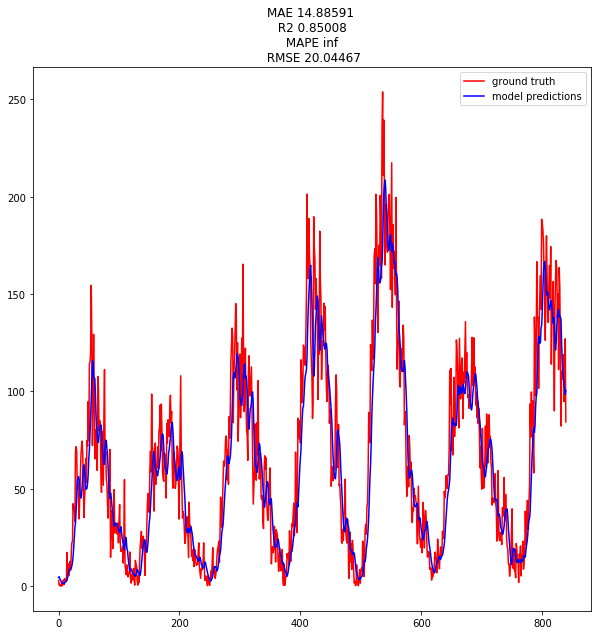

MAE 11.0197
R2 0.7980
RMSE 15.2231
[1.00987] 1.3439941




Plot, with Optimizer.
(840,) (840,)


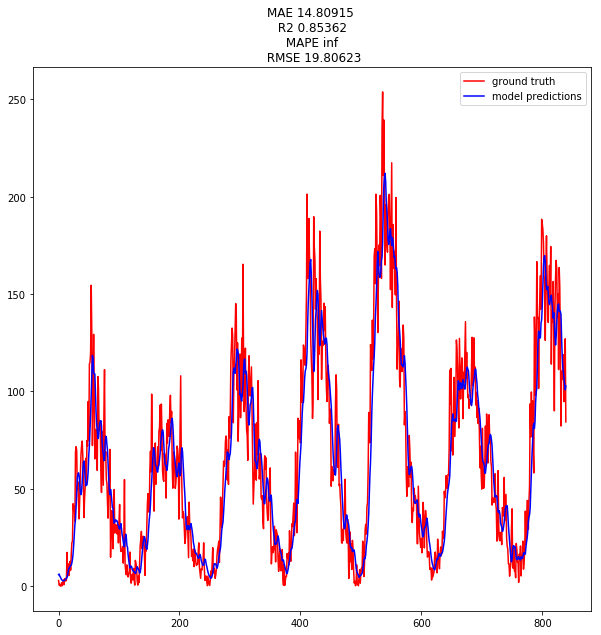

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adagrad', 'lr': 0.0016}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/100
1959/1959 [==============================] - 4s 2ms/step - loss: 13.6687 - mean_absolute_error: 14.1578 - rmse: 14.1578 - val_loss: 22.9876 - val_mean_absolute_error: 23.4814 - val_rmse: 23.4814
Epoch 2/100
1959/1959 [==============================] - 1s 307us/step - loss: 11.2502 - mean_absolute_error: 11.7379 - rmse: 11.7379 - val_loss: 15.4434 - val_mean_absolute_error: 15.9358 - val_rmse: 15.9358
Epoch 3/100
1959/1959 [==============================] - 1s 311us/step - loss: 10.8042 - mean_absolute_error: 11.2907 - rmse: 11.2907 - val_loss: 13.6634 - val_mean_absolute_error: 14.1522 - val_rmse: 14.1522
Epoch 4/100
1959/1959 [==============================] - 1s 300us/step - loss: 10.5330 - mean_absolute_error: 11.0194 - rmse: 11.0194 - val_loss: 13.4213 - val_mean_absolute_error: 13.9109 - val_rmse: 13.9109
Epoch 5/100
1

1959/1959 [==============================] - 1s 306us/step - loss: 9.2551 - mean_absolute_error: 9.7298 - rmse: 9.7298 - val_loss: 12.7300 - val_mean_absolute_error: 13.2163 - val_rmse: 13.2163
Epoch 79/100
1959/1959 [==============================] - 1s 296us/step - loss: 9.2656 - mean_absolute_error: 9.7433 - rmse: 9.7433 - val_loss: 12.5762 - val_mean_absolute_error: 13.0644 - val_rmse: 13.0644
Epoch 80/100
1959/1959 [==============================] - 1s 306us/step - loss: 9.2355 - mean_absolute_error: 9.7095 - rmse: 9.7095 - val_loss: 12.4508 - val_mean_absolute_error: 12.9383 - val_rmse: 12.9383
Epoch 81/100
1959/1959 [==============================] - 1s 292us/step - loss: 9.2807 - mean_absolute_error: 9.7573 - rmse: 9.7573 - val_loss: 12.3944 - val_mean_absolute_error: 12.8833 - val_rmse: 12.8833
Epoch 82/100
1959/1959 [==============================] - 1s 305us/step - loss: 9.1902 - mean_absolute_error: 9.6665 - rmse: 9.6665 - val_loss: 12.5991 - val_mean_absolute_error: 13.087

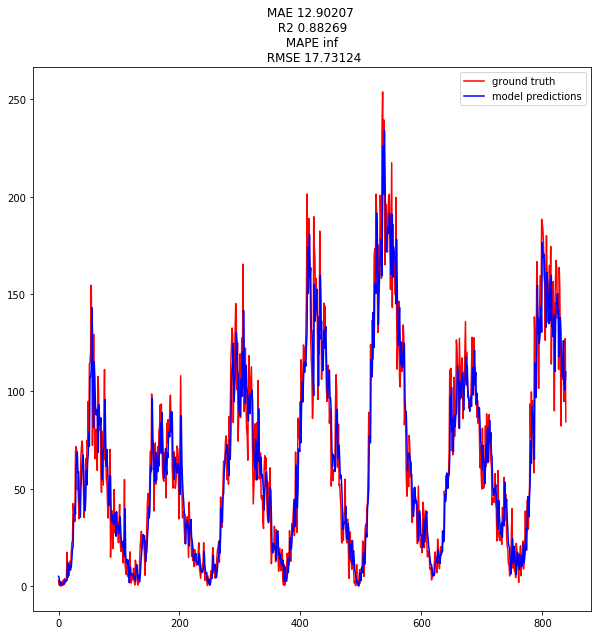

MAE 9.0187
R2 0.8550
RMSE 12.8985
[0.99224937] 1.008873




Plot, with Optimizer.
(840,) (840,)


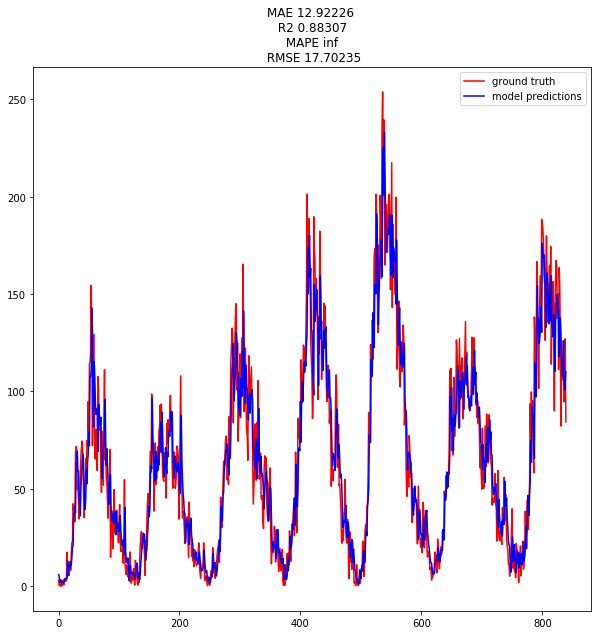

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adagrad', 'lr': 6.4e-05}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 5s 2ms/step - loss: 37.5988 - mean_absolute_error: 38.0853 - rmse: 38.0853 - val_loss: 44.7098 - val_mean_absolute_error: 45.2045 - val_rmse: 45.2045
Epoch 2/400
1959/1959 [==============================] - 1s 313us/step - loss: 23.7615 - mean_absolute_error: 24.2493 - rmse: 24.2493 - val_loss: 24.7214 - val_mean_absolute_error: 25.2139 - val_rmse: 25.2139
Epoch 3/400
1959/1959 [==============================] - 1s 309us/step - loss: 14.0742 - mean_absolute_error: 14.5604 - rmse: 14.5604 - val_loss: 17.2482 - val_mean_absolute_error: 17.7415 - val_rmse: 17.7415
Epoch 4/400
1959/1959 [==============================] - 1s 297us/step - loss: 12.1498 - mean_absolute_error: 12.6351 - rmse: 12.6351 - val_loss: 16.5703 - val_mean_absolute_error: 17.0650 - val_rmse: 17.0650
Epoch 5/400


1959/1959 [==============================] - 1s 289us/step - loss: 11.0082 - mean_absolute_error: 11.4928 - rmse: 11.4928 - val_loss: 14.5377 - val_mean_absolute_error: 15.0287 - val_rmse: 15.0287
Epoch 79/400
1959/1959 [==============================] - 1s 290us/step - loss: 11.0041 - mean_absolute_error: 11.4886 - rmse: 11.4886 - val_loss: 14.5015 - val_mean_absolute_error: 14.9924 - val_rmse: 14.9924
Epoch 80/400
1959/1959 [==============================] - 1s 283us/step - loss: 11.0001 - mean_absolute_error: 11.4847 - rmse: 11.4847 - val_loss: 14.5025 - val_mean_absolute_error: 14.9935 - val_rmse: 14.9935
Epoch 81/400
1959/1959 [==============================] - 1s 288us/step - loss: 10.9927 - mean_absolute_error: 11.4774 - rmse: 11.4774 - val_loss: 14.5133 - val_mean_absolute_error: 15.0045 - val_rmse: 15.0045
Epoch 82/400
1959/1959 [==============================] - 1s 291us/step - loss: 10.9815 - mean_absolute_error: 11.4662 - rmse: 11.4662 - val_loss: 14.4643 - val_mean_absolut

Epoch 117/400
1959/1959 [==============================] - 1s 315us/step - loss: 10.8263 - mean_absolute_error: 11.3120 - rmse: 11.3120 - val_loss: 14.1172 - val_mean_absolute_error: 14.6074 - val_rmse: 14.6074
Epoch 118/400
1959/1959 [==============================] - 1s 301us/step - loss: 10.8244 - mean_absolute_error: 11.3103 - rmse: 11.3103 - val_loss: 14.1196 - val_mean_absolute_error: 14.6092 - val_rmse: 14.6092
Epoch 119/400
1959/1959 [==============================] - 1s 302us/step - loss: 10.8191 - mean_absolute_error: 11.3052 - rmse: 11.3052 - val_loss: 14.1053 - val_mean_absolute_error: 14.5951 - val_rmse: 14.5951
Epoch 120/400
1959/1959 [==============================] - 1s 303us/step - loss: 10.8143 - mean_absolute_error: 11.3001 - rmse: 11.3001 - val_loss: 14.0781 - val_mean_absolute_error: 14.5693 - val_rmse: 14.5693
Epoch 121/400
1959/1959 [==============================] - 1s 302us/step - loss: 10.8129 - mean_absolute_error: 11.2980 - rmse: 11.2980 - val_loss: 14.0989 

Epoch 156/400
1959/1959 [==============================] - 1s 297us/step - loss: 10.7109 - mean_absolute_error: 11.1954 - rmse: 11.1954 - val_loss: 13.8562 - val_mean_absolute_error: 14.3475 - val_rmse: 14.3475
Epoch 157/400
1959/1959 [==============================] - 1s 294us/step - loss: 10.7113 - mean_absolute_error: 11.1969 - rmse: 11.1969 - val_loss: 13.8595 - val_mean_absolute_error: 14.3510 - val_rmse: 14.3510
Epoch 158/400
1959/1959 [==============================] - 1s 294us/step - loss: 10.7081 - mean_absolute_error: 11.1938 - rmse: 11.1938 - val_loss: 13.8706 - val_mean_absolute_error: 14.3618 - val_rmse: 14.3618
Epoch 159/400
1959/1959 [==============================] - 1s 293us/step - loss: 10.7062 - mean_absolute_error: 11.1915 - rmse: 11.1915 - val_loss: 13.8583 - val_mean_absolute_error: 14.3498 - val_rmse: 14.3498
Epoch 160/400
1959/1959 [==============================] - 1s 300us/step - loss: 10.7050 - mean_absolute_error: 11.1905 - rmse: 11.1905 - val_loss: 13.8485 

Epoch 195/400
1959/1959 [==============================] - 1s 307us/step - loss: 10.6332 - mean_absolute_error: 11.1186 - rmse: 11.1186 - val_loss: 13.6906 - val_mean_absolute_error: 14.1798 - val_rmse: 14.1798
Epoch 196/400
1959/1959 [==============================] - 1s 309us/step - loss: 10.6284 - mean_absolute_error: 11.1139 - rmse: 11.1139 - val_loss: 13.6865 - val_mean_absolute_error: 14.1756 - val_rmse: 14.1756
Epoch 197/400
1959/1959 [==============================] - 1s 313us/step - loss: 10.6277 - mean_absolute_error: 11.1142 - rmse: 11.1142 - val_loss: 13.6802 - val_mean_absolute_error: 14.1696 - val_rmse: 14.1696
Epoch 198/400
1959/1959 [==============================] - 1s 304us/step - loss: 10.6260 - mean_absolute_error: 11.1122 - rmse: 11.1122 - val_loss: 13.6896 - val_mean_absolute_error: 14.1792 - val_rmse: 14.1792
Epoch 199/400
1959/1959 [==============================] - 1s 304us/step - loss: 10.6242 - mean_absolute_error: 11.1107 - rmse: 11.1107 - val_loss: 13.6891 

Epoch 234/400
1959/1959 [==============================] - 1s 285us/step - loss: 10.5626 - mean_absolute_error: 11.0489 - rmse: 11.0489 - val_loss: 13.5393 - val_mean_absolute_error: 14.0279 - val_rmse: 14.0279
Epoch 235/400
1959/1959 [==============================] - 1s 293us/step - loss: 10.5589 - mean_absolute_error: 11.0449 - rmse: 11.0449 - val_loss: 13.5358 - val_mean_absolute_error: 14.0244 - val_rmse: 14.0244
Epoch 236/400
1959/1959 [==============================] - 1s 298us/step - loss: 10.5596 - mean_absolute_error: 11.0464 - rmse: 11.0464 - val_loss: 13.5343 - val_mean_absolute_error: 14.0228 - val_rmse: 14.0228
Epoch 237/400
1959/1959 [==============================] - 1s 291us/step - loss: 10.5566 - mean_absolute_error: 11.0431 - rmse: 11.0431 - val_loss: 13.5332 - val_mean_absolute_error: 14.0216 - val_rmse: 14.0216
Epoch 238/400
1959/1959 [==============================] - 1s 292us/step - loss: 10.5541 - mean_absolute_error: 11.0401 - rmse: 11.0401 - val_loss: 13.5240 

Epoch 273/400
1959/1959 [==============================] - 1s 300us/step - loss: 10.4969 - mean_absolute_error: 10.9828 - rmse: 10.9828 - val_loss: 13.4372 - val_mean_absolute_error: 13.9279 - val_rmse: 13.9279
Epoch 274/400
1959/1959 [==============================] - 1s 309us/step - loss: 10.4951 - mean_absolute_error: 10.9810 - rmse: 10.9810 - val_loss: 13.4345 - val_mean_absolute_error: 13.9251 - val_rmse: 13.9251
Epoch 275/400
1959/1959 [==============================] - 1s 308us/step - loss: 10.4944 - mean_absolute_error: 10.9805 - rmse: 10.9805 - val_loss: 13.4348 - val_mean_absolute_error: 13.9254 - val_rmse: 13.9254
Epoch 276/400
1959/1959 [==============================] - 1s 309us/step - loss: 10.4934 - mean_absolute_error: 10.9789 - rmse: 10.9789 - val_loss: 13.4301 - val_mean_absolute_error: 13.9208 - val_rmse: 13.9208
Epoch 277/400
1959/1959 [==============================] - 1s 301us/step - loss: 10.4916 - mean_absolute_error: 10.9774 - rmse: 10.9774 - val_loss: 13.4213 

Epoch 312/400
1959/1959 [==============================] - 1s 287us/step - loss: 10.4407 - mean_absolute_error: 10.9270 - rmse: 10.9270 - val_loss: 13.3053 - val_mean_absolute_error: 13.7962 - val_rmse: 13.7962
Epoch 313/400
1959/1959 [==============================] - 1s 292us/step - loss: 10.4407 - mean_absolute_error: 10.9267 - rmse: 10.9267 - val_loss: 13.3152 - val_mean_absolute_error: 13.8062 - val_rmse: 13.8062
Epoch 314/400
1959/1959 [==============================] - 1s 306us/step - loss: 10.4372 - mean_absolute_error: 10.9231 - rmse: 10.9231 - val_loss: 13.3059 - val_mean_absolute_error: 13.7968 - val_rmse: 13.7968
Epoch 315/400
1959/1959 [==============================] - 1s 288us/step - loss: 10.4366 - mean_absolute_error: 10.9230 - rmse: 10.9230 - val_loss: 13.2941 - val_mean_absolute_error: 13.7848 - val_rmse: 13.7848
Epoch 316/400
1959/1959 [==============================] - 1s 290us/step - loss: 10.4358 - mean_absolute_error: 10.9214 - rmse: 10.9214 - val_loss: 13.2890 

Epoch 351/400
1959/1959 [==============================] - 1s 305us/step - loss: 10.3901 - mean_absolute_error: 10.8758 - rmse: 10.8758 - val_loss: 13.2111 - val_mean_absolute_error: 13.7025 - val_rmse: 13.7025
Epoch 352/400
1959/1959 [==============================] - 1s 302us/step - loss: 10.3892 - mean_absolute_error: 10.8750 - rmse: 10.8750 - val_loss: 13.2099 - val_mean_absolute_error: 13.7012 - val_rmse: 13.7012
Epoch 353/400
1959/1959 [==============================] - 1s 290us/step - loss: 10.3883 - mean_absolute_error: 10.8738 - rmse: 10.8738 - val_loss: 13.2150 - val_mean_absolute_error: 13.7069 - val_rmse: 13.7069
Epoch 354/400
1959/1959 [==============================] - 1s 288us/step - loss: 10.3869 - mean_absolute_error: 10.8724 - rmse: 10.8724 - val_loss: 13.2012 - val_mean_absolute_error: 13.6921 - val_rmse: 13.6921
Epoch 355/400
1959/1959 [==============================] - 1s 299us/step - loss: 10.3870 - mean_absolute_error: 10.8725 - rmse: 10.8725 - val_loss: 13.2027 

Epoch 390/400
1959/1959 [==============================] - 1s 288us/step - loss: 10.3459 - mean_absolute_error: 10.8309 - rmse: 10.8309 - val_loss: 13.1210 - val_mean_absolute_error: 13.6119 - val_rmse: 13.6119
Epoch 391/400
1959/1959 [==============================] - 1s 289us/step - loss: 10.3442 - mean_absolute_error: 10.8288 - rmse: 10.8288 - val_loss: 13.1273 - val_mean_absolute_error: 13.6188 - val_rmse: 13.6188
Epoch 392/400
1959/1959 [==============================] - 1s 285us/step - loss: 10.3418 - mean_absolute_error: 10.8263 - rmse: 10.8263 - val_loss: 13.1387 - val_mean_absolute_error: 13.6302 - val_rmse: 13.6302
Epoch 393/400
1959/1959 [==============================] - 1s 295us/step - loss: 10.3411 - mean_absolute_error: 10.8258 - rmse: 10.8258 - val_loss: 13.1328 - val_mean_absolute_error: 13.6244 - val_rmse: 13.6244
Epoch 394/400
1959/1959 [==============================] - 1s 288us/step - loss: 10.3403 - mean_absolute_error: 10.8249 - rmse: 10.8249 - val_loss: 13.1211 

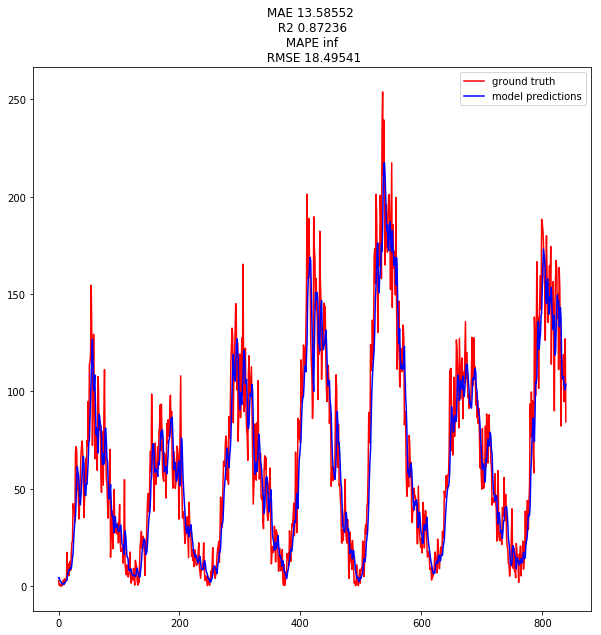

MAE 10.5340
R2 0.8163
RMSE 14.5161
[0.9951592] 1.4482384




Plot, with Optimizer.
(840,) (840,)


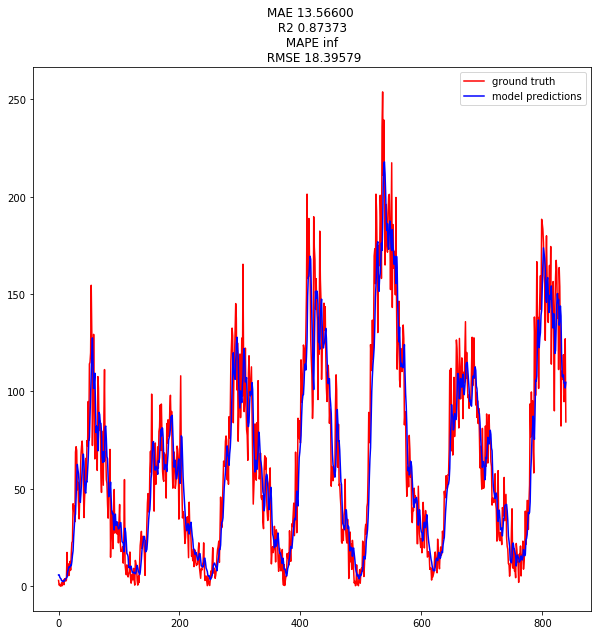

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adagrad', 'lr': 2.56e-06}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/1500
1959/1959 [==============================] - 5s 3ms/step - loss: 44.9680 - mean_absolute_error: 45.4512 - rmse: 45.4512 - val_loss: 65.3576 - val_mean_absolute_error: 65.8542 - val_rmse: 65.8542
Epoch 2/1500
1959/1959 [==============================] - 1s 328us/step - loss: 44.9220 - mean_absolute_error: 45.4050 - rmse: 45.4050 - val_loss: 65.3088 - val_mean_absolute_error: 65.8054 - val_rmse: 65.8054
Epoch 3/1500
1959/1959 [==============================] - 1s 309us/step - loss: 44.8926 - mean_absolute_error: 45.3755 - rmse: 45.3755 - val_loss: 65.2717 - val_mean_absolute_error: 65.7683 - val_rmse: 65.7683
Epoch 4/1500
1959/1959 [==============================] - 1s 306us/step - loss: 44.8690 - mean_absolute_error: 45.3519 - rmse: 45.3519 - val_loss: 65.2409 - val_mean_absolute_error: 65.7374 - val_rmse: 65.7374
Epoch 5

Epoch 78/1500
1959/1959 [==============================] - 1s 303us/step - loss: 42.1833 - mean_absolute_error: 42.6668 - rmse: 42.6668 - val_loss: 61.3381 - val_mean_absolute_error: 61.8323 - val_rmse: 61.8323
Epoch 79/1500
1959/1959 [==============================] - 1s 297us/step - loss: 42.1518 - mean_absolute_error: 42.6353 - rmse: 42.6353 - val_loss: 61.2930 - val_mean_absolute_error: 61.7873 - val_rmse: 61.7873
Epoch 80/1500
1959/1959 [==============================] - 1s 292us/step - loss: 42.1206 - mean_absolute_error: 42.6041 - rmse: 42.6041 - val_loss: 61.2480 - val_mean_absolute_error: 61.7423 - val_rmse: 61.7423
Epoch 81/1500
1959/1959 [==============================] - 1s 296us/step - loss: 42.0894 - mean_absolute_error: 42.5730 - rmse: 42.5730 - val_loss: 61.2035 - val_mean_absolute_error: 61.6978 - val_rmse: 61.6978
Epoch 82/1500
1959/1959 [==============================] - 1s 302us/step - loss: 42.0586 - mean_absolute_error: 42.5422 - rmse: 42.5422 - val_loss: 61.1592 

Epoch 117/1500
1959/1959 [==============================] - 1s 287us/step - loss: 41.0707 - mean_absolute_error: 41.5550 - rmse: 41.5550 - val_loss: 59.7379 - val_mean_absolute_error: 60.2327 - val_rmse: 60.2327
Epoch 118/1500
1959/1959 [==============================] - 1s 286us/step - loss: 41.0449 - mean_absolute_error: 41.5292 - rmse: 41.5292 - val_loss: 59.7005 - val_mean_absolute_error: 60.1952 - val_rmse: 60.1952
Epoch 119/1500
1959/1959 [==============================] - 1s 293us/step - loss: 41.0191 - mean_absolute_error: 41.5034 - rmse: 41.5034 - val_loss: 59.6634 - val_mean_absolute_error: 60.1581 - val_rmse: 60.1581
Epoch 120/1500
1959/1959 [==============================] - 1s 291us/step - loss: 40.9934 - mean_absolute_error: 41.4777 - rmse: 41.4777 - val_loss: 59.6265 - val_mean_absolute_error: 60.1213 - val_rmse: 60.1213
Epoch 121/1500
1959/1959 [==============================] - 1s 291us/step - loss: 40.9679 - mean_absolute_error: 41.4522 - rmse: 41.4522 - val_loss: 59.

Epoch 156/1500
1959/1959 [==============================] - 1s 307us/step - loss: 40.1264 - mean_absolute_error: 40.6118 - rmse: 40.6118 - val_loss: 58.3808 - val_mean_absolute_error: 58.8755 - val_rmse: 58.8755
Epoch 157/1500
1959/1959 [==============================] - 1s 311us/step - loss: 40.1039 - mean_absolute_error: 40.5892 - rmse: 40.5892 - val_loss: 58.3482 - val_mean_absolute_error: 58.8428 - val_rmse: 58.8428
Epoch 158/1500
1959/1959 [==============================] - 1s 303us/step - loss: 40.0810 - mean_absolute_error: 40.5664 - rmse: 40.5664 - val_loss: 58.3156 - val_mean_absolute_error: 58.8102 - val_rmse: 58.8102
Epoch 159/1500
1959/1959 [==============================] - 1s 295us/step - loss: 40.0582 - mean_absolute_error: 40.5436 - rmse: 40.5436 - val_loss: 58.2831 - val_mean_absolute_error: 58.7777 - val_rmse: 58.7777
Epoch 160/1500
1959/1959 [==============================] - 1s 294us/step - loss: 40.0358 - mean_absolute_error: 40.5212 - rmse: 40.5212 - val_loss: 58.

Epoch 195/1500
1959/1959 [==============================] - 1s 312us/step - loss: 39.2719 - mean_absolute_error: 39.7580 - rmse: 39.7580 - val_loss: 57.1571 - val_mean_absolute_error: 57.6515 - val_rmse: 57.6515
Epoch 196/1500
1959/1959 [==============================] - 1s 305us/step - loss: 39.2507 - mean_absolute_error: 39.7369 - rmse: 39.7369 - val_loss: 57.1265 - val_mean_absolute_error: 57.6209 - val_rmse: 57.6209
Epoch 197/1500
1959/1959 [==============================] - 1s 304us/step - loss: 39.2294 - mean_absolute_error: 39.7156 - rmse: 39.7156 - val_loss: 57.0961 - val_mean_absolute_error: 57.5906 - val_rmse: 57.5906
Epoch 198/1500
1959/1959 [==============================] - 1s 304us/step - loss: 39.2081 - mean_absolute_error: 39.6943 - rmse: 39.6943 - val_loss: 57.0657 - val_mean_absolute_error: 57.5602 - val_rmse: 57.5602
Epoch 199/1500
1959/1959 [==============================] - 1s 307us/step - loss: 39.1869 - mean_absolute_error: 39.6731 - rmse: 39.6731 - val_loss: 57.

Epoch 234/1500
1959/1959 [==============================] - 1s 292us/step - loss: 38.4459 - mean_absolute_error: 38.9324 - rmse: 38.9324 - val_loss: 55.9718 - val_mean_absolute_error: 56.4667 - val_rmse: 56.4667
Epoch 235/1500
1959/1959 [==============================] - 1s 296us/step - loss: 38.4245 - mean_absolute_error: 38.9111 - rmse: 38.9111 - val_loss: 55.9411 - val_mean_absolute_error: 56.4360 - val_rmse: 56.4360
Epoch 236/1500
1959/1959 [==============================] - 1s 289us/step - loss: 38.4033 - mean_absolute_error: 38.8899 - rmse: 38.8899 - val_loss: 55.9105 - val_mean_absolute_error: 56.4054 - val_rmse: 56.4054
Epoch 237/1500
1959/1959 [==============================] - 1s 302us/step - loss: 38.3819 - mean_absolute_error: 38.8685 - rmse: 38.8685 - val_loss: 55.8796 - val_mean_absolute_error: 56.3746 - val_rmse: 56.3746
Epoch 238/1500
1959/1959 [==============================] - 1s 304us/step - loss: 38.3604 - mean_absolute_error: 38.8471 - rmse: 38.8471 - val_loss: 55.

Epoch 273/1500
1959/1959 [==============================] - 1s 289us/step - loss: 37.6081 - mean_absolute_error: 38.0954 - rmse: 38.0954 - val_loss: 54.7652 - val_mean_absolute_error: 55.2598 - val_rmse: 55.2598
Epoch 274/1500
1959/1959 [==============================] - 1s 300us/step - loss: 37.5864 - mean_absolute_error: 38.0738 - rmse: 38.0738 - val_loss: 54.7341 - val_mean_absolute_error: 55.2287 - val_rmse: 55.2287
Epoch 275/1500
1959/1959 [==============================] - 1s 292us/step - loss: 37.5650 - mean_absolute_error: 38.0523 - rmse: 38.0523 - val_loss: 54.7033 - val_mean_absolute_error: 55.1978 - val_rmse: 55.1978
Epoch 276/1500
1959/1959 [==============================] - 1s 291us/step - loss: 37.5435 - mean_absolute_error: 38.0308 - rmse: 38.0308 - val_loss: 54.6724 - val_mean_absolute_error: 55.1669 - val_rmse: 55.1669
Epoch 277/1500
1959/1959 [==============================] - 1s 288us/step - loss: 37.5221 - mean_absolute_error: 38.0094 - rmse: 38.0094 - val_loss: 54.

Epoch 312/1500
1959/1959 [==============================] - 1s 303us/step - loss: 36.7754 - mean_absolute_error: 37.2623 - rmse: 37.2623 - val_loss: 53.5661 - val_mean_absolute_error: 54.0605 - val_rmse: 54.0605
Epoch 313/1500
1959/1959 [==============================] - 1s 303us/step - loss: 36.7542 - mean_absolute_error: 37.2411 - rmse: 37.2411 - val_loss: 53.5356 - val_mean_absolute_error: 54.0300 - val_rmse: 54.0300
Epoch 314/1500
1959/1959 [==============================] - 1s 293us/step - loss: 36.7332 - mean_absolute_error: 37.2201 - rmse: 37.2201 - val_loss: 53.5053 - val_mean_absolute_error: 53.9997 - val_rmse: 53.9997
Epoch 315/1500
1959/1959 [==============================] - 1s 295us/step - loss: 36.7121 - mean_absolute_error: 37.1989 - rmse: 37.1989 - val_loss: 53.4747 - val_mean_absolute_error: 53.9692 - val_rmse: 53.9692
Epoch 316/1500
1959/1959 [==============================] - 1s 295us/step - loss: 36.6908 - mean_absolute_error: 37.1777 - rmse: 37.1777 - val_loss: 53.

Epoch 351/1500
1959/1959 [==============================] - 1s 299us/step - loss: 35.9592 - mean_absolute_error: 36.4460 - rmse: 36.4460 - val_loss: 52.3891 - val_mean_absolute_error: 52.8842 - val_rmse: 52.8842
Epoch 352/1500
1959/1959 [==============================] - 1s 302us/step - loss: 35.9386 - mean_absolute_error: 36.4254 - rmse: 36.4254 - val_loss: 52.3590 - val_mean_absolute_error: 52.8542 - val_rmse: 52.8542
Epoch 353/1500
1959/1959 [==============================] - 1s 307us/step - loss: 35.9177 - mean_absolute_error: 36.4045 - rmse: 36.4045 - val_loss: 52.3292 - val_mean_absolute_error: 52.8244 - val_rmse: 52.8244
Epoch 354/1500
1959/1959 [==============================] - 1s 307us/step - loss: 35.8969 - mean_absolute_error: 36.3838 - rmse: 36.3838 - val_loss: 52.2990 - val_mean_absolute_error: 52.7942 - val_rmse: 52.7942
Epoch 355/1500
1959/1959 [==============================] - 1s 303us/step - loss: 35.8762 - mean_absolute_error: 36.3630 - rmse: 36.3630 - val_loss: 52.

Epoch 390/1500
1959/1959 [==============================] - 1s 290us/step - loss: 35.1559 - mean_absolute_error: 35.6431 - rmse: 35.6431 - val_loss: 51.2278 - val_mean_absolute_error: 51.7237 - val_rmse: 51.7237
Epoch 391/1500
1959/1959 [==============================] - 1s 299us/step - loss: 35.1353 - mean_absolute_error: 35.6225 - rmse: 35.6225 - val_loss: 51.1982 - val_mean_absolute_error: 51.6942 - val_rmse: 51.6942
Epoch 392/1500
1959/1959 [==============================] - 1s 284us/step - loss: 35.1149 - mean_absolute_error: 35.6021 - rmse: 35.6021 - val_loss: 51.1686 - val_mean_absolute_error: 51.6646 - val_rmse: 51.6646
Epoch 393/1500
1959/1959 [==============================] - 1s 318us/step - loss: 35.0944 - mean_absolute_error: 35.5816 - rmse: 35.5816 - val_loss: 51.1393 - val_mean_absolute_error: 51.6352 - val_rmse: 51.6352
Epoch 394/1500
1959/1959 [==============================] - 1s 301us/step - loss: 35.0742 - mean_absolute_error: 35.5614 - rmse: 35.5614 - val_loss: 51.

Epoch 429/1500
1959/1959 [==============================] - 1s 308us/step - loss: 34.3583 - mean_absolute_error: 34.8457 - rmse: 34.8457 - val_loss: 50.0731 - val_mean_absolute_error: 50.5686 - val_rmse: 50.5686
Epoch 430/1500
1959/1959 [==============================] - 1s 309us/step - loss: 34.3378 - mean_absolute_error: 34.8252 - rmse: 34.8252 - val_loss: 50.0434 - val_mean_absolute_error: 50.5389 - val_rmse: 50.5389
Epoch 431/1500
1959/1959 [==============================] - 1s 311us/step - loss: 34.3175 - mean_absolute_error: 34.8049 - rmse: 34.8049 - val_loss: 50.0136 - val_mean_absolute_error: 50.5091 - val_rmse: 50.5091
Epoch 432/1500
1959/1959 [==============================] - 1s 307us/step - loss: 34.2968 - mean_absolute_error: 34.7843 - rmse: 34.7843 - val_loss: 49.9839 - val_mean_absolute_error: 50.4794 - val_rmse: 50.4794
Epoch 433/1500
1959/1959 [==============================] - 1s 303us/step - loss: 34.2764 - mean_absolute_error: 34.7639 - rmse: 34.7639 - val_loss: 49.

Epoch 468/1500
1959/1959 [==============================] - 1s 289us/step - loss: 33.5587 - mean_absolute_error: 34.0467 - rmse: 34.0467 - val_loss: 48.9134 - val_mean_absolute_error: 49.4073 - val_rmse: 49.4073
Epoch 469/1500
1959/1959 [==============================] - 1s 291us/step - loss: 33.5380 - mean_absolute_error: 34.0260 - rmse: 34.0260 - val_loss: 48.8837 - val_mean_absolute_error: 49.3776 - val_rmse: 49.3776
Epoch 470/1500
1959/1959 [==============================] - 1s 287us/step - loss: 33.5177 - mean_absolute_error: 34.0058 - rmse: 34.0058 - val_loss: 48.8539 - val_mean_absolute_error: 49.3478 - val_rmse: 49.3478
Epoch 471/1500
1959/1959 [==============================] - 1s 292us/step - loss: 33.4971 - mean_absolute_error: 33.9850 - rmse: 33.9850 - val_loss: 48.8241 - val_mean_absolute_error: 49.3180 - val_rmse: 49.3180
Epoch 472/1500
1959/1959 [==============================] - 1s 286us/step - loss: 33.4765 - mean_absolute_error: 33.9646 - rmse: 33.9646 - val_loss: 48.

Epoch 507/1500
1959/1959 [==============================] - 1s 310us/step - loss: 32.7586 - mean_absolute_error: 33.2462 - rmse: 33.2462 - val_loss: 47.7525 - val_mean_absolute_error: 48.2460 - val_rmse: 48.2460
Epoch 508/1500
1959/1959 [==============================] - 1s 312us/step - loss: 32.7380 - mean_absolute_error: 33.2256 - rmse: 33.2256 - val_loss: 47.7227 - val_mean_absolute_error: 48.2161 - val_rmse: 48.2161
Epoch 509/1500
1959/1959 [==============================] - 1s 308us/step - loss: 32.7174 - mean_absolute_error: 33.2050 - rmse: 33.2050 - val_loss: 47.6930 - val_mean_absolute_error: 48.1865 - val_rmse: 48.1865
Epoch 510/1500
1959/1959 [==============================] - 1s 301us/step - loss: 32.6971 - mean_absolute_error: 33.1846 - rmse: 33.1846 - val_loss: 47.6635 - val_mean_absolute_error: 48.1569 - val_rmse: 48.1569
Epoch 511/1500
1959/1959 [==============================] - 1s 310us/step - loss: 32.6764 - mean_absolute_error: 33.1640 - rmse: 33.1640 - val_loss: 47.

Epoch 546/1500
1959/1959 [==============================] - 1s 288us/step - loss: 31.9562 - mean_absolute_error: 32.4433 - rmse: 32.4433 - val_loss: 46.5877 - val_mean_absolute_error: 47.0812 - val_rmse: 47.0812
Epoch 547/1500
1959/1959 [==============================] - 1s 288us/step - loss: 31.9358 - mean_absolute_error: 32.4229 - rmse: 32.4229 - val_loss: 46.5575 - val_mean_absolute_error: 47.0510 - val_rmse: 47.0510
Epoch 548/1500
1959/1959 [==============================] - 1s 300us/step - loss: 31.9150 - mean_absolute_error: 32.4021 - rmse: 32.4021 - val_loss: 46.5275 - val_mean_absolute_error: 47.0211 - val_rmse: 47.0211
Epoch 549/1500
1959/1959 [==============================] - 1s 293us/step - loss: 31.8943 - mean_absolute_error: 32.3813 - rmse: 32.3813 - val_loss: 46.4976 - val_mean_absolute_error: 46.9912 - val_rmse: 46.9912
Epoch 550/1500
1959/1959 [==============================] - 1s 290us/step - loss: 31.8739 - mean_absolute_error: 32.3609 - rmse: 32.3609 - val_loss: 46.

Epoch 585/1500
1959/1959 [==============================] - 1s 308us/step - loss: 31.1522 - mean_absolute_error: 31.6382 - rmse: 31.6382 - val_loss: 45.4182 - val_mean_absolute_error: 45.9132 - val_rmse: 45.9132
Epoch 586/1500
1959/1959 [==============================] - 1s 302us/step - loss: 31.1317 - mean_absolute_error: 31.6177 - rmse: 31.6177 - val_loss: 45.3881 - val_mean_absolute_error: 45.8832 - val_rmse: 45.8832
Epoch 587/1500
1959/1959 [==============================] - 1s 289us/step - loss: 31.1109 - mean_absolute_error: 31.5969 - rmse: 31.5969 - val_loss: 45.3579 - val_mean_absolute_error: 45.8530 - val_rmse: 45.8530
Epoch 588/1500
1959/1959 [==============================] - 1s 306us/step - loss: 31.0903 - mean_absolute_error: 31.5763 - rmse: 31.5763 - val_loss: 45.3278 - val_mean_absolute_error: 45.8229 - val_rmse: 45.8229
Epoch 589/1500
1959/1959 [==============================] - 1s 303us/step - loss: 31.0695 - mean_absolute_error: 31.5555 - rmse: 31.5555 - val_loss: 45.

Epoch 624/1500
1959/1959 [==============================] - 1s 288us/step - loss: 30.3449 - mean_absolute_error: 30.8298 - rmse: 30.8298 - val_loss: 44.2422 - val_mean_absolute_error: 44.7381 - val_rmse: 44.7381
Epoch 625/1500
1959/1959 [==============================] - 1s 289us/step - loss: 30.3240 - mean_absolute_error: 30.8089 - rmse: 30.8089 - val_loss: 44.2118 - val_mean_absolute_error: 44.7078 - val_rmse: 44.7078
Epoch 626/1500
1959/1959 [==============================] - 1s 297us/step - loss: 30.3031 - mean_absolute_error: 30.7880 - rmse: 30.7880 - val_loss: 44.1814 - val_mean_absolute_error: 44.6774 - val_rmse: 44.6774
Epoch 627/1500
1959/1959 [==============================] - 1s 295us/step - loss: 30.2823 - mean_absolute_error: 30.7671 - rmse: 30.7671 - val_loss: 44.1511 - val_mean_absolute_error: 44.6472 - val_rmse: 44.6472
Epoch 628/1500
1959/1959 [==============================] - 1s 289us/step - loss: 30.2616 - mean_absolute_error: 30.7465 - rmse: 30.7465 - val_loss: 44.

Epoch 663/1500
1959/1959 [==============================] - 1s 308us/step - loss: 29.5349 - mean_absolute_error: 30.0199 - rmse: 30.0199 - val_loss: 43.0598 - val_mean_absolute_error: 43.5559 - val_rmse: 43.5559
Epoch 664/1500
1959/1959 [==============================] - 1s 286us/step - loss: 29.5140 - mean_absolute_error: 29.9990 - rmse: 29.9990 - val_loss: 43.0294 - val_mean_absolute_error: 43.5255 - val_rmse: 43.5255
Epoch 665/1500
1959/1959 [==============================] - 1s 291us/step - loss: 29.4932 - mean_absolute_error: 29.9783 - rmse: 29.9783 - val_loss: 42.9992 - val_mean_absolute_error: 43.4953 - val_rmse: 43.4953
Epoch 666/1500
1959/1959 [==============================] - 1s 299us/step - loss: 29.4724 - mean_absolute_error: 29.9576 - rmse: 29.9576 - val_loss: 42.9689 - val_mean_absolute_error: 43.4651 - val_rmse: 43.4651
Epoch 667/1500
1959/1959 [==============================] - 1s 309us/step - loss: 29.4520 - mean_absolute_error: 29.9373 - rmse: 29.9373 - val_loss: 42.

Epoch 702/1500
1959/1959 [==============================] - 1s 295us/step - loss: 28.7265 - mean_absolute_error: 29.2131 - rmse: 29.2131 - val_loss: 41.8749 - val_mean_absolute_error: 42.3718 - val_rmse: 42.3718
Epoch 703/1500
1959/1959 [==============================] - 1s 290us/step - loss: 28.7058 - mean_absolute_error: 29.1925 - rmse: 29.1925 - val_loss: 41.8447 - val_mean_absolute_error: 42.3416 - val_rmse: 42.3416
Epoch 704/1500
1959/1959 [==============================] - 1s 298us/step - loss: 28.6852 - mean_absolute_error: 29.1719 - rmse: 29.1719 - val_loss: 41.8142 - val_mean_absolute_error: 42.3111 - val_rmse: 42.3111
Epoch 705/1500
1959/1959 [==============================] - 1s 296us/step - loss: 28.6644 - mean_absolute_error: 29.1511 - rmse: 29.1511 - val_loss: 41.7839 - val_mean_absolute_error: 42.2808 - val_rmse: 42.2808
Epoch 706/1500
1959/1959 [==============================] - 1s 295us/step - loss: 28.6440 - mean_absolute_error: 29.1307 - rmse: 29.1307 - val_loss: 41.

Epoch 741/1500
1959/1959 [==============================] - 1s 300us/step - loss: 27.9197 - mean_absolute_error: 28.4070 - rmse: 28.4070 - val_loss: 40.6875 - val_mean_absolute_error: 41.1846 - val_rmse: 41.1846
Epoch 742/1500
1959/1959 [==============================] - 1s 295us/step - loss: 27.8987 - mean_absolute_error: 28.3861 - rmse: 28.3861 - val_loss: 40.6573 - val_mean_absolute_error: 41.1544 - val_rmse: 41.1544
Epoch 743/1500
1959/1959 [==============================] - 1s 296us/step - loss: 27.8782 - mean_absolute_error: 28.3657 - rmse: 28.3657 - val_loss: 40.6269 - val_mean_absolute_error: 41.1240 - val_rmse: 41.1240
Epoch 744/1500
1959/1959 [==============================] - 1s 294us/step - loss: 27.8576 - mean_absolute_error: 28.3451 - rmse: 28.3451 - val_loss: 40.5964 - val_mean_absolute_error: 41.0936 - val_rmse: 41.0936
Epoch 745/1500
1959/1959 [==============================] - 1s 292us/step - loss: 27.8368 - mean_absolute_error: 28.3243 - rmse: 28.3243 - val_loss: 40.

Epoch 780/1500
1959/1959 [==============================] - 1s 296us/step - loss: 27.1143 - mean_absolute_error: 27.6027 - rmse: 27.6027 - val_loss: 39.5001 - val_mean_absolute_error: 39.9961 - val_rmse: 39.9961
Epoch 781/1500
1959/1959 [==============================] - 1s 289us/step - loss: 27.0934 - mean_absolute_error: 27.5818 - rmse: 27.5818 - val_loss: 39.4697 - val_mean_absolute_error: 39.9657 - val_rmse: 39.9657
Epoch 782/1500
1959/1959 [==============================] - 1s 300us/step - loss: 27.0728 - mean_absolute_error: 27.5612 - rmse: 27.5612 - val_loss: 39.4392 - val_mean_absolute_error: 39.9351 - val_rmse: 39.9351
Epoch 783/1500
1959/1959 [==============================] - 1s 297us/step - loss: 27.0522 - mean_absolute_error: 27.5406 - rmse: 27.5406 - val_loss: 39.4087 - val_mean_absolute_error: 39.9046 - val_rmse: 39.9046
Epoch 784/1500
1959/1959 [==============================] - 1s 293us/step - loss: 27.0317 - mean_absolute_error: 27.5202 - rmse: 27.5202 - val_loss: 39.

Epoch 819/1500
1959/1959 [==============================] - 1s 294us/step - loss: 26.3078 - mean_absolute_error: 26.7965 - rmse: 26.7965 - val_loss: 38.3085 - val_mean_absolute_error: 38.8030 - val_rmse: 38.8030
Epoch 820/1500
1959/1959 [==============================] - 1s 291us/step - loss: 26.2874 - mean_absolute_error: 26.7762 - rmse: 26.7762 - val_loss: 38.2778 - val_mean_absolute_error: 38.7722 - val_rmse: 38.7722
Epoch 821/1500
1959/1959 [==============================] - 1s 288us/step - loss: 26.2666 - mean_absolute_error: 26.7553 - rmse: 26.7553 - val_loss: 38.2474 - val_mean_absolute_error: 38.7416 - val_rmse: 38.7416
Epoch 822/1500
1959/1959 [==============================] - 1s 293us/step - loss: 26.2457 - mean_absolute_error: 26.7345 - rmse: 26.7345 - val_loss: 38.2168 - val_mean_absolute_error: 38.7110 - val_rmse: 38.7110
Epoch 823/1500
1959/1959 [==============================] - 1s 295us/step - loss: 26.2251 - mean_absolute_error: 26.7139 - rmse: 26.7139 - val_loss: 38.

Epoch 858/1500
1959/1959 [==============================] - 1s 308us/step - loss: 25.4997 - mean_absolute_error: 25.9880 - rmse: 25.9880 - val_loss: 37.1172 - val_mean_absolute_error: 37.6099 - val_rmse: 37.6099
Epoch 859/1500
1959/1959 [==============================] - 1s 307us/step - loss: 25.4792 - mean_absolute_error: 25.9675 - rmse: 25.9675 - val_loss: 37.0866 - val_mean_absolute_error: 37.5793 - val_rmse: 37.5793
Epoch 860/1500
1959/1959 [==============================] - 1s 301us/step - loss: 25.4582 - mean_absolute_error: 25.9464 - rmse: 25.9464 - val_loss: 37.0559 - val_mean_absolute_error: 37.5486 - val_rmse: 37.5486
Epoch 861/1500
1959/1959 [==============================] - 1s 305us/step - loss: 25.4375 - mean_absolute_error: 25.9258 - rmse: 25.9258 - val_loss: 37.0253 - val_mean_absolute_error: 37.5180 - val_rmse: 37.5180
Epoch 862/1500
1959/1959 [==============================] - 1s 313us/step - loss: 25.4168 - mean_absolute_error: 25.9049 - rmse: 25.9049 - val_loss: 36.

Epoch 897/1500
1959/1959 [==============================] - 1s 295us/step - loss: 24.6918 - mean_absolute_error: 25.1796 - rmse: 25.1796 - val_loss: 35.9213 - val_mean_absolute_error: 36.4135 - val_rmse: 36.4135
Epoch 898/1500
1959/1959 [==============================] - 1s 299us/step - loss: 24.6710 - mean_absolute_error: 25.1589 - rmse: 25.1589 - val_loss: 35.8904 - val_mean_absolute_error: 36.3827 - val_rmse: 36.3827
Epoch 899/1500
1959/1959 [==============================] - 1s 289us/step - loss: 24.6502 - mean_absolute_error: 25.1379 - rmse: 25.1379 - val_loss: 35.8598 - val_mean_absolute_error: 36.3521 - val_rmse: 36.3521
Epoch 900/1500
1959/1959 [==============================] - 1s 299us/step - loss: 24.6295 - mean_absolute_error: 25.1173 - rmse: 25.1173 - val_loss: 35.8293 - val_mean_absolute_error: 36.3216 - val_rmse: 36.3216
Epoch 901/1500
1959/1959 [==============================] - 1s 307us/step - loss: 24.6091 - mean_absolute_error: 25.0969 - rmse: 25.0969 - val_loss: 35.

Epoch 936/1500
1959/1959 [==============================] - 1s 301us/step - loss: 23.8871 - mean_absolute_error: 24.3751 - rmse: 24.3751 - val_loss: 34.7242 - val_mean_absolute_error: 35.2154 - val_rmse: 35.2154
Epoch 937/1500
1959/1959 [==============================] - 1s 307us/step - loss: 23.8667 - mean_absolute_error: 24.3546 - rmse: 24.3546 - val_loss: 34.6932 - val_mean_absolute_error: 35.1844 - val_rmse: 35.1844
Epoch 938/1500
1959/1959 [==============================] - 1s 302us/step - loss: 23.8459 - mean_absolute_error: 24.3338 - rmse: 24.3338 - val_loss: 34.6622 - val_mean_absolute_error: 35.1534 - val_rmse: 35.1534
Epoch 939/1500
1959/1959 [==============================] - 1s 310us/step - loss: 23.8252 - mean_absolute_error: 24.3131 - rmse: 24.3131 - val_loss: 34.6315 - val_mean_absolute_error: 35.1226 - val_rmse: 35.1226
Epoch 940/1500
1959/1959 [==============================] - 1s 300us/step - loss: 23.8045 - mean_absolute_error: 24.2926 - rmse: 24.2926 - val_loss: 34.

Epoch 975/1500
1959/1959 [==============================] - 1s 288us/step - loss: 23.0904 - mean_absolute_error: 23.5777 - rmse: 23.5777 - val_loss: 33.5310 - val_mean_absolute_error: 34.0230 - val_rmse: 34.0230
Epoch 976/1500
1959/1959 [==============================] - 1s 298us/step - loss: 23.0699 - mean_absolute_error: 23.5572 - rmse: 23.5572 - val_loss: 33.5008 - val_mean_absolute_error: 33.9927 - val_rmse: 33.9927
Epoch 977/1500
1959/1959 [==============================] - 1s 306us/step - loss: 23.0500 - mean_absolute_error: 23.5373 - rmse: 23.5373 - val_loss: 33.4705 - val_mean_absolute_error: 33.9623 - val_rmse: 33.9623
Epoch 978/1500
1959/1959 [==============================] - 1s 296us/step - loss: 23.0295 - mean_absolute_error: 23.5168 - rmse: 23.5168 - val_loss: 33.4403 - val_mean_absolute_error: 33.9321 - val_rmse: 33.9321
Epoch 979/1500
1959/1959 [==============================] - 1s 296us/step - loss: 23.0095 - mean_absolute_error: 23.4967 - rmse: 23.4967 - val_loss: 33.

1959/1959 [==============================] - 1s 300us/step - loss: 21.5751 - mean_absolute_error: 22.0639 - rmse: 22.0639 - val_loss: 31.2594 - val_mean_absolute_error: 31.7524 - val_rmse: 31.7524
Epoch 1052/1500
1959/1959 [==============================] - 1s 310us/step - loss: 21.5555 - mean_absolute_error: 22.0443 - rmse: 22.0443 - val_loss: 31.2302 - val_mean_absolute_error: 31.7233 - val_rmse: 31.7233
Epoch 1053/1500
1959/1959 [==============================] - 1s 304us/step - loss: 21.5363 - mean_absolute_error: 22.0251 - rmse: 22.0251 - val_loss: 31.2006 - val_mean_absolute_error: 31.6937 - val_rmse: 31.6937
Epoch 1054/1500
1959/1959 [==============================] - 1s 309us/step - loss: 21.5166 - mean_absolute_error: 22.0053 - rmse: 22.0053 - val_loss: 31.1712 - val_mean_absolute_error: 31.6645 - val_rmse: 31.6645
Epoch 1055/1500
1959/1959 [==============================] - 1s 308us/step - loss: 21.4967 - mean_absolute_error: 21.9854 - rmse: 21.9854 - val_loss: 31.1420 - val_

1959/1959 [==============================] - 1s 294us/step - loss: 20.1211 - mean_absolute_error: 20.6081 - rmse: 20.6081 - val_loss: 29.0898 - val_mean_absolute_error: 29.5815 - val_rmse: 29.5815
Epoch 1128/1500
1959/1959 [==============================] - 1s 299us/step - loss: 20.1024 - mean_absolute_error: 20.5895 - rmse: 20.5895 - val_loss: 29.0625 - val_mean_absolute_error: 29.5542 - val_rmse: 29.5542
Epoch 1129/1500
1959/1959 [==============================] - 1s 302us/step - loss: 20.0839 - mean_absolute_error: 20.5710 - rmse: 20.5710 - val_loss: 29.0350 - val_mean_absolute_error: 29.5267 - val_rmse: 29.5267
Epoch 1130/1500
1959/1959 [==============================] - 1s 298us/step - loss: 20.0657 - mean_absolute_error: 20.5527 - rmse: 20.5527 - val_loss: 29.0075 - val_mean_absolute_error: 29.4993 - val_rmse: 29.4993
Epoch 1131/1500
1959/1959 [==============================] - 1s 291us/step - loss: 20.0474 - mean_absolute_error: 20.5343 - rmse: 20.5343 - val_loss: 28.9799 - val_

1959/1959 [==============================] - 1s 295us/step - loss: 18.7485 - mean_absolute_error: 19.2347 - rmse: 19.2347 - val_loss: 27.0389 - val_mean_absolute_error: 27.5289 - val_rmse: 27.5289
Epoch 1204/1500
1959/1959 [==============================] - 1s 293us/step - loss: 18.7309 - mean_absolute_error: 19.2171 - rmse: 19.2171 - val_loss: 27.0127 - val_mean_absolute_error: 27.5027 - val_rmse: 27.5027
Epoch 1205/1500
1959/1959 [==============================] - 1s 297us/step - loss: 18.7137 - mean_absolute_error: 19.2000 - rmse: 19.2000 - val_loss: 26.9866 - val_mean_absolute_error: 27.4765 - val_rmse: 27.4765
Epoch 1206/1500
1959/1959 [==============================] - 1s 291us/step - loss: 18.6962 - mean_absolute_error: 19.1825 - rmse: 19.1825 - val_loss: 26.9606 - val_mean_absolute_error: 27.4506 - val_rmse: 27.4506
Epoch 1207/1500
1959/1959 [==============================] - 1s 301us/step - loss: 18.6789 - mean_absolute_error: 19.1653 - rmse: 19.1653 - val_loss: 26.9348 - val_

1959/1959 [==============================] - 1s 302us/step - loss: 17.5216 - mean_absolute_error: 18.0082 - rmse: 18.0082 - val_loss: 25.1885 - val_mean_absolute_error: 25.6779 - val_rmse: 25.6779
Epoch 1280/1500
1959/1959 [==============================] - 1s 306us/step - loss: 17.5066 - mean_absolute_error: 17.9930 - rmse: 17.9930 - val_loss: 25.1661 - val_mean_absolute_error: 25.6554 - val_rmse: 25.6554
Epoch 1281/1500
1959/1959 [==============================] - 1s 309us/step - loss: 17.4923 - mean_absolute_error: 17.9787 - rmse: 17.9787 - val_loss: 25.1438 - val_mean_absolute_error: 25.6333 - val_rmse: 25.6333
Epoch 1282/1500
1959/1959 [==============================] - 1s 307us/step - loss: 17.4772 - mean_absolute_error: 17.9635 - rmse: 17.9635 - val_loss: 25.1213 - val_mean_absolute_error: 25.6110 - val_rmse: 25.6110
Epoch 1283/1500
1959/1959 [==============================] - 1s 302us/step - loss: 17.4627 - mean_absolute_error: 17.9491 - rmse: 17.9491 - val_loss: 25.0991 - val_

1959/1959 [==============================] - 1s 311us/step - loss: 16.4596 - mean_absolute_error: 16.9452 - rmse: 16.9452 - val_loss: 23.5759 - val_mean_absolute_error: 24.0682 - val_rmse: 24.0682
Epoch 1356/1500
1959/1959 [==============================] - 1s 290us/step - loss: 16.4464 - mean_absolute_error: 16.9320 - rmse: 16.9320 - val_loss: 23.5551 - val_mean_absolute_error: 24.0475 - val_rmse: 24.0475
Epoch 1357/1500
1959/1959 [==============================] - 1s 307us/step - loss: 16.4326 - mean_absolute_error: 16.9182 - rmse: 16.9182 - val_loss: 23.5350 - val_mean_absolute_error: 24.0272 - val_rmse: 24.0272
Epoch 1358/1500
1959/1959 [==============================] - 1s 308us/step - loss: 16.4196 - mean_absolute_error: 16.9052 - rmse: 16.9052 - val_loss: 23.5146 - val_mean_absolute_error: 24.0068 - val_rmse: 24.0068
Epoch 1359/1500
1959/1959 [==============================] - 1s 309us/step - loss: 16.4064 - mean_absolute_error: 16.8920 - rmse: 16.8920 - val_loss: 23.4944 - val_

1959/1959 [==============================] - 1s 330us/step - loss: 15.5034 - mean_absolute_error: 15.9912 - rmse: 15.9912 - val_loss: 22.1187 - val_mean_absolute_error: 22.6109 - val_rmse: 22.6109
Epoch 1432/1500
1959/1959 [==============================] - 1s 370us/step - loss: 15.4917 - mean_absolute_error: 15.9793 - rmse: 15.9793 - val_loss: 22.1007 - val_mean_absolute_error: 22.5929 - val_rmse: 22.5929
Epoch 1433/1500
1959/1959 [==============================] - 1s 365us/step - loss: 15.4799 - mean_absolute_error: 15.9674 - rmse: 15.9674 - val_loss: 22.0827 - val_mean_absolute_error: 22.5748 - val_rmse: 22.5748
Epoch 1434/1500
1959/1959 [==============================] - 1s 286us/step - loss: 44.2572 - mean_absolute_error: 44.7403 - rmse: 44.7403 - val_loss: 64.4069 - val_mean_absolute_error: 64.9020 - val_rmse: 64.9020
Epoch 101/6000
1959/1959 [==============================] - 1s 306us/step - loss: 44.2569 - mean_absolute_error: 44.7400 - rmse: 44.7400 - val_loss: 64.4064 - val_m

Epoch 136/6000
1959/1959 [==============================] - 1s 296us/step - loss: 44.2464 - mean_absolute_error: 44.7295 - rmse: 44.7295 - val_loss: 64.3911 - val_mean_absolute_error: 64.8863 - val_rmse: 64.8863
Epoch 137/6000
1959/1959 [==============================] - 1s 300us/step - loss: 44.2461 - mean_absolute_error: 44.7292 - rmse: 44.7292 - val_loss: 64.3907 - val_mean_absolute_error: 64.8859 - val_rmse: 64.8859
Plot, without Optimizer.


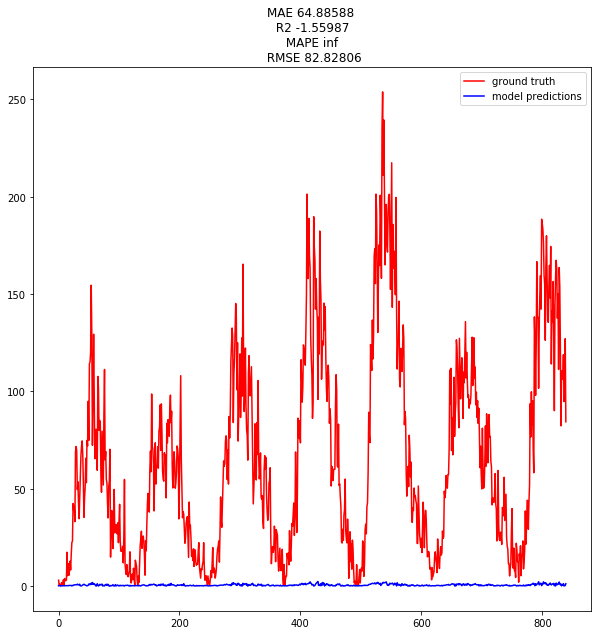

MAE 23.5834
R2 0.2865
RMSE 28.6122
[66.153336] 25.106487




Plot, with Optimizer.
(840,) (840,)


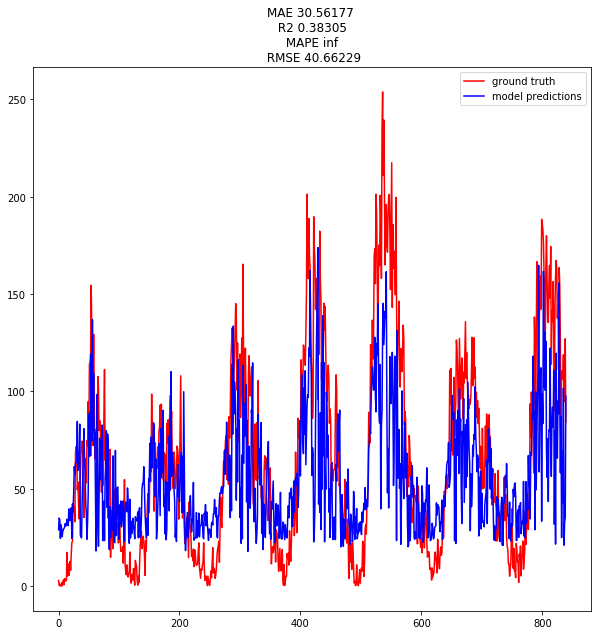

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adadelta', 'lr': 0.0016}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/100
1959/1959 [==============================] - 6s 3ms/step - loss: 43.3736 - mean_absolute_error: 43.8571 - rmse: 43.8571 - val_loss: 62.2212 - val_mean_absolute_error: 62.7157 - val_rmse: 62.7157
Epoch 2/100
1959/1959 [==============================] - 1s 351us/step - loss: 42.0589 - mean_absolute_error: 42.5438 - rmse: 42.5438 - val_loss: 59.9231 - val_mean_absolute_error: 60.4177 - val_rmse: 60.4177
Epoch 3/100
1959/1959 [==============================] - 1s 341us/step - loss: 39.8842 - mean_absolute_error: 40.3714 - rmse: 40.3714 - val_loss: 55.4926 - val_mean_absolute_error: 55.9877 - val_rmse: 55.9877
Epoch 4/100
1959/1959 [==============================] - 1s 340us/step - loss: 34.6715 - mean_absolute_error: 35.1586 - rmse: 35.1586 - val_loss: 42.1747 - val_mean_absolute_error: 42.6707 - val_rmse: 42.6707
Epoch 5/100


1959/1959 [==============================] - 1s 419us/step - loss: 10.4914 - mean_absolute_error: 10.9757 - rmse: 10.9757 - val_loss: 13.4941 - val_mean_absolute_error: 13.9844 - val_rmse: 13.9844
Epoch 79/100
1959/1959 [==============================] - 1s 399us/step - loss: 10.4798 - mean_absolute_error: 10.9661 - rmse: 10.9661 - val_loss: 13.4838 - val_mean_absolute_error: 13.9741 - val_rmse: 13.9741
Epoch 80/100
1959/1959 [==============================] - 1s 399us/step - loss: 10.4718 - mean_absolute_error: 10.9573 - rmse: 10.9573 - val_loss: 13.5027 - val_mean_absolute_error: 13.9938 - val_rmse: 13.9938
Epoch 81/100
1959/1959 [==============================] - 1s 409us/step - loss: 10.4655 - mean_absolute_error: 10.9507 - rmse: 10.9507 - val_loss: 13.4542 - val_mean_absolute_error: 13.9450 - val_rmse: 13.9450
Epoch 82/100
1959/1959 [==============================] - 1s 394us/step - loss: 10.4577 - mean_absolute_error: 10.9426 - rmse: 10.9426 - val_loss: 13.4203 - val_mean_absolut

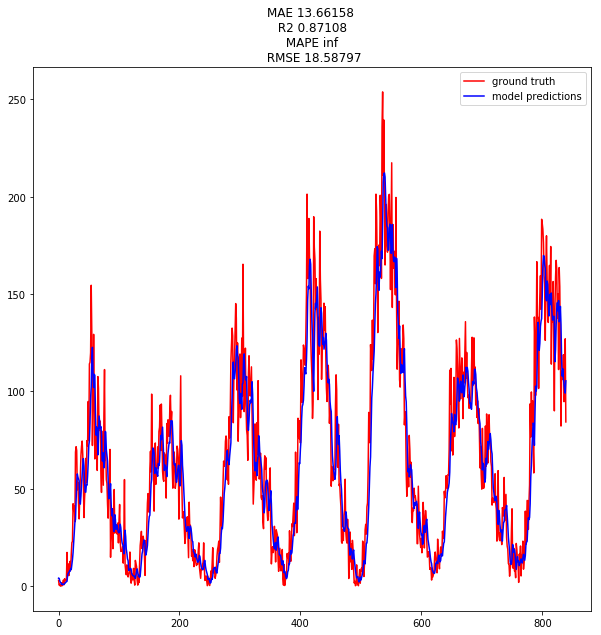

MAE 10.5110
R2 0.8170
RMSE 14.4904
[1.0022571] 1.6245117




Plot, with Optimizer.
(840,) (840,)


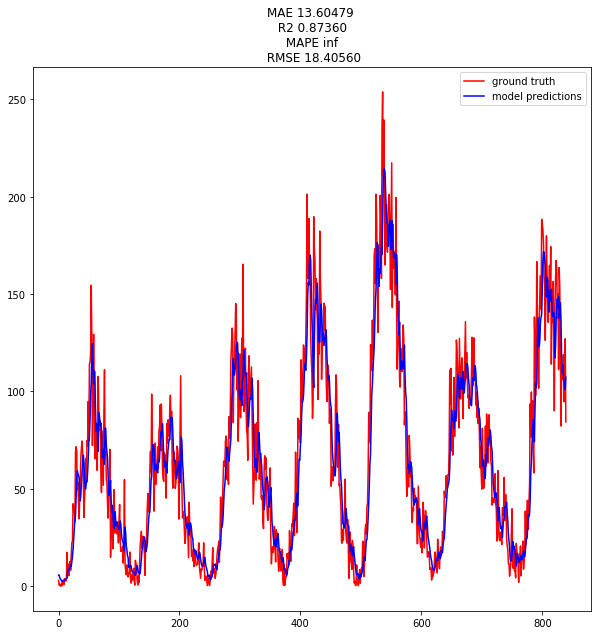

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adadelta', 'lr': 6.4e-05}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 7s 4ms/step - loss: 44.7277 - mean_absolute_error: 45.2092 - rmse: 45.2092 - val_loss: 65.0581 - val_mean_absolute_error: 65.5541 - val_rmse: 65.5541
Epoch 2/400
1959/1959 [==============================] - 1s 386us/step - loss: 44.7171 - mean_absolute_error: 45.1986 - rmse: 45.1986 - val_loss: 65.0422 - val_mean_absolute_error: 65.5381 - val_rmse: 65.5381
Epoch 3/400
1959/1959 [==============================] - 1s 382us/step - loss: 44.7058 - mean_absolute_error: 45.1873 - rmse: 45.1873 - val_loss: 65.0255 - val_mean_absolute_error: 65.5214 - val_rmse: 65.5214
Epoch 4/400
1959/1959 [==============================] - 1s 377us/step - loss: 44.6939 - mean_absolute_error: 45.1754 - rmse: 45.1754 - val_loss: 65.0079 - val_mean_absolute_error: 65.5039 - val_rmse: 65.5039
Epoch 5/400

1959/1959 [==============================] - 1s 337us/step - loss: 12.3591 - mean_absolute_error: 12.8437 - rmse: 12.8437 - val_loss: 17.0739 - val_mean_absolute_error: 17.5671 - val_rmse: 17.5671
Epoch 79/400
1959/1959 [==============================] - 1s 342us/step - loss: 12.3579 - mean_absolute_error: 12.8424 - rmse: 12.8424 - val_loss: 17.0721 - val_mean_absolute_error: 17.5652 - val_rmse: 17.5652
Epoch 80/400
1959/1959 [==============================] - 1s 344us/step - loss: 12.3566 - mean_absolute_error: 12.8412 - rmse: 12.8412 - val_loss: 17.0701 - val_mean_absolute_error: 17.5632 - val_rmse: 17.5632
Epoch 81/400
1959/1959 [==============================] - 1s 340us/step - loss: 12.3554 - mean_absolute_error: 12.8400 - rmse: 12.8400 - val_loss: 17.0681 - val_mean_absolute_error: 17.5613 - val_rmse: 17.5613
Epoch 82/400
1959/1959 [==============================] - 1s 340us/step - loss: 12.3542 - mean_absolute_error: 12.8389 - rmse: 12.8389 - val_loss: 17.0664 - val_mean_absolut

Epoch 117/400
1959/1959 [==============================] - 1s 379us/step - loss: 12.3154 - mean_absolute_error: 12.8000 - rmse: 12.8000 - val_loss: 17.0057 - val_mean_absolute_error: 17.4993 - val_rmse: 17.4993
Epoch 118/400
1959/1959 [==============================] - 1s 377us/step - loss: 12.3139 - mean_absolute_error: 12.7985 - rmse: 12.7985 - val_loss: 17.0037 - val_mean_absolute_error: 17.4973 - val_rmse: 17.4973
Epoch 119/400
1959/1959 [==============================] - 1s 378us/step - loss: 12.3129 - mean_absolute_error: 12.7975 - rmse: 12.7975 - val_loss: 17.0021 - val_mean_absolute_error: 17.4958 - val_rmse: 17.4958
Epoch 120/400
1959/1959 [==============================] - 1s 379us/step - loss: 12.3118 - mean_absolute_error: 12.7963 - rmse: 12.7963 - val_loss: 17.0003 - val_mean_absolute_error: 17.4939 - val_rmse: 17.4939
Epoch 121/400
1959/1959 [==============================] - 1s 378us/step - loss: 12.3112 - mean_absolute_error: 12.7958 - rmse: 12.7958 - val_loss: 16.9982 

Epoch 156/400
1959/1959 [==============================] - 1s 328us/step - loss: 12.2714 - mean_absolute_error: 12.7562 - rmse: 12.7562 - val_loss: 16.9362 - val_mean_absolute_error: 17.4304 - val_rmse: 17.4304
Epoch 157/400
1959/1959 [==============================] - 1s 326us/step - loss: 12.2698 - mean_absolute_error: 12.7546 - rmse: 12.7546 - val_loss: 16.9348 - val_mean_absolute_error: 17.4289 - val_rmse: 17.4289
Epoch 158/400
1959/1959 [==============================] - 1s 330us/step - loss: 12.2691 - mean_absolute_error: 12.7539 - rmse: 12.7539 - val_loss: 16.9333 - val_mean_absolute_error: 17.4275 - val_rmse: 17.4275
Epoch 159/400
1959/1959 [==============================] - 1s 330us/step - loss: 12.2686 - mean_absolute_error: 12.7533 - rmse: 12.7533 - val_loss: 16.9313 - val_mean_absolute_error: 17.4255 - val_rmse: 17.4255
Epoch 160/400
1959/1959 [==============================] - 1s 330us/step - loss: 12.2672 - mean_absolute_error: 12.7519 - rmse: 12.7519 - val_loss: 16.9295 

Epoch 195/400
1959/1959 [==============================] - 1s 338us/step - loss: 12.2287 - mean_absolute_error: 12.7134 - rmse: 12.7134 - val_loss: 16.8685 - val_mean_absolute_error: 17.3626 - val_rmse: 17.3626
Epoch 196/400
1959/1959 [==============================] - 1s 337us/step - loss: 12.2275 - mean_absolute_error: 12.7121 - rmse: 12.7121 - val_loss: 16.8670 - val_mean_absolute_error: 17.3610 - val_rmse: 17.3610
Epoch 197/400
1959/1959 [==============================] - 1s 338us/step - loss: 12.2265 - mean_absolute_error: 12.7111 - rmse: 12.7111 - val_loss: 16.8650 - val_mean_absolute_error: 17.3590 - val_rmse: 17.3590
Epoch 198/400
1959/1959 [==============================] - 1s 337us/step - loss: 12.2258 - mean_absolute_error: 12.7104 - rmse: 12.7104 - val_loss: 16.8633 - val_mean_absolute_error: 17.3573 - val_rmse: 17.3573
Epoch 199/400
1959/1959 [==============================] - 1s 339us/step - loss: 12.2240 - mean_absolute_error: 12.7086 - rmse: 12.7086 - val_loss: 16.8613 

Epoch 234/400
1959/1959 [==============================] - 1s 327us/step - loss: 12.1870 - mean_absolute_error: 12.6717 - rmse: 12.6717 - val_loss: 16.7996 - val_mean_absolute_error: 17.2932 - val_rmse: 17.2932
Epoch 235/400
1959/1959 [==============================] - 1s 326us/step - loss: 12.1864 - mean_absolute_error: 12.6711 - rmse: 12.6711 - val_loss: 16.7978 - val_mean_absolute_error: 17.2914 - val_rmse: 17.2914
Epoch 236/400
1959/1959 [==============================] - 1s 330us/step - loss: 12.1848 - mean_absolute_error: 12.6695 - rmse: 12.6695 - val_loss: 16.7955 - val_mean_absolute_error: 17.2891 - val_rmse: 17.2891
Epoch 237/400
1959/1959 [==============================] - 1s 326us/step - loss: 12.1838 - mean_absolute_error: 12.6685 - rmse: 12.6685 - val_loss: 16.7942 - val_mean_absolute_error: 17.2878 - val_rmse: 17.2878
Epoch 238/400
1959/1959 [==============================] - 1s 333us/step - loss: 12.1825 - mean_absolute_error: 12.6672 - rmse: 12.6672 - val_loss: 16.7926 

Epoch 273/400
1959/1959 [==============================] - 1s 328us/step - loss: 12.1473 - mean_absolute_error: 12.6321 - rmse: 12.6321 - val_loss: 16.7346 - val_mean_absolute_error: 17.2280 - val_rmse: 17.2280
Epoch 274/400
1959/1959 [==============================] - 1s 331us/step - loss: 12.1464 - mean_absolute_error: 12.6312 - rmse: 12.6312 - val_loss: 16.7329 - val_mean_absolute_error: 17.2263 - val_rmse: 17.2263
Epoch 275/400
1959/1959 [==============================] - 1s 330us/step - loss: 12.1453 - mean_absolute_error: 12.6301 - rmse: 12.6301 - val_loss: 16.7311 - val_mean_absolute_error: 17.2244 - val_rmse: 17.2244
Epoch 276/400
1959/1959 [==============================] - 1s 339us/step - loss: 12.1445 - mean_absolute_error: 12.6293 - rmse: 12.6293 - val_loss: 16.7293 - val_mean_absolute_error: 17.2227 - val_rmse: 17.2227
Epoch 277/400
1959/1959 [==============================] - 1s 334us/step - loss: 12.1428 - mean_absolute_error: 12.6277 - rmse: 12.6277 - val_loss: 16.7276 

Epoch 312/400
1959/1959 [==============================] - 1s 343us/step - loss: 12.1063 - mean_absolute_error: 12.5913 - rmse: 12.5913 - val_loss: 16.6673 - val_mean_absolute_error: 17.1603 - val_rmse: 17.1603
Epoch 313/400
1959/1959 [==============================] - 1s 340us/step - loss: 12.1054 - mean_absolute_error: 12.5904 - rmse: 12.5904 - val_loss: 16.6653 - val_mean_absolute_error: 17.1583 - val_rmse: 17.1583
Epoch 314/400
1959/1959 [==============================] - 1s 342us/step - loss: 12.1043 - mean_absolute_error: 12.5893 - rmse: 12.5893 - val_loss: 16.6637 - val_mean_absolute_error: 17.1567 - val_rmse: 17.1567
Epoch 315/400
1959/1959 [==============================] - 1s 337us/step - loss: 12.1031 - mean_absolute_error: 12.5879 - rmse: 12.5879 - val_loss: 16.6625 - val_mean_absolute_error: 17.1555 - val_rmse: 17.1555
Epoch 316/400
1959/1959 [==============================] - 1s 345us/step - loss: 12.1021 - mean_absolute_error: 12.5871 - rmse: 12.5871 - val_loss: 16.6612 

Epoch 351/400
1959/1959 [==============================] - 1s 330us/step - loss: 12.0626 - mean_absolute_error: 12.5477 - rmse: 12.5477 - val_loss: 16.5977 - val_mean_absolute_error: 17.0903 - val_rmse: 17.0903
Epoch 352/400
1959/1959 [==============================] - 1s 329us/step - loss: 12.0612 - mean_absolute_error: 12.5463 - rmse: 12.5463 - val_loss: 16.5958 - val_mean_absolute_error: 17.0884 - val_rmse: 17.0884
Epoch 353/400
1959/1959 [==============================] - 1s 327us/step - loss: 12.0601 - mean_absolute_error: 12.5451 - rmse: 12.5451 - val_loss: 16.5937 - val_mean_absolute_error: 17.0862 - val_rmse: 17.0862
Epoch 354/400
1959/1959 [==============================] - 1s 333us/step - loss: 12.0593 - mean_absolute_error: 12.5444 - rmse: 12.5444 - val_loss: 16.5916 - val_mean_absolute_error: 17.0841 - val_rmse: 17.0841
Epoch 355/400
1959/1959 [==============================] - 1s 347us/step - loss: 12.0580 - mean_absolute_error: 12.5431 - rmse: 12.5431 - val_loss: 16.5897 

Epoch 390/400
1959/1959 [==============================] - 1s 377us/step - loss: 12.0231 - mean_absolute_error: 12.5081 - rmse: 12.5081 - val_loss: 16.5308 - val_mean_absolute_error: 17.0230 - val_rmse: 17.0230
Epoch 391/400
1959/1959 [==============================] - 1s 378us/step - loss: 12.0225 - mean_absolute_error: 12.5075 - rmse: 12.5075 - val_loss: 16.5291 - val_mean_absolute_error: 17.0213 - val_rmse: 17.0213
Epoch 392/400
1959/1959 [==============================] - 1s 389us/step - loss: 12.0215 - mean_absolute_error: 12.5065 - rmse: 12.5065 - val_loss: 16.5278 - val_mean_absolute_error: 17.0200 - val_rmse: 17.0200
Epoch 393/400
1959/1959 [==============================] - 1s 377us/step - loss: 12.0207 - mean_absolute_error: 12.5058 - rmse: 12.5058 - val_loss: 16.5263 - val_mean_absolute_error: 17.0185 - val_rmse: 17.0185
Epoch 394/400
1959/1959 [==============================] - 1s 373us/step - loss: 12.0192 - mean_absolute_error: 12.5041 - rmse: 12.5041 - val_loss: 16.5250 

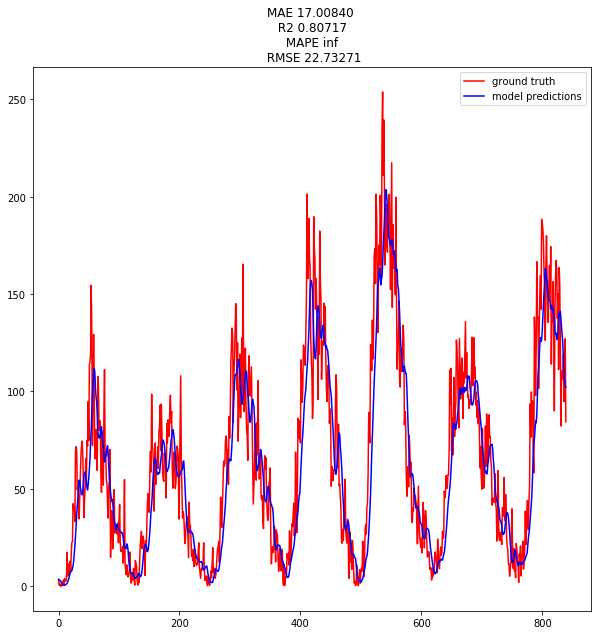

MAE 11.9713
R2 0.7659
RMSE 16.3896
[0.9867647] 3.2707443




Plot, with Optimizer.
(840,) (840,)


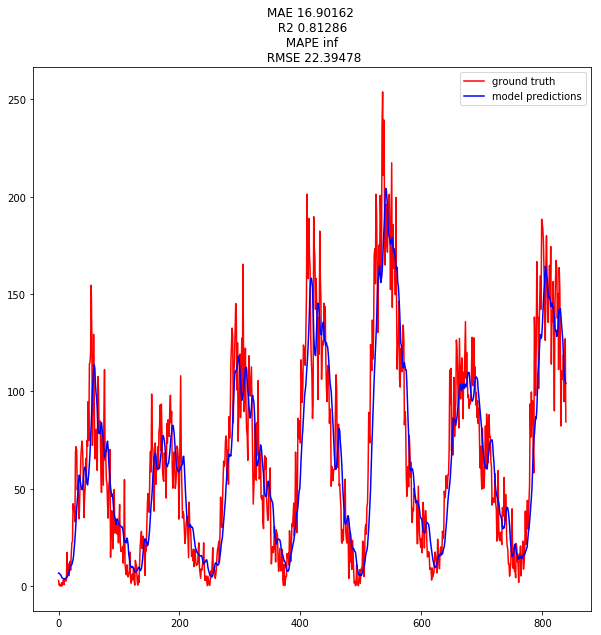

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adadelta', 'lr': 2.56e-06}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/1500
1959/1959 [==============================] - 7s 4ms/step - loss: 43.9620 - mean_absolute_error: 44.4439 - rmse: 44.4439 - val_loss: 63.9453 - val_mean_absolute_error: 64.4407 - val_rmse: 64.4407
Epoch 2/1500
1959/1959 [==============================] - 1s 394us/step - loss: 43.9600 - mean_absolute_error: 44.4420 - rmse: 44.4420 - val_loss: 63.9423 - val_mean_absolute_error: 64.4377 - val_rmse: 64.4377
Epoch 3/1500
1959/1959 [==============================] - 1s 378us/step - loss: 43.9578 - mean_absolute_error: 44.4398 - rmse: 44.4398 - val_loss: 63.9391 - val_mean_absolute_error: 64.4344 - val_rmse: 64.4344
Epoch 4/1500
1959/1959 [==============================] - 1s 374us/step - loss: 43.9553 - mean_absolute_error: 44.4373 - rmse: 44.4373 - val_loss: 63.9357 - val_mean_absolute_error: 64.4311 - val_rmse: 64.4311
Epoch 

Epoch 78/1500
1959/1959 [==============================] - 1s 339us/step - loss: 43.7157 - mean_absolute_error: 44.1982 - rmse: 44.1982 - val_loss: 63.5911 - val_mean_absolute_error: 64.0862 - val_rmse: 64.0862
Epoch 79/1500
1959/1959 [==============================] - 1s 329us/step - loss: 43.7119 - mean_absolute_error: 44.1944 - rmse: 44.1944 - val_loss: 63.5858 - val_mean_absolute_error: 64.0809 - val_rmse: 64.0809
Epoch 80/1500
1959/1959 [==============================] - 1s 327us/step - loss: 43.7083 - mean_absolute_error: 44.1908 - rmse: 44.1908 - val_loss: 63.5804 - val_mean_absolute_error: 64.0755 - val_rmse: 64.0755
Epoch 81/1500
1959/1959 [==============================] - 1s 332us/step - loss: 43.7045 - mean_absolute_error: 44.1870 - rmse: 44.1870 - val_loss: 63.5751 - val_mean_absolute_error: 64.0701 - val_rmse: 64.0701
Epoch 82/1500
1959/1959 [==============================] - 1s 337us/step - loss: 43.7007 - mean_absolute_error: 44.1832 - rmse: 44.1832 - val_loss: 63.5697 

Epoch 117/1500
1959/1959 [==============================] - 1s 351us/step - loss: 43.5661 - mean_absolute_error: 44.0489 - rmse: 44.0489 - val_loss: 63.3768 - val_mean_absolute_error: 63.8717 - val_rmse: 63.8717
Epoch 118/1500
1959/1959 [==============================] - 1s 344us/step - loss: 43.5621 - mean_absolute_error: 44.0449 - rmse: 44.0449 - val_loss: 63.3712 - val_mean_absolute_error: 63.8661 - val_rmse: 63.8661
Epoch 119/1500
1959/1959 [==============================] - 1s 339us/step - loss: 43.5582 - mean_absolute_error: 44.0410 - rmse: 44.0410 - val_loss: 63.3655 - val_mean_absolute_error: 63.8604 - val_rmse: 63.8604
Epoch 120/1500
1959/1959 [==============================] - 1s 346us/step - loss: 43.5542 - mean_absolute_error: 44.0370 - rmse: 44.0370 - val_loss: 63.3599 - val_mean_absolute_error: 63.8548 - val_rmse: 63.8548
Epoch 121/1500
1959/1959 [==============================] - 1s 349us/step - loss: 43.5503 - mean_absolute_error: 44.0331 - rmse: 44.0331 - val_loss: 63.

Epoch 156/1500
1959/1959 [==============================] - 1s 333us/step - loss: 43.4089 - mean_absolute_error: 43.8921 - rmse: 43.8921 - val_loss: 63.1523 - val_mean_absolute_error: 63.6470 - val_rmse: 63.6470
Epoch 157/1500
1959/1959 [==============================] - 1s 332us/step - loss: 43.4050 - mean_absolute_error: 43.8882 - rmse: 43.8882 - val_loss: 63.1464 - val_mean_absolute_error: 63.6411 - val_rmse: 63.6411
Epoch 158/1500
1959/1959 [==============================] - 1s 343us/step - loss: 43.4009 - mean_absolute_error: 43.8841 - rmse: 43.8841 - val_loss: 63.1405 - val_mean_absolute_error: 63.6352 - val_rmse: 63.6352
Epoch 159/1500
1959/1959 [==============================] - 1s 343us/step - loss: 43.3967 - mean_absolute_error: 43.8799 - rmse: 43.8799 - val_loss: 63.1346 - val_mean_absolute_error: 63.6293 - val_rmse: 63.6293
Epoch 160/1500
1959/1959 [==============================] - 1s 332us/step - loss: 43.3925 - mean_absolute_error: 43.8757 - rmse: 43.8757 - val_loss: 63.

Epoch 195/1500
1959/1959 [==============================] - 1s 338us/step - loss: 43.2477 - mean_absolute_error: 43.7313 - rmse: 43.7313 - val_loss: 62.9220 - val_mean_absolute_error: 63.4165 - val_rmse: 63.4165
Epoch 196/1500
1959/1959 [==============================] - 1s 335us/step - loss: 43.2436 - mean_absolute_error: 43.7271 - rmse: 43.7271 - val_loss: 62.9160 - val_mean_absolute_error: 63.4105 - val_rmse: 63.4105
Epoch 197/1500
1959/1959 [==============================] - 1s 333us/step - loss: 43.2393 - mean_absolute_error: 43.7229 - rmse: 43.7229 - val_loss: 62.9101 - val_mean_absolute_error: 63.4046 - val_rmse: 63.4046
Epoch 198/1500
1959/1959 [==============================] - 1s 335us/step - loss: 43.2353 - mean_absolute_error: 43.7189 - rmse: 43.7189 - val_loss: 62.9041 - val_mean_absolute_error: 63.3986 - val_rmse: 63.3986
Epoch 199/1500
1959/1959 [==============================] - 1s 343us/step - loss: 43.2311 - mean_absolute_error: 43.7147 - rmse: 43.7147 - val_loss: 62.

Epoch 234/1500
1959/1959 [==============================] - 1s 333us/step - loss: 43.0823 - mean_absolute_error: 43.5663 - rmse: 43.5662 - val_loss: 62.6857 - val_mean_absolute_error: 63.1800 - val_rmse: 63.1800
Epoch 235/1500
1959/1959 [==============================] - 1s 328us/step - loss: 43.0780 - mean_absolute_error: 43.5620 - rmse: 43.5619 - val_loss: 62.6795 - val_mean_absolute_error: 63.1738 - val_rmse: 63.1738
Epoch 236/1500
1959/1959 [==============================] - 1s 330us/step - loss: 43.0737 - mean_absolute_error: 43.5577 - rmse: 43.5577 - val_loss: 62.6734 - val_mean_absolute_error: 63.1677 - val_rmse: 63.1677
Epoch 237/1500
1959/1959 [==============================] - 1s 338us/step - loss: 43.0694 - mean_absolute_error: 43.5534 - rmse: 43.5534 - val_loss: 62.6673 - val_mean_absolute_error: 63.1616 - val_rmse: 63.1616
Epoch 238/1500
1959/1959 [==============================] - 1s 333us/step - loss: 43.0651 - mean_absolute_error: 43.5492 - rmse: 43.5492 - val_loss: 62.

Epoch 273/1500
1959/1959 [==============================] - 1s 374us/step - loss: 42.9154 - mean_absolute_error: 43.3998 - rmse: 43.3998 - val_loss: 62.4474 - val_mean_absolute_error: 62.9416 - val_rmse: 62.9416
Epoch 274/1500
1959/1959 [==============================] - 1s 383us/step - loss: 42.9111 - mean_absolute_error: 43.3955 - rmse: 43.3955 - val_loss: 62.4412 - val_mean_absolute_error: 62.9354 - val_rmse: 62.9354
Epoch 275/1500
1959/1959 [==============================] - 1s 382us/step - loss: 42.9068 - mean_absolute_error: 43.3911 - rmse: 43.3911 - val_loss: 62.4351 - val_mean_absolute_error: 62.9292 - val_rmse: 62.9292
Epoch 276/1500
1959/1959 [==============================] - 1s 375us/step - loss: 42.9026 - mean_absolute_error: 43.3869 - rmse: 43.3869 - val_loss: 62.4289 - val_mean_absolute_error: 62.9230 - val_rmse: 62.9230
Epoch 277/1500
1959/1959 [==============================] - 1s 375us/step - loss: 42.8981 - mean_absolute_error: 43.3825 - rmse: 43.3825 - val_loss: 62.

Epoch 312/1500
1959/1959 [==============================] - 1s 349us/step - loss: 42.7448 - mean_absolute_error: 43.2295 - rmse: 43.2295 - val_loss: 62.2038 - val_mean_absolute_error: 62.6977 - val_rmse: 62.6977
Epoch 313/1500
1959/1959 [==============================] - 1s 329us/step - loss: 42.7405 - mean_absolute_error: 43.2251 - rmse: 43.2251 - val_loss: 62.1974 - val_mean_absolute_error: 62.6914 - val_rmse: 62.6914
Epoch 314/1500
1959/1959 [==============================] - 1s 327us/step - loss: 42.7360 - mean_absolute_error: 43.2207 - rmse: 43.2207 - val_loss: 62.1911 - val_mean_absolute_error: 62.6850 - val_rmse: 62.6850
Epoch 315/1500
1959/1959 [==============================] - 1s 336us/step - loss: 42.7316 - mean_absolute_error: 43.2163 - rmse: 43.2163 - val_loss: 62.1847 - val_mean_absolute_error: 62.6787 - val_rmse: 62.6787
Epoch 316/1500
1959/1959 [==============================] - 1s 339us/step - loss: 42.7271 - mean_absolute_error: 43.2118 - rmse: 43.2118 - val_loss: 62.

Epoch 351/1500
1959/1959 [==============================] - 1s 339us/step - loss: 42.5714 - mean_absolute_error: 43.0564 - rmse: 43.0564 - val_loss: 61.9562 - val_mean_absolute_error: 62.4500 - val_rmse: 62.4500
Epoch 352/1500
1959/1959 [==============================] - 1s 343us/step - loss: 42.5670 - mean_absolute_error: 43.0519 - rmse: 43.0519 - val_loss: 61.9499 - val_mean_absolute_error: 62.4437 - val_rmse: 62.4437
Epoch 353/1500
1959/1959 [==============================] - 1s 343us/step - loss: 42.5626 - mean_absolute_error: 43.0476 - rmse: 43.0476 - val_loss: 61.9435 - val_mean_absolute_error: 62.4373 - val_rmse: 62.4373
Epoch 354/1500
1959/1959 [==============================] - 1s 346us/step - loss: 42.5581 - mean_absolute_error: 43.0430 - rmse: 43.0430 - val_loss: 61.9371 - val_mean_absolute_error: 62.4309 - val_rmse: 62.4309
Epoch 355/1500
1959/1959 [==============================] - 1s 349us/step - loss: 42.5537 - mean_absolute_error: 43.0387 - rmse: 43.0387 - val_loss: 61.

Epoch 390/1500
1959/1959 [==============================] - 1s 324us/step - loss: 42.3959 - mean_absolute_error: 42.8812 - rmse: 42.8812 - val_loss: 61.7052 - val_mean_absolute_error: 62.1989 - val_rmse: 62.1989
Epoch 391/1500
1959/1959 [==============================] - 1s 342us/step - loss: 42.3914 - mean_absolute_error: 42.8766 - rmse: 42.8766 - val_loss: 61.6986 - val_mean_absolute_error: 62.1923 - val_rmse: 62.1923
Epoch 392/1500
1959/1959 [==============================] - 1s 335us/step - loss: 42.3867 - mean_absolute_error: 42.8720 - rmse: 42.8720 - val_loss: 61.6920 - val_mean_absolute_error: 62.1858 - val_rmse: 62.1858
Epoch 393/1500
1959/1959 [==============================] - 1s 332us/step - loss: 42.3821 - mean_absolute_error: 42.8674 - rmse: 42.8674 - val_loss: 61.6855 - val_mean_absolute_error: 62.1792 - val_rmse: 62.1792
Epoch 394/1500
1959/1959 [==============================] - 1s 331us/step - loss: 42.3775 - mean_absolute_error: 42.8627 - rmse: 42.8627 - val_loss: 61.

Epoch 429/1500
1959/1959 [==============================] - 1s 326us/step - loss: 42.2158 - mean_absolute_error: 42.7013 - rmse: 42.7013 - val_loss: 61.4476 - val_mean_absolute_error: 61.9413 - val_rmse: 61.9413
Epoch 430/1500
1959/1959 [==============================] - 1s 334us/step - loss: 42.2113 - mean_absolute_error: 42.6968 - rmse: 42.6968 - val_loss: 61.4410 - val_mean_absolute_error: 61.9347 - val_rmse: 61.9347
Epoch 431/1500
1959/1959 [==============================] - 1s 339us/step - loss: 42.2066 - mean_absolute_error: 42.6921 - rmse: 42.6921 - val_loss: 61.4344 - val_mean_absolute_error: 61.9282 - val_rmse: 61.9282
Epoch 432/1500
1959/1959 [==============================] - 1s 343us/step - loss: 42.2020 - mean_absolute_error: 42.6876 - rmse: 42.6876 - val_loss: 61.4278 - val_mean_absolute_error: 61.9216 - val_rmse: 61.9216
Epoch 433/1500
1959/1959 [==============================] - 1s 332us/step - loss: 42.1973 - mean_absolute_error: 42.6829 - rmse: 42.6829 - val_loss: 61.

Epoch 468/1500
1959/1959 [==============================] - 1s 332us/step - loss: 42.0339 - mean_absolute_error: 42.5197 - rmse: 42.5197 - val_loss: 61.1872 - val_mean_absolute_error: 61.6810 - val_rmse: 61.6810
Epoch 469/1500
1959/1959 [==============================] - 1s 347us/step - loss: 42.0291 - mean_absolute_error: 42.5149 - rmse: 42.5149 - val_loss: 61.1804 - val_mean_absolute_error: 61.6741 - val_rmse: 61.6741
Epoch 470/1500
1959/1959 [==============================] - 1s 337us/step - loss: 42.0244 - mean_absolute_error: 42.5101 - rmse: 42.5101 - val_loss: 61.1736 - val_mean_absolute_error: 61.6673 - val_rmse: 61.6673
Epoch 471/1500
1959/1959 [==============================] - 1s 339us/step - loss: 42.0196 - mean_absolute_error: 42.5054 - rmse: 42.5054 - val_loss: 61.1667 - val_mean_absolute_error: 61.6604 - val_rmse: 61.6604
Epoch 472/1500
1959/1959 [==============================] - 1s 331us/step - loss: 42.0148 - mean_absolute_error: 42.5006 - rmse: 42.5006 - val_loss: 61.

Epoch 507/1500
1959/1959 [==============================] - 1s 335us/step - loss: 41.8453 - mean_absolute_error: 42.3313 - rmse: 42.3313 - val_loss: 60.9173 - val_mean_absolute_error: 61.4111 - val_rmse: 61.4111
Epoch 508/1500
1959/1959 [==============================] - 1s 336us/step - loss: 41.8406 - mean_absolute_error: 42.3266 - rmse: 42.3266 - val_loss: 60.9104 - val_mean_absolute_error: 61.4042 - val_rmse: 61.4042
Epoch 509/1500
1959/1959 [==============================] - 1s 337us/step - loss: 41.8357 - mean_absolute_error: 42.3216 - rmse: 42.3216 - val_loss: 60.9034 - val_mean_absolute_error: 61.3972 - val_rmse: 61.3972
Epoch 510/1500
1959/1959 [==============================] - 1s 334us/step - loss: 41.8309 - mean_absolute_error: 42.3168 - rmse: 42.3168 - val_loss: 60.8964 - val_mean_absolute_error: 61.3903 - val_rmse: 61.3903
Epoch 511/1500
1959/1959 [==============================] - 1s 343us/step - loss: 41.8259 - mean_absolute_error: 42.3118 - rmse: 42.3118 - val_loss: 60.

Epoch 546/1500
1959/1959 [==============================] - 1s 350us/step - loss: 41.6525 - mean_absolute_error: 42.1386 - rmse: 42.1386 - val_loss: 60.6410 - val_mean_absolute_error: 61.1349 - val_rmse: 61.1349
Epoch 547/1500
1959/1959 [==============================] - 1s 342us/step - loss: 41.6474 - mean_absolute_error: 42.1335 - rmse: 42.1335 - val_loss: 60.6339 - val_mean_absolute_error: 61.1278 - val_rmse: 61.1278
Epoch 548/1500
1959/1959 [==============================] - 1s 345us/step - loss: 41.6426 - mean_absolute_error: 42.1287 - rmse: 42.1287 - val_loss: 60.6267 - val_mean_absolute_error: 61.1206 - val_rmse: 61.1206
Epoch 549/1500
1959/1959 [==============================] - 1s 328us/step - loss: 41.6375 - mean_absolute_error: 42.1236 - rmse: 42.1236 - val_loss: 60.6195 - val_mean_absolute_error: 61.1134 - val_rmse: 61.1134
Epoch 550/1500
1959/1959 [==============================] - 1s 339us/step - loss: 41.6325 - mean_absolute_error: 42.1186 - rmse: 42.1186 - val_loss: 60.

Epoch 585/1500
1959/1959 [==============================] - 1s 330us/step - loss: 41.4553 - mean_absolute_error: 41.9414 - rmse: 41.9414 - val_loss: 60.3586 - val_mean_absolute_error: 60.8526 - val_rmse: 60.8526
Epoch 586/1500
1959/1959 [==============================] - 1s 338us/step - loss: 41.4502 - mean_absolute_error: 41.9364 - rmse: 41.9364 - val_loss: 60.3512 - val_mean_absolute_error: 60.8452 - val_rmse: 60.8452
Epoch 587/1500
1959/1959 [==============================] - 1s 337us/step - loss: 41.4450 - mean_absolute_error: 41.9312 - rmse: 41.9312 - val_loss: 60.3438 - val_mean_absolute_error: 60.8378 - val_rmse: 60.8378
Epoch 588/1500
1959/1959 [==============================] - 1s 336us/step - loss: 41.4399 - mean_absolute_error: 41.9260 - rmse: 41.9260 - val_loss: 60.3364 - val_mean_absolute_error: 60.8304 - val_rmse: 60.8304
Epoch 589/1500
1959/1959 [==============================] - 1s 344us/step - loss: 41.4348 - mean_absolute_error: 41.9209 - rmse: 41.9209 - val_loss: 60.

Epoch 624/1500
1959/1959 [==============================] - 1s 377us/step - loss: 41.2527 - mean_absolute_error: 41.7390 - rmse: 41.7390 - val_loss: 60.0680 - val_mean_absolute_error: 60.5621 - val_rmse: 60.5621
Epoch 625/1500
1959/1959 [==============================] - 1s 378us/step - loss: 41.2474 - mean_absolute_error: 41.7338 - rmse: 41.7338 - val_loss: 60.0606 - val_mean_absolute_error: 60.5547 - val_rmse: 60.5547
Epoch 626/1500
1959/1959 [==============================] - 1s 390us/step - loss: 41.2423 - mean_absolute_error: 41.7286 - rmse: 41.7286 - val_loss: 60.0531 - val_mean_absolute_error: 60.5472 - val_rmse: 60.5472
Epoch 627/1500
1959/1959 [==============================] - 1s 390us/step - loss: 41.2370 - mean_absolute_error: 41.7233 - rmse: 41.7233 - val_loss: 60.0456 - val_mean_absolute_error: 60.5397 - val_rmse: 60.5397
Epoch 628/1500
1959/1959 [==============================] - 1s 382us/step - loss: 41.2318 - mean_absolute_error: 41.7182 - rmse: 41.7182 - val_loss: 60.

Epoch 663/1500
1959/1959 [==============================] - 1s 379us/step - loss: 41.0460 - mean_absolute_error: 41.5326 - rmse: 41.5326 - val_loss: 59.7717 - val_mean_absolute_error: 60.2659 - val_rmse: 60.2659
Epoch 664/1500
1959/1959 [==============================] - 1s 385us/step - loss: 41.0406 - mean_absolute_error: 41.5272 - rmse: 41.5272 - val_loss: 59.7641 - val_mean_absolute_error: 60.2582 - val_rmse: 60.2582
Epoch 665/1500
1959/1959 [==============================] - 1s 381us/step - loss: 41.0353 - mean_absolute_error: 41.5219 - rmse: 41.5219 - val_loss: 59.7564 - val_mean_absolute_error: 60.2505 - val_rmse: 60.2505
Epoch 666/1500
1959/1959 [==============================] - 1s 389us/step - loss: 41.0300 - mean_absolute_error: 41.5166 - rmse: 41.5166 - val_loss: 59.7486 - val_mean_absolute_error: 60.2427 - val_rmse: 60.2427
Epoch 667/1500
1959/1959 [==============================] - 1s 383us/step - loss: 41.0245 - mean_absolute_error: 41.5111 - rmse: 41.5111 - val_loss: 59.

Epoch 702/1500
1959/1959 [==============================] - 1s 349us/step - loss: 40.8341 - mean_absolute_error: 41.3210 - rmse: 41.3210 - val_loss: 59.4674 - val_mean_absolute_error: 59.9618 - val_rmse: 59.9618
Epoch 703/1500
1959/1959 [==============================] - 1s 345us/step - loss: 40.8284 - mean_absolute_error: 41.3153 - rmse: 41.3153 - val_loss: 59.4596 - val_mean_absolute_error: 59.9540 - val_rmse: 59.9540
Epoch 704/1500
1959/1959 [==============================] - 1s 342us/step - loss: 40.8232 - mean_absolute_error: 41.3101 - rmse: 41.3101 - val_loss: 59.4518 - val_mean_absolute_error: 59.9462 - val_rmse: 59.9462
Epoch 705/1500
1959/1959 [==============================] - 1s 344us/step - loss: 40.8177 - mean_absolute_error: 41.3046 - rmse: 41.3046 - val_loss: 59.4440 - val_mean_absolute_error: 59.9384 - val_rmse: 59.9384
Epoch 706/1500
1959/1959 [==============================] - 1s 339us/step - loss: 40.8122 - mean_absolute_error: 41.2991 - rmse: 41.2991 - val_loss: 59.

Epoch 741/1500
1959/1959 [==============================] - 1s 334us/step - loss: 40.6180 - mean_absolute_error: 41.1052 - rmse: 41.1052 - val_loss: 59.1574 - val_mean_absolute_error: 59.6520 - val_rmse: 59.6520
Epoch 742/1500
1959/1959 [==============================] - 1s 330us/step - loss: 40.6125 - mean_absolute_error: 41.0997 - rmse: 41.0997 - val_loss: 59.1494 - val_mean_absolute_error: 59.6440 - val_rmse: 59.6440
Epoch 743/1500
1959/1959 [==============================] - 1s 329us/step - loss: 40.6069 - mean_absolute_error: 41.0942 - rmse: 41.0942 - val_loss: 59.1413 - val_mean_absolute_error: 59.6359 - val_rmse: 59.6359
Epoch 744/1500
1959/1959 [==============================] - 1s 329us/step - loss: 40.6013 - mean_absolute_error: 41.0885 - rmse: 41.0885 - val_loss: 59.1332 - val_mean_absolute_error: 59.6278 - val_rmse: 59.6278
Epoch 745/1500
1959/1959 [==============================] - 1s 331us/step - loss: 40.5956 - mean_absolute_error: 41.0828 - rmse: 41.0828 - val_loss: 59.

Epoch 780/1500
1959/1959 [==============================] - 1s 348us/step - loss: 40.3959 - mean_absolute_error: 40.8835 - rmse: 40.8835 - val_loss: 58.8380 - val_mean_absolute_error: 59.3328 - val_rmse: 59.3328
Epoch 781/1500
1959/1959 [==============================] - 1s 342us/step - loss: 40.3902 - mean_absolute_error: 40.8778 - rmse: 40.8778 - val_loss: 58.8297 - val_mean_absolute_error: 59.3245 - val_rmse: 59.3245
Epoch 782/1500
1959/1959 [==============================] - 1s 343us/step - loss: 40.3842 - mean_absolute_error: 40.8718 - rmse: 40.8718 - val_loss: 58.8215 - val_mean_absolute_error: 59.3163 - val_rmse: 59.3163
Epoch 783/1500
1959/1959 [==============================] - 1s 344us/step - loss: 40.3785 - mean_absolute_error: 40.8662 - rmse: 40.8662 - val_loss: 58.8132 - val_mean_absolute_error: 59.3081 - val_rmse: 59.3081
Epoch 784/1500
1959/1959 [==============================] - 1s 335us/step - loss: 40.3729 - mean_absolute_error: 40.8605 - rmse: 40.8605 - val_loss: 58.

Epoch 819/1500
1959/1959 [==============================] - 1s 341us/step - loss: 40.1684 - mean_absolute_error: 40.6563 - rmse: 40.6563 - val_loss: 58.5110 - val_mean_absolute_error: 59.0060 - val_rmse: 59.0060
Epoch 820/1500
1959/1959 [==============================] - 1s 346us/step - loss: 40.1625 - mean_absolute_error: 40.6505 - rmse: 40.6505 - val_loss: 58.5024 - val_mean_absolute_error: 58.9974 - val_rmse: 58.9974
Epoch 821/1500
1959/1959 [==============================] - 1s 348us/step - loss: 40.1565 - mean_absolute_error: 40.6445 - rmse: 40.6445 - val_loss: 58.4939 - val_mean_absolute_error: 58.9889 - val_rmse: 58.9889
Epoch 822/1500
1959/1959 [==============================] - 1s 376us/step - loss: 40.1505 - mean_absolute_error: 40.6385 - rmse: 40.6385 - val_loss: 58.4854 - val_mean_absolute_error: 58.9804 - val_rmse: 58.9804
Epoch 823/1500
1959/1959 [==============================] - 1s 383us/step - loss: 40.1446 - mean_absolute_error: 40.6325 - rmse: 40.6325 - val_loss: 58.

Epoch 858/1500
1959/1959 [==============================] - 1s 386us/step - loss: 39.9340 - mean_absolute_error: 40.4222 - rmse: 40.4222 - val_loss: 58.1740 - val_mean_absolute_error: 58.6691 - val_rmse: 58.6691
Epoch 859/1500
1959/1959 [==============================] - 1s 385us/step - loss: 39.9278 - mean_absolute_error: 40.4160 - rmse: 40.4160 - val_loss: 58.1652 - val_mean_absolute_error: 58.6603 - val_rmse: 58.6603
Epoch 860/1500
1959/1959 [==============================] - 1s 378us/step - loss: 39.9219 - mean_absolute_error: 40.4101 - rmse: 40.4101 - val_loss: 58.1565 - val_mean_absolute_error: 58.6516 - val_rmse: 58.6516
Epoch 861/1500
1959/1959 [==============================] - 1s 386us/step - loss: 39.9157 - mean_absolute_error: 40.4039 - rmse: 40.4039 - val_loss: 58.1477 - val_mean_absolute_error: 58.6429 - val_rmse: 58.6429
Epoch 862/1500
1959/1959 [==============================] - 1s 379us/step - loss: 39.9097 - mean_absolute_error: 40.3979 - rmse: 40.3979 - val_loss: 58.

Epoch 897/1500
1959/1959 [==============================] - 1s 346us/step - loss: 39.6938 - mean_absolute_error: 40.1821 - rmse: 40.1821 - val_loss: 57.8287 - val_mean_absolute_error: 58.3238 - val_rmse: 58.3238
Epoch 898/1500
1959/1959 [==============================] - 1s 352us/step - loss: 39.6876 - mean_absolute_error: 40.1759 - rmse: 40.1759 - val_loss: 57.8197 - val_mean_absolute_error: 58.3149 - val_rmse: 58.3149
Epoch 899/1500
1959/1959 [==============================] - 1s 346us/step - loss: 39.6814 - mean_absolute_error: 40.1697 - rmse: 40.1697 - val_loss: 57.8107 - val_mean_absolute_error: 58.3059 - val_rmse: 58.3059
Epoch 900/1500
1959/1959 [==============================] - 1s 347us/step - loss: 39.6751 - mean_absolute_error: 40.1635 - rmse: 40.1635 - val_loss: 57.8018 - val_mean_absolute_error: 58.2969 - val_rmse: 58.2969
Epoch 901/1500
1959/1959 [==============================] - 1s 336us/step - loss: 39.6689 - mean_absolute_error: 40.1573 - rmse: 40.1573 - val_loss: 57.

Epoch 936/1500
1959/1959 [==============================] - 1s 338us/step - loss: 39.4488 - mean_absolute_error: 39.9372 - rmse: 39.9372 - val_loss: 57.4757 - val_mean_absolute_error: 57.9708 - val_rmse: 57.9708
Epoch 937/1500
1959/1959 [==============================] - 1s 333us/step - loss: 39.4424 - mean_absolute_error: 39.9309 - rmse: 39.9309 - val_loss: 57.4666 - val_mean_absolute_error: 57.9617 - val_rmse: 57.9617
Epoch 938/1500
1959/1959 [==============================] - 1s 336us/step - loss: 39.4360 - mean_absolute_error: 39.9245 - rmse: 39.9245 - val_loss: 57.4575 - val_mean_absolute_error: 57.9526 - val_rmse: 57.9526
Epoch 939/1500
1959/1959 [==============================] - 1s 329us/step - loss: 39.4296 - mean_absolute_error: 39.9181 - rmse: 39.9181 - val_loss: 57.4483 - val_mean_absolute_error: 57.9434 - val_rmse: 57.9434
Epoch 940/1500
1959/1959 [==============================] - 1s 335us/step - loss: 39.4232 - mean_absolute_error: 39.9118 - rmse: 39.9118 - val_loss: 57.

Epoch 975/1500
1959/1959 [==============================] - 1s 333us/step - loss: 39.1958 - mean_absolute_error: 39.6843 - rmse: 39.6843 - val_loss: 57.1120 - val_mean_absolute_error: 57.6069 - val_rmse: 57.6069
Epoch 976/1500
1959/1959 [==============================] - 1s 335us/step - loss: 39.1892 - mean_absolute_error: 39.6777 - rmse: 39.6777 - val_loss: 57.1025 - val_mean_absolute_error: 57.5974 - val_rmse: 57.5974
Epoch 977/1500
1959/1959 [==============================] - 1s 334us/step - loss: 39.1826 - mean_absolute_error: 39.6711 - rmse: 39.6711 - val_loss: 57.0929 - val_mean_absolute_error: 57.5878 - val_rmse: 57.5878
Epoch 978/1500
1959/1959 [==============================] - 1s 336us/step - loss: 39.1760 - mean_absolute_error: 39.6645 - rmse: 39.6645 - val_loss: 57.0835 - val_mean_absolute_error: 57.5784 - val_rmse: 57.5784
Epoch 979/1500
1959/1959 [==============================] - 1s 328us/step - loss: 39.1694 - mean_absolute_error: 39.6579 - rmse: 39.6579 - val_loss: 57.

1959/1959 [==============================] - 1s 392us/step - loss: 38.6844 - mean_absolute_error: 39.1729 - rmse: 39.1729 - val_loss: 56.3761 - val_mean_absolute_error: 56.8714 - val_rmse: 56.8714
Epoch 1052/1500
1959/1959 [==============================] - 1s 383us/step - loss: 38.6777 - mean_absolute_error: 39.1662 - rmse: 39.1662 - val_loss: 56.3663 - val_mean_absolute_error: 56.8615 - val_rmse: 56.8615
Epoch 1053/1500
1959/1959 [==============================] - 1s 386us/step - loss: 38.6707 - mean_absolute_error: 39.1592 - rmse: 39.1592 - val_loss: 56.3565 - val_mean_absolute_error: 56.8517 - val_rmse: 56.8517
Epoch 1054/1500
1959/1959 [==============================] - 1s 380us/step - loss: 38.6638 - mean_absolute_error: 39.1524 - rmse: 39.1524 - val_loss: 56.3465 - val_mean_absolute_error: 56.8417 - val_rmse: 56.8417
Epoch 1055/1500
1959/1959 [==============================] - 1s 379us/step - loss: 38.6570 - mean_absolute_error: 39.1455 - rmse: 39.1455 - val_loss: 56.3366 - val_

1959/1959 [==============================] - 1s 330us/step - loss: 38.1530 - mean_absolute_error: 38.6422 - rmse: 38.6422 - val_loss: 55.6113 - val_mean_absolute_error: 56.1065 - val_rmse: 56.1065
Epoch 1128/1500
1959/1959 [==============================] - 1s 337us/step - loss: 38.1460 - mean_absolute_error: 38.6351 - rmse: 38.6351 - val_loss: 55.6011 - val_mean_absolute_error: 56.0963 - val_rmse: 56.0963
Epoch 1129/1500
1959/1959 [==============================] - 1s 360us/step - loss: 38.1389 - mean_absolute_error: 38.6281 - rmse: 38.6281 - val_loss: 55.5910 - val_mean_absolute_error: 56.0861 - val_rmse: 56.0861
Epoch 1130/1500
1959/1959 [==============================] - 1s 355us/step - loss: 38.1318 - mean_absolute_error: 38.6210 - rmse: 38.6210 - val_loss: 55.5808 - val_mean_absolute_error: 56.0760 - val_rmse: 56.0760
Epoch 1131/1500
1959/1959 [==============================] - 1s 356us/step - loss: 38.1249 - mean_absolute_error: 38.6140 - rmse: 38.6140 - val_loss: 55.5707 - val_

1959/1959 [==============================] - 1s 332us/step - loss: 37.6023 - mean_absolute_error: 38.0914 - rmse: 38.0914 - val_loss: 54.8185 - val_mean_absolute_error: 55.3138 - val_rmse: 55.3138
Epoch 1204/1500
1959/1959 [==============================] - 1s 348us/step - loss: 37.5950 - mean_absolute_error: 38.0841 - rmse: 38.0841 - val_loss: 54.8079 - val_mean_absolute_error: 55.3032 - val_rmse: 55.3032
Epoch 1205/1500
1959/1959 [==============================] - 1s 348us/step - loss: 37.5877 - mean_absolute_error: 38.0768 - rmse: 38.0768 - val_loss: 54.7973 - val_mean_absolute_error: 55.2926 - val_rmse: 55.2926
Epoch 1206/1500
1959/1959 [==============================] - 1s 354us/step - loss: 37.5804 - mean_absolute_error: 38.0695 - rmse: 38.0695 - val_loss: 54.7867 - val_mean_absolute_error: 55.2820 - val_rmse: 55.2820
Epoch 1207/1500
1959/1959 [==============================] - 1s 345us/step - loss: 37.5729 - mean_absolute_error: 38.0620 - rmse: 38.0620 - val_loss: 54.7761 - val_

1959/1959 [==============================] - 1s 345us/step - loss: 37.0320 - mean_absolute_error: 37.5205 - rmse: 37.5205 - val_loss: 53.9962 - val_mean_absolute_error: 54.4915 - val_rmse: 54.4915
Epoch 1280/1500
1959/1959 [==============================] - 1s 350us/step - loss: 37.0240 - mean_absolute_error: 37.5124 - rmse: 37.5124 - val_loss: 53.9852 - val_mean_absolute_error: 54.4805 - val_rmse: 54.4805
Epoch 1281/1500
1959/1959 [==============================] - 1s 343us/step - loss: 37.0165 - mean_absolute_error: 37.5050 - rmse: 37.5050 - val_loss: 53.9742 - val_mean_absolute_error: 54.4695 - val_rmse: 54.4695
Epoch 1282/1500
1959/1959 [==============================] - 1s 346us/step - loss: 37.0089 - mean_absolute_error: 37.4975 - rmse: 37.4975 - val_loss: 53.9633 - val_mean_absolute_error: 54.4586 - val_rmse: 54.4586
Epoch 1283/1500
1959/1959 [==============================] - 1s 339us/step - loss: 37.0012 - mean_absolute_error: 37.4897 - rmse: 37.4897 - val_loss: 53.9522 - val_

1959/1959 [==============================] - 1s 342us/step - loss: 36.4462 - mean_absolute_error: 36.9350 - rmse: 36.9350 - val_loss: 53.1523 - val_mean_absolute_error: 53.6479 - val_rmse: 53.6479
Epoch 1356/1500
1959/1959 [==============================] - 1s 350us/step - loss: 36.4384 - mean_absolute_error: 36.9271 - rmse: 36.9271 - val_loss: 53.1409 - val_mean_absolute_error: 53.6366 - val_rmse: 53.6366
Epoch 1357/1500
1959/1959 [==============================] - 1s 351us/step - loss: 36.4303 - mean_absolute_error: 36.9191 - rmse: 36.9191 - val_loss: 53.1296 - val_mean_absolute_error: 53.6253 - val_rmse: 53.6253
Epoch 1358/1500
1959/1959 [==============================] - 1s 331us/step - loss: 36.4227 - mean_absolute_error: 36.9115 - rmse: 36.9115 - val_loss: 53.1182 - val_mean_absolute_error: 53.6139 - val_rmse: 53.6139
Epoch 1359/1500
1959/1959 [==============================] - 1s 341us/step - loss: 36.4147 - mean_absolute_error: 36.9035 - rmse: 36.9035 - val_loss: 53.1067 - val_

1959/1959 [==============================] - 1s 343us/step - loss: 35.8316 - mean_absolute_error: 36.3204 - rmse: 36.3204 - val_loss: 52.2659 - val_mean_absolute_error: 52.7618 - val_rmse: 52.7618
Epoch 1432/1500
1959/1959 [==============================] - 1s 339us/step - loss: 35.8235 - mean_absolute_error: 36.3122 - rmse: 36.3122 - val_loss: 52.2542 - val_mean_absolute_error: 52.7500 - val_rmse: 52.7500
Epoch 1433/1500
1959/1959 [==============================] - 1s 333us/step - loss: 35.8153 - mean_absolute_error: 36.3041 - rmse: 36.3041 - val_loss: 52.2423 - val_mean_absolute_error: 52.7381 - val_rmse: 52.7381
Epoch 1434/1500
1959/1959 [==============================] - 1s 340us/step - loss: 35.8070 - mean_absolute_error: 36.2958 - rmse: 36.2958 - val_loss: 52.2305 - val_mean_absolute_error: 52.7263 - val_rmse: 52.7263
Epoch 1435/1500
1959/1959 [==============================] - 1s 348us/step - loss: 35.7989 - mean_absolute_error: 36.2878 - rmse: 36.2878 - val_loss: 52.2187 - val_

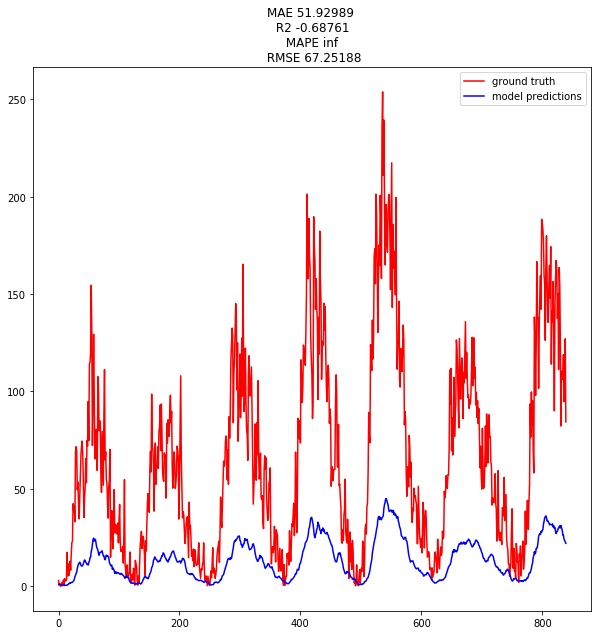

MAE 12.3290
R2 0.7528
RMSE 16.8425
[4.4771943] 2.9858017




Plot, with Optimizer.
(840,) (840,)


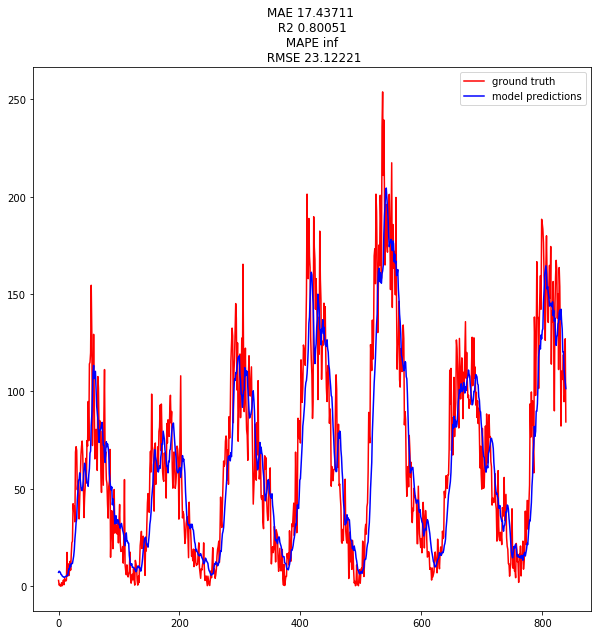

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adadelta', 'lr': 1.024e-07}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/6000
1959/1959 [==============================] - 7s 3ms/step - loss: 44.0438 - mean_absolute_error: 44.5262 - rmse: 44.5262 - val_loss: 64.0744 - val_mean_absolute_error: 64.5692 - val_rmse: 64.5692
Epoch 2/6000
1959/1959 [==============================] - 1s 361us/step - loss: 44.0438 - mean_absolute_error: 44.5262 - rmse: 44.5262 - val_loss: 64.0744 - val_mean_absolute_error: 64.5692 - val_rmse: 64.5692
Epoch 3/6000
1959/1959 [==============================] - 1s 353us/step - loss: 44.0438 - mean_absolute_error: 44.5262 - rmse: 44.5262 - val_loss: 64.0744 - val_mean_absolute_error: 64.5692 - val_rmse: 64.5692
Epoch 4/6000
1959/1959 [==============================] - 1s 333us/step - loss: 44.0438 - mean_absolute_error: 44.5262 - rmse: 44.5262 - val_loss: 64.0744 - val_mean_absolute_error: 64.5692 - val_rmse: 64.5692
Epoch

Epoch 78/6000
1959/1959 [==============================] - 1s 393us/step - loss: 44.0427 - mean_absolute_error: 44.5251 - rmse: 44.5251 - val_loss: 64.0728 - val_mean_absolute_error: 64.5676 - val_rmse: 64.5676
Epoch 79/6000
1959/1959 [==============================] - 1s 391us/step - loss: 44.0426 - mean_absolute_error: 44.5250 - rmse: 44.5250 - val_loss: 64.0728 - val_mean_absolute_error: 64.5675 - val_rmse: 64.5675
Epoch 80/6000
1959/1959 [==============================] - 1s 434us/step - loss: 44.0426 - mean_absolute_error: 44.5251 - rmse: 44.5251 - val_loss: 64.0727 - val_mean_absolute_error: 64.5675 - val_rmse: 64.5675
Epoch 81/6000
1959/1959 [==============================] - 1s 422us/step - loss: 44.0426 - mean_absolute_error: 44.5250 - rmse: 44.5250 - val_loss: 64.0727 - val_mean_absolute_error: 64.5675 - val_rmse: 64.5675
Plot, without Optimizer.


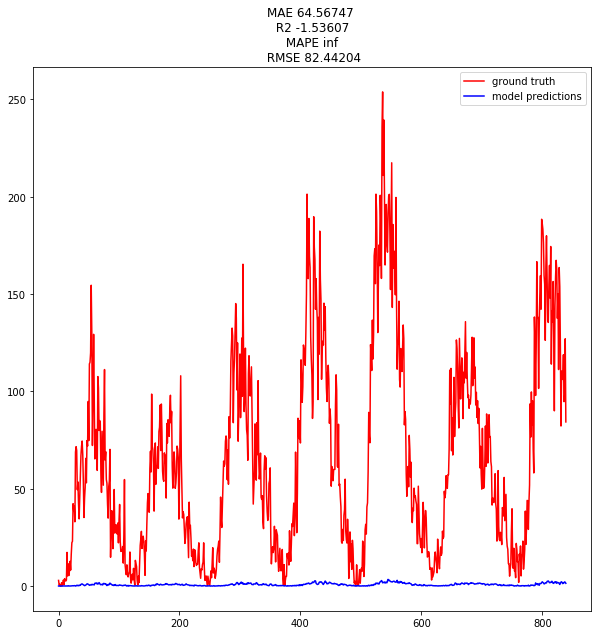

MAE 17.6474
R2 0.5411
RMSE 22.9450
[60.299335] 13.785072




Plot, with Optimizer.
(840,) (840,)


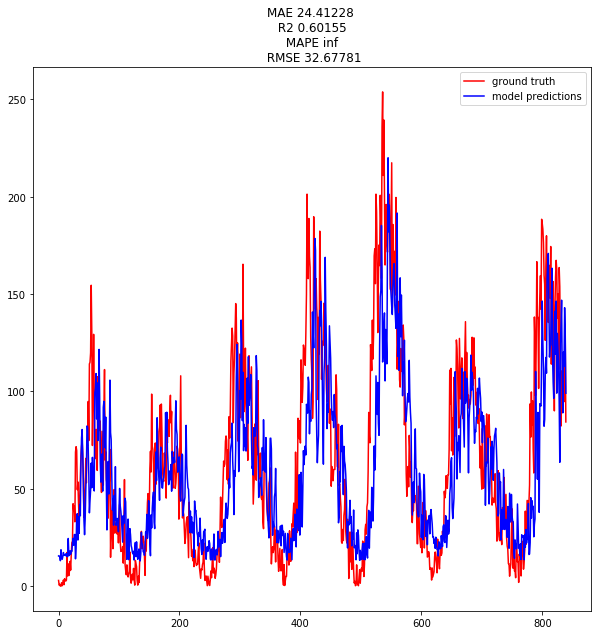

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adam', 'lr': 0.0016}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/100
1959/1959 [==============================] - 8s 4ms/step - loss: 14.1369 - mean_absolute_error: 14.6250 - rmse: 14.6250 - val_loss: 13.6378 - val_mean_absolute_error: 14.1254 - val_rmse: 14.1254
Epoch 2/100
1959/1959 [==============================] - 1s 401us/step - loss: 11.4516 - mean_absolute_error: 11.9363 - rmse: 11.9363 - val_loss: 20.1231 - val_mean_absolute_error: 20.6142 - val_rmse: 20.6142
Epoch 3/100
1959/1959 [==============================] - 1s 390us/step - loss: 10.5709 - mean_absolute_error: 11.0544 - rmse: 11.0544 - val_loss: 13.2583 - val_mean_absolute_error: 13.7477 - val_rmse: 13.7477
Epoch 4/100
1959/1959 [==============================] - 1s 393us/step - loss: 10.9726 - mean_absolute_error: 11.4578 - rmse: 11.4578 - val_loss: 12.7232 - val_mean_absolute_error: 13.2127 - val_rmse: 13.2127
Epoch 5/100
1959

1959/1959 [==============================] - 1s 346us/step - loss: 9.3072 - mean_absolute_error: 9.7804 - rmse: 9.7804 - val_loss: 14.4588 - val_mean_absolute_error: 14.9491 - val_rmse: 14.9491
Epoch 79/100
1959/1959 [==============================] - 1s 343us/step - loss: 9.1465 - mean_absolute_error: 9.6185 - rmse: 9.6185 - val_loss: 13.1485 - val_mean_absolute_error: 13.6377 - val_rmse: 13.6377
Epoch 80/100
1959/1959 [==============================] - 1s 341us/step - loss: 8.9398 - mean_absolute_error: 9.4106 - rmse: 9.4106 - val_loss: 12.9624 - val_mean_absolute_error: 13.4543 - val_rmse: 13.4543
Epoch 81/100
1959/1959 [==============================] - 1s 343us/step - loss: 8.8919 - mean_absolute_error: 9.3603 - rmse: 9.3603 - val_loss: 13.2504 - val_mean_absolute_error: 13.7431 - val_rmse: 13.7431
Epoch 82/100
1959/1959 [==============================] - 1s 334us/step - loss: 9.0993 - mean_absolute_error: 9.5692 - rmse: 9.5692 - val_loss: 12.8795 - val_mean_absolute_error: 13.368

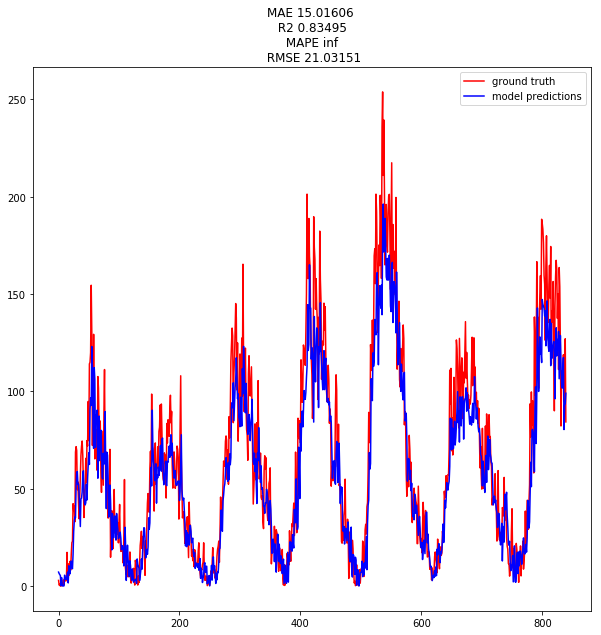

MAE 7.7419
R2 0.8789
RMSE 11.7881
[1.126627] -0.20703506




Plot, with Optimizer.
(840,) (840,)


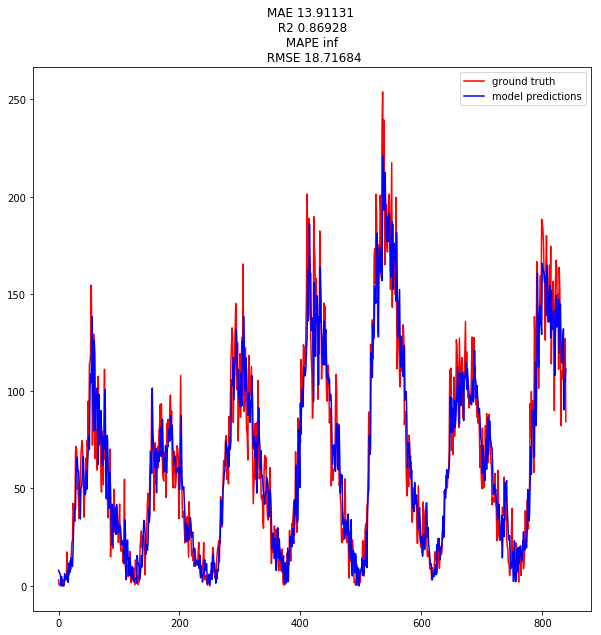

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adam', 'lr': 6.4e-05}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 7s 4ms/step - loss: 23.0090 - mean_absolute_error: 23.4965 - rmse: 23.4965 - val_loss: 17.1563 - val_mean_absolute_error: 17.6505 - val_rmse: 17.6505
Epoch 2/400
1959/1959 [==============================] - 1s 360us/step - loss: 11.9120 - mean_absolute_error: 12.3976 - rmse: 12.3976 - val_loss: 15.4821 - val_mean_absolute_error: 15.9728 - val_rmse: 15.9728
Epoch 3/400
1959/1959 [==============================] - 1s 347us/step - loss: 11.2832 - mean_absolute_error: 11.7674 - rmse: 11.7674 - val_loss: 14.4556 - val_mean_absolute_error: 14.9480 - val_rmse: 14.9480
Epoch 4/400
1959/1959 [==============================] - 1s 342us/step - loss: 10.9293 - mean_absolute_error: 11.4120 - rmse: 11.4120 - val_loss: 14.4297 - val_mean_absolute_error: 14.9206 - val_rmse: 14.9206
Epoch 5/400
195

1959/1959 [==============================] - 1s 336us/step - loss: 9.4856 - mean_absolute_error: 9.9635 - rmse: 9.9635 - val_loss: 12.4811 - val_mean_absolute_error: 12.9697 - val_rmse: 12.9697
Epoch 79/400
1959/1959 [==============================] - 1s 336us/step - loss: 9.3103 - mean_absolute_error: 9.7864 - rmse: 9.7864 - val_loss: 12.3982 - val_mean_absolute_error: 12.8891 - val_rmse: 12.8891
Epoch 80/400
1959/1959 [==============================] - 1s 330us/step - loss: 9.2621 - mean_absolute_error: 9.7363 - rmse: 9.7363 - val_loss: 12.5922 - val_mean_absolute_error: 13.0817 - val_rmse: 13.0817
Epoch 81/400
1959/1959 [==============================] - 1s 346us/step - loss: 9.4283 - mean_absolute_error: 9.9048 - rmse: 9.9048 - val_loss: 12.4622 - val_mean_absolute_error: 12.9532 - val_rmse: 12.9532
Epoch 82/400
1959/1959 [==============================] - 1s 346us/step - loss: 9.1869 - mean_absolute_error: 9.6630 - rmse: 9.6630 - val_loss: 12.8059 - val_mean_absolute_error: 13.293

1959/1959 [==============================] - 1s 342us/step - loss: 8.0454 - mean_absolute_error: 8.5155 - rmse: 8.5155 - val_loss: 13.3578 - val_mean_absolute_error: 13.8479 - val_rmse: 13.8479
Epoch 157/400
1959/1959 [==============================] - 1s 340us/step - loss: 7.2651 - mean_absolute_error: 7.7304 - rmse: 7.7304 - val_loss: 13.3142 - val_mean_absolute_error: 13.8053 - val_rmse: 13.8053
Epoch 158/400
1959/1959 [==============================] - 1s 349us/step - loss: 7.1588 - mean_absolute_error: 7.6235 - rmse: 7.6235 - val_loss: 13.3219 - val_mean_absolute_error: 13.8123 - val_rmse: 13.8123
Epoch 159/400
1959/1959 [==============================] - 1s 343us/step - loss: 7.1414 - mean_absolute_error: 7.6094 - rmse: 7.6094 - val_loss: 13.7491 - val_mean_absolute_error: 14.2397 - val_rmse: 14.2397
Epoch 160/400
1959/1959 [==============================] - 1s 346us/step - loss: 7.5816 - mean_absolute_error: 8.0515 - rmse: 8.0515 - val_loss: 13.5109 - val_mean_absolute_error: 14

1959/1959 [==============================] - 1s 333us/step - loss: 4.9479 - mean_absolute_error: 5.4028 - rmse: 5.4028 - val_loss: 14.2535 - val_mean_absolute_error: 14.7459 - val_rmse: 14.7459
Epoch 235/400
1959/1959 [==============================] - 1s 336us/step - loss: 4.7692 - mean_absolute_error: 5.2241 - rmse: 5.2241 - val_loss: 14.3666 - val_mean_absolute_error: 14.8571 - val_rmse: 14.8571
Epoch 236/400
1959/1959 [==============================] - 1s 343us/step - loss: 4.6136 - mean_absolute_error: 5.0653 - rmse: 5.0653 - val_loss: 14.8214 - val_mean_absolute_error: 15.3120 - val_rmse: 15.3120
Epoch 237/400
1959/1959 [==============================] - 1s 332us/step - loss: 4.6963 - mean_absolute_error: 5.1493 - rmse: 5.1493 - val_loss: 14.6526 - val_mean_absolute_error: 15.1424 - val_rmse: 15.1424
Epoch 238/400
1959/1959 [==============================] - 1s 344us/step - loss: 4.9456 - mean_absolute_error: 5.3981 - rmse: 5.3981 - val_loss: 14.6388 - val_mean_absolute_error: 15

1959/1959 [==============================] - 1s 337us/step - loss: 3.2775 - mean_absolute_error: 3.7108 - rmse: 3.7108 - val_loss: 14.8938 - val_mean_absolute_error: 15.3860 - val_rmse: 15.3860
Epoch 313/400
1959/1959 [==============================] - 1s 337us/step - loss: 3.1964 - mean_absolute_error: 3.6298 - rmse: 3.6298 - val_loss: 14.8183 - val_mean_absolute_error: 15.3097 - val_rmse: 15.3097
Epoch 314/400
1959/1959 [==============================] - 1s 333us/step - loss: 3.1985 - mean_absolute_error: 3.6359 - rmse: 3.6359 - val_loss: 14.8742 - val_mean_absolute_error: 15.3651 - val_rmse: 15.3651
Epoch 315/400
1959/1959 [==============================] - 1s 340us/step - loss: 3.4582 - mean_absolute_error: 3.8997 - rmse: 3.8997 - val_loss: 15.2308 - val_mean_absolute_error: 15.7230 - val_rmse: 15.7230
Epoch 316/400
1959/1959 [==============================] - 1s 341us/step - loss: 3.7718 - mean_absolute_error: 4.2218 - rmse: 4.2218 - val_loss: 14.8932 - val_mean_absolute_error: 15

1959/1959 [==============================] - 1s 339us/step - loss: 2.6407 - mean_absolute_error: 3.0739 - rmse: 3.0739 - val_loss: 15.0529 - val_mean_absolute_error: 15.5464 - val_rmse: 15.5464
Epoch 391/400
1959/1959 [==============================] - 1s 333us/step - loss: 2.4599 - mean_absolute_error: 2.8886 - rmse: 2.8886 - val_loss: 14.9938 - val_mean_absolute_error: 15.4844 - val_rmse: 15.4844
Epoch 392/400
1959/1959 [==============================] - 1s 330us/step - loss: 2.5165 - mean_absolute_error: 2.9479 - rmse: 2.9479 - val_loss: 15.5135 - val_mean_absolute_error: 16.0057 - val_rmse: 16.0057
Epoch 393/400
1959/1959 [==============================] - 1s 345us/step - loss: 2.5072 - mean_absolute_error: 2.9449 - rmse: 2.9449 - val_loss: 15.5136 - val_mean_absolute_error: 16.0042 - val_rmse: 16.0042
Epoch 394/400
1959/1959 [==============================] - 1s 335us/step - loss: 2.6982 - mean_absolute_error: 3.1342 - rmse: 3.1342 - val_loss: 15.3039 - val_mean_absolute_error: 15

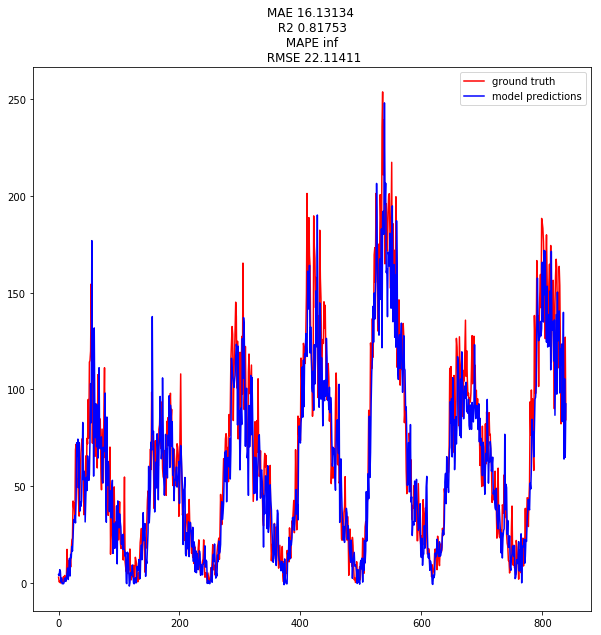

MAE 2.4734
R2 0.9825
RMSE 4.4816
[1.0554746] 0.8028488




Plot, with Optimizer.
(840,) (840,)


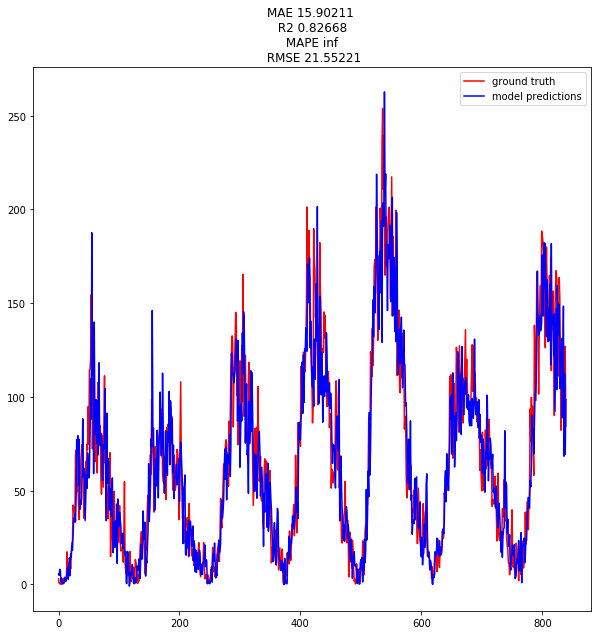

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adam', 'lr': 2.56e-06}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/1500
1959/1959 [==============================] - 8s 4ms/step - loss: 43.8158 - mean_absolute_error: 44.2986 - rmse: 44.2986 - val_loss: 63.0425 - val_mean_absolute_error: 63.5369 - val_rmse: 63.5369
Epoch 2/1500
1959/1959 [==============================] - 1s 362us/step - loss: 42.7904 - mean_absolute_error: 43.2746 - rmse: 43.2746 - val_loss: 61.4458 - val_mean_absolute_error: 61.9407 - val_rmse: 61.9407
Epoch 3/1500
1959/1959 [==============================] - 1s 359us/step - loss: 41.5656 - mean_absolute_error: 42.0510 - rmse: 42.0510 - val_loss: 59.4714 - val_mean_absolute_error: 59.9662 - val_rmse: 59.9662
Epoch 4/1500
1959/1959 [==============================] - 1s 350us/step - loss: 40.0021 - mean_absolute_error: 40.4888 - rmse: 40.4888 - val_loss: 56.8979 - val_mean_absolute_error: 57.3934 - val_rmse: 57.3934
Epoch 5/15

Epoch 78/1500
1959/1959 [==============================] - 1s 355us/step - loss: 10.5502 - mean_absolute_error: 11.0344 - rmse: 11.0344 - val_loss: 13.6390 - val_mean_absolute_error: 14.1300 - val_rmse: 14.1300
Epoch 79/1500
1959/1959 [==============================] - 1s 338us/step - loss: 10.5449 - mean_absolute_error: 11.0291 - rmse: 11.0291 - val_loss: 13.6415 - val_mean_absolute_error: 14.1316 - val_rmse: 14.1316
Epoch 80/1500
1959/1959 [==============================] - 1s 346us/step - loss: 10.5411 - mean_absolute_error: 11.0255 - rmse: 11.0255 - val_loss: 13.5941 - val_mean_absolute_error: 14.0852 - val_rmse: 14.0852
Epoch 81/1500
1959/1959 [==============================] - 1s 334us/step - loss: 10.5277 - mean_absolute_error: 11.0108 - rmse: 11.0108 - val_loss: 13.5734 - val_mean_absolute_error: 14.0645 - val_rmse: 14.0645
Epoch 82/1500
1959/1959 [==============================] - 1s 344us/step - loss: 10.5148 - mean_absolute_error: 10.9985 - rmse: 10.9985 - val_loss: 13.5700 

Epoch 117/1500
1959/1959 [==============================] - 1s 342us/step - loss: 10.2708 - mean_absolute_error: 10.7536 - rmse: 10.7536 - val_loss: 13.0469 - val_mean_absolute_error: 13.5368 - val_rmse: 13.5368
Epoch 118/1500
1959/1959 [==============================] - 1s 333us/step - loss: 10.2694 - mean_absolute_error: 10.7539 - rmse: 10.7539 - val_loss: 13.0817 - val_mean_absolute_error: 13.5708 - val_rmse: 13.5708
Epoch 119/1500
1959/1959 [==============================] - 1s 343us/step - loss: 10.2541 - mean_absolute_error: 10.7384 - rmse: 10.7384 - val_loss: 13.0227 - val_mean_absolute_error: 13.5126 - val_rmse: 13.5126
Epoch 120/1500
1959/1959 [==============================] - 1s 345us/step - loss: 10.2420 - mean_absolute_error: 10.7246 - rmse: 10.7246 - val_loss: 13.0099 - val_mean_absolute_error: 13.4992 - val_rmse: 13.4992
Epoch 121/1500
1959/1959 [==============================] - 1s 339us/step - loss: 10.2424 - mean_absolute_error: 10.7262 - rmse: 10.7262 - val_loss: 12.

Epoch 156/1500
1959/1959 [==============================] - 1s 335us/step - loss: 10.0806 - mean_absolute_error: 10.5633 - rmse: 10.5633 - val_loss: 12.6714 - val_mean_absolute_error: 13.1580 - val_rmse: 13.1580
Epoch 157/1500
1959/1959 [==============================] - 1s 342us/step - loss: 10.0853 - mean_absolute_error: 10.5668 - rmse: 10.5668 - val_loss: 12.6615 - val_mean_absolute_error: 13.1495 - val_rmse: 13.1495
Epoch 158/1500
1959/1959 [==============================] - 1s 350us/step - loss: 10.0758 - mean_absolute_error: 10.5584 - rmse: 10.5584 - val_loss: 12.6646 - val_mean_absolute_error: 13.1533 - val_rmse: 13.1533
Epoch 159/1500
1959/1959 [==============================] - 1s 343us/step - loss: 10.0849 - mean_absolute_error: 10.5677 - rmse: 10.5677 - val_loss: 12.6879 - val_mean_absolute_error: 13.1774 - val_rmse: 13.1774
Epoch 160/1500
1959/1959 [==============================] - 1s 347us/step - loss: 10.0698 - mean_absolute_error: 10.5521 - rmse: 10.5521 - val_loss: 12.

Epoch 195/1500
1959/1959 [==============================] - 1s 342us/step - loss: 9.9502 - mean_absolute_error: 10.4335 - rmse: 10.4335 - val_loss: 12.4456 - val_mean_absolute_error: 12.9299 - val_rmse: 12.9299
Epoch 196/1500
1959/1959 [==============================] - 1s 344us/step - loss: 9.9552 - mean_absolute_error: 10.4385 - rmse: 10.4385 - val_loss: 12.4399 - val_mean_absolute_error: 12.9242 - val_rmse: 12.9242
Epoch 197/1500
1959/1959 [==============================] - 1s 339us/step - loss: 9.9541 - mean_absolute_error: 10.4363 - rmse: 10.4363 - val_loss: 12.4271 - val_mean_absolute_error: 12.9112 - val_rmse: 12.9112
Epoch 198/1500
1959/1959 [==============================] - 1s 341us/step - loss: 9.9433 - mean_absolute_error: 10.4257 - rmse: 10.4257 - val_loss: 12.4203 - val_mean_absolute_error: 12.9065 - val_rmse: 12.9065
Epoch 199/1500
1959/1959 [==============================] - 1s 333us/step - loss: 9.9481 - mean_absolute_error: 10.4312 - rmse: 10.4312 - val_loss: 12.4178 

Epoch 234/1500
1959/1959 [==============================] - 1s 340us/step - loss: 9.8745 - mean_absolute_error: 10.3566 - rmse: 10.3566 - val_loss: 12.3092 - val_mean_absolute_error: 12.7941 - val_rmse: 12.7941
Epoch 235/1500
1959/1959 [==============================] - 1s 335us/step - loss: 9.8628 - mean_absolute_error: 10.3440 - rmse: 10.3440 - val_loss: 12.3038 - val_mean_absolute_error: 12.7894 - val_rmse: 12.7894
Epoch 236/1500
1959/1959 [==============================] - 1s 341us/step - loss: 9.8579 - mean_absolute_error: 10.3401 - rmse: 10.3401 - val_loss: 12.3029 - val_mean_absolute_error: 12.7891 - val_rmse: 12.7891
Epoch 237/1500
1959/1959 [==============================] - 1s 341us/step - loss: 9.8672 - mean_absolute_error: 10.3486 - rmse: 10.3486 - val_loss: 12.2685 - val_mean_absolute_error: 12.7550 - val_rmse: 12.7550
Epoch 238/1500
1959/1959 [==============================] - 1s 338us/step - loss: 9.8574 - mean_absolute_error: 10.3389 - rmse: 10.3389 - val_loss: 12.3096 

Epoch 273/1500
1959/1959 [==============================] - 1s 364us/step - loss: 9.7902 - mean_absolute_error: 10.2707 - rmse: 10.2707 - val_loss: 12.1847 - val_mean_absolute_error: 12.6719 - val_rmse: 12.6719
Epoch 274/1500
1959/1959 [==============================] - 1s 362us/step - loss: 9.7831 - mean_absolute_error: 10.2628 - rmse: 10.2628 - val_loss: 12.1839 - val_mean_absolute_error: 12.6726 - val_rmse: 12.6726
Epoch 275/1500
1959/1959 [==============================] - 1s 360us/step - loss: 9.7853 - mean_absolute_error: 10.2656 - rmse: 10.2656 - val_loss: 12.1805 - val_mean_absolute_error: 12.6681 - val_rmse: 12.6681
Epoch 276/1500
1959/1959 [==============================] - 1s 365us/step - loss: 9.7851 - mean_absolute_error: 10.2648 - rmse: 10.2648 - val_loss: 12.1884 - val_mean_absolute_error: 12.6750 - val_rmse: 12.6750
Epoch 277/1500
1959/1959 [==============================] - 1s 366us/step - loss: 9.7822 - mean_absolute_error: 10.2622 - rmse: 10.2622 - val_loss: 12.2122 

Epoch 312/1500
1959/1959 [==============================] - 1s 363us/step - loss: 9.7493 - mean_absolute_error: 10.2288 - rmse: 10.2288 - val_loss: 12.1325 - val_mean_absolute_error: 12.6190 - val_rmse: 12.6190
Epoch 313/1500
1959/1959 [==============================] - 1s 357us/step - loss: 9.7325 - mean_absolute_error: 10.2107 - rmse: 10.2107 - val_loss: 12.1710 - val_mean_absolute_error: 12.6575 - val_rmse: 12.6575
Epoch 314/1500
1959/1959 [==============================] - 1s 369us/step - loss: 9.7485 - mean_absolute_error: 10.2277 - rmse: 10.2277 - val_loss: 12.1357 - val_mean_absolute_error: 12.6223 - val_rmse: 12.6223
Epoch 315/1500
1959/1959 [==============================] - 1s 358us/step - loss: 9.7444 - mean_absolute_error: 10.2225 - rmse: 10.2225 - val_loss: 12.1390 - val_mean_absolute_error: 12.6257 - val_rmse: 12.6257
Epoch 316/1500
1959/1959 [==============================] - 1s 357us/step - loss: 9.7412 - mean_absolute_error: 10.2191 - rmse: 10.2191 - val_loss: 12.1432 

Epoch 351/1500
1959/1959 [==============================] - 1s 372us/step - loss: 9.7291 - mean_absolute_error: 10.2078 - rmse: 10.2078 - val_loss: 12.1064 - val_mean_absolute_error: 12.5937 - val_rmse: 12.5937
Epoch 352/1500
1959/1959 [==============================] - 1s 378us/step - loss: 9.7114 - mean_absolute_error: 10.1893 - rmse: 10.1893 - val_loss: 12.1136 - val_mean_absolute_error: 12.5995 - val_rmse: 12.5995
Epoch 353/1500
1959/1959 [==============================] - 1s 376us/step - loss: 9.7016 - mean_absolute_error: 10.1801 - rmse: 10.1801 - val_loss: 12.1303 - val_mean_absolute_error: 12.6176 - val_rmse: 12.6176
Epoch 354/1500
1959/1959 [==============================] - 1s 391us/step - loss: 9.7061 - mean_absolute_error: 10.1850 - rmse: 10.1850 - val_loss: 12.1213 - val_mean_absolute_error: 12.6083 - val_rmse: 12.6083
Epoch 355/1500
1959/1959 [==============================] - 1s 421us/step - loss: 9.7086 - mean_absolute_error: 10.1876 - rmse: 10.1876 - val_loss: 12.1223 

Epoch 390/1500
1959/1959 [==============================] - 1s 420us/step - loss: 9.6688 - mean_absolute_error: 10.1470 - rmse: 10.1470 - val_loss: 12.1027 - val_mean_absolute_error: 12.5892 - val_rmse: 12.5892
Epoch 391/1500
1959/1959 [==============================] - 1s 440us/step - loss: 9.6705 - mean_absolute_error: 10.1491 - rmse: 10.1491 - val_loss: 12.1008 - val_mean_absolute_error: 12.5870 - val_rmse: 12.5870
Epoch 392/1500
1959/1959 [==============================] - 1s 426us/step - loss: 9.6758 - mean_absolute_error: 10.1543 - rmse: 10.1543 - val_loss: 12.1242 - val_mean_absolute_error: 12.6104 - val_rmse: 12.6104
Epoch 393/1500
1959/1959 [==============================] - 1s 414us/step - loss: 9.6859 - mean_absolute_error: 10.1635 - rmse: 10.1635 - val_loss: 12.1327 - val_mean_absolute_error: 12.6204 - val_rmse: 12.6204
Epoch 394/1500
1959/1959 [==============================] - 1s 428us/step - loss: 9.6774 - mean_absolute_error: 10.1548 - rmse: 10.1548 - val_loss: 12.1252 

Epoch 429/1500
1959/1959 [==============================] - 1s 368us/step - loss: 9.6439 - mean_absolute_error: 10.1213 - rmse: 10.1213 - val_loss: 12.1219 - val_mean_absolute_error: 12.6082 - val_rmse: 12.6082
Epoch 430/1500
1959/1959 [==============================] - 1s 371us/step - loss: 9.6481 - mean_absolute_error: 10.1272 - rmse: 10.1272 - val_loss: 12.1540 - val_mean_absolute_error: 12.6429 - val_rmse: 12.6429
Epoch 431/1500
1959/1959 [==============================] - 1s 366us/step - loss: 9.6389 - mean_absolute_error: 10.1169 - rmse: 10.1169 - val_loss: 12.0975 - val_mean_absolute_error: 12.5825 - val_rmse: 12.5825
Epoch 432/1500
1959/1959 [==============================] - 1s 362us/step - loss: 9.6348 - mean_absolute_error: 10.1127 - rmse: 10.1127 - val_loss: 12.1049 - val_mean_absolute_error: 12.5901 - val_rmse: 12.5901
Epoch 433/1500
1959/1959 [==============================] - 1s 360us/step - loss: 9.6332 - mean_absolute_error: 10.1114 - rmse: 10.1114 - val_loss: 12.1069 

Epoch 468/1500
1959/1959 [==============================] - 1s 365us/step - loss: 9.6040 - mean_absolute_error: 10.0819 - rmse: 10.0819 - val_loss: 12.1184 - val_mean_absolute_error: 12.6058 - val_rmse: 12.6058
Epoch 469/1500
1959/1959 [==============================] - 1s 360us/step - loss: 9.6040 - mean_absolute_error: 10.0815 - rmse: 10.0815 - val_loss: 12.1262 - val_mean_absolute_error: 12.6147 - val_rmse: 12.6147
Epoch 470/1500
1959/1959 [==============================] - 1s 355us/step - loss: 9.6133 - mean_absolute_error: 10.0925 - rmse: 10.0925 - val_loss: 12.1142 - val_mean_absolute_error: 12.6004 - val_rmse: 12.6004
Epoch 471/1500
1959/1959 [==============================] - 1s 363us/step - loss: 9.6076 - mean_absolute_error: 10.0856 - rmse: 10.0856 - val_loss: 12.0954 - val_mean_absolute_error: 12.5809 - val_rmse: 12.5809
Epoch 472/1500
1959/1959 [==============================] - 1s 355us/step - loss: 9.6013 - mean_absolute_error: 10.0787 - rmse: 10.0787 - val_loss: 12.0935 

Epoch 507/1500
1959/1959 [==============================] - 1s 369us/step - loss: 9.5860 - mean_absolute_error: 10.0643 - rmse: 10.0643 - val_loss: 12.0986 - val_mean_absolute_error: 12.5838 - val_rmse: 12.5838
Epoch 508/1500
1959/1959 [==============================] - 1s 362us/step - loss: 9.5734 - mean_absolute_error: 10.0523 - rmse: 10.0523 - val_loss: 12.1675 - val_mean_absolute_error: 12.6566 - val_rmse: 12.6566
Epoch 509/1500
1959/1959 [==============================] - 1s 358us/step - loss: 9.5852 - mean_absolute_error: 10.0638 - rmse: 10.0638 - val_loss: 12.1084 - val_mean_absolute_error: 12.5951 - val_rmse: 12.5951
Epoch 510/1500
1959/1959 [==============================] - 1s 357us/step - loss: 9.5710 - mean_absolute_error: 10.0506 - rmse: 10.0506 - val_loss: 12.1280 - val_mean_absolute_error: 12.6158 - val_rmse: 12.6158
Epoch 511/1500
1959/1959 [==============================] - 1s 359us/step - loss: 9.5675 - mean_absolute_error: 10.0455 - rmse: 10.0455 - val_loss: 12.1003 

Epoch 546/1500
1959/1959 [==============================] - 1s 373us/step - loss: 9.5577 - mean_absolute_error: 10.0350 - rmse: 10.0350 - val_loss: 12.1129 - val_mean_absolute_error: 12.6010 - val_rmse: 12.6010
Epoch 547/1500
1959/1959 [==============================] - 1s 371us/step - loss: 9.5505 - mean_absolute_error: 10.0279 - rmse: 10.0279 - val_loss: 12.0946 - val_mean_absolute_error: 12.5799 - val_rmse: 12.5799
Epoch 548/1500
1959/1959 [==============================] - 1s 370us/step - loss: 9.5493 - mean_absolute_error: 10.0275 - rmse: 10.0275 - val_loss: 12.1076 - val_mean_absolute_error: 12.5934 - val_rmse: 12.5934
Epoch 549/1500
1959/1959 [==============================] - 1s 342us/step - loss: 9.5366 - mean_absolute_error: 10.0145 - rmse: 10.0145 - val_loss: 12.1278 - val_mean_absolute_error: 12.6153 - val_rmse: 12.6153
Epoch 550/1500
1959/1959 [==============================] - 1s 338us/step - loss: 9.5707 - mean_absolute_error: 10.0499 - rmse: 10.0499 - val_loss: 12.1343 

Epoch 585/1500
1959/1959 [==============================] - 1s 387us/step - loss: 9.5215 - mean_absolute_error: 9.9997 - rmse: 9.9997 - val_loss: 12.1091 - val_mean_absolute_error: 12.5976 - val_rmse: 12.5976
Epoch 586/1500
1959/1959 [==============================] - 1s 384us/step - loss: 9.5144 - mean_absolute_error: 9.9928 - rmse: 9.9928 - val_loss: 12.1270 - val_mean_absolute_error: 12.6156 - val_rmse: 12.6156
Epoch 587/1500
1959/1959 [==============================] - 1s 384us/step - loss: 9.5109 - mean_absolute_error: 9.9895 - rmse: 9.9895 - val_loss: 12.1184 - val_mean_absolute_error: 12.6067 - val_rmse: 12.6067
Epoch 588/1500
1959/1959 [==============================] - 1s 383us/step - loss: 9.5233 - mean_absolute_error: 10.0007 - rmse: 10.0007 - val_loss: 12.1409 - val_mean_absolute_error: 12.6306 - val_rmse: 12.6306
Epoch 589/1500
1959/1959 [==============================] - 1s 388us/step - loss: 9.5100 - mean_absolute_error: 9.9886 - rmse: 9.9886 - val_loss: 12.1241 - val_me

1959/1959 [==============================] - 1s 329us/step - loss: 9.4504 - mean_absolute_error: 9.9282 - rmse: 9.9282 - val_loss: 12.1382 - val_mean_absolute_error: 12.6280 - val_rmse: 12.6280
Epoch 664/1500
1959/1959 [==============================] - 1s 337us/step - loss: 9.4559 - mean_absolute_error: 9.9340 - rmse: 9.9340 - val_loss: 12.1226 - val_mean_absolute_error: 12.6076 - val_rmse: 12.6076
Epoch 665/1500
1959/1959 [==============================] - 1s 334us/step - loss: 9.4498 - mean_absolute_error: 9.9285 - rmse: 9.9285 - val_loss: 12.1190 - val_mean_absolute_error: 12.6057 - val_rmse: 12.6057
Epoch 666/1500
1959/1959 [==============================] - 1s 336us/step - loss: 9.4663 - mean_absolute_error: 9.9456 - rmse: 9.9456 - val_loss: 12.1264 - val_mean_absolute_error: 12.6123 - val_rmse: 12.6123
Epoch 667/1500
1959/1959 [==============================] - 1s 344us/step - loss: 9.4522 - mean_absolute_error: 9.9296 - rmse: 9.9296 - val_loss: 12.1255 - val_mean_absolute_error

1959/1959 [==============================] - 1s 344us/step - loss: 9.3898 - mean_absolute_error: 9.8672 - rmse: 9.8672 - val_loss: 12.1886 - val_mean_absolute_error: 12.6789 - val_rmse: 12.6789
Epoch 742/1500
1959/1959 [==============================] - 1s 342us/step - loss: 9.3975 - mean_absolute_error: 9.8738 - rmse: 9.8738 - val_loss: 12.1388 - val_mean_absolute_error: 12.6249 - val_rmse: 12.6249
Epoch 743/1500
1959/1959 [==============================] - 1s 337us/step - loss: 9.4227 - mean_absolute_error: 9.8995 - rmse: 9.8995 - val_loss: 12.1612 - val_mean_absolute_error: 12.6495 - val_rmse: 12.6495
Epoch 744/1500
1959/1959 [==============================] - 1s 344us/step - loss: 9.3897 - mean_absolute_error: 9.8671 - rmse: 9.8671 - val_loss: 12.1437 - val_mean_absolute_error: 12.6317 - val_rmse: 12.6317
Epoch 745/1500
1959/1959 [==============================] - 1s 341us/step - loss: 9.3794 - mean_absolute_error: 9.8567 - rmse: 9.8567 - val_loss: 12.1672 - val_mean_absolute_error

1959/1959 [==============================] - 1s 341us/step - loss: 9.3178 - mean_absolute_error: 9.7941 - rmse: 9.7941 - val_loss: 12.1715 - val_mean_absolute_error: 12.6586 - val_rmse: 12.6586
Epoch 820/1500
1959/1959 [==============================] - 1s 345us/step - loss: 9.3240 - mean_absolute_error: 9.7994 - rmse: 9.7994 - val_loss: 12.1653 - val_mean_absolute_error: 12.6528 - val_rmse: 12.6528
Epoch 821/1500
1959/1959 [==============================] - 1s 338us/step - loss: 9.3144 - mean_absolute_error: 9.7909 - rmse: 9.7909 - val_loss: 12.1982 - val_mean_absolute_error: 12.6888 - val_rmse: 12.6888
Epoch 822/1500
1959/1959 [==============================] - 1s 340us/step - loss: 9.3226 - mean_absolute_error: 9.7983 - rmse: 9.7983 - val_loss: 12.1632 - val_mean_absolute_error: 12.6509 - val_rmse: 12.6509
Epoch 823/1500
1959/1959 [==============================] - 1s 344us/step - loss: 9.3097 - mean_absolute_error: 9.7861 - rmse: 9.7861 - val_loss: 12.2004 - val_mean_absolute_error

1959/1959 [==============================] - 1s 340us/step - loss: 9.2482 - mean_absolute_error: 9.7232 - rmse: 9.7232 - val_loss: 12.2126 - val_mean_absolute_error: 12.7009 - val_rmse: 12.7009
Epoch 898/1500
1959/1959 [==============================] - 1s 336us/step - loss: 9.2460 - mean_absolute_error: 9.7208 - rmse: 9.7208 - val_loss: 12.2021 - val_mean_absolute_error: 12.6899 - val_rmse: 12.6899
Epoch 899/1500
1959/1959 [==============================] - 1s 331us/step - loss: 9.2555 - mean_absolute_error: 9.7308 - rmse: 9.7308 - val_loss: 12.2205 - val_mean_absolute_error: 12.7103 - val_rmse: 12.7103
Epoch 900/1500
1959/1959 [==============================] - 1s 337us/step - loss: 9.2387 - mean_absolute_error: 9.7139 - rmse: 9.7139 - val_loss: 12.2307 - val_mean_absolute_error: 12.7211 - val_rmse: 12.7211
Epoch 901/1500
1959/1959 [==============================] - 1s 335us/step - loss: 9.2444 - mean_absolute_error: 9.7187 - rmse: 9.7187 - val_loss: 12.1950 - val_mean_absolute_error

1959/1959 [==============================] - 1s 394us/step - loss: 9.1798 - mean_absolute_error: 9.6527 - rmse: 9.6527 - val_loss: 12.2306 - val_mean_absolute_error: 12.7179 - val_rmse: 12.7179
Epoch 976/1500
1959/1959 [==============================] - 1s 390us/step - loss: 9.1738 - mean_absolute_error: 9.6481 - rmse: 9.6481 - val_loss: 12.2817 - val_mean_absolute_error: 12.7719 - val_rmse: 12.7719
Epoch 977/1500
1959/1959 [==============================] - 1s 390us/step - loss: 9.1865 - mean_absolute_error: 9.6612 - rmse: 9.6612 - val_loss: 12.2338 - val_mean_absolute_error: 12.7211 - val_rmse: 12.7211
Epoch 978/1500
1959/1959 [==============================] - 1s 385us/step - loss: 9.1847 - mean_absolute_error: 9.6570 - rmse: 9.6570 - val_loss: 12.2312 - val_mean_absolute_error: 12.7187 - val_rmse: 12.7187
Epoch 979/1500
1959/1959 [==============================] - 1s 389us/step - loss: 9.1740 - mean_absolute_error: 9.6478 - rmse: 9.6478 - val_loss: 12.2389 - val_mean_absolute_error

1959/1959 [==============================] - 1s 344us/step - loss: 9.1158 - mean_absolute_error: 9.5883 - rmse: 9.5883 - val_loss: 12.2562 - val_mean_absolute_error: 12.7437 - val_rmse: 12.7437
Epoch 1054/1500
1959/1959 [==============================] - 1s 334us/step - loss: 9.1002 - mean_absolute_error: 9.5706 - rmse: 9.5706 - val_loss: 12.2585 - val_mean_absolute_error: 12.7459 - val_rmse: 12.7459
Epoch 1055/1500
1959/1959 [==============================] - 1s 338us/step - loss: 9.1041 - mean_absolute_error: 9.5758 - rmse: 9.5758 - val_loss: 12.2572 - val_mean_absolute_error: 12.7454 - val_rmse: 12.7454
Epoch 1056/1500
1959/1959 [==============================] - 1s 342us/step - loss: 9.1168 - mean_absolute_error: 9.5893 - rmse: 9.5893 - val_loss: 12.2549 - val_mean_absolute_error: 12.7430 - val_rmse: 12.7430
Epoch 1057/1500
1959/1959 [==============================] - 1s 339us/step - loss: 9.1186 - mean_absolute_error: 9.5909 - rmse: 9.5909 - val_loss: 12.2808 - val_mean_absolute_e

1959/1959 [==============================] - 1s 332us/step - loss: 9.0370 - mean_absolute_error: 9.5071 - rmse: 9.5071 - val_loss: 12.3027 - val_mean_absolute_error: 12.7901 - val_rmse: 12.7901
Epoch 1132/1500
1959/1959 [==============================] - 1s 343us/step - loss: 9.0326 - mean_absolute_error: 9.5028 - rmse: 9.5028 - val_loss: 12.3397 - val_mean_absolute_error: 12.8291 - val_rmse: 12.8291
Epoch 1133/1500
1959/1959 [==============================] - 1s 338us/step - loss: 9.0323 - mean_absolute_error: 9.5029 - rmse: 9.5029 - val_loss: 12.2969 - val_mean_absolute_error: 12.7851 - val_rmse: 12.7851
Epoch 1134/1500
1959/1959 [==============================] - 1s 340us/step - loss: 9.0213 - mean_absolute_error: 9.4911 - rmse: 9.4911 - val_loss: 12.2891 - val_mean_absolute_error: 12.7770 - val_rmse: 12.7770
Epoch 1135/1500
1959/1959 [==============================] - 1s 347us/step - loss: 9.0173 - mean_absolute_error: 9.4869 - rmse: 9.4869 - val_loss: 12.3160 - val_mean_absolute_e

1959/1959 [==============================] - 1s 384us/step - loss: 8.9496 - mean_absolute_error: 9.4194 - rmse: 9.4194 - val_loss: 12.3565 - val_mean_absolute_error: 12.8448 - val_rmse: 12.8448
Epoch 1210/1500
1959/1959 [==============================] - 1s 385us/step - loss: 8.9584 - mean_absolute_error: 9.4283 - rmse: 9.4283 - val_loss: 12.3332 - val_mean_absolute_error: 12.8204 - val_rmse: 12.8204
Epoch 1211/1500
1959/1959 [==============================] - 1s 384us/step - loss: 8.9944 - mean_absolute_error: 9.4673 - rmse: 9.4673 - val_loss: 12.3551 - val_mean_absolute_error: 12.8434 - val_rmse: 12.8434
Epoch 1212/1500
1959/1959 [==============================] - 1s 387us/step - loss: 8.9605 - mean_absolute_error: 9.4304 - rmse: 9.4304 - val_loss: 12.3202 - val_mean_absolute_error: 12.8082 - val_rmse: 12.8082
Epoch 1213/1500
1959/1959 [==============================] - 1s 383us/step - loss: 8.9933 - mean_absolute_error: 9.4678 - rmse: 9.4678 - val_loss: 12.3412 - val_mean_absolute_e

1959/1959 [==============================] - 1s 328us/step - loss: 8.8742 - mean_absolute_error: 9.3431 - rmse: 9.3431 - val_loss: 12.3532 - val_mean_absolute_error: 12.8414 - val_rmse: 12.8414
Epoch 1288/1500
1959/1959 [==============================] - 1s 333us/step - loss: 8.8826 - mean_absolute_error: 9.3549 - rmse: 9.3549 - val_loss: 12.3567 - val_mean_absolute_error: 12.8453 - val_rmse: 12.8453
Epoch 1289/1500
1959/1959 [==============================] - 1s 350us/step - loss: 8.8812 - mean_absolute_error: 9.3503 - rmse: 9.3503 - val_loss: 12.3713 - val_mean_absolute_error: 12.8588 - val_rmse: 12.8588
Epoch 1290/1500
1959/1959 [==============================] - 1s 351us/step - loss: 8.8635 - mean_absolute_error: 9.3320 - rmse: 9.3320 - val_loss: 12.3583 - val_mean_absolute_error: 12.8446 - val_rmse: 12.8446
Epoch 1291/1500
1959/1959 [==============================] - 1s 353us/step - loss: 8.8632 - mean_absolute_error: 9.3321 - rmse: 9.3321 - val_loss: 12.3557 - val_mean_absolute_e

1959/1959 [==============================] - 1s 350us/step - loss: 8.7789 - mean_absolute_error: 9.2475 - rmse: 9.2475 - val_loss: 12.3972 - val_mean_absolute_error: 12.8862 - val_rmse: 12.8862
Epoch 1366/1500
1959/1959 [==============================] - 1s 340us/step - loss: 8.7843 - mean_absolute_error: 9.2531 - rmse: 9.2531 - val_loss: 12.3910 - val_mean_absolute_error: 12.8779 - val_rmse: 12.8779
Epoch 1367/1500
1959/1959 [==============================] - 1s 337us/step - loss: 8.7912 - mean_absolute_error: 9.2617 - rmse: 9.2617 - val_loss: 12.4067 - val_mean_absolute_error: 12.8952 - val_rmse: 12.8952
Epoch 1368/1500
1959/1959 [==============================] - 1s 350us/step - loss: 8.8025 - mean_absolute_error: 9.2730 - rmse: 9.2730 - val_loss: 12.4013 - val_mean_absolute_error: 12.8874 - val_rmse: 12.8874
Epoch 1369/1500
1959/1959 [==============================] - 1s 344us/step - loss: 8.7829 - mean_absolute_error: 9.2503 - rmse: 9.2503 - val_loss: 12.4005 - val_mean_absolute_e

1959/1959 [==============================] - 1s 387us/step - loss: 8.6847 - mean_absolute_error: 9.1524 - rmse: 9.1524 - val_loss: 12.4255 - val_mean_absolute_error: 12.9141 - val_rmse: 12.9141
Epoch 1444/1500
1959/1959 [==============================] - 1s 385us/step - loss: 8.6848 - mean_absolute_error: 9.1539 - rmse: 9.1539 - val_loss: 12.4237 - val_mean_absolute_error: 12.9123 - val_rmse: 12.9123
Epoch 1445/1500
1959/1959 [==============================] - 1s 390us/step - loss: 8.6850 - mean_absolute_error: 9.1516 - rmse: 9.1516 - val_loss: 12.4314 - val_mean_absolute_error: 12.9179 - val_rmse: 12.9179
Epoch 1446/1500
1959/1959 [==============================] - 1s 386us/step - loss: 8.7062 - mean_absolute_error: 9.1758 - rmse: 9.1758 - val_loss: 12.4320 - val_mean_absolute_error: 12.9192 - val_rmse: 12.9192
Epoch 1447/1500
1959/1959 [==============================] - 1s 392us/step - loss: 8.6825 - mean_absolute_error: 9.1509 - rmse: 9.1509 - val_loss: 12.4189 - val_mean_absolute_e

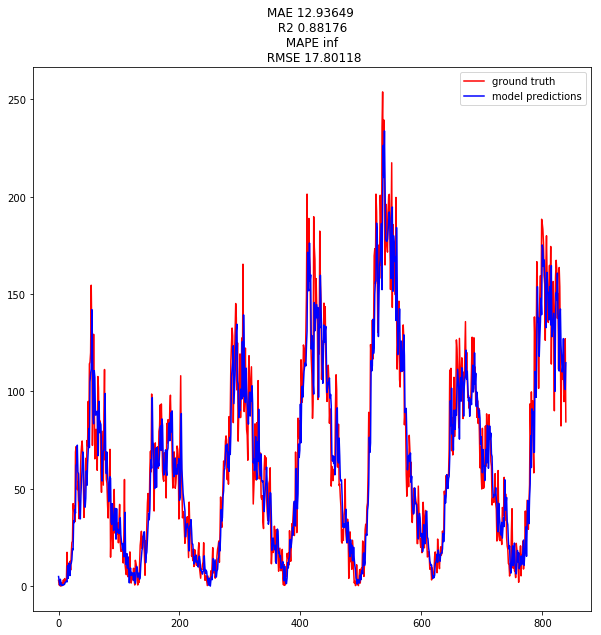

MAE 8.6689
R2 0.8636
RMSE 12.5089
[0.9951416] 1.1254158




Plot, with Optimizer.
(840,) (840,)


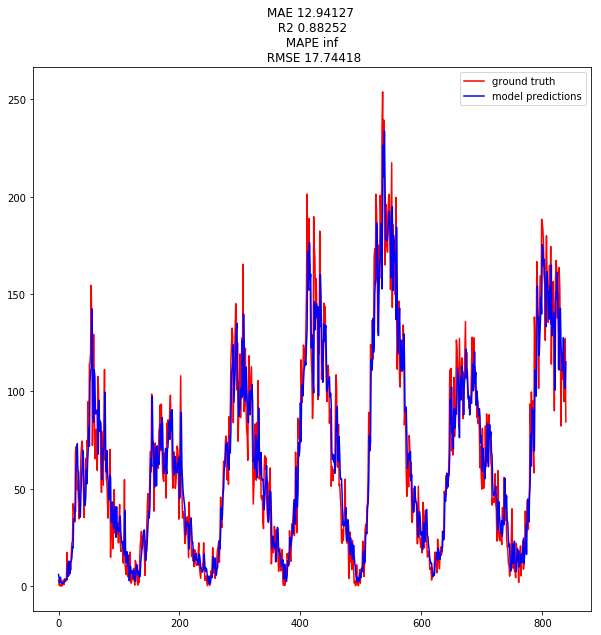

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adam', 'lr': 1.024e-07}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/6000
1959/1959 [==============================] - 8s 4ms/step - loss: 43.6066 - mean_absolute_error: 44.0902 - rmse: 44.0902 - val_loss: 63.4205 - val_mean_absolute_error: 63.9147 - val_rmse: 63.9147
Epoch 2/6000
1959/1959 [==============================] - 1s 351us/step - loss: 43.5353 - mean_absolute_error: 44.0191 - rmse: 44.0191 - val_loss: 63.3177 - val_mean_absolute_error: 63.8118 - val_rmse: 63.8118
Epoch 3/6000
1959/1959 [==============================] - 1s 347us/step - loss: 43.4641 - mean_absolute_error: 43.9480 - rmse: 43.9480 - val_loss: 63.2145 - val_mean_absolute_error: 63.7085 - val_rmse: 63.7085
Epoch 4/6000
1959/1959 [==============================] - 1s 345us/step - loss: 43.3926 - mean_absolute_error: 43.8767 - rmse: 43.8767 - val_loss: 63.1117 - val_mean_absolute_error: 63.6057 - val_rmse: 63.6057
Epoch 5/6

Epoch 78/6000
1959/1959 [==============================] - 1s 332us/step - loss: 37.1224 - mean_absolute_error: 37.6108 - rmse: 37.6108 - val_loss: 54.0516 - val_mean_absolute_error: 54.5467 - val_rmse: 54.5467
Epoch 79/6000
1959/1959 [==============================] - 1s 333us/step - loss: 37.0225 - mean_absolute_error: 37.5109 - rmse: 37.5109 - val_loss: 53.9083 - val_mean_absolute_error: 54.4034 - val_rmse: 54.4034
Epoch 80/6000
1959/1959 [==============================] - 1s 339us/step - loss: 36.9221 - mean_absolute_error: 37.4105 - rmse: 37.4105 - val_loss: 53.7629 - val_mean_absolute_error: 54.2581 - val_rmse: 54.2581
Epoch 81/6000
1959/1959 [==============================] - 1s 342us/step - loss: 36.8211 - mean_absolute_error: 37.3094 - rmse: 37.3094 - val_loss: 53.6168 - val_mean_absolute_error: 54.1121 - val_rmse: 54.1121
Epoch 82/6000
1959/1959 [==============================] - 1s 342us/step - loss: 36.7200 - mean_absolute_error: 37.2083 - rmse: 37.2083 - val_loss: 53.4718 

Epoch 117/6000
1959/1959 [==============================] - 1s 342us/step - loss: 32.8208 - mean_absolute_error: 33.3091 - rmse: 33.3091 - val_loss: 47.8204 - val_mean_absolute_error: 48.3161 - val_rmse: 48.3161
Epoch 118/6000
1959/1959 [==============================] - 1s 336us/step - loss: 32.6993 - mean_absolute_error: 33.1877 - rmse: 33.1877 - val_loss: 47.6425 - val_mean_absolute_error: 48.1383 - val_rmse: 48.1383
Epoch 119/6000
1959/1959 [==============================] - 1s 352us/step - loss: 32.5762 - mean_absolute_error: 33.0647 - rmse: 33.0647 - val_loss: 47.4653 - val_mean_absolute_error: 47.9611 - val_rmse: 47.9611
Epoch 120/6000
1959/1959 [==============================] - 1s 348us/step - loss: 32.4539 - mean_absolute_error: 32.9424 - rmse: 32.9424 - val_loss: 47.2873 - val_mean_absolute_error: 47.7832 - val_rmse: 47.7832
Epoch 121/6000
1959/1959 [==============================] - 1s 338us/step - loss: 32.3303 - mean_absolute_error: 32.8189 - rmse: 32.8189 - val_loss: 47.

Epoch 156/6000
1959/1959 [==============================] - 1s 343us/step - loss: 27.6978 - mean_absolute_error: 28.1883 - rmse: 28.1883 - val_loss: 40.3490 - val_mean_absolute_error: 40.8442 - val_rmse: 40.8442
Epoch 157/6000
1959/1959 [==============================] - 1s 343us/step - loss: 27.5566 - mean_absolute_error: 28.0472 - rmse: 28.0472 - val_loss: 40.1408 - val_mean_absolute_error: 40.6358 - val_rmse: 40.6358
Epoch 158/6000
1959/1959 [==============================] - 1s 342us/step - loss: 27.4146 - mean_absolute_error: 27.9049 - rmse: 27.9049 - val_loss: 39.9311 - val_mean_absolute_error: 40.4261 - val_rmse: 40.4261
Epoch 159/6000
1959/1959 [==============================] - 1s 338us/step - loss: 27.2721 - mean_absolute_error: 27.7623 - rmse: 27.7623 - val_loss: 39.7227 - val_mean_absolute_error: 40.2174 - val_rmse: 40.2174
Epoch 160/6000
1959/1959 [==============================] - 1s 334us/step - loss: 27.1291 - mean_absolute_error: 27.6195 - rmse: 27.6195 - val_loss: 39.

Epoch 195/6000
1959/1959 [==============================] - 1s 342us/step - loss: 21.9010 - mean_absolute_error: 22.3907 - rmse: 22.3907 - val_loss: 31.7665 - val_mean_absolute_error: 32.2605 - val_rmse: 32.2605
Epoch 196/6000
1959/1959 [==============================] - 1s 336us/step - loss: 21.7508 - mean_absolute_error: 22.2405 - rmse: 22.2405 - val_loss: 31.5460 - val_mean_absolute_error: 32.0400 - val_rmse: 32.0400
Epoch 197/6000
1959/1959 [==============================] - 1s 339us/step - loss: 21.6021 - mean_absolute_error: 22.0914 - rmse: 22.0914 - val_loss: 31.3212 - val_mean_absolute_error: 31.8148 - val_rmse: 31.8148
Epoch 198/6000
1959/1959 [==============================] - 1s 335us/step - loss: 21.4528 - mean_absolute_error: 21.9422 - rmse: 21.9422 - val_loss: 31.0995 - val_mean_absolute_error: 31.5930 - val_rmse: 31.5930
Epoch 199/6000
1959/1959 [==============================] - 1s 336us/step - loss: 21.3020 - mean_absolute_error: 21.7912 - rmse: 21.7912 - val_loss: 30.

Epoch 234/6000
1959/1959 [==============================] - 1s 339us/step - loss: 16.4352 - mean_absolute_error: 16.9255 - rmse: 16.9255 - val_loss: 23.5290 - val_mean_absolute_error: 24.0222 - val_rmse: 24.0222
Epoch 235/6000
1959/1959 [==============================] - 1s 335us/step - loss: 16.3125 - mean_absolute_error: 16.8023 - rmse: 16.8023 - val_loss: 23.3361 - val_mean_absolute_error: 23.8286 - val_rmse: 23.8286
Epoch 236/6000
1959/1959 [==============================] - 1s 337us/step - loss: 16.1892 - mean_absolute_error: 16.6786 - rmse: 16.6786 - val_loss: 23.1519 - val_mean_absolute_error: 23.6432 - val_rmse: 23.6432
Epoch 237/6000
1959/1959 [==============================] - 1s 338us/step - loss: 16.0691 - mean_absolute_error: 16.5576 - rmse: 16.5576 - val_loss: 22.9671 - val_mean_absolute_error: 23.4593 - val_rmse: 23.4593
Epoch 238/6000
1959/1959 [==============================] - 1s 345us/step - loss: 15.9493 - mean_absolute_error: 16.4384 - rmse: 16.4384 - val_loss: 22.

Epoch 273/6000
1959/1959 [==============================] - 1s 339us/step - loss: 13.1255 - mean_absolute_error: 13.6141 - rmse: 13.6141 - val_loss: 18.3514 - val_mean_absolute_error: 18.8450 - val_rmse: 18.8450
Epoch 274/6000
1959/1959 [==============================] - 1s 347us/step - loss: 13.0822 - mean_absolute_error: 13.5704 - rmse: 13.5704 - val_loss: 18.2862 - val_mean_absolute_error: 18.7798 - val_rmse: 18.7798
Epoch 275/6000
1959/1959 [==============================] - 1s 341us/step - loss: 13.0428 - mean_absolute_error: 13.5309 - rmse: 13.5309 - val_loss: 18.2260 - val_mean_absolute_error: 18.7187 - val_rmse: 18.7187
Epoch 276/6000
1959/1959 [==============================] - 1s 348us/step - loss: 13.0050 - mean_absolute_error: 13.4938 - rmse: 13.4938 - val_loss: 18.1739 - val_mean_absolute_error: 18.6676 - val_rmse: 18.6676
Epoch 277/6000
1959/1959 [==============================] - 1s 346us/step - loss: 12.9705 - mean_absolute_error: 13.4595 - rmse: 13.4595 - val_loss: 18.

Epoch 312/6000
1959/1959 [==============================] - 1s 344us/step - loss: 12.4794 - mean_absolute_error: 12.9665 - rmse: 12.9665 - val_loss: 17.2252 - val_mean_absolute_error: 17.7183 - val_rmse: 17.7183
Epoch 313/6000
1959/1959 [==============================] - 1s 347us/step - loss: 12.4743 - mean_absolute_error: 12.9610 - rmse: 12.9610 - val_loss: 17.2145 - val_mean_absolute_error: 17.7081 - val_rmse: 17.7081
Epoch 314/6000
1959/1959 [==============================] - 1s 345us/step - loss: 12.4695 - mean_absolute_error: 12.9564 - rmse: 12.9564 - val_loss: 17.2060 - val_mean_absolute_error: 17.6997 - val_rmse: 17.6997
Epoch 315/6000
1959/1959 [==============================] - 1s 344us/step - loss: 12.4655 - mean_absolute_error: 12.9520 - rmse: 12.9520 - val_loss: 17.1984 - val_mean_absolute_error: 17.6922 - val_rmse: 17.6922
Epoch 316/6000
1959/1959 [==============================] - 1s 353us/step - loss: 12.4614 - mean_absolute_error: 12.9481 - rmse: 12.9481 - val_loss: 17.

Epoch 351/6000
1959/1959 [==============================] - 1s 337us/step - loss: 12.3629 - mean_absolute_error: 12.8517 - rmse: 12.8517 - val_loss: 17.0160 - val_mean_absolute_error: 17.5102 - val_rmse: 17.5102
Epoch 352/6000
1959/1959 [==============================] - 1s 336us/step - loss: 12.3614 - mean_absolute_error: 12.8502 - rmse: 12.8502 - val_loss: 17.0120 - val_mean_absolute_error: 17.5063 - val_rmse: 17.5063
Epoch 353/6000
1959/1959 [==============================] - 1s 340us/step - loss: 12.3582 - mean_absolute_error: 12.8468 - rmse: 12.8468 - val_loss: 17.0080 - val_mean_absolute_error: 17.5023 - val_rmse: 17.5023
Epoch 354/6000
1959/1959 [==============================] - 1s 355us/step - loss: 12.3560 - mean_absolute_error: 12.8447 - rmse: 12.8447 - val_loss: 17.0042 - val_mean_absolute_error: 17.4985 - val_rmse: 17.4985
Epoch 355/6000
1959/1959 [==============================] - 1s 360us/step - loss: 12.3540 - mean_absolute_error: 12.8427 - rmse: 12.8427 - val_loss: 17.

Epoch 390/6000
1959/1959 [==============================] - 1s 338us/step - loss: 12.2673 - mean_absolute_error: 12.7545 - rmse: 12.7545 - val_loss: 16.8627 - val_mean_absolute_error: 17.3563 - val_rmse: 17.3563
Epoch 391/6000
1959/1959 [==============================] - 1s 340us/step - loss: 12.2652 - mean_absolute_error: 12.7523 - rmse: 12.7523 - val_loss: 16.8587 - val_mean_absolute_error: 17.3522 - val_rmse: 17.3522
Epoch 392/6000
1959/1959 [==============================] - 1s 337us/step - loss: 12.2632 - mean_absolute_error: 12.7505 - rmse: 12.7505 - val_loss: 16.8555 - val_mean_absolute_error: 17.3490 - val_rmse: 17.3490
Epoch 393/6000
1959/1959 [==============================] - 1s 339us/step - loss: 12.2602 - mean_absolute_error: 12.7474 - rmse: 12.7474 - val_loss: 16.8517 - val_mean_absolute_error: 17.3451 - val_rmse: 17.3451
Epoch 394/6000
1959/1959 [==============================] - 1s 341us/step - loss: 12.2581 - mean_absolute_error: 12.7453 - rmse: 12.7453 - val_loss: 16.

Epoch 429/6000
1959/1959 [==============================] - 1s 338us/step - loss: 12.1779 - mean_absolute_error: 12.6639 - rmse: 12.6639 - val_loss: 16.7167 - val_mean_absolute_error: 17.2101 - val_rmse: 17.2101
Epoch 430/6000
1959/1959 [==============================] - 1s 340us/step - loss: 12.1754 - mean_absolute_error: 12.6615 - rmse: 12.6615 - val_loss: 16.7126 - val_mean_absolute_error: 17.2059 - val_rmse: 17.2059
Epoch 431/6000
1959/1959 [==============================] - 1s 339us/step - loss: 12.1729 - mean_absolute_error: 12.6589 - rmse: 12.6589 - val_loss: 16.7095 - val_mean_absolute_error: 17.2028 - val_rmse: 17.2028
Epoch 432/6000
1959/1959 [==============================] - 1s 334us/step - loss: 12.1706 - mean_absolute_error: 12.6566 - rmse: 12.6566 - val_loss: 16.7057 - val_mean_absolute_error: 17.1989 - val_rmse: 17.1989
Epoch 433/6000
1959/1959 [==============================] - 1s 333us/step - loss: 12.1687 - mean_absolute_error: 12.6547 - rmse: 12.6547 - val_loss: 16.

Epoch 468/6000
1959/1959 [==============================] - 1s 342us/step - loss: 12.0888 - mean_absolute_error: 12.5752 - rmse: 12.5752 - val_loss: 16.5710 - val_mean_absolute_error: 17.0643 - val_rmse: 17.0643
Epoch 469/6000
1959/1959 [==============================] - 1s 354us/step - loss: 12.0860 - mean_absolute_error: 12.5725 - rmse: 12.5725 - val_loss: 16.5687 - val_mean_absolute_error: 17.0617 - val_rmse: 17.0617
Epoch 470/6000
1959/1959 [==============================] - 1s 337us/step - loss: 12.0840 - mean_absolute_error: 12.5704 - rmse: 12.5704 - val_loss: 16.5669 - val_mean_absolute_error: 17.0596 - val_rmse: 17.0596
Epoch 471/6000
1959/1959 [==============================] - 1s 339us/step - loss: 12.0815 - mean_absolute_error: 12.5681 - rmse: 12.5681 - val_loss: 16.5617 - val_mean_absolute_error: 17.0546 - val_rmse: 17.0546
Epoch 472/6000
1959/1959 [==============================] - 1s 338us/step - loss: 12.0789 - mean_absolute_error: 12.5654 - rmse: 12.5654 - val_loss: 16.

Epoch 507/6000
1959/1959 [==============================] - 1s 353us/step - loss: 12.0061 - mean_absolute_error: 12.4932 - rmse: 12.4932 - val_loss: 16.4421 - val_mean_absolute_error: 16.9347 - val_rmse: 16.9347
Epoch 508/6000
1959/1959 [==============================] - 1s 338us/step - loss: 12.0040 - mean_absolute_error: 12.4910 - rmse: 12.4910 - val_loss: 16.4379 - val_mean_absolute_error: 16.9304 - val_rmse: 16.9304
Epoch 509/6000
1959/1959 [==============================] - 1s 334us/step - loss: 12.0027 - mean_absolute_error: 12.4896 - rmse: 12.4896 - val_loss: 16.4348 - val_mean_absolute_error: 16.9273 - val_rmse: 16.9273
Epoch 510/6000
1959/1959 [==============================] - 1s 337us/step - loss: 12.0002 - mean_absolute_error: 12.4873 - rmse: 12.4873 - val_loss: 16.4326 - val_mean_absolute_error: 16.9253 - val_rmse: 16.9253
Epoch 511/6000
1959/1959 [==============================] - 1s 344us/step - loss: 11.9986 - mean_absolute_error: 12.4857 - rmse: 12.4857 - val_loss: 16.

Epoch 546/6000
1959/1959 [==============================] - 1s 337us/step - loss: 11.9291 - mean_absolute_error: 12.4158 - rmse: 12.4158 - val_loss: 16.3189 - val_mean_absolute_error: 16.8116 - val_rmse: 16.8116
Epoch 547/6000
1959/1959 [==============================] - 1s 339us/step - loss: 11.9277 - mean_absolute_error: 12.4145 - rmse: 12.4145 - val_loss: 16.3161 - val_mean_absolute_error: 16.8088 - val_rmse: 16.8088
Epoch 548/6000
1959/1959 [==============================] - 1s 340us/step - loss: 11.9263 - mean_absolute_error: 12.4130 - rmse: 12.4130 - val_loss: 16.3130 - val_mean_absolute_error: 16.8057 - val_rmse: 16.8057
Epoch 549/6000
1959/1959 [==============================] - 1s 349us/step - loss: 11.9240 - mean_absolute_error: 12.4107 - rmse: 12.4107 - val_loss: 16.3109 - val_mean_absolute_error: 16.8036 - val_rmse: 16.8036
Epoch 550/6000
1959/1959 [==============================] - 1s 336us/step - loss: 11.9217 - mean_absolute_error: 12.4084 - rmse: 12.4084 - val_loss: 16.

Epoch 585/6000
1959/1959 [==============================] - 1s 346us/step - loss: 11.8556 - mean_absolute_error: 12.3419 - rmse: 12.3419 - val_loss: 16.1984 - val_mean_absolute_error: 16.6907 - val_rmse: 16.6907
Epoch 586/6000
1959/1959 [==============================] - 1s 346us/step - loss: 11.8531 - mean_absolute_error: 12.3395 - rmse: 12.3395 - val_loss: 16.1950 - val_mean_absolute_error: 16.6873 - val_rmse: 16.6873
Epoch 587/6000
1959/1959 [==============================] - 1s 342us/step - loss: 11.8519 - mean_absolute_error: 12.3384 - rmse: 12.3384 - val_loss: 16.1901 - val_mean_absolute_error: 16.6824 - val_rmse: 16.6824
Epoch 588/6000
1959/1959 [==============================] - 1s 342us/step - loss: 11.8500 - mean_absolute_error: 12.3363 - rmse: 12.3363 - val_loss: 16.1877 - val_mean_absolute_error: 16.6800 - val_rmse: 16.6800
Epoch 589/6000
1959/1959 [==============================] - 1s 341us/step - loss: 11.8482 - mean_absolute_error: 12.3345 - rmse: 12.3345 - val_loss: 16.

Epoch 624/6000
1959/1959 [==============================] - 1s 342us/step - loss: 11.7816 - mean_absolute_error: 12.2682 - rmse: 12.2682 - val_loss: 16.0797 - val_mean_absolute_error: 16.5723 - val_rmse: 16.5723
Epoch 625/6000
1959/1959 [==============================] - 1s 343us/step - loss: 11.7806 - mean_absolute_error: 12.2672 - rmse: 12.2672 - val_loss: 16.0770 - val_mean_absolute_error: 16.5696 - val_rmse: 16.5696
Epoch 626/6000
1959/1959 [==============================] - 1s 335us/step - loss: 11.7780 - mean_absolute_error: 12.2646 - rmse: 12.2646 - val_loss: 16.0727 - val_mean_absolute_error: 16.5654 - val_rmse: 16.5654
Epoch 627/6000
1959/1959 [==============================] - 1s 336us/step - loss: 11.7764 - mean_absolute_error: 12.2630 - rmse: 12.2630 - val_loss: 16.0697 - val_mean_absolute_error: 16.5623 - val_rmse: 16.5623
Epoch 628/6000
1959/1959 [==============================] - 1s 336us/step - loss: 11.7745 - mean_absolute_error: 12.2611 - rmse: 12.2611 - val_loss: 16.

Epoch 663/6000
1959/1959 [==============================] - 1s 340us/step - loss: 11.7086 - mean_absolute_error: 12.1952 - rmse: 12.1952 - val_loss: 15.9596 - val_mean_absolute_error: 16.4524 - val_rmse: 16.4524
Epoch 664/6000
1959/1959 [==============================] - 1s 340us/step - loss: 11.7056 - mean_absolute_error: 12.1923 - rmse: 12.1923 - val_loss: 15.9567 - val_mean_absolute_error: 16.4496 - val_rmse: 16.4496
Epoch 665/6000
1959/1959 [==============================] - 1s 348us/step - loss: 11.7040 - mean_absolute_error: 12.1908 - rmse: 12.1908 - val_loss: 15.9556 - val_mean_absolute_error: 16.4487 - val_rmse: 16.4487
Epoch 666/6000
1959/1959 [==============================] - 1s 343us/step - loss: 11.7019 - mean_absolute_error: 12.1887 - rmse: 12.1887 - val_loss: 15.9527 - val_mean_absolute_error: 16.4458 - val_rmse: 16.4458
Epoch 667/6000
1959/1959 [==============================] - 1s 340us/step - loss: 11.7007 - mean_absolute_error: 12.1875 - rmse: 12.1875 - val_loss: 15.

Epoch 702/6000
1959/1959 [==============================] - 1s 347us/step - loss: 11.6340 - mean_absolute_error: 12.1198 - rmse: 12.1198 - val_loss: 15.8401 - val_mean_absolute_error: 16.3331 - val_rmse: 16.3331
Epoch 703/6000
1959/1959 [==============================] - 1s 343us/step - loss: 11.6323 - mean_absolute_error: 12.1181 - rmse: 12.1181 - val_loss: 15.8386 - val_mean_absolute_error: 16.3316 - val_rmse: 16.3316
Epoch 704/6000
1959/1959 [==============================] - 1s 351us/step - loss: 11.6306 - mean_absolute_error: 12.1163 - rmse: 12.1163 - val_loss: 15.8339 - val_mean_absolute_error: 16.3269 - val_rmse: 16.3269
Epoch 705/6000
1959/1959 [==============================] - 1s 336us/step - loss: 11.6281 - mean_absolute_error: 12.1140 - rmse: 12.1140 - val_loss: 15.8310 - val_mean_absolute_error: 16.3239 - val_rmse: 16.3239
Epoch 706/6000
1959/1959 [==============================] - 1s 337us/step - loss: 11.6271 - mean_absolute_error: 12.1127 - rmse: 12.1127 - val_loss: 15.

Epoch 741/6000
1959/1959 [==============================] - 1s 344us/step - loss: 11.5612 - mean_absolute_error: 12.0465 - rmse: 12.0465 - val_loss: 15.7171 - val_mean_absolute_error: 16.2095 - val_rmse: 16.2095
Epoch 742/6000
1959/1959 [==============================] - 1s 346us/step - loss: 11.5600 - mean_absolute_error: 12.0453 - rmse: 12.0453 - val_loss: 15.7131 - val_mean_absolute_error: 16.2054 - val_rmse: 16.2054
Epoch 743/6000
1959/1959 [==============================] - 1s 341us/step - loss: 11.5583 - mean_absolute_error: 12.0437 - rmse: 12.0437 - val_loss: 15.7105 - val_mean_absolute_error: 16.2028 - val_rmse: 16.2028
Epoch 744/6000
1959/1959 [==============================] - 1s 345us/step - loss: 11.5557 - mean_absolute_error: 12.0411 - rmse: 12.0411 - val_loss: 15.7077 - val_mean_absolute_error: 16.2000 - val_rmse: 16.2000
Epoch 745/6000
1959/1959 [==============================] - 1s 342us/step - loss: 11.5541 - mean_absolute_error: 12.0395 - rmse: 12.0395 - val_loss: 15.

Epoch 780/6000
1959/1959 [==============================] - 1s 346us/step - loss: 11.4905 - mean_absolute_error: 11.9760 - rmse: 11.9760 - val_loss: 15.5951 - val_mean_absolute_error: 16.0859 - val_rmse: 16.0859
Epoch 781/6000
1959/1959 [==============================] - 1s 347us/step - loss: 11.4890 - mean_absolute_error: 11.9745 - rmse: 11.9745 - val_loss: 15.5924 - val_mean_absolute_error: 16.0832 - val_rmse: 16.0832
Epoch 782/6000
1959/1959 [==============================] - 1s 349us/step - loss: 11.4872 - mean_absolute_error: 11.9727 - rmse: 11.9727 - val_loss: 15.5899 - val_mean_absolute_error: 16.0808 - val_rmse: 16.0808
Epoch 783/6000
1959/1959 [==============================] - 1s 338us/step - loss: 11.4850 - mean_absolute_error: 11.9705 - rmse: 11.9705 - val_loss: 15.5874 - val_mean_absolute_error: 16.0783 - val_rmse: 16.0783
Epoch 784/6000
1959/1959 [==============================] - 1s 344us/step - loss: 11.4839 - mean_absolute_error: 11.9694 - rmse: 11.9694 - val_loss: 15.

Epoch 819/6000
1959/1959 [==============================] - 1s 350us/step - loss: 11.4207 - mean_absolute_error: 11.9068 - rmse: 11.9068 - val_loss: 15.4779 - val_mean_absolute_error: 15.9689 - val_rmse: 15.9689
Epoch 820/6000
1959/1959 [==============================] - 1s 331us/step - loss: 11.4188 - mean_absolute_error: 11.9048 - rmse: 11.9048 - val_loss: 15.4753 - val_mean_absolute_error: 15.9663 - val_rmse: 15.9663
Epoch 821/6000
1959/1959 [==============================] - 1s 335us/step - loss: 11.4175 - mean_absolute_error: 11.9036 - rmse: 11.9036 - val_loss: 15.4713 - val_mean_absolute_error: 15.9623 - val_rmse: 15.9623
Epoch 822/6000
1959/1959 [==============================] - 1s 333us/step - loss: 11.4155 - mean_absolute_error: 11.9016 - rmse: 11.9016 - val_loss: 15.4705 - val_mean_absolute_error: 15.9618 - val_rmse: 15.9618
Epoch 823/6000
1959/1959 [==============================] - 1s 339us/step - loss: 11.4143 - mean_absolute_error: 11.9003 - rmse: 11.9003 - val_loss: 15.

Epoch 858/6000
1959/1959 [==============================] - 1s 342us/step - loss: 11.3557 - mean_absolute_error: 11.8416 - rmse: 11.8416 - val_loss: 15.3669 - val_mean_absolute_error: 15.8597 - val_rmse: 15.8597
Epoch 859/6000
1959/1959 [==============================] - 1s 351us/step - loss: 11.3534 - mean_absolute_error: 11.8392 - rmse: 11.8392 - val_loss: 15.3608 - val_mean_absolute_error: 15.8532 - val_rmse: 15.8532
Epoch 860/6000
1959/1959 [==============================] - 1s 338us/step - loss: 11.3511 - mean_absolute_error: 11.8369 - rmse: 11.8369 - val_loss: 15.3580 - val_mean_absolute_error: 15.8504 - val_rmse: 15.8504
Epoch 861/6000
1959/1959 [==============================] - 1s 339us/step - loss: 11.3495 - mean_absolute_error: 11.8353 - rmse: 11.8353 - val_loss: 15.3559 - val_mean_absolute_error: 15.8485 - val_rmse: 15.8485
Epoch 862/6000
1959/1959 [==============================] - 1s 339us/step - loss: 11.3473 - mean_absolute_error: 11.8330 - rmse: 11.8330 - val_loss: 15.

Epoch 897/6000
1959/1959 [==============================] - 1s 338us/step - loss: 11.2909 - mean_absolute_error: 11.7765 - rmse: 11.7765 - val_loss: 15.2460 - val_mean_absolute_error: 15.7378 - val_rmse: 15.7378
Epoch 898/6000
1959/1959 [==============================] - 1s 335us/step - loss: 11.2889 - mean_absolute_error: 11.7745 - rmse: 11.7745 - val_loss: 15.2411 - val_mean_absolute_error: 15.7325 - val_rmse: 15.7325
Epoch 899/6000
1959/1959 [==============================] - 1s 333us/step - loss: 11.2872 - mean_absolute_error: 11.7729 - rmse: 11.7729 - val_loss: 15.2389 - val_mean_absolute_error: 15.7305 - val_rmse: 15.7305
Epoch 900/6000
1959/1959 [==============================] - 1s 340us/step - loss: 11.2858 - mean_absolute_error: 11.7713 - rmse: 11.7713 - val_loss: 15.2363 - val_mean_absolute_error: 15.7279 - val_rmse: 15.7278
Epoch 901/6000
1959/1959 [==============================] - 1s 336us/step - loss: 11.2841 - mean_absolute_error: 11.7694 - rmse: 11.7694 - val_loss: 15.

Epoch 936/6000
1959/1959 [==============================] - 1s 341us/step - loss: 11.2277 - mean_absolute_error: 11.7130 - rmse: 11.7130 - val_loss: 15.1320 - val_mean_absolute_error: 15.6237 - val_rmse: 15.6237
Epoch 937/6000
1959/1959 [==============================] - 1s 345us/step - loss: 11.2258 - mean_absolute_error: 11.7111 - rmse: 11.7111 - val_loss: 15.1277 - val_mean_absolute_error: 15.6193 - val_rmse: 15.6193
Epoch 938/6000
1959/1959 [==============================] - 1s 340us/step - loss: 11.2243 - mean_absolute_error: 11.7095 - rmse: 11.7095 - val_loss: 15.1253 - val_mean_absolute_error: 15.6169 - val_rmse: 15.6169
Epoch 939/6000
1959/1959 [==============================] - 1s 338us/step - loss: 11.2240 - mean_absolute_error: 11.7094 - rmse: 11.7094 - val_loss: 15.1204 - val_mean_absolute_error: 15.6120 - val_rmse: 15.6120
Epoch 940/6000
1959/1959 [==============================] - 1s 339us/step - loss: 11.2212 - mean_absolute_error: 11.7066 - rmse: 11.7066 - val_loss: 15.

Epoch 975/6000
1959/1959 [==============================] - 1s 337us/step - loss: 11.1667 - mean_absolute_error: 11.6528 - rmse: 11.6528 - val_loss: 15.0161 - val_mean_absolute_error: 15.5080 - val_rmse: 15.5080
Epoch 976/6000
1959/1959 [==============================] - 1s 339us/step - loss: 11.1656 - mean_absolute_error: 11.6517 - rmse: 11.6517 - val_loss: 15.0133 - val_mean_absolute_error: 15.5052 - val_rmse: 15.5052
Epoch 977/6000
1959/1959 [==============================] - 1s 341us/step - loss: 11.1636 - mean_absolute_error: 11.6497 - rmse: 11.6497 - val_loss: 15.0133 - val_mean_absolute_error: 15.5048 - val_rmse: 15.5048
Epoch 978/6000
1959/1959 [==============================] - 1s 345us/step - loss: 11.1623 - mean_absolute_error: 11.6482 - rmse: 11.6482 - val_loss: 15.0082 - val_mean_absolute_error: 15.5000 - val_rmse: 15.5000
Epoch 979/6000
1959/1959 [==============================] - 1s 349us/step - loss: 11.1610 - mean_absolute_error: 11.6472 - rmse: 11.6472 - val_loss: 15.

1959/1959 [==============================] - 1s 335us/step - loss: 11.0540 - mean_absolute_error: 11.5398 - rmse: 11.5398 - val_loss: 14.7879 - val_mean_absolute_error: 15.2804 - val_rmse: 15.2804
Epoch 1052/6000
1959/1959 [==============================] - 1s 339us/step - loss: 11.0525 - mean_absolute_error: 11.5379 - rmse: 11.5379 - val_loss: 14.7866 - val_mean_absolute_error: 15.2789 - val_rmse: 15.2789
Epoch 1053/6000
1959/1959 [==============================] - 1s 345us/step - loss: 11.0512 - mean_absolute_error: 11.5368 - rmse: 11.5368 - val_loss: 14.7833 - val_mean_absolute_error: 15.2756 - val_rmse: 15.2756
Epoch 1054/6000
1959/1959 [==============================] - 1s 346us/step - loss: 11.0490 - mean_absolute_error: 11.5345 - rmse: 11.5345 - val_loss: 14.7805 - val_mean_absolute_error: 15.2728 - val_rmse: 15.2728
Epoch 1055/6000
1959/1959 [==============================] - 1s 346us/step - loss: 11.0475 - mean_absolute_error: 11.5331 - rmse: 11.5331 - val_loss: 14.7774 - val_

1959/1959 [==============================] - 1s 346us/step - loss: 10.9527 - mean_absolute_error: 11.4396 - rmse: 11.4396 - val_loss: 14.5829 - val_mean_absolute_error: 15.0754 - val_rmse: 15.0754
Epoch 1128/6000
1959/1959 [==============================] - 1s 346us/step - loss: 10.9521 - mean_absolute_error: 11.4390 - rmse: 11.4390 - val_loss: 14.5805 - val_mean_absolute_error: 15.0731 - val_rmse: 15.0731
Epoch 1129/6000
1959/1959 [==============================] - 1s 358us/step - loss: 10.9507 - mean_absolute_error: 11.4377 - rmse: 11.4377 - val_loss: 14.5750 - val_mean_absolute_error: 15.0676 - val_rmse: 15.0676
Epoch 1130/6000
1959/1959 [==============================] - 1s 345us/step - loss: 10.9497 - mean_absolute_error: 11.4369 - rmse: 11.4369 - val_loss: 14.5717 - val_mean_absolute_error: 15.0643 - val_rmse: 15.0643
Epoch 1131/6000
1959/1959 [==============================] - 1s 342us/step - loss: 10.9492 - mean_absolute_error: 11.4363 - rmse: 11.4363 - val_loss: 14.5738 - val_

1959/1959 [==============================] - 1s 338us/step - loss: 10.8692 - mean_absolute_error: 11.3564 - rmse: 11.3564 - val_loss: 14.3944 - val_mean_absolute_error: 14.8864 - val_rmse: 14.8864
Epoch 1204/6000
1959/1959 [==============================] - 1s 336us/step - loss: 10.8677 - mean_absolute_error: 11.3547 - rmse: 11.3547 - val_loss: 14.3938 - val_mean_absolute_error: 14.8860 - val_rmse: 14.8860
Epoch 1205/6000
1959/1959 [==============================] - 1s 339us/step - loss: 10.8669 - mean_absolute_error: 11.3539 - rmse: 11.3539 - val_loss: 14.3914 - val_mean_absolute_error: 14.8835 - val_rmse: 14.8835
Epoch 1206/6000
1959/1959 [==============================] - 1s 346us/step - loss: 10.8656 - mean_absolute_error: 11.3526 - rmse: 11.3526 - val_loss: 14.3876 - val_mean_absolute_error: 14.8795 - val_rmse: 14.8795
Epoch 1207/6000
1959/1959 [==============================] - 1s 347us/step - loss: 10.8647 - mean_absolute_error: 11.3517 - rmse: 11.3517 - val_loss: 14.3849 - val_

1959/1959 [==============================] - 1s 340us/step - loss: 10.7914 - mean_absolute_error: 11.2784 - rmse: 11.2784 - val_loss: 14.2233 - val_mean_absolute_error: 14.7156 - val_rmse: 14.7156
Epoch 1280/6000
1959/1959 [==============================] - 1s 335us/step - loss: 10.7905 - mean_absolute_error: 11.2774 - rmse: 11.2774 - val_loss: 14.2239 - val_mean_absolute_error: 14.7159 - val_rmse: 14.7159
Epoch 1281/6000
1959/1959 [==============================] - 1s 340us/step - loss: 10.7897 - mean_absolute_error: 11.2767 - rmse: 11.2767 - val_loss: 14.2213 - val_mean_absolute_error: 14.7134 - val_rmse: 14.7134
Epoch 1282/6000
1959/1959 [==============================] - 1s 337us/step - loss: 10.7887 - mean_absolute_error: 11.2757 - rmse: 11.2757 - val_loss: 14.2187 - val_mean_absolute_error: 14.7108 - val_rmse: 14.7108
Epoch 1283/6000
1959/1959 [==============================] - 1s 339us/step - loss: 10.7879 - mean_absolute_error: 11.2748 - rmse: 11.2748 - val_loss: 14.2149 - val_

1959/1959 [==============================] - 1s 351us/step - loss: 10.7217 - mean_absolute_error: 11.2082 - rmse: 11.2082 - val_loss: 14.0728 - val_mean_absolute_error: 14.5640 - val_rmse: 14.5640
Epoch 1356/6000
1959/1959 [==============================] - 1s 340us/step - loss: 10.7213 - mean_absolute_error: 11.2077 - rmse: 11.2077 - val_loss: 14.0705 - val_mean_absolute_error: 14.5616 - val_rmse: 14.5616
Epoch 1357/6000
1959/1959 [==============================] - 1s 345us/step - loss: 10.7193 - mean_absolute_error: 11.2057 - rmse: 11.2057 - val_loss: 14.0693 - val_mean_absolute_error: 14.5605 - val_rmse: 14.5605
Epoch 1358/6000
1959/1959 [==============================] - 1s 344us/step - loss: 10.7192 - mean_absolute_error: 11.2055 - rmse: 11.2055 - val_loss: 14.0674 - val_mean_absolute_error: 14.5587 - val_rmse: 14.5587
Epoch 1359/6000
1959/1959 [==============================] - 1s 340us/step - loss: 10.7181 - mean_absolute_error: 11.2045 - rmse: 11.2045 - val_loss: 14.0655 - val_

1959/1959 [==============================] - 1s 350us/step - loss: 10.6575 - mean_absolute_error: 11.1438 - rmse: 11.1438 - val_loss: 13.9283 - val_mean_absolute_error: 14.4199 - val_rmse: 14.4199
Epoch 1432/6000
1959/1959 [==============================] - 1s 336us/step - loss: 10.6557 - mean_absolute_error: 11.1420 - rmse: 11.1420 - val_loss: 13.9260 - val_mean_absolute_error: 14.4177 - val_rmse: 14.4177
Epoch 1433/6000
1959/1959 [==============================] - 1s 338us/step - loss: 10.6556 - mean_absolute_error: 11.1417 - rmse: 11.1417 - val_loss: 13.9233 - val_mean_absolute_error: 14.4151 - val_rmse: 14.4151
Epoch 1434/6000
1959/1959 [==============================] - 1s 337us/step - loss: 10.6557 - mean_absolute_error: 11.1421 - rmse: 11.1421 - val_loss: 13.9212 - val_mean_absolute_error: 14.4130 - val_rmse: 14.4130
Epoch 1435/6000
1959/1959 [==============================] - 1s 342us/step - loss: 10.6542 - mean_absolute_error: 11.1403 - rmse: 11.1403 - val_loss: 13.9210 - val_

1959/1959 [==============================] - 1s 351us/step - loss: 10.6004 - mean_absolute_error: 11.0847 - rmse: 11.0847 - val_loss: 13.7941 - val_mean_absolute_error: 14.2852 - val_rmse: 14.2852
Epoch 1508/6000
1959/1959 [==============================] - 1s 347us/step - loss: 10.6004 - mean_absolute_error: 11.0848 - rmse: 11.0848 - val_loss: 13.7941 - val_mean_absolute_error: 14.2849 - val_rmse: 14.2849
Epoch 1509/6000
1959/1959 [==============================] - 1s 334us/step - loss: 10.5986 - mean_absolute_error: 11.0829 - rmse: 11.0829 - val_loss: 13.7905 - val_mean_absolute_error: 14.2815 - val_rmse: 14.2815
Epoch 1510/6000
1959/1959 [==============================] - 1s 345us/step - loss: 10.5983 - mean_absolute_error: 11.0826 - rmse: 11.0826 - val_loss: 13.7886 - val_mean_absolute_error: 14.2796 - val_rmse: 14.2796
Epoch 1511/6000
1959/1959 [==============================] - 1s 344us/step - loss: 10.5967 - mean_absolute_error: 11.0813 - rmse: 11.0813 - val_loss: 13.7867 - val_

1959/1959 [==============================] - 1s 333us/step - loss: 10.5498 - mean_absolute_error: 11.0337 - rmse: 11.0337 - val_loss: 13.6747 - val_mean_absolute_error: 14.1648 - val_rmse: 14.1648
Epoch 1584/6000
1959/1959 [==============================] - 1s 334us/step - loss: 10.5502 - mean_absolute_error: 11.0341 - rmse: 11.0341 - val_loss: 13.6744 - val_mean_absolute_error: 14.1645 - val_rmse: 14.1644
Epoch 1585/6000
1959/1959 [==============================] - 1s 333us/step - loss: 10.5492 - mean_absolute_error: 11.0330 - rmse: 11.0330 - val_loss: 13.6742 - val_mean_absolute_error: 14.1642 - val_rmse: 14.1642
Epoch 1586/6000
1959/1959 [==============================] - 1s 344us/step - loss: 10.5482 - mean_absolute_error: 11.0321 - rmse: 11.0321 - val_loss: 13.6718 - val_mean_absolute_error: 14.1619 - val_rmse: 14.1619
Epoch 1587/6000
1959/1959 [==============================] - 1s 336us/step - loss: 10.5480 - mean_absolute_error: 11.0317 - rmse: 11.0317 - val_loss: 13.6691 - val_

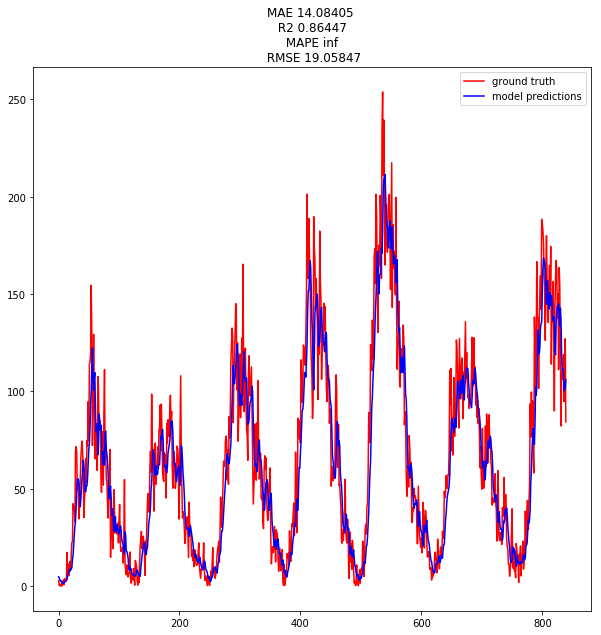

MAE 10.7113
R2 0.8106
RMSE 14.7423
[1.0042167] 1.5982628




Plot, with Optimizer.
(840,) (840,)


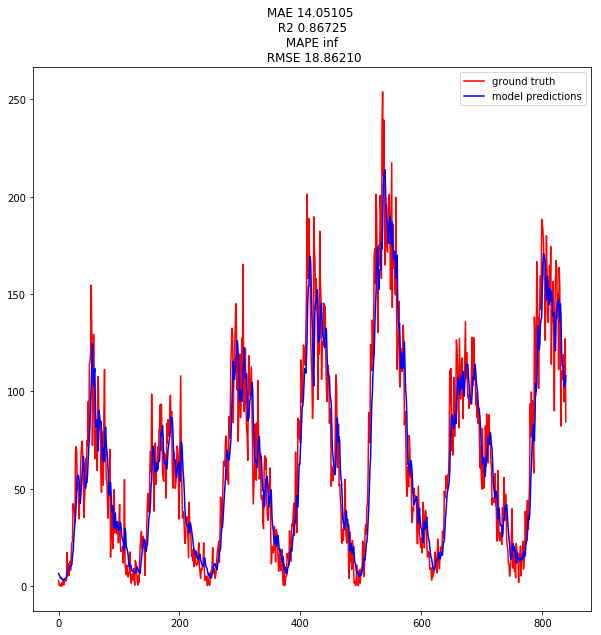

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adamax', 'lr': 0.0016}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/100
1959/1959 [==============================] - 8s 4ms/step - loss: 13.0996 - mean_absolute_error: 13.5894 - rmse: 13.5894 - val_loss: 14.4270 - val_mean_absolute_error: 14.9163 - val_rmse: 14.9163
Epoch 2/100
1959/1959 [==============================] - 1s 367us/step - loss: 11.0291 - mean_absolute_error: 11.5161 - rmse: 11.5161 - val_loss: 13.5946 - val_mean_absolute_error: 14.0846 - val_rmse: 14.0846
Epoch 3/100
1959/1959 [==============================] - 1s 346us/step - loss: 10.7292 - mean_absolute_error: 11.2146 - rmse: 11.2146 - val_loss: 15.0992 - val_mean_absolute_error: 15.5919 - val_rmse: 15.5919
Epoch 4/100
1959/1959 [==============================] - 1s 346us/step - loss: 10.5056 - mean_absolute_error: 10.9911 - rmse: 10.9911 - val_loss: 12.4072 - val_mean_absolute_error: 12.8961 - val_rmse: 12.8961
Epoch 5/100
19

1959/1959 [==============================] - 1s 336us/step - loss: 8.1530 - mean_absolute_error: 8.6239 - rmse: 8.6239 - val_loss: 13.2424 - val_mean_absolute_error: 13.7342 - val_rmse: 13.7342
Epoch 79/100
1959/1959 [==============================] - 1s 349us/step - loss: 7.7901 - mean_absolute_error: 8.2591 - rmse: 8.2591 - val_loss: 13.7136 - val_mean_absolute_error: 14.2021 - val_rmse: 14.2021
Epoch 80/100
1959/1959 [==============================] - 1s 345us/step - loss: 7.9382 - mean_absolute_error: 8.4054 - rmse: 8.4054 - val_loss: 13.3959 - val_mean_absolute_error: 13.8864 - val_rmse: 13.8864
Epoch 81/100
1959/1959 [==============================] - 1s 341us/step - loss: 7.6704 - mean_absolute_error: 8.1395 - rmse: 8.1395 - val_loss: 13.7570 - val_mean_absolute_error: 14.2466 - val_rmse: 14.2466
Epoch 82/100
1959/1959 [==============================] - 1s 339us/step - loss: 7.6808 - mean_absolute_error: 8.1490 - rmse: 8.1490 - val_loss: 14.3356 - val_mean_absolute_error: 14.828

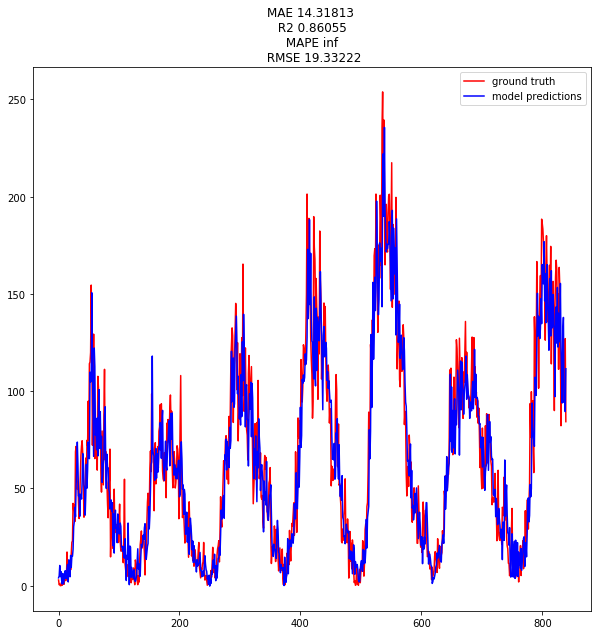

MAE 5.7434
R2 0.9252
RMSE 9.2656
[1.0326997] -0.20357513




Plot, with Optimizer.
(840,) (840,)


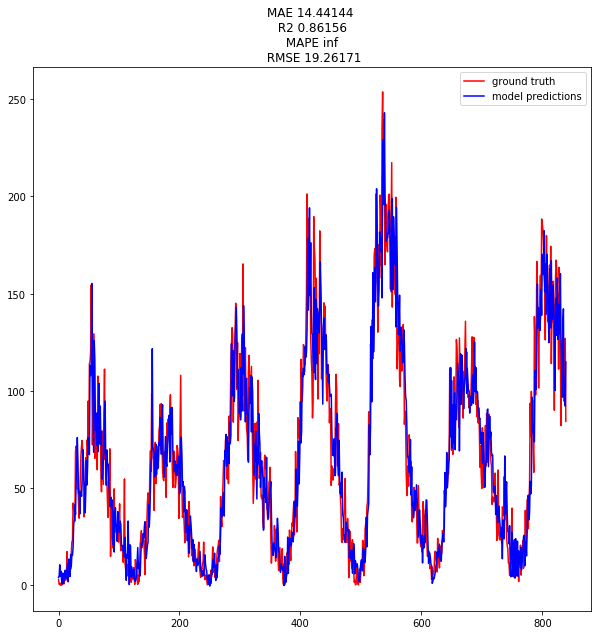

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adamax', 'lr': 6.4e-05}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/400
1959/1959 [==============================] - 8s 4ms/step - loss: 30.3732 - mean_absolute_error: 30.8596 - rmse: 30.8596 - val_loss: 17.8746 - val_mean_absolute_error: 18.3679 - val_rmse: 18.3679
Epoch 2/400
1959/1959 [==============================] - 1s 387us/step - loss: 12.8745 - mean_absolute_error: 13.3633 - rmse: 13.3633 - val_loss: 17.0917 - val_mean_absolute_error: 17.5845 - val_rmse: 17.5845
Epoch 3/400
1959/1959 [==============================] - 1s 381us/step - loss: 12.2840 - mean_absolute_error: 12.7733 - rmse: 12.7733 - val_loss: 16.3894 - val_mean_absolute_error: 16.8819 - val_rmse: 16.8819
Epoch 4/400
1959/1959 [==============================] - 1s 371us/step - loss: 11.9071 - mean_absolute_error: 12.3944 - rmse: 12.3944 - val_loss: 15.7910 - val_mean_absolute_error: 16.2833 - val_rmse: 16.2833
Epoch 5/400
1

1959/1959 [==============================] - 1s 355us/step - loss: 9.7622 - mean_absolute_error: 10.2407 - rmse: 10.2407 - val_loss: 12.1209 - val_mean_absolute_error: 12.6113 - val_rmse: 12.6113
Epoch 79/400
1959/1959 [==============================] - 1s 353us/step - loss: 9.9025 - mean_absolute_error: 10.3818 - rmse: 10.3818 - val_loss: 12.0963 - val_mean_absolute_error: 12.5849 - val_rmse: 12.5849
Epoch 80/400
1959/1959 [==============================] - 1s 359us/step - loss: 9.6363 - mean_absolute_error: 10.1147 - rmse: 10.1147 - val_loss: 12.4745 - val_mean_absolute_error: 12.9631 - val_rmse: 12.9631
Epoch 81/400
1959/1959 [==============================] - 1s 362us/step - loss: 9.7929 - mean_absolute_error: 10.2732 - rmse: 10.2732 - val_loss: 12.1310 - val_mean_absolute_error: 12.6199 - val_rmse: 12.6199
Epoch 82/400
1959/1959 [==============================] - 1s 363us/step - loss: 9.6978 - mean_absolute_error: 10.1772 - rmse: 10.1772 - val_loss: 12.1162 - val_mean_absolute_err

1959/1959 [==============================] - 1s 366us/step - loss: 9.3898 - mean_absolute_error: 9.8666 - rmse: 9.8666 - val_loss: 12.4318 - val_mean_absolute_error: 12.9211 - val_rmse: 12.9211
Epoch 157/400
1959/1959 [==============================] - 1s 364us/step - loss: 9.4883 - mean_absolute_error: 9.9650 - rmse: 9.9650 - val_loss: 12.2225 - val_mean_absolute_error: 12.7111 - val_rmse: 12.7111
Epoch 158/400
1959/1959 [==============================] - 1s 362us/step - loss: 9.4198 - mean_absolute_error: 9.8971 - rmse: 9.8971 - val_loss: 12.2987 - val_mean_absolute_error: 12.7888 - val_rmse: 12.7888
Epoch 159/400
1959/1959 [==============================] - 1s 367us/step - loss: 9.4094 - mean_absolute_error: 9.8875 - rmse: 9.8875 - val_loss: 12.1984 - val_mean_absolute_error: 12.6874 - val_rmse: 12.6874
Epoch 160/400
1959/1959 [==============================] - 1s 367us/step - loss: 9.3358 - mean_absolute_error: 9.8127 - rmse: 9.8127 - val_loss: 12.4397 - val_mean_absolute_error: 12

1959/1959 [==============================] - 1s 391us/step - loss: 9.0482 - mean_absolute_error: 9.5239 - rmse: 9.5239 - val_loss: 12.3912 - val_mean_absolute_error: 12.8811 - val_rmse: 12.8811
Epoch 235/400
1959/1959 [==============================] - 1s 427us/step - loss: 9.0588 - mean_absolute_error: 9.5361 - rmse: 9.5361 - val_loss: 12.6743 - val_mean_absolute_error: 13.1616 - val_rmse: 13.1616
Epoch 236/400
1959/1959 [==============================] - 1s 416us/step - loss: 9.0578 - mean_absolute_error: 9.5320 - rmse: 9.5320 - val_loss: 12.3741 - val_mean_absolute_error: 12.8639 - val_rmse: 12.8639
Epoch 237/400
1959/1959 [==============================] - 1s 426us/step - loss: 8.9796 - mean_absolute_error: 9.4524 - rmse: 9.4524 - val_loss: 12.4179 - val_mean_absolute_error: 12.9075 - val_rmse: 12.9075
Epoch 238/400
1959/1959 [==============================] - 1s 408us/step - loss: 9.0534 - mean_absolute_error: 9.5310 - rmse: 9.5310 - val_loss: 12.3789 - val_mean_absolute_error: 12

1959/1959 [==============================] - 1s 341us/step - loss: 8.4657 - mean_absolute_error: 8.9362 - rmse: 8.9362 - val_loss: 12.6501 - val_mean_absolute_error: 13.1409 - val_rmse: 13.1409
Epoch 313/400
1959/1959 [==============================] - 1s 341us/step - loss: 8.4858 - mean_absolute_error: 8.9578 - rmse: 8.9578 - val_loss: 12.7498 - val_mean_absolute_error: 13.2404 - val_rmse: 13.2404
Epoch 314/400
1959/1959 [==============================] - 1s 346us/step - loss: 8.5381 - mean_absolute_error: 9.0106 - rmse: 9.0106 - val_loss: 12.6481 - val_mean_absolute_error: 13.1395 - val_rmse: 13.1395
Epoch 315/400
1959/1959 [==============================] - 1s 360us/step - loss: 8.4656 - mean_absolute_error: 8.9375 - rmse: 8.9375 - val_loss: 12.6667 - val_mean_absolute_error: 13.1556 - val_rmse: 13.1556
Epoch 316/400
1959/1959 [==============================] - 1s 349us/step - loss: 8.4237 - mean_absolute_error: 8.8927 - rmse: 8.8927 - val_loss: 12.6377 - val_mean_absolute_error: 13

1959/1959 [==============================] - 1s 348us/step - loss: 7.7433 - mean_absolute_error: 8.2097 - rmse: 8.2097 - val_loss: 13.4206 - val_mean_absolute_error: 13.9119 - val_rmse: 13.9119
Epoch 391/400
1959/1959 [==============================] - 1s 350us/step - loss: 7.6739 - mean_absolute_error: 8.1387 - rmse: 8.1387 - val_loss: 13.0945 - val_mean_absolute_error: 13.5861 - val_rmse: 13.5861
Epoch 392/400
1959/1959 [==============================] - 1s 361us/step - loss: 7.6029 - mean_absolute_error: 8.0677 - rmse: 8.0677 - val_loss: 13.0526 - val_mean_absolute_error: 13.5440 - val_rmse: 13.5440
Epoch 393/400
1959/1959 [==============================] - 1s 351us/step - loss: 7.6536 - mean_absolute_error: 8.1202 - rmse: 8.1202 - val_loss: 13.2093 - val_mean_absolute_error: 13.7024 - val_rmse: 13.7024
Epoch 394/400
1959/1959 [==============================] - 1s 344us/step - loss: 7.6911 - mean_absolute_error: 8.1564 - rmse: 8.1564 - val_loss: 13.6586 - val_mean_absolute_error: 14

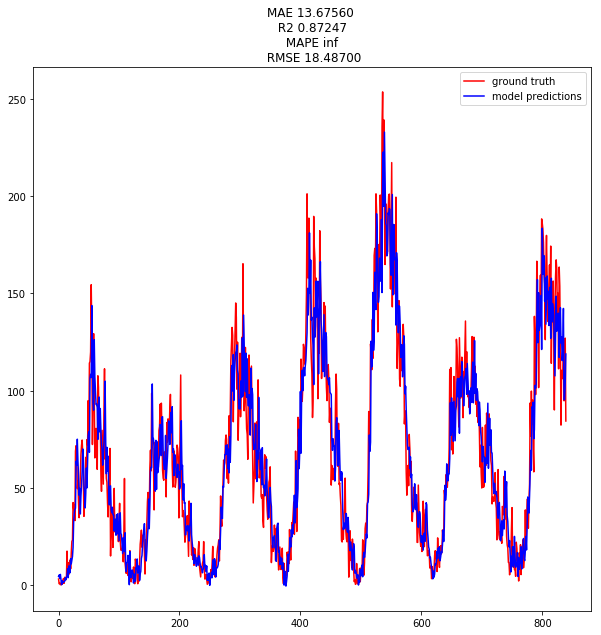

MAE 7.3451
R2 0.8913
RMSE 11.1689
[0.9938767] 0.50115204




Plot, with Optimizer.
(840,) (840,)


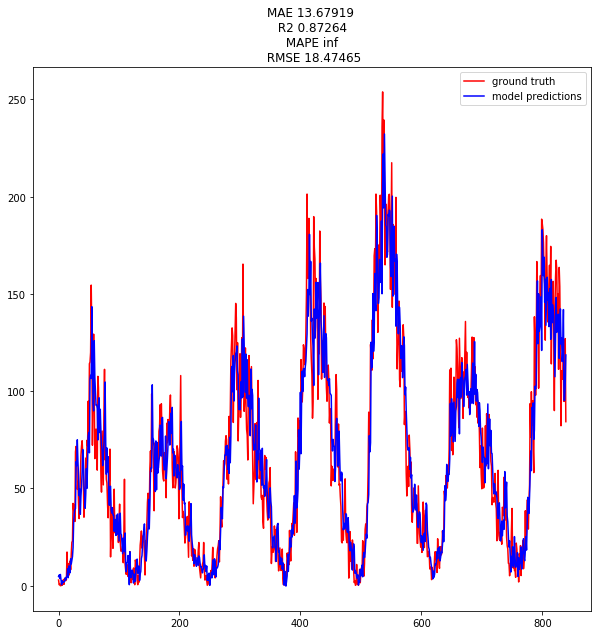

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adamax', 'lr': 2.56e-06}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/1500
1959/1959 [==============================] - 9s 4ms/step - loss: 44.0488 - mean_absolute_error: 44.5305 - rmse: 44.5305 - val_loss: 63.2160 - val_mean_absolute_error: 63.7108 - val_rmse: 63.7108
Epoch 2/1500
1959/1959 [==============================] - 1s 367us/step - loss: 42.8781 - mean_absolute_error: 43.3617 - rmse: 43.3617 - val_loss: 61.5308 - val_mean_absolute_error: 62.0257 - val_rmse: 62.0257
Epoch 3/1500
1959/1959 [==============================] - 1s 357us/step - loss: 41.7040 - mean_absolute_error: 42.1891 - rmse: 42.1891 - val_loss: 59.7940 - val_mean_absolute_error: 60.2891 - val_rmse: 60.2891
Epoch 4/1500
1959/1959 [==============================] - 1s 347us/step - loss: 40.4577 - mean_absolute_error: 40.9443 - rmse: 40.9443 - val_loss: 57.9530 - val_mean_absolute_error: 58.4474 - val_rmse: 58.4474
Epoch 5/

Epoch 78/1500
1959/1959 [==============================] - 1s 398us/step - loss: 11.8727 - mean_absolute_error: 12.3609 - rmse: 12.3609 - val_loss: 16.1796 - val_mean_absolute_error: 16.6723 - val_rmse: 16.6723
Epoch 79/1500
1959/1959 [==============================] - 1s 395us/step - loss: 11.8648 - mean_absolute_error: 12.3519 - rmse: 12.3519 - val_loss: 16.1546 - val_mean_absolute_error: 16.6482 - val_rmse: 16.6482
Epoch 80/1500
1959/1959 [==============================] - 1s 401us/step - loss: 11.8506 - mean_absolute_error: 12.3390 - rmse: 12.3390 - val_loss: 16.1492 - val_mean_absolute_error: 16.6416 - val_rmse: 16.6416
Epoch 81/1500
1959/1959 [==============================] - 1s 400us/step - loss: 11.8439 - mean_absolute_error: 12.3320 - rmse: 12.3320 - val_loss: 16.1455 - val_mean_absolute_error: 16.6388 - val_rmse: 16.6388
Epoch 82/1500
1959/1959 [==============================] - 1s 398us/step - loss: 11.8333 - mean_absolute_error: 12.3217 - rmse: 12.3217 - val_loss: 16.1114 

Epoch 117/1500
1959/1959 [==============================] - 1s 400us/step - loss: 11.5357 - mean_absolute_error: 12.0226 - rmse: 12.0226 - val_loss: 15.5707 - val_mean_absolute_error: 16.0634 - val_rmse: 16.0634
Epoch 118/1500
1959/1959 [==============================] - 1s 398us/step - loss: 11.5279 - mean_absolute_error: 12.0152 - rmse: 12.0152 - val_loss: 15.5592 - val_mean_absolute_error: 16.0522 - val_rmse: 16.0522
Epoch 119/1500
1959/1959 [==============================] - 1s 393us/step - loss: 11.5193 - mean_absolute_error: 12.0070 - rmse: 12.0070 - val_loss: 15.5451 - val_mean_absolute_error: 16.0382 - val_rmse: 16.0382
Epoch 120/1500
1959/1959 [==============================] - 1s 347us/step - loss: 11.5135 - mean_absolute_error: 12.0002 - rmse: 12.0002 - val_loss: 15.5188 - val_mean_absolute_error: 16.0111 - val_rmse: 16.0111
Epoch 121/1500
1959/1959 [==============================] - 1s 344us/step - loss: 11.5041 - mean_absolute_error: 11.9921 - rmse: 11.9921 - val_loss: 15.

Epoch 156/1500
1959/1959 [==============================] - 1s 350us/step - loss: 11.2042 - mean_absolute_error: 11.6902 - rmse: 11.6902 - val_loss: 14.9171 - val_mean_absolute_error: 15.4083 - val_rmse: 15.4083
Epoch 157/1500
1959/1959 [==============================] - 1s 355us/step - loss: 11.1999 - mean_absolute_error: 11.6861 - rmse: 11.6861 - val_loss: 14.8880 - val_mean_absolute_error: 15.3791 - val_rmse: 15.3791
Epoch 158/1500
1959/1959 [==============================] - 1s 352us/step - loss: 11.1902 - mean_absolute_error: 11.6762 - rmse: 11.6762 - val_loss: 14.8964 - val_mean_absolute_error: 15.3884 - val_rmse: 15.3884
Epoch 159/1500
1959/1959 [==============================] - 1s 343us/step - loss: 11.1824 - mean_absolute_error: 11.6681 - rmse: 11.6681 - val_loss: 14.8761 - val_mean_absolute_error: 15.3680 - val_rmse: 15.3680
Epoch 160/1500
1959/1959 [==============================] - 1s 355us/step - loss: 11.1752 - mean_absolute_error: 11.6610 - rmse: 11.6610 - val_loss: 14.

Epoch 195/1500
1959/1959 [==============================] - 1s 351us/step - loss: 10.9492 - mean_absolute_error: 11.4361 - rmse: 11.4361 - val_loss: 14.3833 - val_mean_absolute_error: 14.8751 - val_rmse: 14.8751
Epoch 196/1500
1959/1959 [==============================] - 1s 347us/step - loss: 10.9450 - mean_absolute_error: 11.4314 - rmse: 11.4314 - val_loss: 14.3765 - val_mean_absolute_error: 14.8678 - val_rmse: 14.8678
Epoch 197/1500
1959/1959 [==============================] - 1s 356us/step - loss: 10.9392 - mean_absolute_error: 11.4259 - rmse: 11.4259 - val_loss: 14.3559 - val_mean_absolute_error: 14.8481 - val_rmse: 14.8481
Epoch 198/1500
1959/1959 [==============================] - 1s 356us/step - loss: 10.9346 - mean_absolute_error: 11.4214 - rmse: 11.4214 - val_loss: 14.3533 - val_mean_absolute_error: 14.8448 - val_rmse: 14.8448
Epoch 199/1500
1959/1959 [==============================] - 1s 350us/step - loss: 10.9297 - mean_absolute_error: 11.4164 - rmse: 11.4164 - val_loss: 14.

Epoch 234/1500
1959/1959 [==============================] - 1s 350us/step - loss: 10.7622 - mean_absolute_error: 11.2492 - rmse: 11.2492 - val_loss: 13.9734 - val_mean_absolute_error: 14.4629 - val_rmse: 14.4629
Epoch 235/1500
1959/1959 [==============================] - 1s 356us/step - loss: 10.7616 - mean_absolute_error: 11.2486 - rmse: 11.2486 - val_loss: 13.9535 - val_mean_absolute_error: 14.4433 - val_rmse: 14.4433
Epoch 236/1500
1959/1959 [==============================] - 1s 351us/step - loss: 10.7519 - mean_absolute_error: 11.2389 - rmse: 11.2389 - val_loss: 13.9466 - val_mean_absolute_error: 14.4362 - val_rmse: 14.4362
Epoch 237/1500
1959/1959 [==============================] - 1s 353us/step - loss: 10.7478 - mean_absolute_error: 11.2346 - rmse: 11.2346 - val_loss: 13.9525 - val_mean_absolute_error: 14.4422 - val_rmse: 14.4422
Epoch 238/1500
1959/1959 [==============================] - 1s 360us/step - loss: 10.7423 - mean_absolute_error: 11.2290 - rmse: 11.2290 - val_loss: 13.

Epoch 273/1500
1959/1959 [==============================] - 1s 350us/step - loss: 10.6066 - mean_absolute_error: 11.0940 - rmse: 11.0940 - val_loss: 13.6224 - val_mean_absolute_error: 14.1099 - val_rmse: 14.1099
Epoch 274/1500
1959/1959 [==============================] - 1s 349us/step - loss: 10.5995 - mean_absolute_error: 11.0867 - rmse: 11.0867 - val_loss: 13.6283 - val_mean_absolute_error: 14.1151 - val_rmse: 14.1151
Epoch 275/1500
1959/1959 [==============================] - 1s 347us/step - loss: 10.6004 - mean_absolute_error: 11.0869 - rmse: 11.0869 - val_loss: 13.6068 - val_mean_absolute_error: 14.0943 - val_rmse: 14.0943
Epoch 276/1500
1959/1959 [==============================] - 1s 344us/step - loss: 10.5949 - mean_absolute_error: 11.0819 - rmse: 11.0819 - val_loss: 13.6092 - val_mean_absolute_error: 14.0960 - val_rmse: 14.0960
Epoch 277/1500
1959/1959 [==============================] - 1s 347us/step - loss: 10.5936 - mean_absolute_error: 11.0804 - rmse: 11.0804 - val_loss: 13.

Epoch 312/1500
1959/1959 [==============================] - 1s 351us/step - loss: 10.4880 - mean_absolute_error: 10.9745 - rmse: 10.9745 - val_loss: 13.3580 - val_mean_absolute_error: 13.8467 - val_rmse: 13.8467
Epoch 313/1500
1959/1959 [==============================] - 1s 345us/step - loss: 10.4791 - mean_absolute_error: 10.9665 - rmse: 10.9665 - val_loss: 13.3639 - val_mean_absolute_error: 13.8515 - val_rmse: 13.8515
Epoch 314/1500
1959/1959 [==============================] - 1s 341us/step - loss: 10.4750 - mean_absolute_error: 10.9618 - rmse: 10.9618 - val_loss: 13.3603 - val_mean_absolute_error: 13.8483 - val_rmse: 13.8483
Epoch 315/1500
1959/1959 [==============================] - 1s 353us/step - loss: 10.4724 - mean_absolute_error: 10.9592 - rmse: 10.9592 - val_loss: 13.3461 - val_mean_absolute_error: 13.8345 - val_rmse: 13.8345
Epoch 316/1500
1959/1959 [==============================] - 1s 348us/step - loss: 10.4710 - mean_absolute_error: 10.9583 - rmse: 10.9583 - val_loss: 13.

Epoch 351/1500
1959/1959 [==============================] - 1s 354us/step - loss: 10.3813 - mean_absolute_error: 10.8668 - rmse: 10.8668 - val_loss: 13.1724 - val_mean_absolute_error: 13.6636 - val_rmse: 13.6636
Epoch 352/1500
1959/1959 [==============================] - 1s 364us/step - loss: 10.3785 - mean_absolute_error: 10.8644 - rmse: 10.8644 - val_loss: 13.1655 - val_mean_absolute_error: 13.6563 - val_rmse: 13.6563
Epoch 353/1500
1959/1959 [==============================] - 1s 343us/step - loss: 10.3776 - mean_absolute_error: 10.8635 - rmse: 10.8635 - val_loss: 13.1515 - val_mean_absolute_error: 13.6409 - val_rmse: 13.6409
Epoch 354/1500
1959/1959 [==============================] - 1s 342us/step - loss: 10.3749 - mean_absolute_error: 10.8612 - rmse: 10.8612 - val_loss: 13.1460 - val_mean_absolute_error: 13.6354 - val_rmse: 13.6354
Epoch 355/1500
1959/1959 [==============================] - 1s 344us/step - loss: 10.3725 - mean_absolute_error: 10.8587 - rmse: 10.8587 - val_loss: 13.

Epoch 390/1500
1959/1959 [==============================] - 1s 346us/step - loss: 10.2919 - mean_absolute_error: 10.7780 - rmse: 10.7780 - val_loss: 12.9919 - val_mean_absolute_error: 13.4824 - val_rmse: 13.4824
Epoch 391/1500
1959/1959 [==============================] - 1s 345us/step - loss: 10.2854 - mean_absolute_error: 10.7713 - rmse: 10.7713 - val_loss: 12.9828 - val_mean_absolute_error: 13.4724 - val_rmse: 13.4724
Epoch 392/1500
1959/1959 [==============================] - 1s 343us/step - loss: 10.2835 - mean_absolute_error: 10.7694 - rmse: 10.7694 - val_loss: 12.9783 - val_mean_absolute_error: 13.4678 - val_rmse: 13.4678
Epoch 393/1500
1959/1959 [==============================] - 1s 345us/step - loss: 10.2804 - mean_absolute_error: 10.7665 - rmse: 10.7665 - val_loss: 12.9675 - val_mean_absolute_error: 13.4550 - val_rmse: 13.4550
Epoch 394/1500
1959/1959 [==============================] - 1s 344us/step - loss: 10.2782 - mean_absolute_error: 10.7642 - rmse: 10.7642 - val_loss: 12.

Epoch 429/1500
1959/1959 [==============================] - 1s 345us/step - loss: 10.2107 - mean_absolute_error: 10.6955 - rmse: 10.6955 - val_loss: 12.8341 - val_mean_absolute_error: 13.3216 - val_rmse: 13.3216
Epoch 430/1500
1959/1959 [==============================] - 1s 347us/step - loss: 10.2103 - mean_absolute_error: 10.6949 - rmse: 10.6949 - val_loss: 12.8354 - val_mean_absolute_error: 13.3232 - val_rmse: 13.3232
Epoch 431/1500
1959/1959 [==============================] - 1s 347us/step - loss: 10.2061 - mean_absolute_error: 10.6908 - rmse: 10.6908 - val_loss: 12.8277 - val_mean_absolute_error: 13.3152 - val_rmse: 13.3152
Epoch 432/1500
1959/1959 [==============================] - 1s 355us/step - loss: 10.2067 - mean_absolute_error: 10.6918 - rmse: 10.6918 - val_loss: 12.8245 - val_mean_absolute_error: 13.3120 - val_rmse: 13.3120
Epoch 433/1500
1959/1959 [==============================] - 1s 347us/step - loss: 10.2031 - mean_absolute_error: 10.6879 - rmse: 10.6879 - val_loss: 12.

Epoch 468/1500
1959/1959 [==============================] - 1s 348us/step - loss: 10.1450 - mean_absolute_error: 10.6300 - rmse: 10.6300 - val_loss: 12.7152 - val_mean_absolute_error: 13.2035 - val_rmse: 13.2035
Epoch 469/1500
1959/1959 [==============================] - 1s 345us/step - loss: 10.1453 - mean_absolute_error: 10.6299 - rmse: 10.6299 - val_loss: 12.7068 - val_mean_absolute_error: 13.1948 - val_rmse: 13.1948
Epoch 470/1500
1959/1959 [==============================] - 1s 351us/step - loss: 10.1495 - mean_absolute_error: 10.6347 - rmse: 10.6347 - val_loss: 12.6996 - val_mean_absolute_error: 13.1876 - val_rmse: 13.1876
Epoch 471/1500
1959/1959 [==============================] - 1s 363us/step - loss: 10.1446 - mean_absolute_error: 10.6295 - rmse: 10.6295 - val_loss: 12.6960 - val_mean_absolute_error: 13.1839 - val_rmse: 13.1839
Epoch 472/1500
1959/1959 [==============================] - 1s 364us/step - loss: 10.1388 - mean_absolute_error: 10.6238 - rmse: 10.6238 - val_loss: 12.

Epoch 507/1500
1959/1959 [==============================] - 1s 355us/step - loss: 10.0933 - mean_absolute_error: 10.5783 - rmse: 10.5783 - val_loss: 12.6074 - val_mean_absolute_error: 13.0961 - val_rmse: 13.0961
Epoch 508/1500
1959/1959 [==============================] - 1s 354us/step - loss: 10.0922 - mean_absolute_error: 10.5784 - rmse: 10.5784 - val_loss: 12.6134 - val_mean_absolute_error: 13.1018 - val_rmse: 13.1018
Epoch 509/1500
1959/1959 [==============================] - 1s 354us/step - loss: 10.0869 - mean_absolute_error: 10.5714 - rmse: 10.5714 - val_loss: 12.6132 - val_mean_absolute_error: 13.1016 - val_rmse: 13.1016
Epoch 510/1500
1959/1959 [==============================] - 1s 347us/step - loss: 10.0875 - mean_absolute_error: 10.5725 - rmse: 10.5725 - val_loss: 12.6043 - val_mean_absolute_error: 13.0929 - val_rmse: 13.0929
Epoch 511/1500
1959/1959 [==============================] - 1s 349us/step - loss: 10.0823 - mean_absolute_error: 10.5665 - rmse: 10.5665 - val_loss: 12.

Epoch 546/1500
1959/1959 [==============================] - 1s 355us/step - loss: 10.0386 - mean_absolute_error: 10.5231 - rmse: 10.5231 - val_loss: 12.5118 - val_mean_absolute_error: 13.0025 - val_rmse: 13.0025
Epoch 547/1500
1959/1959 [==============================] - 1s 347us/step - loss: 10.0433 - mean_absolute_error: 10.5284 - rmse: 10.5284 - val_loss: 12.5021 - val_mean_absolute_error: 12.9926 - val_rmse: 12.9926
Epoch 548/1500
1959/1959 [==============================] - 1s 346us/step - loss: 10.0361 - mean_absolute_error: 10.5215 - rmse: 10.5215 - val_loss: 12.5135 - val_mean_absolute_error: 13.0037 - val_rmse: 13.0037
Epoch 549/1500
1959/1959 [==============================] - 1s 358us/step - loss: 10.0378 - mean_absolute_error: 10.5224 - rmse: 10.5224 - val_loss: 12.4996 - val_mean_absolute_error: 12.9902 - val_rmse: 12.9902
Epoch 550/1500
1959/1959 [==============================] - 1s 357us/step - loss: 10.0407 - mean_absolute_error: 10.5258 - rmse: 10.5258 - val_loss: 12.

Epoch 585/1500
1959/1959 [==============================] - 1s 353us/step - loss: 9.9961 - mean_absolute_error: 10.4808 - rmse: 10.4808 - val_loss: 12.4276 - val_mean_absolute_error: 12.9178 - val_rmse: 12.9178
Epoch 586/1500
1959/1959 [==============================] - 1s 346us/step - loss: 9.9944 - mean_absolute_error: 10.4795 - rmse: 10.4795 - val_loss: 12.4120 - val_mean_absolute_error: 12.9011 - val_rmse: 12.9011
Epoch 587/1500
1959/1959 [==============================] - 1s 354us/step - loss: 9.9924 - mean_absolute_error: 10.4785 - rmse: 10.4785 - val_loss: 12.4134 - val_mean_absolute_error: 12.9029 - val_rmse: 12.9029
Epoch 588/1500
1959/1959 [==============================] - 1s 343us/step - loss: 9.9939 - mean_absolute_error: 10.4797 - rmse: 10.4797 - val_loss: 12.4129 - val_mean_absolute_error: 12.9025 - val_rmse: 12.9025
Epoch 589/1500
1959/1959 [==============================] - 1s 348us/step - loss: 9.9924 - mean_absolute_error: 10.4774 - rmse: 10.4774 - val_loss: 12.4082 

Epoch 624/1500
1959/1959 [==============================] - 1s 348us/step - loss: 9.9603 - mean_absolute_error: 10.4455 - rmse: 10.4455 - val_loss: 12.3520 - val_mean_absolute_error: 12.8419 - val_rmse: 12.8419
Epoch 625/1500
1959/1959 [==============================] - 1s 350us/step - loss: 9.9572 - mean_absolute_error: 10.4415 - rmse: 10.4415 - val_loss: 12.3565 - val_mean_absolute_error: 12.8465 - val_rmse: 12.8465
Epoch 626/1500
1959/1959 [==============================] - 1s 344us/step - loss: 9.9605 - mean_absolute_error: 10.4455 - rmse: 10.4455 - val_loss: 12.3497 - val_mean_absolute_error: 12.8397 - val_rmse: 12.8397
Epoch 627/1500
1959/1959 [==============================] - 1s 353us/step - loss: 9.9582 - mean_absolute_error: 10.4437 - rmse: 10.4437 - val_loss: 12.3411 - val_mean_absolute_error: 12.8303 - val_rmse: 12.8303
Epoch 628/1500
1959/1959 [==============================] - 1s 359us/step - loss: 9.9578 - mean_absolute_error: 10.4436 - rmse: 10.4436 - val_loss: 12.3483 

Epoch 663/1500
1959/1959 [==============================] - 1s 351us/step - loss: 9.9260 - mean_absolute_error: 10.4096 - rmse: 10.4096 - val_loss: 12.2764 - val_mean_absolute_error: 12.7654 - val_rmse: 12.7654
Epoch 664/1500
1959/1959 [==============================] - 1s 356us/step - loss: 9.9264 - mean_absolute_error: 10.4109 - rmse: 10.4109 - val_loss: 12.2785 - val_mean_absolute_error: 12.7680 - val_rmse: 12.7680
Epoch 665/1500
1959/1959 [==============================] - 1s 350us/step - loss: 9.9276 - mean_absolute_error: 10.4114 - rmse: 10.4114 - val_loss: 12.2822 - val_mean_absolute_error: 12.7724 - val_rmse: 12.7724
Epoch 666/1500
1959/1959 [==============================] - 1s 344us/step - loss: 9.9280 - mean_absolute_error: 10.4117 - rmse: 10.4117 - val_loss: 12.2747 - val_mean_absolute_error: 12.7643 - val_rmse: 12.7643
Epoch 667/1500
1959/1959 [==============================] - 1s 345us/step - loss: 9.9233 - mean_absolute_error: 10.4068 - rmse: 10.4068 - val_loss: 12.2704 

Epoch 702/1500
1959/1959 [==============================] - 1s 342us/step - loss: 9.9098 - mean_absolute_error: 10.3935 - rmse: 10.3935 - val_loss: 12.2108 - val_mean_absolute_error: 12.6986 - val_rmse: 12.6986
Epoch 703/1500
1959/1959 [==============================] - 1s 341us/step - loss: 9.9001 - mean_absolute_error: 10.3836 - rmse: 10.3836 - val_loss: 12.2140 - val_mean_absolute_error: 12.7027 - val_rmse: 12.7027
Epoch 704/1500
1959/1959 [==============================] - 1s 347us/step - loss: 9.9056 - mean_absolute_error: 10.3889 - rmse: 10.3889 - val_loss: 12.2097 - val_mean_absolute_error: 12.6975 - val_rmse: 12.6975
Epoch 705/1500
1959/1959 [==============================] - 1s 344us/step - loss: 9.9007 - mean_absolute_error: 10.3845 - rmse: 10.3845 - val_loss: 12.2018 - val_mean_absolute_error: 12.6873 - val_rmse: 12.6873
Epoch 706/1500
1959/1959 [==============================] - 1s 360us/step - loss: 9.8981 - mean_absolute_error: 10.3822 - rmse: 10.3822 - val_loss: 12.2110 

Epoch 741/1500
1959/1959 [==============================] - 1s 354us/step - loss: 9.8770 - mean_absolute_error: 10.3599 - rmse: 10.3599 - val_loss: 12.1699 - val_mean_absolute_error: 12.6587 - val_rmse: 12.6587
Epoch 742/1500
1959/1959 [==============================] - 1s 363us/step - loss: 9.8773 - mean_absolute_error: 10.3603 - rmse: 10.3603 - val_loss: 12.1733 - val_mean_absolute_error: 12.6626 - val_rmse: 12.6626
Epoch 743/1500
1959/1959 [==============================] - 1s 360us/step - loss: 9.8732 - mean_absolute_error: 10.3556 - rmse: 10.3556 - val_loss: 12.1620 - val_mean_absolute_error: 12.6503 - val_rmse: 12.6503
Epoch 744/1500
1959/1959 [==============================] - 1s 347us/step - loss: 9.8763 - mean_absolute_error: 10.3592 - rmse: 10.3592 - val_loss: 12.1596 - val_mean_absolute_error: 12.6473 - val_rmse: 12.6473
Epoch 745/1500
1959/1959 [==============================] - 1s 356us/step - loss: 9.8811 - mean_absolute_error: 10.3644 - rmse: 10.3644 - val_loss: 12.1573 

Epoch 780/1500
1959/1959 [==============================] - 1s 360us/step - loss: 9.8614 - mean_absolute_error: 10.3448 - rmse: 10.3448 - val_loss: 12.1207 - val_mean_absolute_error: 12.6056 - val_rmse: 12.6056
Epoch 781/1500
1959/1959 [==============================] - 1s 359us/step - loss: 9.8546 - mean_absolute_error: 10.3370 - rmse: 10.3370 - val_loss: 12.1351 - val_mean_absolute_error: 12.6245 - val_rmse: 12.6245
Epoch 782/1500
1959/1959 [==============================] - 1s 352us/step - loss: 9.8595 - mean_absolute_error: 10.3422 - rmse: 10.3422 - val_loss: 12.1283 - val_mean_absolute_error: 12.6169 - val_rmse: 12.6169
Epoch 783/1500
1959/1959 [==============================] - 1s 355us/step - loss: 9.8582 - mean_absolute_error: 10.3409 - rmse: 10.3409 - val_loss: 12.1394 - val_mean_absolute_error: 12.6287 - val_rmse: 12.6287
Epoch 784/1500
1959/1959 [==============================] - 1s 351us/step - loss: 9.8535 - mean_absolute_error: 10.3361 - rmse: 10.3361 - val_loss: 12.1175 

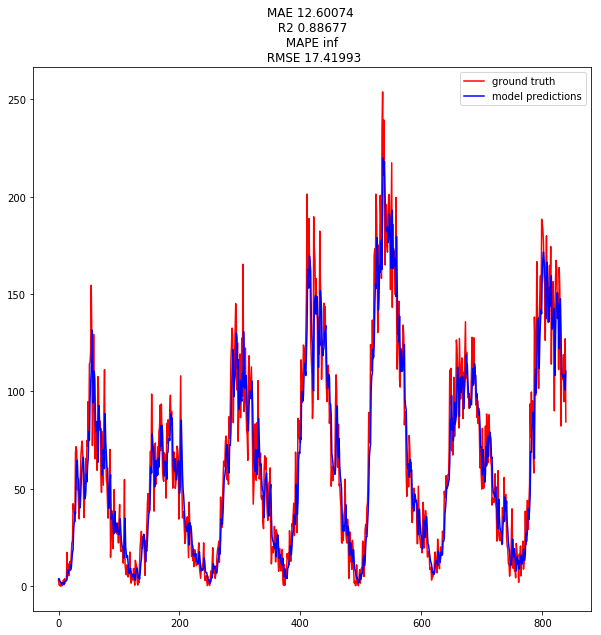

MAE 10.0316
R2 0.8324
RMSE 13.8679
[0.9960588] 1.337841




Plot, with Optimizer.
(840,) (840,)


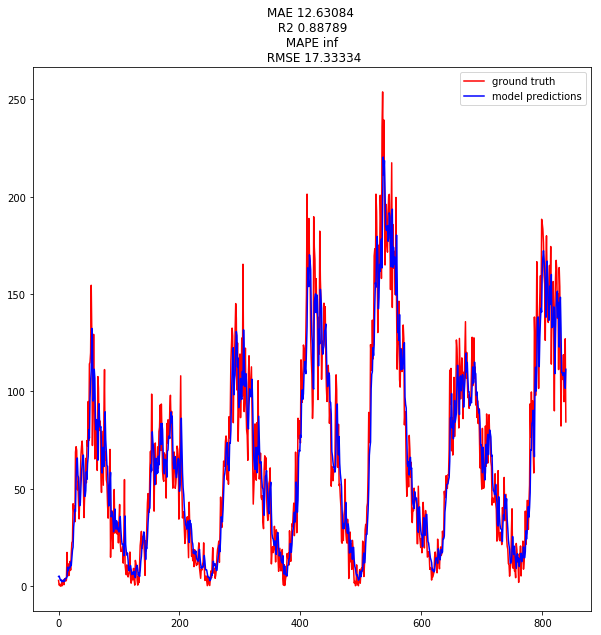

Done saving the results
Inside model_creation
Inside func :  {'optimizer': 'Adamax', 'lr': 1.024e-07}
Check
Train on 1959 samples, validate on 840 samples
Epoch 1/6000
1959/1959 [==============================] - 9s 4ms/step - loss: 44.5607 - mean_absolute_error: 45.0423 - rmse: 45.0423 - val_loss: 64.8085 - val_mean_absolute_error: 65.3042 - val_rmse: 65.3042
Epoch 2/6000
1959/1959 [==============================] - 1s 376us/step - loss: 44.5451 - mean_absolute_error: 45.0267 - rmse: 45.0267 - val_loss: 64.7818 - val_mean_absolute_error: 65.2775 - val_rmse: 65.2775
Epoch 3/6000
1959/1959 [==============================] - 1s 354us/step - loss: 44.5267 - mean_absolute_error: 45.0083 - rmse: 45.0083 - val_loss: 64.7504 - val_mean_absolute_error: 65.2462 - val_rmse: 65.2462
Epoch 4/6000
1959/1959 [==============================] - 1s 351us/step - loss: 44.5053 - mean_absolute_error: 44.9869 - rmse: 44.9869 - val_loss: 64.7144 - val_mean_absolute_error: 65.2101 - val_rmse: 65.2101
Epoch 5

Epoch 78/6000
1959/1959 [==============================] - 1s 359us/step - loss: 41.8412 - mean_absolute_error: 42.3258 - rmse: 42.3258 - val_loss: 60.8119 - val_mean_absolute_error: 61.3066 - val_rmse: 61.3066
Epoch 79/6000
1959/1959 [==============================] - 1s 364us/step - loss: 41.8016 - mean_absolute_error: 42.2862 - rmse: 42.2862 - val_loss: 60.7543 - val_mean_absolute_error: 61.2490 - val_rmse: 61.2490
Epoch 80/6000
1959/1959 [==============================] - 1s 364us/step - loss: 41.7617 - mean_absolute_error: 42.2464 - rmse: 42.2464 - val_loss: 60.6972 - val_mean_absolute_error: 61.1919 - val_rmse: 61.1919
Epoch 81/6000
1959/1959 [==============================] - 1s 352us/step - loss: 41.7233 - mean_absolute_error: 42.2080 - rmse: 42.2080 - val_loss: 60.6443 - val_mean_absolute_error: 61.1391 - val_rmse: 61.1391
Epoch 82/6000
1959/1959 [==============================] - 1s 354us/step - loss: 41.6864 - mean_absolute_error: 42.1712 - rmse: 42.1712 - val_loss: 60.5906 

Epoch 117/6000
1959/1959 [==============================] - 1s 358us/step - loss: 40.2424 - mean_absolute_error: 40.7286 - rmse: 40.7286 - val_loss: 58.5085 - val_mean_absolute_error: 59.0034 - val_rmse: 59.0034
Epoch 118/6000
1959/1959 [==============================] - 1s 356us/step - loss: 40.2015 - mean_absolute_error: 40.6878 - rmse: 40.6878 - val_loss: 58.4500 - val_mean_absolute_error: 58.9449 - val_rmse: 58.9449
Epoch 119/6000
1959/1959 [==============================] - 1s 354us/step - loss: 40.1598 - mean_absolute_error: 40.6462 - rmse: 40.6462 - val_loss: 58.3884 - val_mean_absolute_error: 58.8833 - val_rmse: 58.8833
Epoch 120/6000
1959/1959 [==============================] - 1s 351us/step - loss: 40.1164 - mean_absolute_error: 40.6027 - rmse: 40.6027 - val_loss: 58.3248 - val_mean_absolute_error: 58.8196 - val_rmse: 58.8196
Epoch 121/6000
1959/1959 [==============================] - 1s 346us/step - loss: 40.0720 - mean_absolute_error: 40.5584 - rmse: 40.5584 - val_loss: 58.

Epoch 156/6000
1959/1959 [==============================] - 1s 346us/step - loss: 38.4569 - mean_absolute_error: 38.9440 - rmse: 38.9440 - val_loss: 55.9331 - val_mean_absolute_error: 56.4281 - val_rmse: 56.4281
Epoch 157/6000
1959/1959 [==============================] - 1s 350us/step - loss: 38.4089 - mean_absolute_error: 38.8961 - rmse: 38.8961 - val_loss: 55.8623 - val_mean_absolute_error: 56.3573 - val_rmse: 56.3573
Epoch 158/6000
1959/1959 [==============================] - 1s 340us/step - loss: 38.3594 - mean_absolute_error: 38.8466 - rmse: 38.8466 - val_loss: 55.7902 - val_mean_absolute_error: 56.2852 - val_rmse: 56.2852
Epoch 159/6000
1959/1959 [==============================] - 1s 341us/step - loss: 38.3098 - mean_absolute_error: 38.7969 - rmse: 38.7969 - val_loss: 55.7202 - val_mean_absolute_error: 56.2152 - val_rmse: 56.2152
Epoch 160/6000
1959/1959 [==============================] - 1s 358us/step - loss: 38.2645 - mean_absolute_error: 38.7517 - rmse: 38.7517 - val_loss: 55.

Epoch 195/6000
1959/1959 [==============================] - 1s 355us/step - loss: 36.5050 - mean_absolute_error: 36.9921 - rmse: 36.9921 - val_loss: 53.1167 - val_mean_absolute_error: 53.6111 - val_rmse: 53.6111
Epoch 196/6000
1959/1959 [==============================] - 1s 344us/step - loss: 36.4520 - mean_absolute_error: 36.9391 - rmse: 36.9391 - val_loss: 53.0396 - val_mean_absolute_error: 53.5341 - val_rmse: 53.5341
Epoch 197/6000
1959/1959 [==============================] - 1s 347us/step - loss: 36.3972 - mean_absolute_error: 36.8843 - rmse: 36.8843 - val_loss: 52.9589 - val_mean_absolute_error: 53.4534 - val_rmse: 53.4534
Epoch 198/6000
1959/1959 [==============================] - 1s 358us/step - loss: 36.3406 - mean_absolute_error: 36.8276 - rmse: 36.8276 - val_loss: 52.8777 - val_mean_absolute_error: 53.3723 - val_rmse: 53.3723
Epoch 199/6000
1959/1959 [==============================] - 1s 377us/step - loss: 36.2849 - mean_absolute_error: 36.7720 - rmse: 36.7720 - val_loss: 52.

Epoch 234/6000
1959/1959 [==============================] - 1s 347us/step - loss: 34.1833 - mean_absolute_error: 34.6711 - rmse: 34.6711 - val_loss: 49.7559 - val_mean_absolute_error: 50.2503 - val_rmse: 50.2503
Epoch 235/6000
1959/1959 [==============================] - 1s 349us/step - loss: 34.1198 - mean_absolute_error: 34.6076 - rmse: 34.6076 - val_loss: 49.6626 - val_mean_absolute_error: 50.1569 - val_rmse: 50.1569
Epoch 236/6000
1959/1959 [==============================] - 1s 350us/step - loss: 34.0549 - mean_absolute_error: 34.5427 - rmse: 34.5427 - val_loss: 49.5674 - val_mean_absolute_error: 50.0616 - val_rmse: 50.0616
Epoch 237/6000
1959/1959 [==============================] - 1s 348us/step - loss: 33.9887 - mean_absolute_error: 34.4766 - rmse: 34.4766 - val_loss: 49.4703 - val_mean_absolute_error: 49.9646 - val_rmse: 49.9646
Epoch 238/6000
1959/1959 [==============================] - 1s 347us/step - loss: 33.9211 - mean_absolute_error: 34.4090 - rmse: 34.4090 - val_loss: 49.

Epoch 273/6000
1959/1959 [==============================] - 1s 346us/step - loss: 31.5167 - mean_absolute_error: 32.0039 - rmse: 32.0039 - val_loss: 45.8818 - val_mean_absolute_error: 46.3757 - val_rmse: 46.3757
Epoch 274/6000
1959/1959 [==============================] - 1s 350us/step - loss: 31.4429 - mean_absolute_error: 31.9300 - rmse: 31.9300 - val_loss: 45.7726 - val_mean_absolute_error: 46.2665 - val_rmse: 46.2665
Epoch 275/6000
1959/1959 [==============================] - 1s 348us/step - loss: 31.3686 - mean_absolute_error: 31.8555 - rmse: 31.8555 - val_loss: 45.6671 - val_mean_absolute_error: 46.1610 - val_rmse: 46.1610
Epoch 276/6000
1959/1959 [==============================] - 1s 350us/step - loss: 31.2954 - mean_absolute_error: 31.7822 - rmse: 31.7822 - val_loss: 45.5597 - val_mean_absolute_error: 46.0536 - val_rmse: 46.0536
Epoch 277/6000
1959/1959 [==============================] - 1s 344us/step - loss: 31.2222 - mean_absolute_error: 31.7089 - rmse: 31.7089 - val_loss: 45.

Epoch 312/6000
1959/1959 [==============================] - 1s 350us/step - loss: 28.5106 - mean_absolute_error: 28.9983 - rmse: 28.9983 - val_loss: 41.4925 - val_mean_absolute_error: 41.9891 - val_rmse: 41.9891
Epoch 313/6000
1959/1959 [==============================] - 1s 361us/step - loss: 28.4280 - mean_absolute_error: 28.9159 - rmse: 28.9159 - val_loss: 41.3690 - val_mean_absolute_error: 41.8658 - val_rmse: 41.8658
Epoch 314/6000
1959/1959 [==============================] - 1s 347us/step - loss: 28.3435 - mean_absolute_error: 28.8317 - rmse: 28.8317 - val_loss: 41.2485 - val_mean_absolute_error: 41.7454 - val_rmse: 41.7454
Epoch 315/6000
1959/1959 [==============================] - 1s 348us/step - loss: 28.2678 - mean_absolute_error: 28.7560 - rmse: 28.7560 - val_loss: 41.1453 - val_mean_absolute_error: 41.6423 - val_rmse: 41.6423
Epoch 316/6000
1959/1959 [==============================] - 1s 347us/step - loss: 28.1964 - mean_absolute_error: 28.6848 - rmse: 28.6848 - val_loss: 41.

Epoch 351/6000
1959/1959 [==============================] - 1s 347us/step - loss: 25.2192 - mean_absolute_error: 25.7087 - rmse: 25.7087 - val_loss: 36.6378 - val_mean_absolute_error: 37.1320 - val_rmse: 37.1320
Epoch 352/6000
1959/1959 [==============================] - 1s 349us/step - loss: 25.1242 - mean_absolute_error: 25.6135 - rmse: 25.6135 - val_loss: 36.5015 - val_mean_absolute_error: 36.9958 - val_rmse: 36.9958
Epoch 353/6000
1959/1959 [==============================] - 1s 350us/step - loss: 25.0395 - mean_absolute_error: 25.5288 - rmse: 25.5288 - val_loss: 36.3871 - val_mean_absolute_error: 36.8814 - val_rmse: 36.8814
Epoch 354/6000
1959/1959 [==============================] - 1s 345us/step - loss: 24.9609 - mean_absolute_error: 25.4502 - rmse: 25.4502 - val_loss: 36.2667 - val_mean_absolute_error: 36.7610 - val_rmse: 36.7610
Epoch 355/6000
1959/1959 [==============================] - 1s 348us/step - loss: 24.8776 - mean_absolute_error: 25.3669 - rmse: 25.3669 - val_loss: 36.

Epoch 390/6000
1959/1959 [==============================] - 1s 356us/step - loss: 21.6317 - mean_absolute_error: 22.1205 - rmse: 22.1205 - val_loss: 31.2661 - val_mean_absolute_error: 31.7593 - val_rmse: 31.7593
Epoch 391/6000
1959/1959 [==============================] - 1s 349us/step - loss: 21.5388 - mean_absolute_error: 22.0276 - rmse: 22.0276 - val_loss: 31.1256 - val_mean_absolute_error: 31.6195 - val_rmse: 31.6195
Epoch 392/6000
1959/1959 [==============================] - 1s 359us/step - loss: 21.4461 - mean_absolute_error: 21.9347 - rmse: 21.9347 - val_loss: 30.9859 - val_mean_absolute_error: 31.4802 - val_rmse: 31.4802
Epoch 393/6000
1959/1959 [==============================] - 1s 358us/step - loss: 21.3529 - mean_absolute_error: 21.8414 - rmse: 21.8414 - val_loss: 30.8440 - val_mean_absolute_error: 31.3385 - val_rmse: 31.3385
Epoch 394/6000
1959/1959 [==============================] - 1s 355us/step - loss: 21.2571 - mean_absolute_error: 21.7456 - rmse: 21.7456 - val_loss: 30.

Epoch 429/6000
1959/1959 [==============================] - 1s 342us/step - loss: 18.3184 - mean_absolute_error: 18.8057 - rmse: 18.8057 - val_loss: 26.2685 - val_mean_absolute_error: 26.7575 - val_rmse: 26.7575
Epoch 430/6000
1959/1959 [==============================] - 1s 350us/step - loss: 18.2248 - mean_absolute_error: 18.7121 - rmse: 18.7121 - val_loss: 26.1273 - val_mean_absolute_error: 26.6158 - val_rmse: 26.6158
Epoch 431/6000
1959/1959 [==============================] - 1s 358us/step - loss: 18.1340 - mean_absolute_error: 18.6209 - rmse: 18.6209 - val_loss: 25.9942 - val_mean_absolute_error: 26.4824 - val_rmse: 26.4824
Epoch 432/6000
1959/1959 [==============================] - 1s 362us/step - loss: 18.0518 - mean_absolute_error: 18.5384 - rmse: 18.5384 - val_loss: 25.8744 - val_mean_absolute_error: 26.3626 - val_rmse: 26.3626
Epoch 433/6000
1959/1959 [==============================] - 1s 366us/step - loss: 17.9715 - mean_absolute_error: 18.4579 - rmse: 18.4579 - val_loss: 25.

Epoch 468/6000
1959/1959 [==============================] - 1s 354us/step - loss: 15.3269 - mean_absolute_error: 15.8147 - rmse: 15.8147 - val_loss: 21.7292 - val_mean_absolute_error: 22.2221 - val_rmse: 22.2221
Epoch 469/6000
1959/1959 [==============================] - 1s 353us/step - loss: 15.2608 - mean_absolute_error: 15.7485 - rmse: 15.7485 - val_loss: 21.6304 - val_mean_absolute_error: 22.1232 - val_rmse: 22.1232
Epoch 470/6000
1959/1959 [==============================] - 1s 348us/step - loss: 15.1978 - mean_absolute_error: 15.6852 - rmse: 15.6852 - val_loss: 21.5344 - val_mean_absolute_error: 22.0263 - val_rmse: 22.0263
Epoch 471/6000
1959/1959 [==============================] - 1s 341us/step - loss: 15.1363 - mean_absolute_error: 15.6235 - rmse: 15.6235 - val_loss: 21.4397 - val_mean_absolute_error: 21.9312 - val_rmse: 21.9312
Epoch 472/6000
1959/1959 [==============================] - 1s 347us/step - loss: 15.0755 - mean_absolute_error: 15.5629 - rmse: 15.5629 - val_loss: 21.

Epoch 507/6000
1959/1959 [==============================] - 1s 355us/step - loss: 13.3292 - mean_absolute_error: 13.8185 - rmse: 13.8185 - val_loss: 18.6130 - val_mean_absolute_error: 19.1066 - val_rmse: 19.1066
Epoch 508/6000
1959/1959 [==============================] - 1s 352us/step - loss: 13.2888 - mean_absolute_error: 13.7783 - rmse: 13.7783 - val_loss: 18.5534 - val_mean_absolute_error: 19.0468 - val_rmse: 19.0468
Epoch 509/6000
1959/1959 [==============================] - 1s 350us/step - loss: 13.2501 - mean_absolute_error: 13.7396 - rmse: 13.7396 - val_loss: 18.5002 - val_mean_absolute_error: 18.9932 - val_rmse: 18.9932
Epoch 510/6000
1959/1959 [==============================] - 1s 354us/step - loss: 13.2167 - mean_absolute_error: 13.7061 - rmse: 13.7061 - val_loss: 18.4509 - val_mean_absolute_error: 18.9436 - val_rmse: 18.9436
Epoch 511/6000
1959/1959 [==============================] - 1s 361us/step - loss: 13.1825 - mean_absolute_error: 13.6719 - rmse: 13.6719 - val_loss: 18.

Epoch 546/6000
1959/1959 [==============================] - 1s 353us/step - loss: 12.3855 - mean_absolute_error: 12.8737 - rmse: 12.8737 - val_loss: 17.2145 - val_mean_absolute_error: 17.7089 - val_rmse: 17.7089
Epoch 547/6000
1959/1959 [==============================] - 1s 365us/step - loss: 12.3710 - mean_absolute_error: 12.8596 - rmse: 12.8596 - val_loss: 17.1909 - val_mean_absolute_error: 17.6853 - val_rmse: 17.6853
Epoch 548/6000
1959/1959 [==============================] - 1s 373us/step - loss: 12.3581 - mean_absolute_error: 12.8466 - rmse: 12.8466 - val_loss: 17.1691 - val_mean_absolute_error: 17.6633 - val_rmse: 17.6633
Epoch 549/6000
1959/1959 [==============================] - 1s 368us/step - loss: 12.3451 - mean_absolute_error: 12.8336 - rmse: 12.8336 - val_loss: 17.1464 - val_mean_absolute_error: 17.6402 - val_rmse: 17.6402
Epoch 550/6000
1959/1959 [==============================] - 1s 363us/step - loss: 12.3330 - mean_absolute_error: 12.8215 - rmse: 12.8215 - val_loss: 17.

Epoch 585/6000
1959/1959 [==============================] - 1s 355us/step - loss: 12.1196 - mean_absolute_error: 12.6063 - rmse: 12.6063 - val_loss: 16.7204 - val_mean_absolute_error: 17.2146 - val_rmse: 17.2146
Epoch 586/6000
1959/1959 [==============================] - 1s 355us/step - loss: 12.1160 - mean_absolute_error: 12.6029 - rmse: 12.6029 - val_loss: 16.7118 - val_mean_absolute_error: 17.2060 - val_rmse: 17.2060
Epoch 587/6000
1959/1959 [==============================] - 1s 357us/step - loss: 12.1121 - mean_absolute_error: 12.5991 - rmse: 12.5991 - val_loss: 16.7032 - val_mean_absolute_error: 17.1973 - val_rmse: 17.1973
Epoch 588/6000
1959/1959 [==============================] - 1s 353us/step - loss: 12.1081 - mean_absolute_error: 12.5953 - rmse: 12.5953 - val_loss: 16.6961 - val_mean_absolute_error: 17.1902 - val_rmse: 17.1902
Epoch 589/6000
1959/1959 [==============================] - 1s 344us/step - loss: 12.1048 - mean_absolute_error: 12.5922 - rmse: 12.5922 - val_loss: 16.

Epoch 624/6000
1959/1959 [==============================] - 1s 353us/step - loss: 12.0221 - mean_absolute_error: 12.5100 - rmse: 12.5100 - val_loss: 16.5107 - val_mean_absolute_error: 17.0027 - val_rmse: 17.0027
Epoch 625/6000
1959/1959 [==============================] - 1s 359us/step - loss: 12.0203 - mean_absolute_error: 12.5082 - rmse: 12.5082 - val_loss: 16.5077 - val_mean_absolute_error: 16.9996 - val_rmse: 16.9996
Epoch 626/6000
1959/1959 [==============================] - 1s 350us/step - loss: 12.0186 - mean_absolute_error: 12.5064 - rmse: 12.5064 - val_loss: 16.5043 - val_mean_absolute_error: 16.9962 - val_rmse: 16.9962
Epoch 627/6000
1959/1959 [==============================] - 1s 350us/step - loss: 12.0176 - mean_absolute_error: 12.5055 - rmse: 12.5055 - val_loss: 16.5009 - val_mean_absolute_error: 16.9928 - val_rmse: 16.9928
Epoch 628/6000
1959/1959 [==============================] - 1s 349us/step - loss: 12.0160 - mean_absolute_error: 12.5040 - rmse: 12.5040 - val_loss: 16.

Epoch 663/6000
1959/1959 [==============================] - 1s 352us/step - loss: 11.9713 - mean_absolute_error: 12.4589 - rmse: 12.4589 - val_loss: 16.3897 - val_mean_absolute_error: 16.8806 - val_rmse: 16.8806
Epoch 664/6000
1959/1959 [==============================] - 1s 367us/step - loss: 11.9706 - mean_absolute_error: 12.4580 - rmse: 12.4580 - val_loss: 16.3862 - val_mean_absolute_error: 16.8770 - val_rmse: 16.8770
Epoch 665/6000
1959/1959 [==============================] - 1s 349us/step - loss: 11.9691 - mean_absolute_error: 12.4567 - rmse: 12.4567 - val_loss: 16.3837 - val_mean_absolute_error: 16.8746 - val_rmse: 16.8746
Epoch 666/6000
1959/1959 [==============================] - 1s 353us/step - loss: 11.9677 - mean_absolute_error: 12.4552 - rmse: 12.4552 - val_loss: 16.3816 - val_mean_absolute_error: 16.8724 - val_rmse: 16.8724
Epoch 667/6000
1959/1959 [==============================] - 1s 355us/step - loss: 11.9669 - mean_absolute_error: 12.4545 - rmse: 12.4545 - val_loss: 16.

Epoch 702/6000
1959/1959 [==============================] - 1s 348us/step - loss: 11.9347 - mean_absolute_error: 12.4219 - rmse: 12.4219 - val_loss: 16.3097 - val_mean_absolute_error: 16.8014 - val_rmse: 16.8014
Epoch 703/6000
1959/1959 [==============================] - 1s 356us/step - loss: 11.9340 - mean_absolute_error: 12.4211 - rmse: 12.4211 - val_loss: 16.3078 - val_mean_absolute_error: 16.7994 - val_rmse: 16.7994
Epoch 704/6000
1959/1959 [==============================] - 1s 346us/step - loss: 11.9329 - mean_absolute_error: 12.4201 - rmse: 12.4201 - val_loss: 16.3058 - val_mean_absolute_error: 16.7975 - val_rmse: 16.7975
Epoch 705/6000
1959/1959 [==============================] - 1s 355us/step - loss: 11.9322 - mean_absolute_error: 12.4193 - rmse: 12.4193 - val_loss: 16.3039 - val_mean_absolute_error: 16.7955 - val_rmse: 16.7955
Epoch 706/6000
1959/1959 [==============================] - 1s 348us/step - loss: 11.9317 - mean_absolute_error: 12.4188 - rmse: 12.4188 - val_loss: 16.

Epoch 741/6000
1959/1959 [==============================] - 1s 354us/step - loss: 11.9044 - mean_absolute_error: 12.3913 - rmse: 12.3913 - val_loss: 16.2506 - val_mean_absolute_error: 16.7417 - val_rmse: 16.7417
Epoch 742/6000
1959/1959 [==============================] - 1s 359us/step - loss: 11.9038 - mean_absolute_error: 12.3906 - rmse: 12.3906 - val_loss: 16.2496 - val_mean_absolute_error: 16.7406 - val_rmse: 16.7406
Epoch 743/6000
1959/1959 [==============================] - 1s 357us/step - loss: 11.9023 - mean_absolute_error: 12.3890 - rmse: 12.3890 - val_loss: 16.2478 - val_mean_absolute_error: 16.7388 - val_rmse: 16.7388
Epoch 744/6000
1959/1959 [==============================] - 1s 355us/step - loss: 11.9019 - mean_absolute_error: 12.3888 - rmse: 12.3888 - val_loss: 16.2460 - val_mean_absolute_error: 16.7370 - val_rmse: 16.7370
Epoch 745/6000
1959/1959 [==============================] - 1s 353us/step - loss: 11.9008 - mean_absolute_error: 12.3877 - rmse: 12.3877 - val_loss: 16.

Epoch 780/6000
1959/1959 [==============================] - 1s 346us/step - loss: 11.8743 - mean_absolute_error: 12.3607 - rmse: 12.3607 - val_loss: 16.1989 - val_mean_absolute_error: 16.6897 - val_rmse: 16.6897
Epoch 781/6000
1959/1959 [==============================] - 1s 346us/step - loss: 11.8736 - mean_absolute_error: 12.3600 - rmse: 12.3600 - val_loss: 16.1977 - val_mean_absolute_error: 16.6887 - val_rmse: 16.6887
Epoch 782/6000
1959/1959 [==============================] - 1s 352us/step - loss: 11.8730 - mean_absolute_error: 12.3594 - rmse: 12.3594 - val_loss: 16.1961 - val_mean_absolute_error: 16.6870 - val_rmse: 16.6870
Epoch 783/6000
1959/1959 [==============================] - 1s 348us/step - loss: 11.8721 - mean_absolute_error: 12.3584 - rmse: 12.3584 - val_loss: 16.1942 - val_mean_absolute_error: 16.6850 - val_rmse: 16.6850
Epoch 784/6000
1959/1959 [==============================] - 1s 362us/step - loss: 11.8710 - mean_absolute_error: 12.3574 - rmse: 12.3574 - val_loss: 16.

Epoch 819/6000
1959/1959 [==============================] - 1s 352us/step - loss: 11.8456 - mean_absolute_error: 12.3318 - rmse: 12.3318 - val_loss: 16.1475 - val_mean_absolute_error: 16.6385 - val_rmse: 16.6385
Epoch 820/6000
1959/1959 [==============================] - 1s 356us/step - loss: 11.8443 - mean_absolute_error: 12.3307 - rmse: 12.3307 - val_loss: 16.1460 - val_mean_absolute_error: 16.6370 - val_rmse: 16.6370
Epoch 821/6000
1959/1959 [==============================] - 1s 352us/step - loss: 11.8437 - mean_absolute_error: 12.3301 - rmse: 12.3301 - val_loss: 16.1454 - val_mean_absolute_error: 16.6366 - val_rmse: 16.6366
Epoch 822/6000
1959/1959 [==============================] - 1s 356us/step - loss: 11.8426 - mean_absolute_error: 12.3290 - rmse: 12.3290 - val_loss: 16.1439 - val_mean_absolute_error: 16.6349 - val_rmse: 16.6349
Epoch 823/6000
1959/1959 [==============================] - 1s 359us/step - loss: 11.8419 - mean_absolute_error: 12.3282 - rmse: 12.3282 - val_loss: 16.

Epoch 858/6000
1959/1959 [==============================] - 1s 364us/step - loss: 11.8158 - mean_absolute_error: 12.3021 - rmse: 12.3021 - val_loss: 16.0990 - val_mean_absolute_error: 16.5907 - val_rmse: 16.5907
Epoch 859/6000
1959/1959 [==============================] - 1s 374us/step - loss: 11.8147 - mean_absolute_error: 12.3011 - rmse: 12.3011 - val_loss: 16.0975 - val_mean_absolute_error: 16.5892 - val_rmse: 16.5892
Epoch 860/6000
1959/1959 [==============================] - 1s 353us/step - loss: 11.8147 - mean_absolute_error: 12.3011 - rmse: 12.3011 - val_loss: 16.0965 - val_mean_absolute_error: 16.5882 - val_rmse: 16.5882
Epoch 861/6000
1959/1959 [==============================] - 1s 361us/step - loss: 11.8135 - mean_absolute_error: 12.2999 - rmse: 12.2999 - val_loss: 16.0956 - val_mean_absolute_error: 16.5873 - val_rmse: 16.5873
Epoch 862/6000
1959/1959 [==============================] - 1s 370us/step - loss: 11.8129 - mean_absolute_error: 12.2993 - rmse: 12.2993 - val_loss: 16.

Epoch 897/6000
1959/1959 [==============================] - 1s 354us/step - loss: 11.7876 - mean_absolute_error: 12.2741 - rmse: 12.2741 - val_loss: 16.0521 - val_mean_absolute_error: 16.5439 - val_rmse: 16.5439
Epoch 898/6000
1959/1959 [==============================] - 1s 355us/step - loss: 11.7869 - mean_absolute_error: 12.2734 - rmse: 12.2734 - val_loss: 16.0508 - val_mean_absolute_error: 16.5426 - val_rmse: 16.5426
Epoch 899/6000
1959/1959 [==============================] - 1s 357us/step - loss: 11.7872 - mean_absolute_error: 12.2737 - rmse: 12.2737 - val_loss: 16.0498 - val_mean_absolute_error: 16.5416 - val_rmse: 16.5416
Epoch 900/6000
1959/1959 [==============================] - 1s 360us/step - loss: 11.7862 - mean_absolute_error: 12.2728 - rmse: 12.2728 - val_loss: 16.0491 - val_mean_absolute_error: 16.5410 - val_rmse: 16.5410
Epoch 901/6000
1959/1959 [==============================] - 1s 359us/step - loss: 11.7857 - mean_absolute_error: 12.2721 - rmse: 12.2721 - val_loss: 16.

Epoch 936/6000
1959/1959 [==============================] - 1s 347us/step - loss: 11.7642 - mean_absolute_error: 12.2507 - rmse: 12.2507 - val_loss: 16.0108 - val_mean_absolute_error: 16.5023 - val_rmse: 16.5023
Epoch 937/6000
1959/1959 [==============================] - 1s 349us/step - loss: 11.7633 - mean_absolute_error: 12.2498 - rmse: 12.2498 - val_loss: 16.0092 - val_mean_absolute_error: 16.5007 - val_rmse: 16.5007
Epoch 938/6000
1959/1959 [==============================] - 1s 364us/step - loss: 11.7628 - mean_absolute_error: 12.2493 - rmse: 12.2493 - val_loss: 16.0083 - val_mean_absolute_error: 16.4997 - val_rmse: 16.4997
Epoch 939/6000
1959/1959 [==============================] - 1s 358us/step - loss: 11.7626 - mean_absolute_error: 12.2491 - rmse: 12.2491 - val_loss: 16.0075 - val_mean_absolute_error: 16.4989 - val_rmse: 16.4989
Epoch 940/6000
1959/1959 [==============================] - 1s 358us/step - loss: 11.7621 - mean_absolute_error: 12.2487 - rmse: 12.2487 - val_loss: 16.

Epoch 975/6000
1959/1959 [==============================] - 1s 346us/step - loss: 11.7404 - mean_absolute_error: 12.2267 - rmse: 12.2267 - val_loss: 15.9697 - val_mean_absolute_error: 16.4611 - val_rmse: 16.4611
Epoch 976/6000
1959/1959 [==============================] - 1s 355us/step - loss: 11.7399 - mean_absolute_error: 12.2262 - rmse: 12.2262 - val_loss: 15.9685 - val_mean_absolute_error: 16.4599 - val_rmse: 16.4599
Epoch 977/6000
1959/1959 [==============================] - 1s 344us/step - loss: 11.7390 - mean_absolute_error: 12.2254 - rmse: 12.2254 - val_loss: 15.9680 - val_mean_absolute_error: 16.4594 - val_rmse: 16.4594
Epoch 978/6000
1959/1959 [==============================] - 1s 343us/step - loss: 11.7381 - mean_absolute_error: 12.2246 - rmse: 12.2246 - val_loss: 15.9673 - val_mean_absolute_error: 16.4588 - val_rmse: 16.4588
Epoch 979/6000
1959/1959 [==============================] - 1s 348us/step - loss: 11.7384 - mean_absolute_error: 12.2249 - rmse: 12.2249 - val_loss: 15.

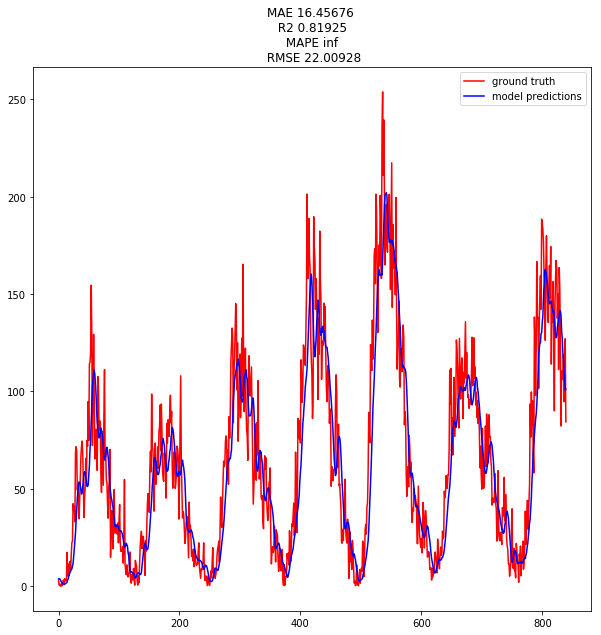

MAE 11.6798
R2 0.7751
RMSE 16.0632
[0.99037015] 2.559513




Plot, with Optimizer.
(840,) (840,)


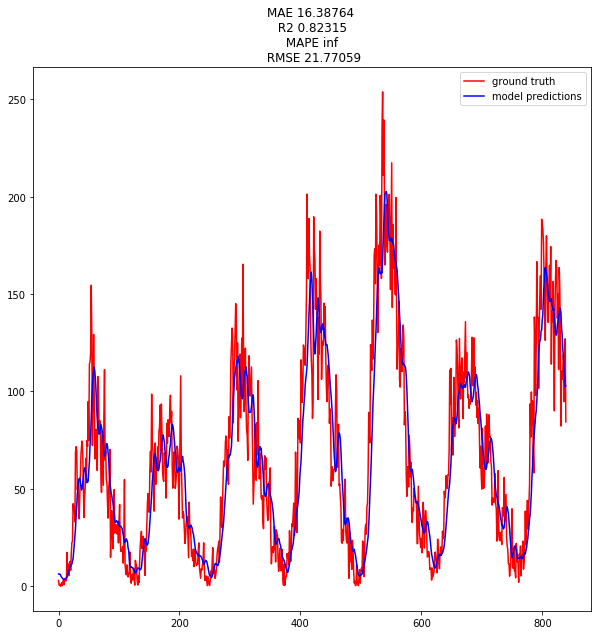

Done saving the results


In [4]:
#Grid Search over the optimizers and the learning rates.

val = 0.1

params = {
'optim' : ['SGD','RMSprop','Adamax'],
'lr' : [0.1, 0.001, 0.0001, 0.00001],
'epochs' : [100, 400, 1500, 6000]
}

optimizer_dict = {}

for optim in params['optim']:
    optimizer_dict[optim] = {}
    for i,lr_l in enumerate(params['momentum']):
        n_params = {}
        n_params['optimizer'] = optim
        n_params['lr'] = lr_l
        optimizer_dict[optim][lr_l] = results_collect(model_version="M3V1",dataset_name="Sunspot",callback_min_delta=0.05,patience_value=80,epoch_cnt=params['epochs'][i], params = n_params)


In [5]:
pkl.dump(optimizer_dict,open("gridSearch.pkl","wb"))

In [3]:
pkl.load(open("gridSearch.pkl","rb"))

{'SGD': {1.024e-07: [17.981646555832455, 0.7881000240954782]},
 'RMSprop': {1.024e-07: [14.809151139940536, 0.8536249703846558]},
 'Adagrad': {1.024e-07: [30.56177429335458, 0.3830539838092385]},
 'Adadelta': {1.024e-07: [24.412282667387096, 0.6015539735972155]},
 'Adam': {1.024e-07: [14.05105150767735, 0.8672472868085788]},
 'Adamax': {1.024e-07: [16.38763979979924, 0.8231503879077607]}}

In [ ]:
# data = pd.read_csv("PRSA_data_2010.1.1-2014.12.31.csv")['pm2.5'].reset_index(drop=True).dropna()
# data

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_5 (Conv1D)               (None, 6, 32)        192         input_3[0][0]                    
__________________________________________________________________________________________________
conv1d_7 (Conv1D)               (None, 6, 32)        192         input_4[0][0]                    
__________________________________________________________________________________________________
conv1d_6 (

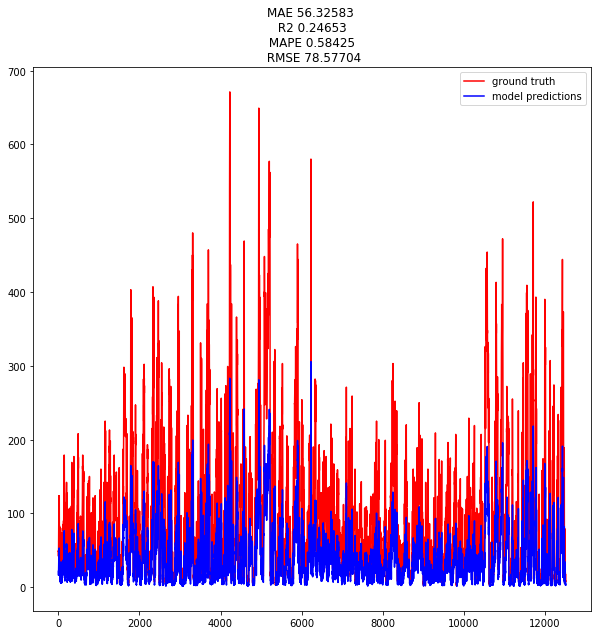

MAE 13.1994
R2 0.9378
RMSE 24.0136
[2.3114133] 5.4534683
(12521,) (12521,)


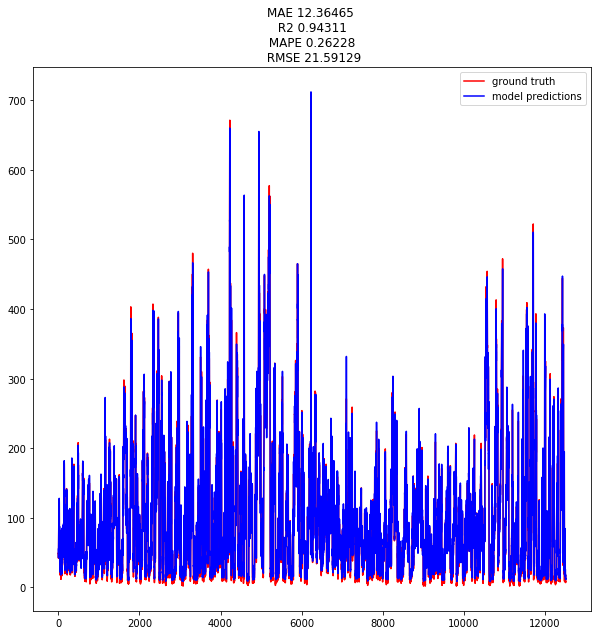

Done saving the results


In [6]:
results_collect(model_version="M1V1",dataset_name="PM2.5",callback_min_delta=0.01,patience_value=20,epoch_cnt=5)

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_9 (Conv1D)               (None, 6, 32)        192         input_5[0][0]                    
__________________________________________________________________________________________________
conv1d_10 (Conv1D)              (None, 5, 32)        2080        conv1d_9[0][0]                   
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 5, 32)        0           conv1d_10[0][0]                  
__________________________________________________________________________________________________
lstm_3 (LS

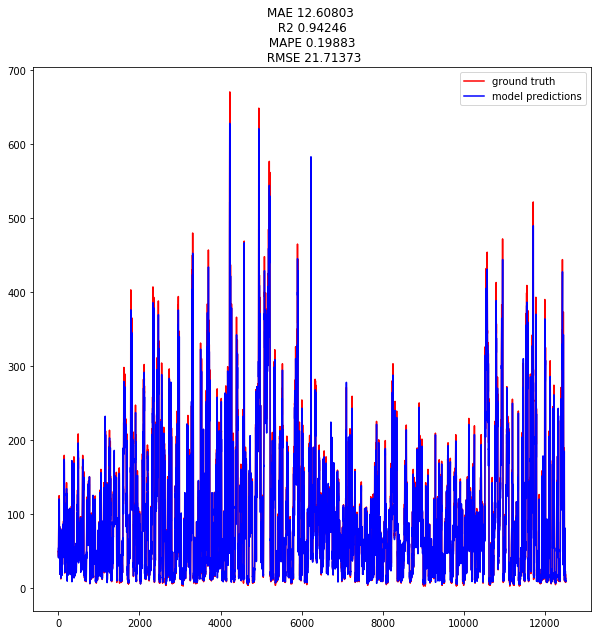

MAE 12.4819
R2 0.9409
RMSE 23.4056
[1.0279584] 2.6927338
(12521,) (12521,)


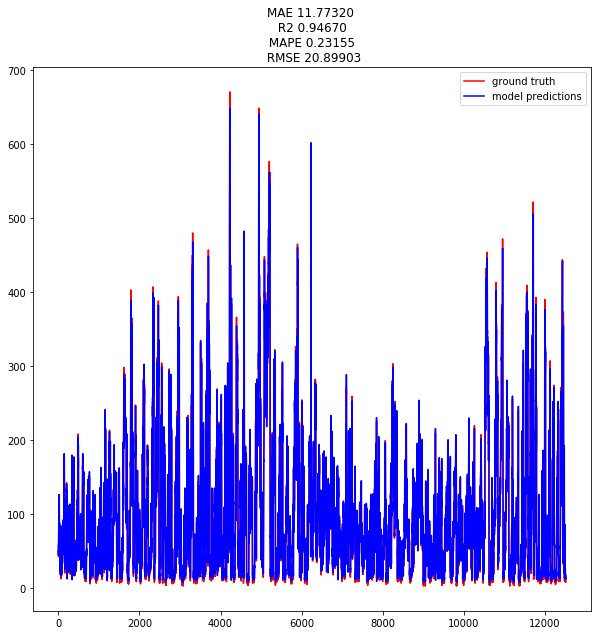

Done saving the results


In [7]:
results_collect(model_version="M3V1",dataset_name="PM2.5",callback_min_delta=0.01,patience_value=20,epoch_cnt=5)

# Global Land Temperature

## Univariate

Create formatted data : (df shape) (3180,)
Create time-stepped data : (d shape) (3159, 21, 1)
Create formatted data :  (3159, 10, 1) (3159, 10, 1) (3159,)
Dimensions of train and test :  (2211, 10, 1)   (948, 10, 1)   (2211,)   (948,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_53 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_54 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_81 (Conv1D)              (None, 6, 32)        192         input_53[0][0]                   
__________________________________________________

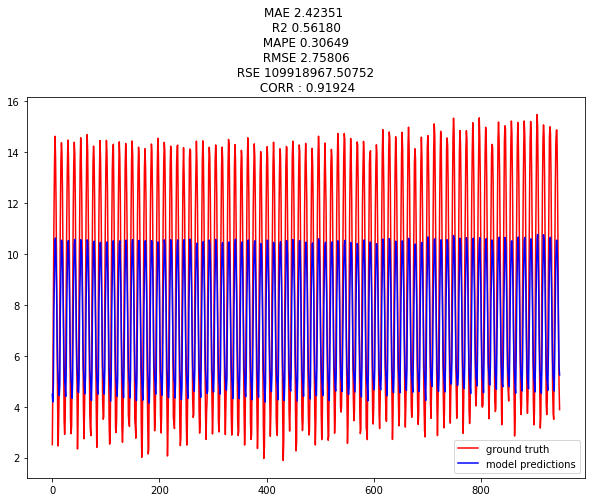

MAE 1.5616
R2 0.8182
RMSE 1.8257
[1.644519] -3.6666937




Plot, with Optimizer.
(948,) (948,)


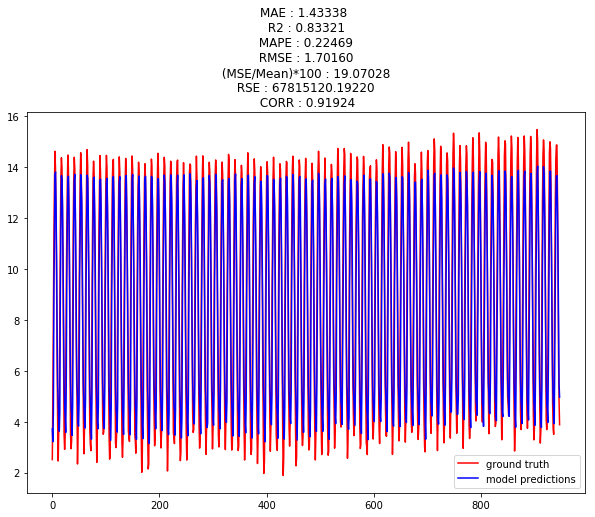

Done saving the results


[1.433382693041226, 0.8332054671824374, 1.701598570593932, 19.0702814884566]

In [40]:
results_collect(model_version="M1V1",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=50,optim = Adam(lr = 0.01))

Create formatted data : (df shape) (3180,)
Create time-stepped data : (d shape) (3159, 21, 1)
Create formatted data :  (3159, 10, 1) (3159, 10, 1) (3159,)
Dimensions of train and test :  (2211, 10, 1)   (948, 10, 1)   (2211,)   (948,)
Inside model_creation
Check
Train on 2211 samples, validate on 948 samples
Epoch 1/5
2211/2211 [==============================] - 3s 1ms/step - loss: 9.6817 - mean_absolute_error: 10.1721 - rmse: 10.1721 - val_loss: 3.4378 - val_mean_absolute_error: 3.9272 - val_rmse: 3.9272
Epoch 2/5
2211/2211 [==============================] - 1s 297us/step - loss: 0.6765 - mean_absolute_error: 1.0706 - rmse: 1.0706 - val_loss: 3.9482 - val_mean_absolute_error: 4.4382 - val_rmse: 4.4382
Epoch 3/5
2211/2211 [==============================] - 1s 299us/step - loss: 0.6104 - mean_absolute_error: 1.0047 - rmse: 1.0047 - val_loss: 2.3803 - val_mean_absolute_error: 2.8261 - val_rmse: 2.8261
Epoch 4/5
2211/2211 [==============================] - 1s 286us/step - loss: 0.4532 - m

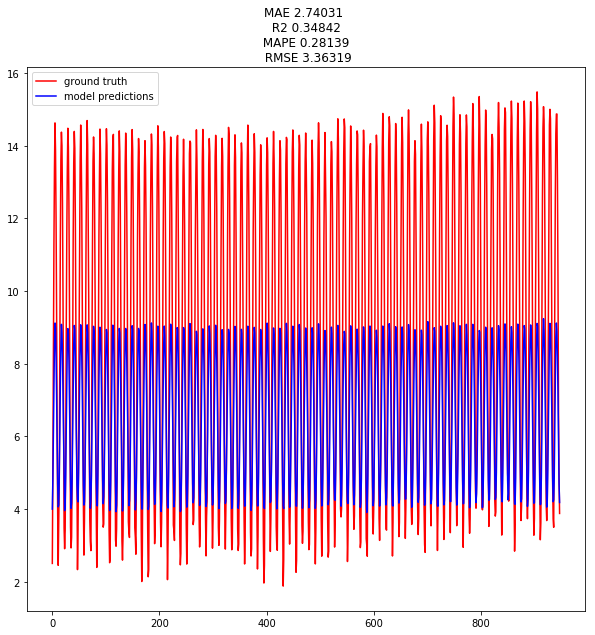

MAE 0.4914
R2 0.9790
RMSE 0.6199
[2.304675] -6.947463




Plot, with Optimizer.
(948,) (948,)


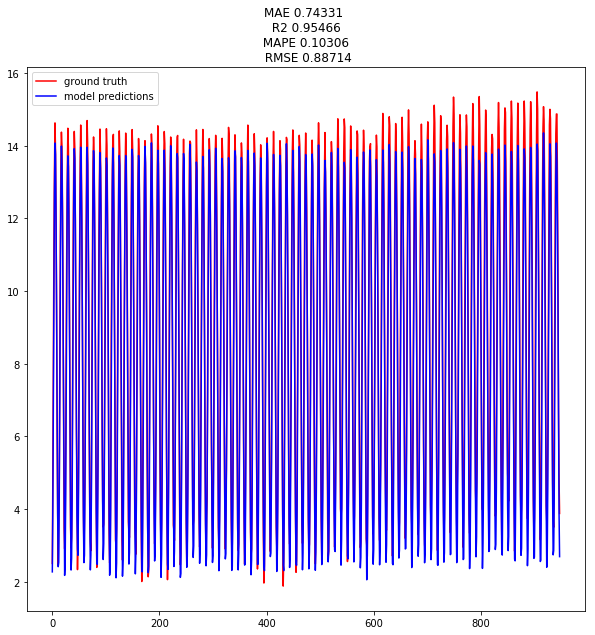

Done saving the results


[0.743305082868423, 0.954662785621639]

In [13]:
results_collect(model_version="M1V1",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=5,optim = Adam(lr = 0.01))

Create formatted data : (df shape) (3180,)
Create time-stepped data : (d shape) (3159, 21, 1)
Create formatted data :  (3159, 10, 1) (3159, 10, 1) (3159,)
Dimensions of train and test :  (2211, 10, 1)   (948, 10, 1)   (2211,)   (948,)
Inside model_creation
Check
Train on 2211 samples, validate on 948 samples
Epoch 1/9
2211/2211 [==============================] - 8s 4ms/step - loss: 4.9339 - mean_absolute_error: 5.4041 - mean_squared_error: 61.1919 - rmse: 6.2802 - val_loss: 0.1918 - val_mean_absolute_error: 0.5097 - val_mean_squared_error: 0.3929 - val_rmse: 0.6244
Epoch 2/9
2211/2211 [==============================] - 3s 1ms/step - loss: 0.6246 - mean_absolute_error: 1.0101 - mean_squared_error: 1.9107 - rmse: 1.3209 - val_loss: 3.1313 - val_mean_absolute_error: 3.6295 - val_mean_squared_error: 15.7703 - val_rmse: 3.9599
Epoch 3/9
2211/2211 [==============================] - 3s 1ms/step - loss: 0.9804 - mean_absolute_error: 1.3943 - mean_squared_error: 3.4711 - rmse: 1.7177 - val_loss

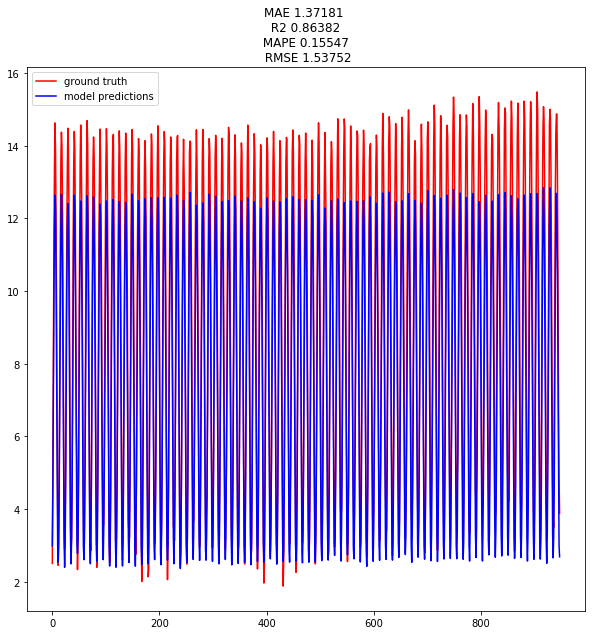

MAE 0.3595
R2 0.9884
RMSE 0.4612
[1.1945609] -0.796154




Plot, with Optimizer.
(948,) (948,)


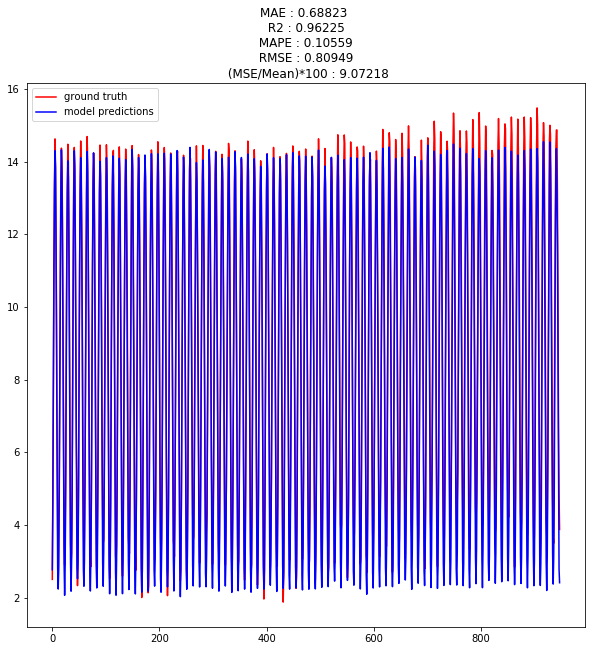

Done saving the results


[0.6882312903726149, 0.96225230431717, 0.8094898899206119, 9.072175029776593]

In [17]:
results_collect(model_version="M3V1",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=9,optim = Adam(lr = 0.01))

Inside model_creation
Check
Train on 2211 samples, validate on 948 samples
Epoch 1/10
2211/2211 [==============================] - 7s 3ms/step - loss: 7.8810 - mean_absolute_error: 8.3598 - rmse: 8.3598 - val_loss: 4.0715 - val_mean_absolute_error: 4.5031 - val_rmse: 4.5031
Epoch 2/10
2211/2211 [==============================] - 1s 275us/step - loss: 1.2776 - mean_absolute_error: 1.7081 - rmse: 1.7081 - val_loss: 5.5909 - val_mean_absolute_error: 6.0909 - val_rmse: 6.0909
Epoch 3/10
2211/2211 [==============================] - 1s 263us/step - loss: 1.1109 - mean_absolute_error: 1.5306 - rmse: 1.5306 - val_loss: 10.8102 - val_mean_absolute_error: 11.3102 - val_rmse: 11.3102
Epoch 4/10
2211/2211 [==============================] - 1s 277us/step - loss: 0.7262 - mean_absolute_error: 1.1199 - rmse: 1.1199 - val_loss: 3.7341 - val_mean_absolute_error: 4.2338 - val_rmse: 4.2338
Epoch 5/10
2211/2211 [==============================] - 1s 310us/step - loss: 0.4938 - mean_absolute_error: 0.8666 -

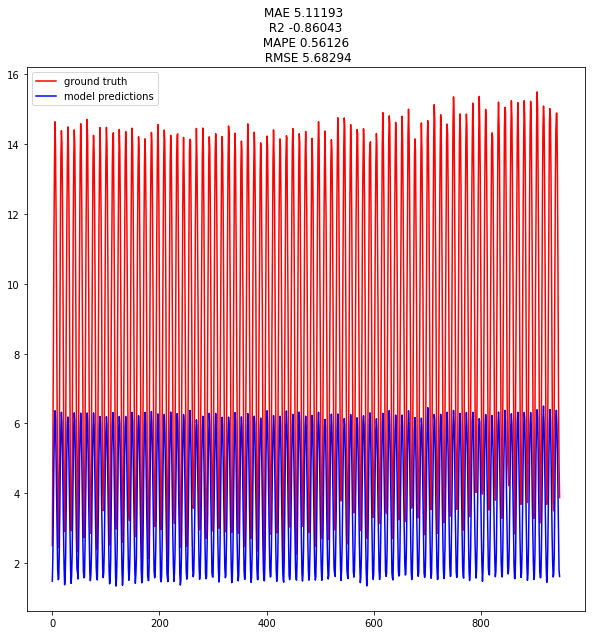

MAE 0.6919
R2 0.9629
RMSE 0.8250
[2.0628176] 0.56420517




Plot, with Optimizer.
(948,) (948,)


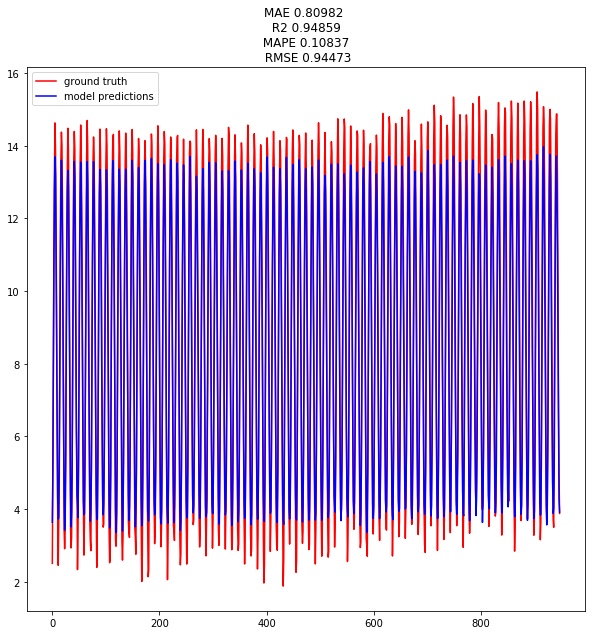

Done saving the results


[0.8098191577895281, 0.9485857263820238]

In [42]:
results_collect(model_version="M1V2",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=9,optim = Adam(lr = 0.01))

Inside model_creation
Check
Train on 2211 samples, validate on 948 samples
Epoch 1/10
2211/2211 [==============================] - 9s 4ms/step - loss: 13.4829 - mean_absolute_error: 13.9482 - rmse: 13.9482 - val_loss: 3.5297 - val_mean_absolute_error: 3.9830 - val_rmse: 3.9830
Epoch 2/10
2211/2211 [==============================] - 1s 383us/step - loss: 0.6529 - mean_absolute_error: 1.0492 - rmse: 1.0492 - val_loss: 2.9735 - val_mean_absolute_error: 3.4370 - val_rmse: 3.4370
Epoch 3/10
2211/2211 [==============================] - 1s 387us/step - loss: 0.5308 - mean_absolute_error: 0.9098 - rmse: 0.9098 - val_loss: 2.7800 - val_mean_absolute_error: 3.2490 - val_rmse: 3.2490
Epoch 4/10
2211/2211 [==============================] - 1s 377us/step - loss: 0.4728 - mean_absolute_error: 0.8433 - rmse: 0.8433 - val_loss: 2.9922 - val_mean_absolute_error: 3.4658 - val_rmse: 3.4658
Epoch 5/10
2211/2211 [==============================] - 1s 377us/step - loss: 0.5300 - mean_absolute_error: 0.9126 -

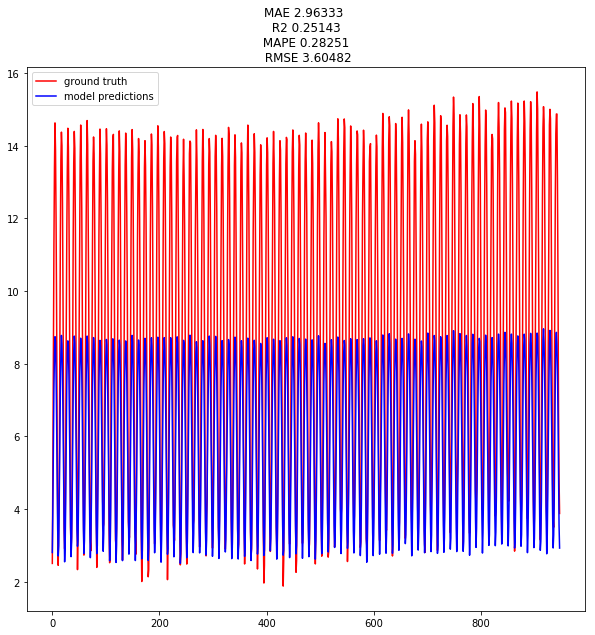

MAE 0.3666
R2 0.9876
RMSE 0.4760
[1.9719632] -3.3882027




Plot, with Optimizer.
(948,) (948,)


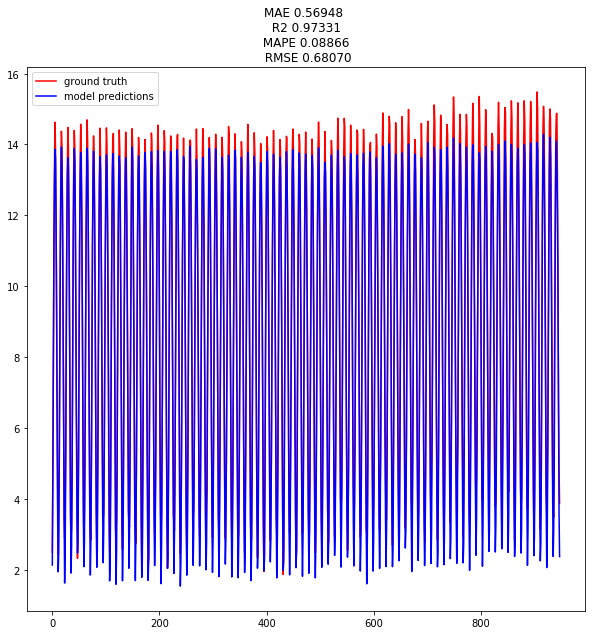

Done saving the results


[0.5694766631508678, 0.9733084768052409]

In [43]:
results_collect(model_version="M2V1",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=9,optim = Adam(lr = 0.01))

Inside model_creation
Check
Train on 2211 samples, validate on 948 samples
Epoch 1/10
2211/2211 [==============================] - 9s 4ms/step - loss: 5.4702 - mean_absolute_error: 5.9270 - rmse: 5.9270 - val_loss: 2.9991 - val_mean_absolute_error: 3.4918 - val_rmse: 3.4918
Epoch 2/10
2211/2211 [==============================] - 1s 436us/step - loss: 0.6853 - mean_absolute_error: 1.0798 - rmse: 1.0798 - val_loss: 2.8936 - val_mean_absolute_error: 3.3416 - val_rmse: 3.3416
Epoch 3/10
2211/2211 [==============================] - 1s 427us/step - loss: 0.5764 - mean_absolute_error: 0.9595 - rmse: 0.9595 - val_loss: 1.7880 - val_mean_absolute_error: 2.2275 - val_rmse: 2.2275
Epoch 4/10
2211/2211 [==============================] - 1s 436us/step - loss: 0.6544 - mean_absolute_error: 1.0414 - rmse: 1.0414 - val_loss: 2.3225 - val_mean_absolute_error: 2.7613 - val_rmse: 2.7613
Epoch 5/10
2211/2211 [==============================] - 1s 431us/step - loss: 0.4859 - mean_absolute_error: 0.8597 - rm

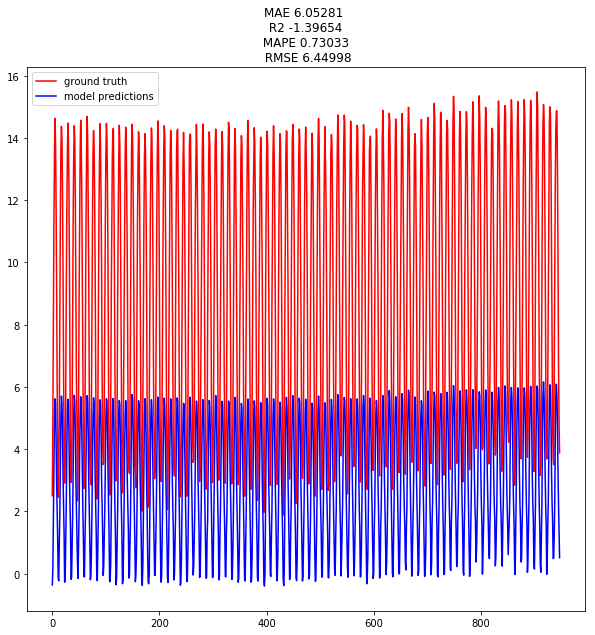

MAE 0.6909
R2 0.9518
RMSE 0.9403
[1.9627628] 3.4379601




Plot, with Optimizer.
(948,) (948,)


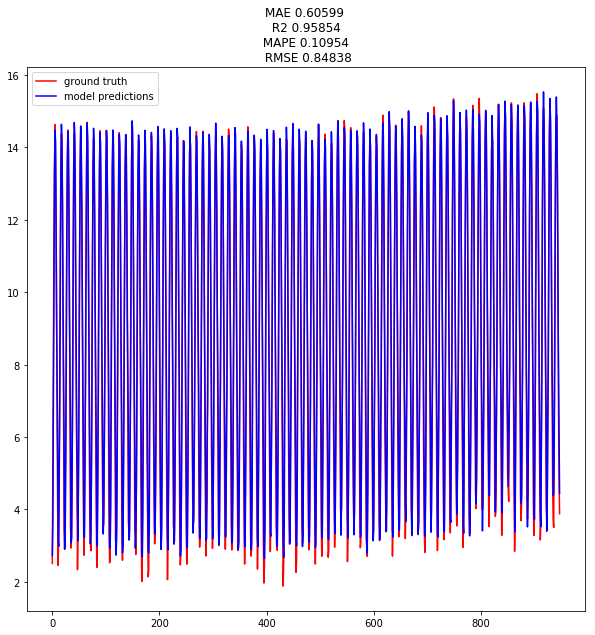

Done saving the results


[0.605992218500451, 0.9585379394228482]

In [44]:
results_collect(model_version="M2V2",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=9,optim = Adam(lr = 0.01))

## Multivariate

Create formatted data : (df shape) (1992, 8)
Create time-stepped data : (d shape) (1971, 21, 8)
Create formatted data :  (1971, 10, 8) (1971, 10, 8) (1971,)
Dimensions of train and test :  (1379, 10, 8)   (592, 10, 8)   (1379,)   (592,)
Inside model_creation
Check
Train on 1379 samples, validate on 592 samples
Epoch 1/5
1379/1379 [==============================] - 8s 6ms/step - loss: 43.6087 - mean_absolute_error: 44.1038 - rmse: 44.1038 - val_loss: 5.4946 - val_mean_absolute_error: 5.9699 - val_rmse: 5.9699
Epoch 2/5
1379/1379 [==============================] - 1s 422us/step - loss: 11.5292 - mean_absolute_error: 12.0198 - rmse: 12.0198 - val_loss: 3.8215 - val_mean_absolute_error: 4.3213 - val_rmse: 4.3213
Epoch 3/5
1379/1379 [==============================] - 1s 432us/step - loss: 4.5687 - mean_absolute_error: 5.0429 - rmse: 5.0429 - val_loss: 4.7193 - val_mean_absolute_error: 5.2068 - val_rmse: 5.2068
Epoch 4/5
1379/1379 [==============================] - 1s 443us/step - loss: 0.46

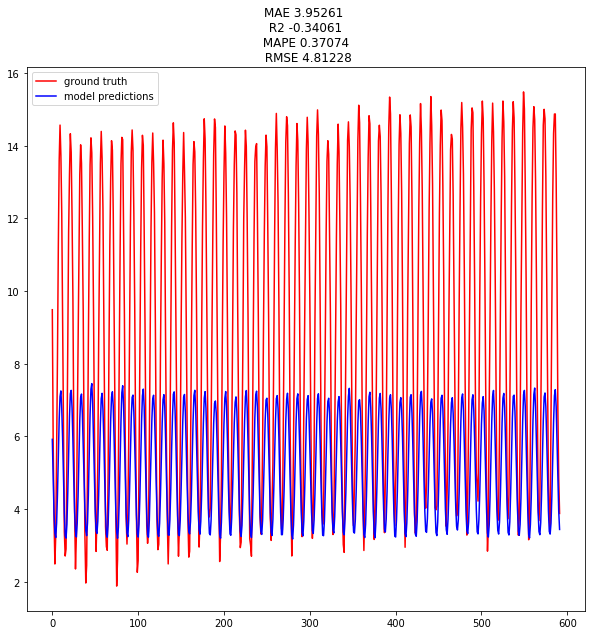

MAE 1.1295
R2 0.8972
RMSE 1.3394
[2.785773] -6.1497765




Plot, with Optimizer.
(592,) (592,)


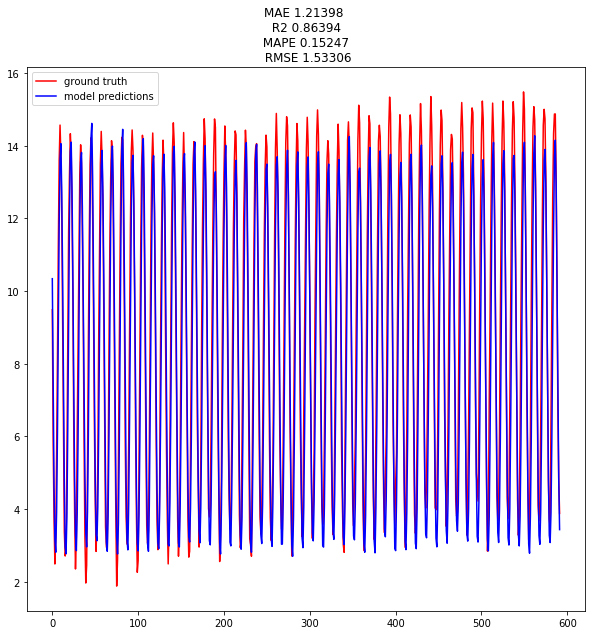

Done saving the results


[1.2139775075783599, 0.8639436290004997]

In [86]:
results_collect(model_version="M1V1",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=5,optim = Adam(lr = 0.01), multi = True)

Create formatted data : (df shape) (1992, 8)
Create time-stepped data : (d shape) (1971, 21, 8)
Create formatted data :  (1971, 10, 8) (1971, 10, 8) (1971,)
Dimensions of train and test :  (1379, 10, 8)   (592, 10, 8)   (1379,)   (592,)
Inside model_creation
Check
Train on 1379 samples, validate on 592 samples
Epoch 1/9
1379/1379 [==============================] - 10s 7ms/step - loss: 38.2163 - mean_absolute_error: 38.7148 - rmse: 38.7148 - val_loss: 11.9006 - val_mean_absolute_error: 12.4006 - val_rmse: 12.4006
Epoch 2/9
1379/1379 [==============================] - 1s 470us/step - loss: 5.1026 - mean_absolute_error: 5.5658 - rmse: 5.5658 - val_loss: 0.5372 - val_mean_absolute_error: 0.9322 - val_rmse: 0.9322
Epoch 3/9
1379/1379 [==============================] - 1s 455us/step - loss: 0.3939 - mean_absolute_error: 0.7573 - rmse: 0.7573 - val_loss: 0.9534 - val_mean_absolute_error: 1.4201 - val_rmse: 1.4201
Epoch 4/9
1379/1379 [==============================] - 1s 456us/step - loss: 0.2

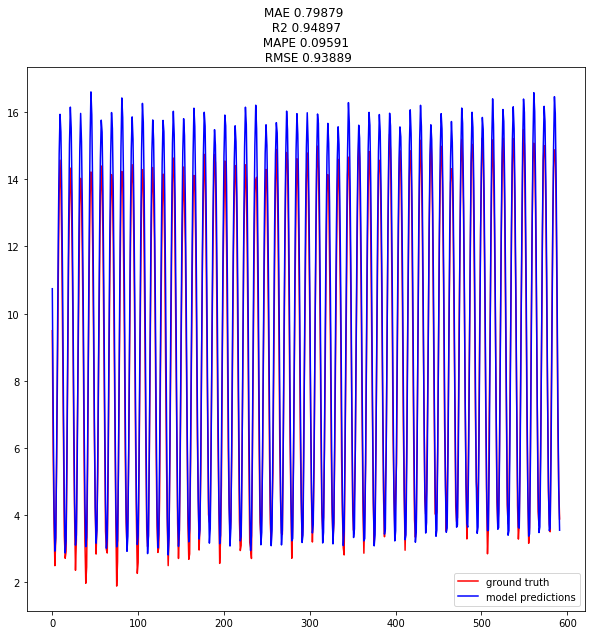

MAE 0.3383
R2 0.9895
RMSE 0.4278
[0.90434104] -0.22879028




Plot, with Optimizer.
(592,) (592,)


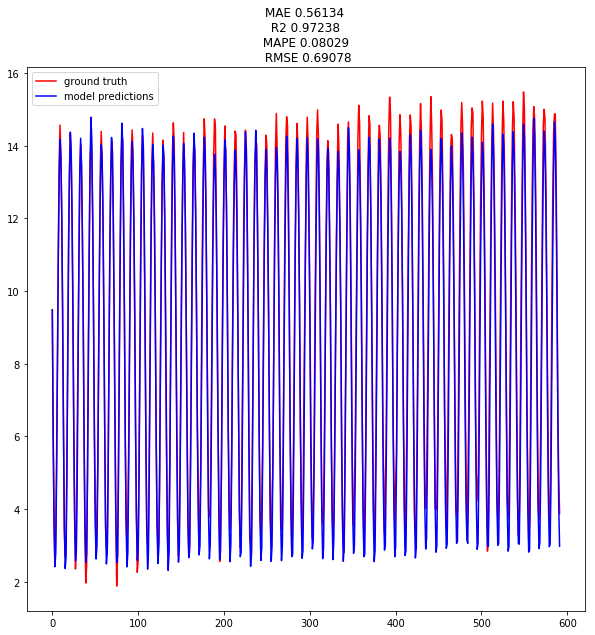

Done saving the results


[0.5613406823970175, 0.9723767495715945]

In [92]:
results_collect(model_version="M3V1",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=9,optim = Adam(lr = 0.01), multi = True)

Create formatted data : (df shape) (1992, 8)
Create time-stepped data : (d shape) (1971, 21, 8)
Create formatted data :  (1971, 10, 8) (1971, 10, 8) (1971,)
Dimensions of train and test :  (1379, 10, 8)   (592, 10, 8)   (1379,)   (592,)
Inside model_creation
Check
Train on 1379 samples, validate on 592 samples
Epoch 1/9
1379/1379 [==============================] - 8s 6ms/step - loss: 45.7399 - mean_absolute_error: 46.2388 - rmse: 46.2388 - val_loss: 9.1214 - val_mean_absolute_error: 9.6180 - val_rmse: 9.6180
Epoch 2/9
1379/1379 [==============================] - 0s 330us/step - loss: 3.1630 - mean_absolute_error: 3.6258 - rmse: 3.6258 - val_loss: 1.6027 - val_mean_absolute_error: 2.0093 - val_rmse: 2.0093
Epoch 3/9
1379/1379 [==============================] - 0s 341us/step - loss: 0.5199 - mean_absolute_error: 0.8814 - rmse: 0.8814 - val_loss: 2.9495 - val_mean_absolute_error: 3.4128 - val_rmse: 3.4128
Epoch 4/9
1379/1379 [==============================] - 0s 356us/step - loss: 0.3597 

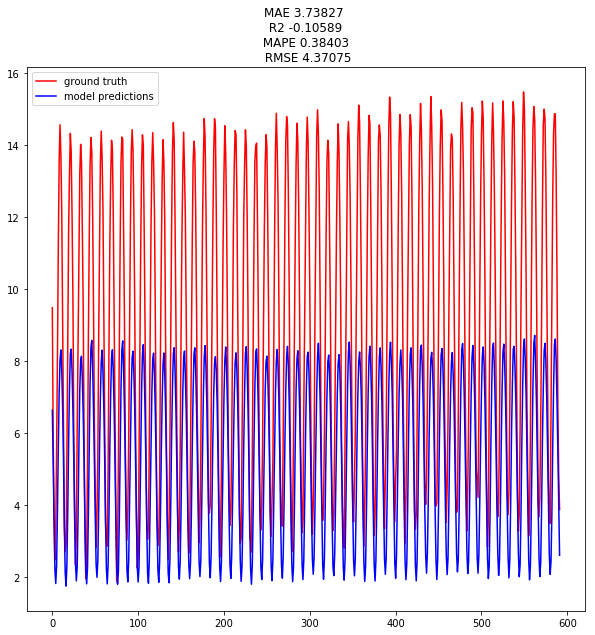

MAE 1.4049
R2 0.8502
RMSE 1.6172
[1.6866546] -0.18281841




Plot, with Optimizer.
(592,) (592,)


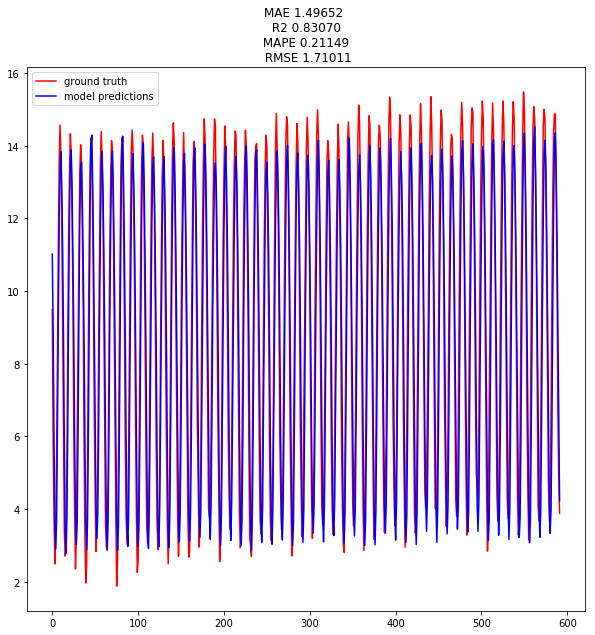

Done saving the results


[1.4965186118048588, 0.8307023816302506]

In [88]:
results_collect(model_version="M1V2",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=9,optim = Adam(lr = 0.01), multi = True)

Create formatted data : (df shape) (1992, 8)
Create time-stepped data : (d shape) (1971, 21, 8)
Create formatted data :  (1971, 10, 8) (1971, 10, 8) (1971,)
Dimensions of train and test :  (1379, 10, 8)   (592, 10, 8)   (1379,)   (592,)
Inside model_creation
Check
Train on 1379 samples, validate on 592 samples
Epoch 1/9
1379/1379 [==============================] - 11s 8ms/step - loss: 20.9229 - mean_absolute_error: 21.4183 - rmse: 21.4183 - val_loss: 5.3265 - val_mean_absolute_error: 5.8154 - val_rmse: 5.8154
Epoch 2/9
1379/1379 [==============================] - 1s 470us/step - loss: 1.0389 - mean_absolute_error: 1.4724 - rmse: 1.4724 - val_loss: 3.4060 - val_mean_absolute_error: 3.9060 - val_rmse: 3.9060
Epoch 3/9
1379/1379 [==============================] - 1s 477us/step - loss: 0.4988 - mean_absolute_error: 0.8564 - rmse: 0.8564 - val_loss: 3.9020 - val_mean_absolute_error: 4.4003 - val_rmse: 4.4003
Epoch 4/9
1379/1379 [==============================] - 1s 456us/step - loss: 0.1302

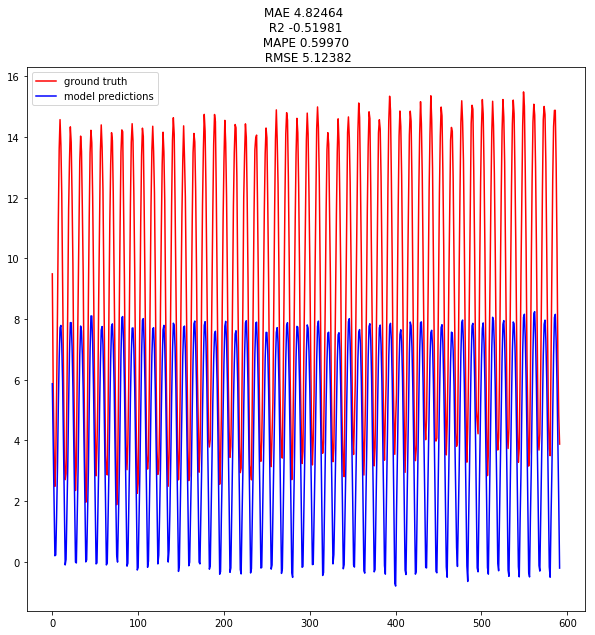

MAE 1.2007
R2 0.8930
RMSE 1.3667
[1.54326] 1.4399352




Plot, with Optimizer.
(592,) (592,)


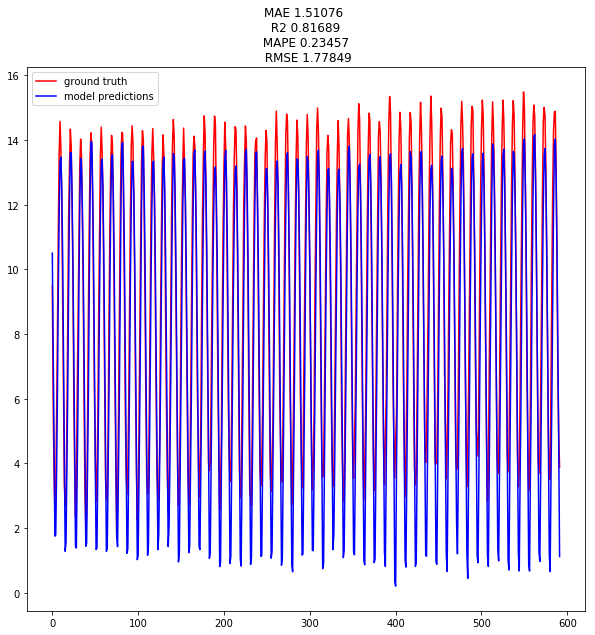

Done saving the results


[1.510758670974422, 0.8168937370212869]

In [93]:
results_collect(model_version="M2V1",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=9,optim = Adam(lr = 0.01), multi = True)

Create formatted data : (df shape) (1992, 8)
Create time-stepped data : (d shape) (1971, 21, 8)
Create formatted data :  (1971, 10, 8) (1971, 10, 8) (1971,)
Dimensions of train and test :  (1379, 10, 8)   (592, 10, 8)   (1379,)   (592,)
Inside model_creation
Check
Train on 1379 samples, validate on 592 samples
Epoch 1/9
1379/1379 [==============================] - 9s 7ms/step - loss: 7.4979 - mean_absolute_error: 7.9823 - rmse: 7.9823 - val_loss: 1.6451 - val_mean_absolute_error: 2.0980 - val_rmse: 2.0980
Epoch 2/9
1379/1379 [==============================] - 1s 493us/step - loss: 1.0300 - mean_absolute_error: 1.4536 - rmse: 1.4536 - val_loss: 2.9684 - val_mean_absolute_error: 3.4403 - val_rmse: 3.4403
Epoch 3/9
1379/1379 [==============================] - 1s 473us/step - loss: 1.0177 - mean_absolute_error: 1.4335 - rmse: 1.4335 - val_loss: 6.2670 - val_mean_absolute_error: 6.7670 - val_rmse: 6.7670
Epoch 4/9
1379/1379 [==============================] - 1s 468us/step - loss: 0.2332 - m

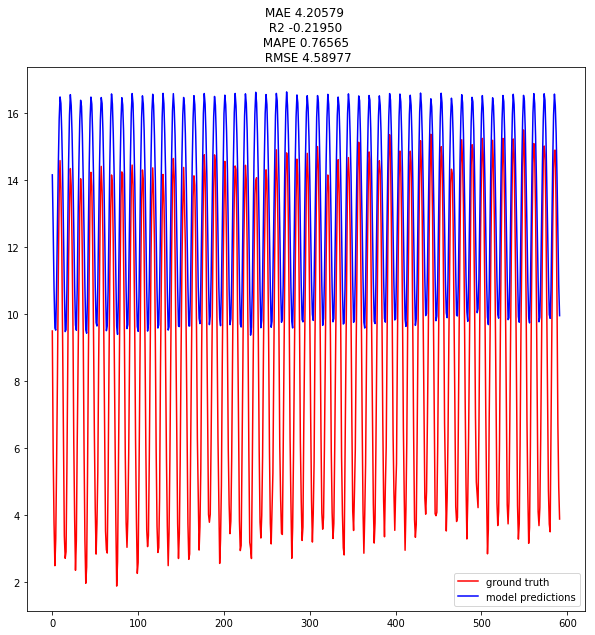

MAE 0.6202
R2 0.9680
RMSE 0.7477
[1.6640818] -13.342314




Plot, with Optimizer.
(592,) (592,)


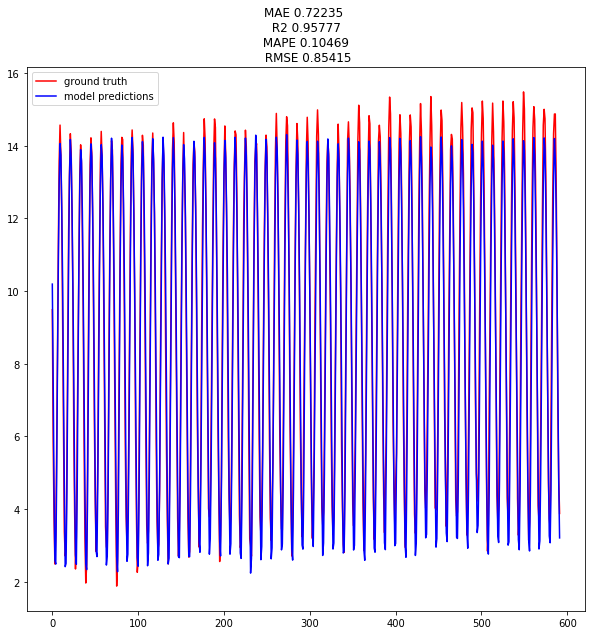

Done saving the results


[0.722351910423588, 0.9577652853328692]

In [90]:
results_collect(model_version="M2V2",dataset_name="GlobalLandTemp",callback_min_delta=0.05,patience_value=80,epoch_cnt=9,optim = Adam(lr = 0.01), multi = True)

# Jena

Create formatted data : (df shape) (3651,)
Create time-stepped data : (d shape) (3630, 21, 1)
Create formatted data :  (3630, 10, 1) (3630, 10, 1) (3630,)
Dimensions of train and test :  (2541, 10, 1)   (1089, 10, 1)   (2541,)   (1089,)
Inside model_creation
Check
Train on 2541 samples, validate on 1089 samples
Epoch 1/100
2541/2541 [==============================] - 7s 3ms/step - loss: 9.3060 - mean_absolute_error: 9.7950 - mean_squared_error: 133.7949 - rmse: 11.5183 - val_loss: 9.2826 - val_mean_absolute_error: 9.7715 - val_mean_squared_error: 136.8857 - val_rmse: 10.3766
Epoch 2/100
2541/2541 [==============================] - 3s 1ms/step - loss: 8.7491 - mean_absolute_error: 9.2377 - mean_squared_error: 119.1552 - rmse: 10.8528 - val_loss: 8.5704 - val_mean_absolute_error: 9.0583 - val_mean_squared_error: 118.0062 - val_rmse: 9.6776
Epoch 3/100
2541/2541 [==============================] - 3s 1ms/step - loss: 7.8120 - mean_absolute_error: 8.2991 - mean_squared_error: 96.6861 - rmse

Epoch 61/100
2541/2541 [==============================] - 3s 992us/step - loss: 2.0949 - mean_absolute_error: 2.5503 - mean_squared_error: 11.0532 - rmse: 3.2793 - val_loss: 2.0481 - val_mean_absolute_error: 2.5030 - val_mean_squared_error: 9.8034 - val_rmse: 3.0735
Epoch 62/100
2541/2541 [==============================] - 3s 1ms/step - loss: 2.0855 - mean_absolute_error: 2.5415 - mean_squared_error: 10.9742 - rmse: 3.2740 - val_loss: 2.0359 - val_mean_absolute_error: 2.4907 - val_mean_squared_error: 9.7198 - val_rmse: 3.0599
Epoch 63/100
2541/2541 [==============================] - 3s 1ms/step - loss: 2.0746 - mean_absolute_error: 2.5305 - mean_squared_error: 10.8980 - rmse: 3.2662 - val_loss: 2.0298 - val_mean_absolute_error: 2.4857 - val_mean_squared_error: 9.6957 - val_rmse: 3.0556
Epoch 64/100
2541/2541 [==============================] - 3s 1ms/step - loss: 2.0643 - mean_absolute_error: 2.5208 - mean_squared_error: 10.8296 - rmse: 3.2426 - val_loss: 2.0159 - val_mean_absolute_erro

Epoch 92/100
2541/2541 [==============================] - 3s 1000us/step - loss: 1.8192 - mean_absolute_error: 2.2685 - mean_squared_error: 9.2351 - rmse: 2.9907 - val_loss: 1.8028 - val_mean_absolute_error: 2.2574 - val_mean_squared_error: 8.0333 - val_rmse: 2.7801
Epoch 93/100
2541/2541 [==============================] - 3s 996us/step - loss: 1.8122 - mean_absolute_error: 2.2609 - mean_squared_error: 9.2008 - rmse: 2.9827 - val_loss: 1.8114 - val_mean_absolute_error: 2.2667 - val_mean_squared_error: 8.0940 - val_rmse: 2.7922
Epoch 94/100
2541/2541 [==============================] - 3s 1ms/step - loss: 1.8118 - mean_absolute_error: 2.2617 - mean_squared_error: 9.1829 - rmse: 2.9791 - val_loss: 1.7781 - val_mean_absolute_error: 2.2306 - val_mean_squared_error: 7.8791 - val_rmse: 2.7505
Epoch 95/100
2541/2541 [==============================] - 2s 982us/step - loss: 1.8009 - mean_absolute_error: 2.2500 - mean_squared_error: 9.1266 - rmse: 2.9569 - val_loss: 1.7735 - val_mean_absolute_err

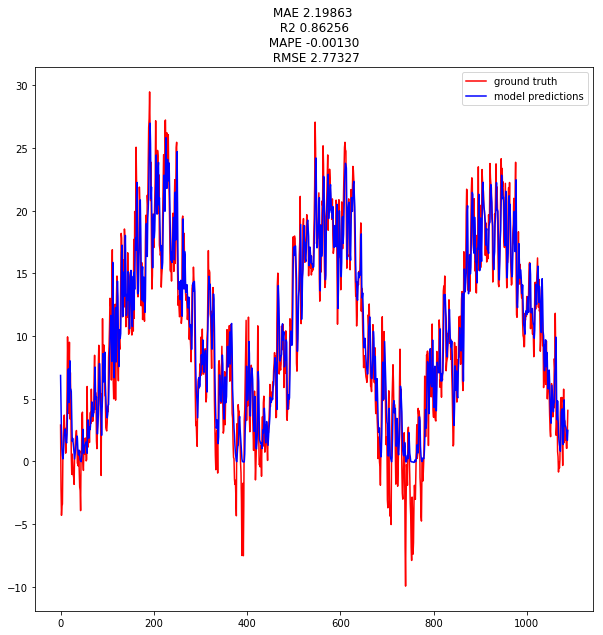

MAE 1.9835
R2 0.8845
RMSE 2.5407
[1.1064566] -1.6960907




Plot, with Optimizer.
(1089,) (1089,)


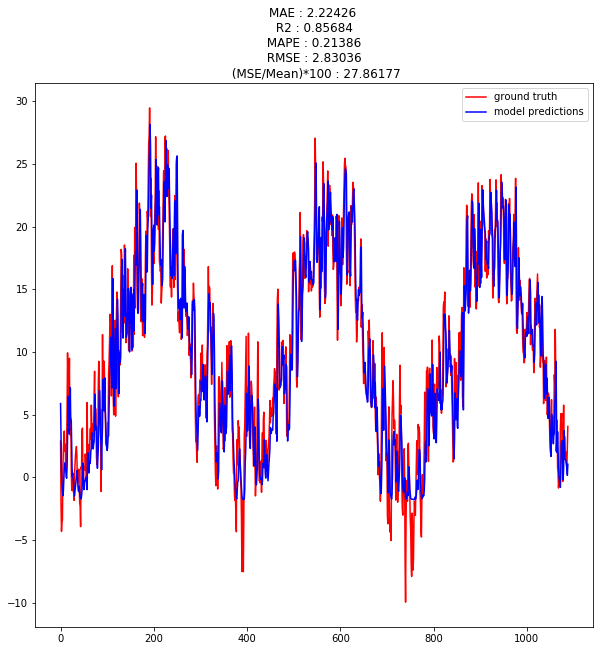

Done saving the results


[2.224261680494193, 0.8568403449847307, 2.8303555844730766, 27.86176538943333]

In [3]:
results_collect(model_version="M3V1",dataset_name="Jena",callback_min_delta=0.05,patience_value=80,epoch_cnt=50,optim = SGD(lr = 0.0001))

# Lynx

Create formatted data : (df shape) (114,)
Create time-stepped data : (d shape) (93, 21, 1)
Create formatted data :  (93, 10, 1) (93, 10, 1) (93,)
Dimensions of train and test :  (65, 10, 1)   (28, 10, 1)   (65,)   (28,)
Inside model_creation
Check
Train on 65 samples, validate on 28 samples
Epoch 1/200
65/65 [==============================] - 9s 138ms/step - loss: 1224.0007 - mean_absolute_error: 1224.5007 - mean_squared_error: 3304887.8154 - rmse: 1815.6754 - val_loss: 1827.7997 - val_mean_absolute_error: 1828.2997 - val_mean_squared_error: 6891364.5000 - val_rmse: 2625.1409
Epoch 2/200
65/65 [==============================] - 0s 822us/step - loss: 1224.0002 - mean_absolute_error: 1224.5002 - mean_squared_error: 3304886.5822 - rmse: 1769.3042 - val_loss: 1827.7994 - val_mean_absolute_error: 1828.2994 - val_mean_squared_error: 6891363.5000 - val_rmse: 2625.1406
Epoch 3/200
65/65 [==============================] - 0s 953us/step - loss: 1223.9995 - mean_absolute_error: 1224.4995 - mean_s

65/65 [==============================] - 0s 984us/step - loss: 1223.9885 - mean_absolute_error: 1224.4885 - mean_squared_error: 3304855.9538 - rmse: 1800.6287 - val_loss: 1827.7871 - val_mean_absolute_error: 1828.2871 - val_mean_squared_error: 6891319.0000 - val_rmse: 2625.1321
Epoch 57/200
65/65 [==============================] - 0s 791us/step - loss: 1223.9880 - mean_absolute_error: 1224.4880 - mean_squared_error: 3304856.0230 - rmse: 1802.9557 - val_loss: 1827.7870 - val_mean_absolute_error: 1828.2870 - val_mean_squared_error: 6891317.5000 - val_rmse: 2625.1318
Epoch 58/200
65/65 [==============================] - 0s 802us/step - loss: 1223.9880 - mean_absolute_error: 1224.4880 - mean_squared_error: 3304856.3038 - rmse: 1813.8019 - val_loss: 1827.7865 - val_mean_absolute_error: 1828.2865 - val_mean_squared_error: 6891317.0000 - val_rmse: 2625.1318
Epoch 59/200
65/65 [==============================] - 0s 814us/step - loss: 1223.9874 - mean_absolute_error: 1224.4874 - mean_squared_err

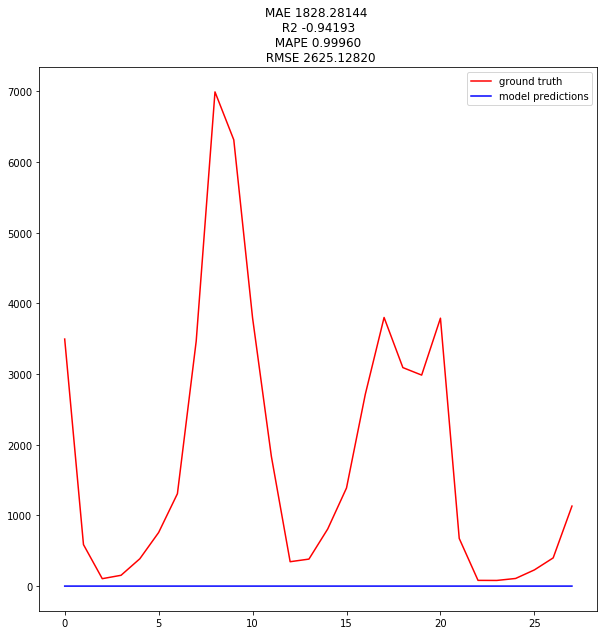

MAE 1051.3645
R2 0.1780
RMSE 1194.4248
[462288.38] -66896.03




Plot, with Optimizer.
(28,) (28,)


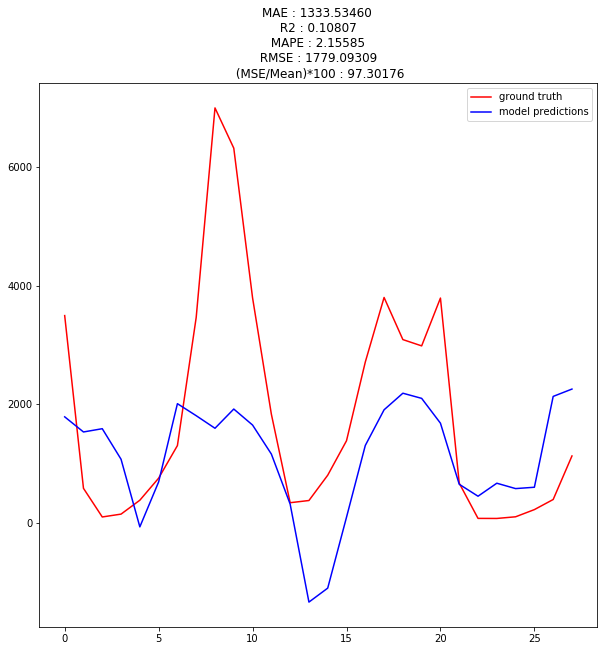

Done saving the results


[1333.5345982142858,
 0.10807275869984045,
 1779.0930909255003,
 97.30175510960623]

In [33]:
results_collect(model_version="M1V1",dataset_name="Lynx",callback_min_delta=0.05,patience_value=80,epoch_cnt=200,optim = SGD(lr = 0.00001), frac=0.7)

# Exhcange Data

Create formatted data : (df shape) (7588,)
Create time-stepped data : (d shape) (7567, 21, 1)
Create formatted data :  (7567, 10, 1) (7567, 10, 1) (7567,)
Dimensions of train and test :  (5296, 10, 1)   (2271, 10, 1)   (5296,)   (2271,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_51 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
input_52 (InputLayer)           (None, 10, 1)        0                                            
__________________________________________________________________________________________________
conv1d_77 (Conv1D)              (None, 6, 32)        192         input_51[0][0]                   
________________________________________________

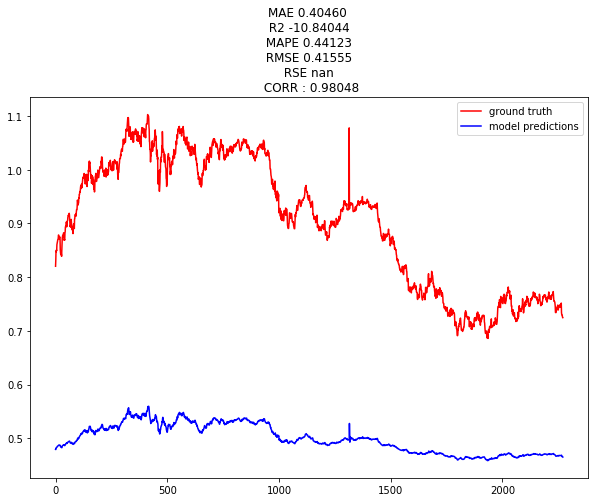

MAE 0.0070
R2 0.9851
RMSE 0.0098
[6.1477857] -2.129645




Plot, with Optimizer.
(2271,) (2271,)


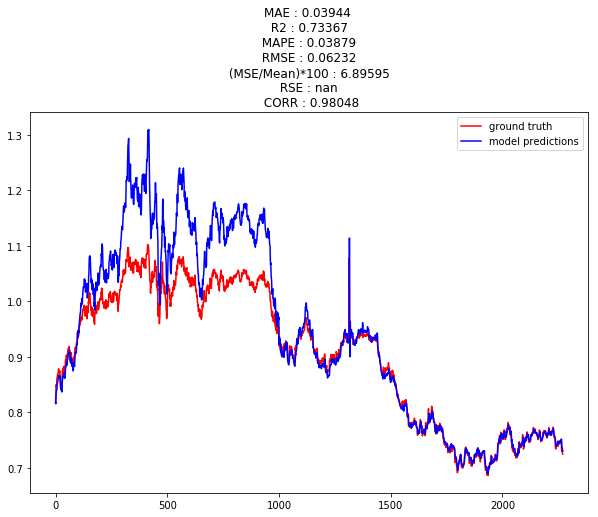

Done saving the results


[0.039442748, 0.7336701330670394, 0.062322877, 6.895949260113116]

In [39]:
results_collect(model_version="M1V1",dataset_name="Exchange",callback_min_delta=0.05,patience_value=80,epoch_cnt=100,optim = Adam(lr = 0.001), frac=0.7)

In [ ]:
results_collect(model_version="M1V2",dataset_name="Exchange",callback_min_delta=0.05,patience_value=80,epoch_cnt=200,optim = SGD(lr = 0.001), frac=0.7)

In [ ]:
results_collect(model_version="M2V1",dataset_name="Exchange",callback_min_delta=0.05,patience_value=80,epoch_cnt=200,optim = SGD(lr = 0.001), frac=0.7)

In [ ]:
results_collect(model_version="M2V2",dataset_name="Exchange",callback_min_delta=0.05,patience_value=80,epoch_cnt=200,optim = SGD(lr = 0.001), frac=0.7)

In [ ]:
results_collect(model_version="M3V1",dataset_name="Exchange",callback_min_delta=0.05,patience_value=80,epoch_cnt=200,optim = SGD(lr = 0.001), frac=0.7)

# Traffic Data

Create formatted data : (df shape) (3400,)
Create time-stepped data : (d shape) (3375, 25, 1)
Create formatted data :  (3375, 12, 1) (3375, 12, 1) (3375,)
Dimensions of train and test :  (2362, 12, 1)   (1013, 12, 1)   (2362,)   (1013,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           (None, 12, 1)        0                                            
__________________________________________________________________________________________________
input_12 (InputLayer)           (None, 12, 1)        0                                            
__________________________________________________________________________________________________
conv1d_21 (Conv1D)              (None, 8, 32)        192         input_11[0][0]                   
________________________________________________

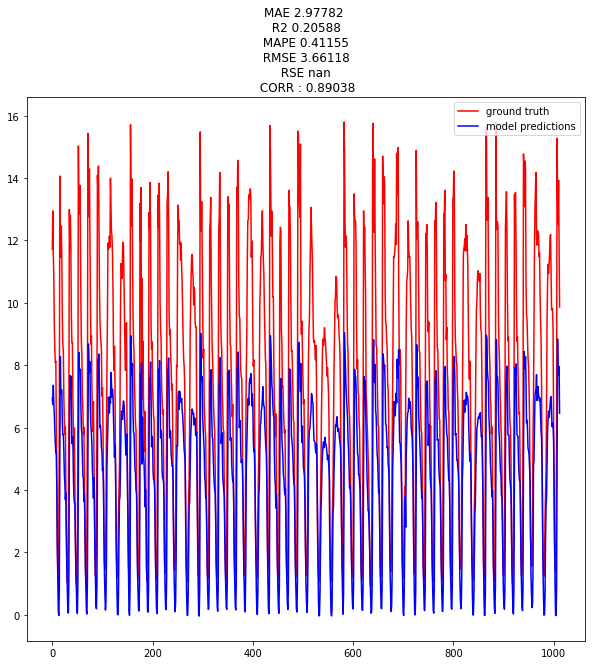

MAE 1.3503
R2 0.8018
RMSE 1.8730
[1.450662] 0.9353967




Plot, with Optimizer.
(1013,) (1013,)


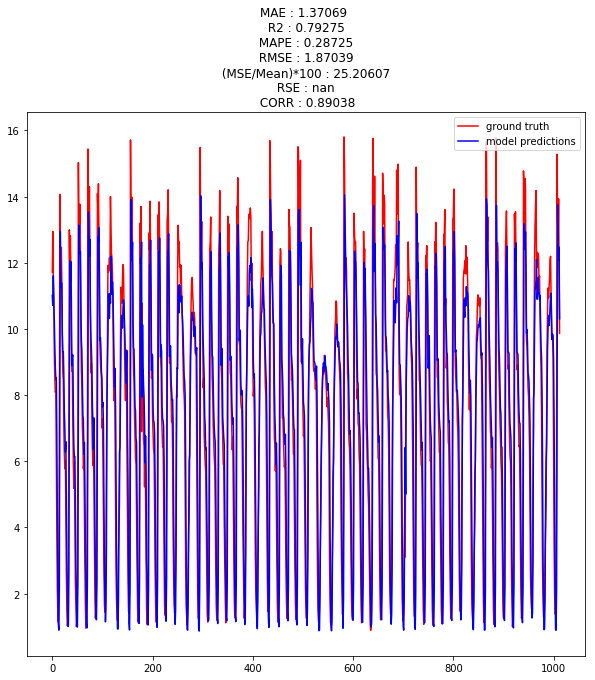

Done saving the results


[1.370692, 0.7927453090339449, 1.8703884, 25.206070256025647]

In [8]:
results_collect(model_version="M1V1",dataset_name="Traffic",callback_min_delta=0.5,patience_value=20,epoch_cnt=500,optim = Adam(lr = 0.01, decay=0.05), frac=0.7, timesteps=25)

Create formatted data : (df shape) (3400,)
Create time-stepped data : (d shape) (3375, 25, 1)
Create formatted data :  (3375, 12, 1) (3375, 12, 1) (3375,)
Dimensions of train and test :  (2362, 12, 1)   (1013, 12, 1)   (2362,)   (1013,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 12, 1)        0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 12, 1)        0                                            
__________________________________________________________________________________________________
conv1d_3 (Conv1D)               (None, 8, 32)        192         input_3[0][0]                    
________________________________________________

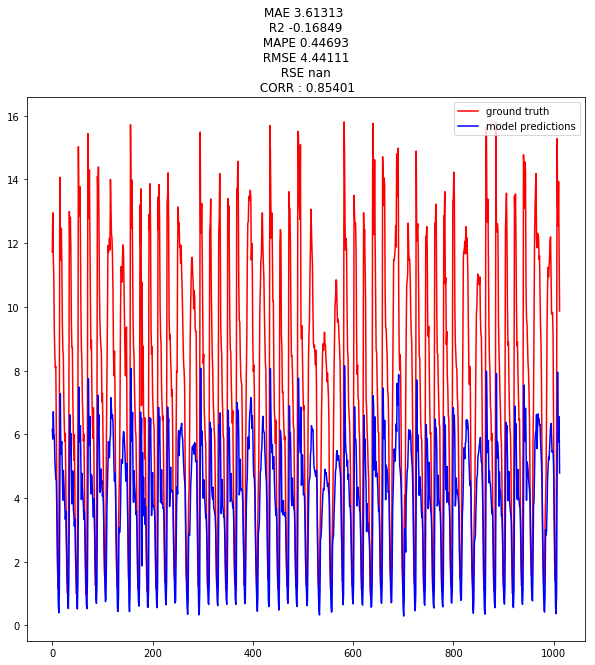

MAE 1.6773
R2 0.7270
RMSE 2.1982
[1.8795115] 0.1334629




Plot, with Optimizer.
(1013,) (1013,)


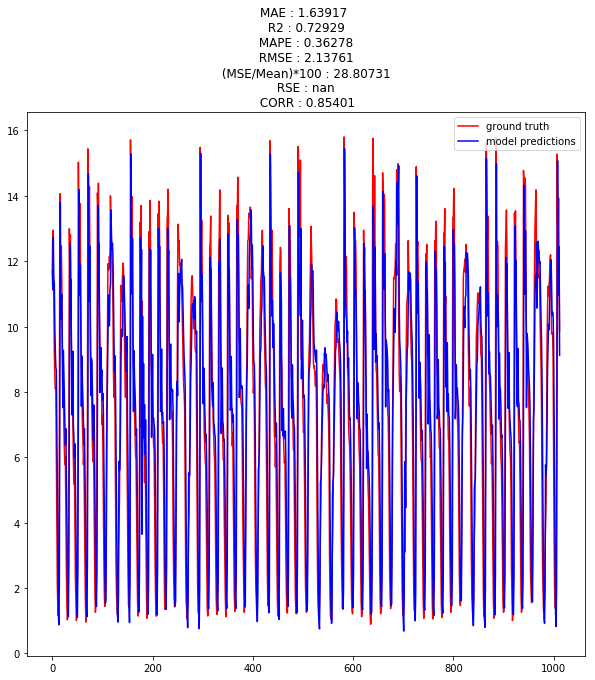

Done saving the results


[1.6391656, 0.7292929560098547, 2.1376145, 28.807311522796088]

In [4]:
results_collect(model_version="M1V2",dataset_name="Traffic",callback_min_delta=0.5,patience_value=20,epoch_cnt=500,optim = Adam(lr = 0.01, decay=0.05), frac=0.7, timesteps=25)

Create formatted data : (df shape) (3400,)
Create time-stepped data : (d shape) (3375, 25, 1)
Create formatted data :  (3375, 12, 1) (3375, 12, 1) (3375,)
Dimensions of train and test :  (2362, 12, 1)   (1013, 12, 1)   (2362,)   (1013,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 12, 1)        0                                            
__________________________________________________________________________________________________
input_6 (InputLayer)            (None, 12, 1)        0                                            
__________________________________________________________________________________________________
conv1d_7 (Conv1D)               (None, 8, 32)        192         input_5[0][0]                    
________________________________________________

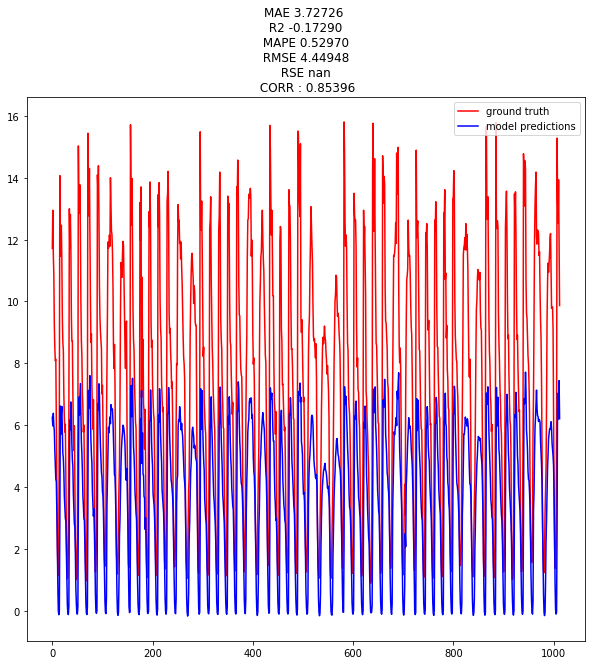

MAE 1.4902
R2 0.7499
RMSE 2.1041
[1.5411445] 1.6917291




Plot, with Optimizer.
(1013,) (1013,)


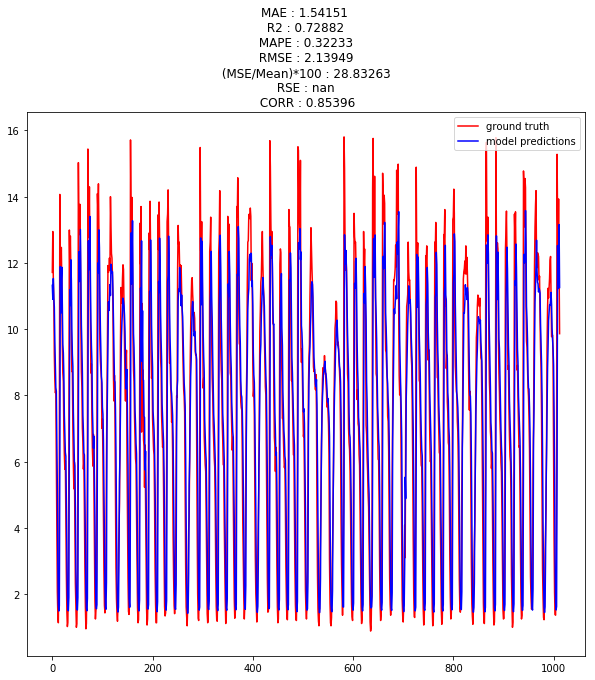

Done saving the results


[1.54151, 0.7288168275864251, 2.1394935, 28.832633334068042]

In [5]:
results_collect(model_version="M2V1",dataset_name="Traffic",callback_min_delta=0.5,patience_value=20,epoch_cnt=500,optim = Adam(lr = 0.01, decay=0.05), frac=0.7, timesteps=25)

Create formatted data : (df shape) (3400,)
Create time-stepped data : (d shape) (3375, 25, 1)
Create formatted data :  (3375, 12, 1) (3375, 12, 1) (3375,)
Dimensions of train and test :  (2362, 12, 1)   (1013, 12, 1)   (2362,)   (1013,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 12, 1)        0                                            
__________________________________________________________________________________________________
input_8 (InputLayer)            (None, 12, 1)        0                                            
__________________________________________________________________________________________________
lstm_5 (LSTM)                   (None, 12, 32)       4352        input_7[0][0]                    
________________________________________________

Epoch 14/500
2362/2362 [==============================] - 4s 2ms/step - loss: 0.2589 - mean_absolute_error: 0.5356 - mean_squared_error: 0.8181 - rmse: 0.8455 - val_loss: 4.3311 - val_mean_absolute_error: 4.8190 - val_mean_squared_error: 33.1035 - val_rmse: 5.7247
Epoch 15/500
2362/2362 [==============================] - 4s 2ms/step - loss: 0.2519 - mean_absolute_error: 0.5212 - mean_squared_error: 0.8015 - rmse: 0.8383 - val_loss: 4.2089 - val_mean_absolute_error: 4.6953 - val_mean_squared_error: 31.4802 - val_rmse: 5.5816
Epoch 16/500
2362/2362 [==============================] - 4s 2ms/step - loss: 0.2494 - mean_absolute_error: 0.5181 - mean_squared_error: 0.7671 - rmse: 0.8330 - val_loss: 4.3050 - val_mean_absolute_error: 4.7949 - val_mean_squared_error: 32.5397 - val_rmse: 5.6753
Epoch 17/500
2362/2362 [==============================] - 4s 2ms/step - loss: 0.2352 - mean_absolute_error: 0.5054 - mean_squared_error: 0.7210 - rmse: 0.8050 - val_loss: 4.4936 - val_mean_absolute_error: 

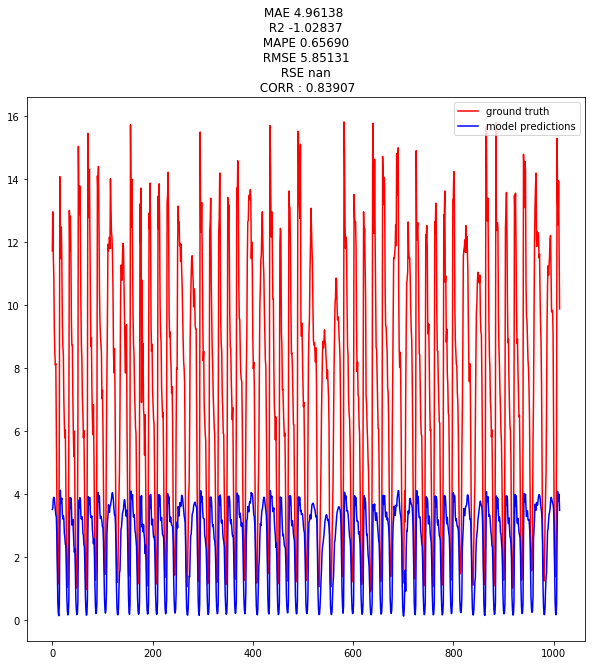

MAE 1.8083
R2 0.7036
RMSE 2.2906
[2.6934924] 0.9189725




Plot, with Optimizer.
(1013,) (1013,)


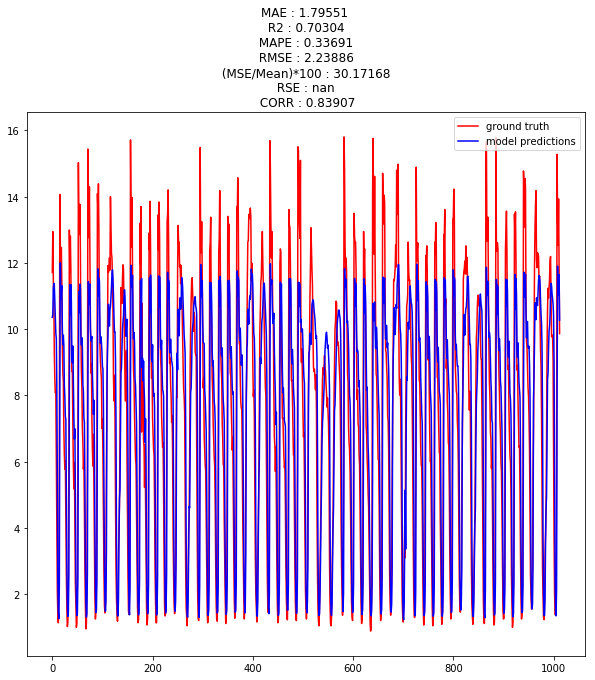

Done saving the results


[1.7955109, 0.7030433578104187, 2.2388558, 30.171678731664176]

In [6]:
results_collect(model_version="M2V2",dataset_name="Traffic",callback_min_delta=0.5,patience_value=20,epoch_cnt=500,optim = Adam(lr = 0.01, decay=0.05), frac=0.7, timesteps=25)

Create formatted data : (df shape) (3400,)
Create time-stepped data : (d shape) (3351, 49, 1)
Create formatted data :  (3351, 24, 1) (3351, 24, 1) (3351,)
Dimensions of train and test :  (2345, 24, 1)   (1006, 24, 1)   (2345,)   (1006,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 24, 1)        0                                            
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 20, 32)       192         input_1[0][0]                    
__________________________________________________________________________________________________
conv1d_2 (Conv1D)               (None, 19, 32)       2080        conv1d_1[0][0]                   
________________________________________________

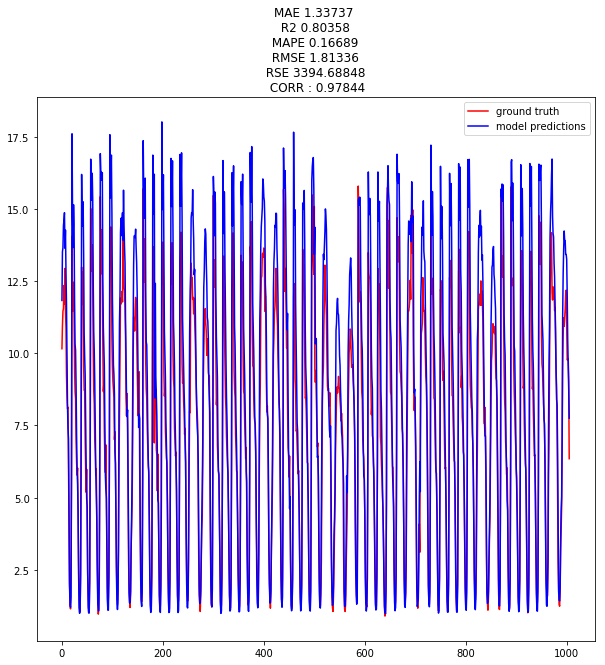

MAE 0.5187
R2 0.9719
RMSE 0.7058
[0.81013304] 0.49838352




Plot, with Optimizer.
(1006,) (1006,)


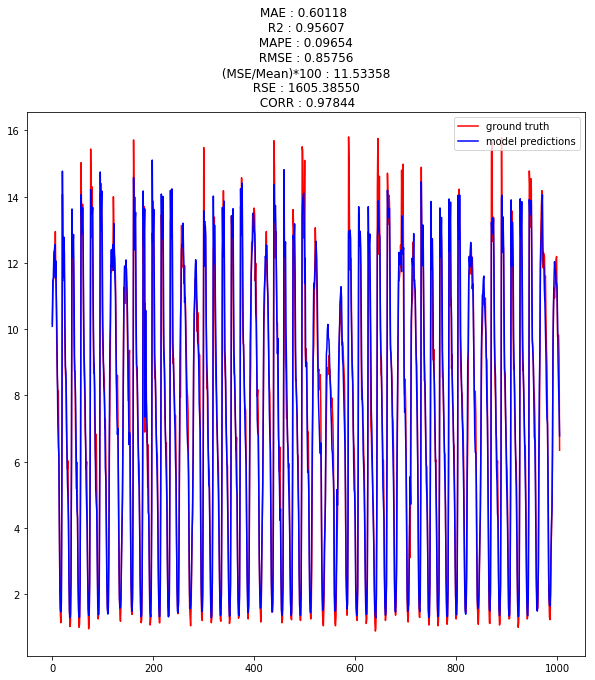

Done saving the results


[0.6011825, 0.9560705995988922, 0.8575583, 11.533584653611864]

In [3]:
results_collect(model_version="M3V1",dataset_name="Traffic",callback_min_delta=0.5,patience_value=20,epoch_cnt=500,optim = Adam(lr = 0.001), frac=0.7, timesteps=49)

Create formatted data : (df shape) (3400,)
Create time-stepped data : (d shape) (3351, 49, 1)
Create formatted data :  (3351, 24, 1) (3351, 24, 1) (3351,)
Dimensions of train and test :  (2345, 24, 1)   (1006, 24, 1)   (2345,)   (1006,)
Inside model_creation
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 24, 1)        0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 24, 1)        0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 48, 1)        0           input_1[0][0]                    
                                                

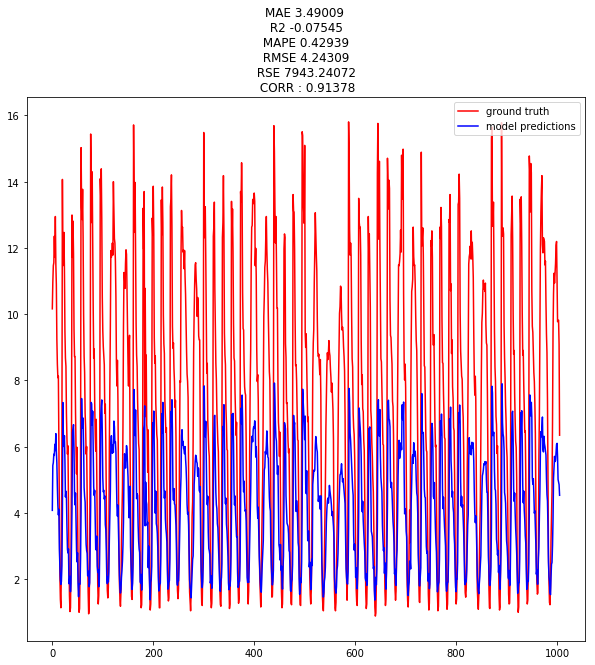

MAE 1.1327
R2 0.8246
RMSE 1.7625
[2.1583571] -1.4099259




Plot, with Optimizer.
(1006,) (1006,)


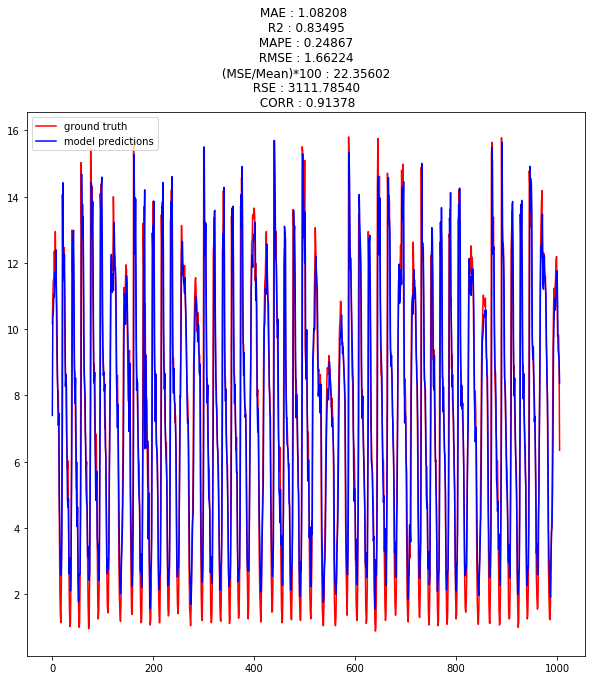

Done saving the results


[1.0820779, 0.8349498970374577, 1.6622407, 22.356024199343487]

In [3]:
results_collect(model_version="M3V2",dataset_name="Traffic",callback_min_delta=0.5,patience_value=20,epoch_cnt=500,optim = Adam(lr = 0.001), frac=0.7, timesteps=49)